# **Проект: Хакатон "Кинопоиск" (работа DA)**

## **0. Вводная часть: описание проекта (информационный раздел)**

**ЗАКАЗЧИК:**

***Телеграмм канал Кинопоиск (ТГК Кинопоиск, ТГК)*** - рассказывает о кино и сериалах со всего мира.

**ЦЕЛЬ ЗАКАЗЧИКА:**

ТГК Кинопоиск подписывает аудиторию, которая увлекается кино и сериалами.

**ОСНОВНАЯ ЗАДАЧА ПРОЕКТА:**

продумать "вирусную" механику привлечения подписчиков в телеграмм канал Кинопоиск.

**ОБЯЗАТЕЛЬНЫЕ ТРЕБОВАНИЯ ДЛЯ РАБОТЫ DA:**

- выявить, наиболее эффективные и точные метрики еженедельного/ежемесячного анализа работы ТГК;
- сформировать список KPI для дальнейшей работы и отслеживания заказчиком (совместно с маркетологами).

**ОСНОВНОЙ РЕЗУЛЬТАТ РАБОТЫ КОМАНДЫ:**

- качественный анализ ТГК, а также предложение нескольких вирусных механик, которые помогут привлечь аудиторию.
- необходимо дополнительно описать процесс внедрения/использования вирусной механики, возможные затраты по времени и бюджету на реализацию.

**АРТЕФАКТЫ ДЛЯ НАПРАВЛЕНИЯ РАБОТЫ DA:**

- вывести метрики эффективности поста:
    - тип публикации;
    - тема;
    - объем текста;
    - отсутствие / наличие эмодзи;
    - отсутствие / наличие изображений;
    - знаки препинания (сложность текста).
- провести семантический анализ комментариев к постам - понять, какие посты побуждают людей к действию.
- провести анализ эмодзи / реакций.
- посчитать метрики эффективности каждого поста:
    - охват публикаций;
    - вовлеченность аудитории.
- исследовать корреляции характеристик и метрик постов с привлечением новых пользователей в ТГК Кинопоиск.
- сформировать краткий отчет по результатам проведенного анализа для Маркетологов (в любом удобном формате).

 **Этапы и сроки выполнения работ- специалисты DA**

- стартовая встреча - 13 февраля
    - рассказ о задаче;
    - знакомство с участниками;
    - разбор вопросов.
- изучение данных - 14 февраля.
- встреча с маркетологами и продактами, определение списка базовых гипотез - 15 февраля.
- предобработка данных (распределяется между участниками) - 16 февраля.
- исследовательский анализ данных, добавление новых признаков (на основе старых) и формирование гипотез - 16-22 февраля:
    - частотный анализ слов постов;
    - частотный анализ комментариев;
    - анализ времени публикаций;
    - семантический анализ комментариев к постам;
    - анализ реакций на сообщения;
    - формирование Метрик оценки популярности поста;
    - анализ эмодзи к постам.
- консультация с экспертом - 23 февраля.
- встреча с маркетологами и продактами, обсуждение - 23 февраля.
- итоговое оформление выводов в презентации - 23-26 февраля
- отправка решения Команды на проверку -  26 февраля.

 **Чек-лист сдачи работ:**

1. Работа на проверку передаётся сразу в нескольких вариантах:
   - проект в виде ссылки на Google colab
     (у работы должен быть открыт доступ с возможностью комментирования);
   - проект в виде PDF-файла, экспортированного из Google colab (для просмотра);
   - набор графиков в SVG-формате
2. Работа должна иметь
   - последовательную структуру;
   - водную часть / описание проекта;
   - истый и понятный код с комментариями;
   - подходящие визуализации / графики.

**Оценки хакатона (Специалисты DA):**

- **КОД** - код написан корректно и эффективно (используются встроенные методы, функции, циклы), хорошо комментирован
- **ГРАФИКИ** - понятные, правильные и хорошо оформленные графики (верно выбран тип графика к данным, область отображения графика, оси и график корректно подписаны, есть понятная легенда, график легко читается и т.п)
- **ВЫВОДЫ** - ко всем графикам и этапам работы есть полные частные выводы, общие выводы корректны и интегрируют разные части работы (не просто повторение отдельных выводов), в процессе работы формулируются и затем проверяются.

## **1. Импорт библиотек (технический раздел)**

In [ ]:
# Установим библиотеку wordcloud pandas
!pip install wordcloud pandas

In [ ]:
# Загрузим стандартные библиотеки
import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt
from datetime import datetime, timedelta
import plotly.express as px
from plotly import graph_objects as go
import re
import string
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', '{:,.2f}'.format)
#pd.set_option('display.max_colwidth', None)

In [ ]:
# Загрузим библиотеки для анализа текстов
from wordcloud import WordCloud
import string
from nltk import word_tokenize
import nltk
nltk.download('punkt')
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords # если первый код выдает ошибку
from nltk.probability import FreqDist

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
# Установим библиотеку pymorphy2
!pip install pymorphy2
import pymorphy2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 58.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13706 sha256=6ca8123e7a97358677fe968a1f4cf357d05f7cdc3f4c28cea7403737c69333bc
  Stored in directory: /root/.cache/pip/wheels/fc/ab/d4/5da2067ac95b36618c629a5f93f809425700506f72c9732fac
Successfully built docopt


In [ ]:
# Установим библиотеку emoji
!pip install emoji

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 421.5/421.5 kB 6.5 MB/s eta 0:00:00


In [ ]:
# Импортируем библиотеку emoji для анализа эмодзи
import emoji

In [ ]:
# Импортируем библиотеку emoji для анализа эмодзи
import ast

Библиотека ast (Abstract Syntax Trees) в Python используется для преобразования строк, содержащих литералы Python (например, строки словарей, списков, кортежей и т. д.), в соответствующие объекты Python. Она обычно применяется для безопасного преобразования строковых представлений в Python-объекты.

В вашем случае вы использовали ast.literal_eval(), который принимает строку и пытается интерпретировать её как литерал Python, возвращая соответствующий объект. В примере с обработкой CSV файла, вы использовали ast.literal_eval() для преобразования строковых представлений словарей в фактические словари Python, чтобы было возможно работать с этими данными как с объектами Python.

## **2. Загрузка файлов и создание датафреймов (раздел предобратотки данных)**

### **2.00. Описание данных от заказчика**


**Данные представлены в виде 5 файлов:**

Дата в название каждого файла - дата сбора
информации.

- **kinopisk_subscribers_detailed_2024-01-18.csv** - информация о подписчиках канала и отписках

- **kinopoisk_subscribers_general_2024_18_01.csv** -
 общая информация о подписчиках канала в разбивке по дням
  
- **kinopoisk_channel_posts_2024-01-21.csv** - сведения о постах в телеграм канале Кинопоиска

- **kinopoisk_comments_2024_01_18.csv** - текстовые комментарии к постам

- **kinopoisk_subscribers_general_2024_18_01.csv**

- **kinopisk_reposts_and_mentions_2023_19_01.csv** - данные за 3 месяца о телеграм каналах и группах, которые репостили посты Кинопоиска, либо упоминали Кинопоиск в своих постах


**ВАЖНО:**
- Необходимо выбрать адекватный период для анализа данных.
- Количество комментариев к посту в файле kinopoisk_channel_posts_2024-01-21.csv может несколько отличатся от количества комментариев в файле
kinopoisk_comments_2024_01_18.csv из-за разного времени парсинга/особенностей подсчета комментов (в kinopoisk_comments_2024_01_18.csv отсутствуют комменты
без текста - гифки/эмоджи/смайлы ) Берем количество комментариев для расчета метрик из kinopoisk_channel_posts_2024-01-21.csv.

!!! Возможно, что в вашем исследование не понадобятся все предоставленные данные

### **2.0. Задачи раздела**

__________
**Задачи данного раздела проекта - первичная обработка данных:**
- загрузить исходные файлы с github и создать на их основе рабочие датафреймы;
- привести тип данных столбцов в соответствие с данными (если есть необходимость);
- переименовать столбцы (если есть необходимость);
- удалить лишние столбцы (если есть необходимость);
- создать новые столбцы (если есть необходимость);
- проверить наличие/отсутствие полных дубликатов;
- проверить наличие/отсутствие пропусков;
- принять решение по обработке пропусков;
- вывести кол-во и % пропусков в разрезе столбцов;
- изучить полученные датафреймы с помощью метода info();
- изучить полученные датафреймы с помощью метода describe();
- изучить столбцы с данными типа object с помощью методов unique() и nunique();
- сформулировать промежуточный вывод.
____________________

### **2.1. Предобработка данных: файл comments_kinopisk_2023_01_18.csv**

**kinopoisk_comments_2024_01_18.csv**

текстовые комментарии к постам
  - Post_id - идентификатор поста, к которому был написан комментарий, cоответствует ID в файле.

In [ ]:
# Создадим датафрейм comments на основе файла comments_kinopisk_2023_01_18.csv и изучим его
URL1 = 'https://github.com/VeraNovich/Yandex.Praktikum_WorkShop/raw/main/07_hackathon_kinopoisk/comments_kinopisk_2023_01_18.csv'
comments = pd.read_csv(URL1)
comments.head(2)

,Unnamed: 0.1,Unnamed: 0,post_id,date_comment,text_comment
0,0,0,37068,2024-01-18 09:34:31+00:00,От бесстыжих к медведю - так это скорее не пут...
1,1,1,37068,2024-01-18 09:35:00+00:00,учился орать FUCK!


In [ ]:
# Удалим лишние столбцы
comments = comments.drop(['Unnamed: 0.1', 'Unnamed: 0'], axis= 1)

In [ ]:
# Изменним тип данных в столбце с датой
comments['date_comment'] = pd.to_datetime(comments['date_comment'], format='%Y-%m-%d %H:%M:%S')

In [ ]:
# Удаленим временную зону + приведем к времени по Москве
comments['date_comment'] = comments['date_comment'].dt.tz_localize(None).apply(lambda x: x + timedelta(hours=2))
comments['date_comment'].head(2)

0   2024-01-18 11:34:31
1   2024-01-18 11:35:00
Name: date_comment, dtype: datetime64[ns]

In [ ]:
# Проверим датафрейм на наличие полных дубликатов
#len(comments[comments.duplicated()])
comments.duplicated().sum()

620

In [ ]:
# Выведем на экран количество пропусков в датафрейме
print('Количество пропусков в столбцах', comments.isna().sum().sort_values(ascending=False), sep='\n')
print()
print('% пропусков в столбцах', (comments.isna().mean()*100).sort_values(ascending=False), sep='\n')

Количество пропусков в столбцах
text_comment    7330
post_id            0
date_comment       0
dtype: int64

% пропусков в столбцах
text_comment   5.25
post_id        0.00
date_comment   0.00
dtype: float64


In [ ]:
# Изучим строки с пропусками
comments[comments['text_comment'].isna()].head()

,post_id,date_comment,text_comment
36,37066,2024-01-18 10:09:46,NaN
64,37066,2024-01-18 10:23:18,NaN
66,37066,2024-01-18 10:25:28,NaN
67,37066,2024-01-18 10:25:29,NaN
68,37066,2024-01-18 10:25:29,NaN


In [ ]:
# Посмотрим в ТГК что значат пропуски в комментах к посту
# post_id 37066 от 2024-01-18 фильм Мастер и Маргарита
comments[comments['post_id']==37066]

,post_id,date_comment,text_comment
30,37066,2024-01-18 10:08:02,"А сделали кота ужасно, не ужасно в смысле стра..."
31,37066,2024-01-18 10:08:19,Надеюсь будет не так всрато как с котом из Бре...
32,37066,2024-01-18 10:08:42,"Блин, я надеюсь будет хорошо снято."
33,37066,2024-01-18 10:09:10,"Если в Енг версии его озвучит не Рон Перлман, ..."
34,37066,2024-01-18 10:09:32,"Они вообще не видят то, что делают? Что бремен..."
35,37066,2024-01-18 10:09:42,Посмотрел трейлер... Это какой-то мусор и надр...
36,37066,2024-01-18 10:09:46,NaN
37,37066,2024-01-18 10:09:55,"Это полная фигня,если быть до конца откровенны..."
38,37066,2024-01-18 10:10:12,"кот-урод, а не бегемот"
39,37066,2024-01-18 10:10:13,Трейлер ладно. Но вот этот постер насторожил(


____________
!!! Комментарий с NaN - это картинка, фото, стикер
Заменим NaN на слово "картинка"...если эта замена будет мешать анализу вернемся на этот этап проекта.
____________

In [ ]:
# Заменим пропуски в столбце text_comment
comments['text_comment'] = comments['text_comment'].fillna('картинка')

In [ ]:
# Изучим датафрейм с помощью метода describe
comments.describe(include='all').fillna('-')

,post_id,date_comment,text_comment
count,"139,522.00",139522,139522
unique,-,137377,122216
top,-,2023-05-26 14:25:15,картинка
freq,-,10,7330
first,-,2022-09-22 15:31:20,-
last,-,2024-01-19 09:12:55,-
mean,"33,120.68",-,-
std,"2,217.80",-,-
min,"28,701.00",-,-
25%,"31,472.00",-,-


In [ ]:
# Кол-во уникальных постов == кол-во id
comments['post_id'].nunique()

3931

In [ ]:
# Изучим общую информацию по датафрейму
comments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 139522 entries, 0 to 139521
Data columns (total 3 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   post_id       139522 non-null  int64         
 1   date_comment  139522 non-null  datetime64[ns]
 2   text_comment  139522 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 3.2+ MB


----------------
----------------

**Промежуточны вывод:**

- на базе файла comments_kinopisk_2023_01_18.csv создан датасет comments;
- удалены столбецы 'Unnamed: 0.1' и 'Unnamed: 0';
- в столбце дата изменен тип данных на datetime;
- полные дубликаты не выявлены;
- пропуски есть в столбце text_comment - 7330 строк из 139522 (5.25%). Просмотр пропусков в ТГК кинопоиск показал, что пропусуи в данных - это картинки (стикеру) в ТГК. пропуски были заменены на слово "картинка";
- данные предоставлены за период с 2022-09-22 по 2024-01-19;
- в данных комментарии к 3931 постам;
- в итоговом датафрейме 3 столбца, 139522 строк.

-------------------
---------------------

### **2.2. Предобработка данных: файл kinopisk_reposts_and_mentions_2023_19_01.csv**

- **kinopisk_reposts_and_mentions_2023_19_01.csv**

 данные за 3 месяца о телеграм каналах и группах, которые репостили посты Кинопоиска, либо упоминали Кинопоиск в своих постах

     - **Channel** - канал или группа, который сделал репост/упоминание Кинопоиска
     - **Number Subscribers** - количество подписчиков у этого канала
     - **Action** - тип действия - репост или упоминание
     - **Date** - когда было произведено действие

In [ ]:
# Создадим датафрейм reposts на основе файла kinopisk_reposts_and_mentions_2023_19_01.csv и изучим его
URL2 = 'https://github.com/VeraNovich/Yandex.Praktikum_WorkShop/raw/main/07_hackathon_kinopoisk/kinopisk_reposts_and_mentions_2023_19_01.csv'
reposts = pd.read_csv(URL2)
reposts.head(2)

,Unnamed: 0,channel,number_subscribers,action,date
0,0,Обсуждаем фильмы. Поиском кино не занимаемся,1358,репостнул запись,"19 Jan, 10:02"
1,1,🎬 КиноДед,1409,репостнул запись,"18 Jan, 23:33"


In [ ]:
# Удалим лишние столбцы
reposts = reposts.drop('Unnamed: 0', axis= 1)

In [ ]:
# Изучим уникальные значения столбца столбца 'date'
reposts['date'].unique()

array(['19 Jan, 10:02', '18 Jan, 23:33', '18 Jan, 22:48', ...,
       '22 Oct 2023, 14:51', '22 Oct 2023, 13:41', '22 Oct 2023, 13:08'],
      dtype=object)

In [ ]:
# Изменнин тип данных в столбце с датой
reposts['date'] = reposts['date'].str.replace(' 2023', '').str.replace(',', ' 2023,')
reposts['date'] = pd.to_datetime(reposts['date'], format='%d %b %Y, %H:%M')
reposts['date'].head(2)

0   2023-01-19 10:02:00
1   2023-01-18 23:33:00
Name: date, dtype: datetime64[ns]

In [ ]:
# Проверим датафрейм на наличие полных дубликатов
#len(reposts[reposts.duplicated()])
reposts.duplicated().sum()

85

In [ ]:
# Посмотрим на полные дубликаты
reposts[reposts.duplicated()].head()

,channel,number_subscribers,action,date
7,"Море, солнце, sklifonelove_ ☀️🌊",332,упомянул канал,2023-01-18 18:25:00
104,Обсуждаем фильмы. Поиском кино не занимаемся,1362,репостнул запись,2023-01-15 11:17:00
128,Новости кино,50,упомянул канал,2023-01-13 12:29:00
423,Просто Чума,1880,репостнул запись,2023-01-01 00:07:00
424,kiraderen - это мандарин,2071,репостнул запись,2023-01-01 00:07:00


In [ ]:
# Изучим общую информацию по датафрейму
reposts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2306 entries, 0 to 2305
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   channel             2306 non-null   object        
 1   number_subscribers  2306 non-null   int64         
 2   action              2306 non-null   object        
 3   date                2306 non-null   datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 72.2+ KB


In [ ]:
# Изучим датафрейм с помощью метода describe
reposts.describe(include='all').fillna('-')

,channel,number_subscribers,action,date
count,2306,"2,306.00",2306,2306
unique,395,-,3,1592
top,Обсуждаем фильмы. Поиском кино не занимаемся,-,упомянул канал,2023-11-01 17:25:00
freq,694,-,1110,8
first,-,-,-,2023-01-01 00:03:00
last,-,-,-,2023-12-31 21:15:00
mean,-,"3,193.85",-,-
std,-,"12,623.23",-,-
min,-,50.00,-,-
25%,-,52.00,-,-


In [ ]:
#Таблица для столбцов с типом данных object - nunique(), reposts[j].unique()
df_object = pd.DataFrame(columns=['имя_столбца', 'количество_уникальных_значений', 'список_уникальных_значений'])
for j in [i for i in reposts.columns if reposts[i].dtypes=='object']:
  df_object.loc[len(df_object.index)] = [j, reposts[j].nunique(), reposts[j].unique()]
df_object

,имя_столбца,количество_уникальных_значений,список_уникальных_значений
0,channel,395,"[Обсуждаем фильмы. Поиском кино не занимаемся,..."
1,action,3,"[репостнул запись, упомянул канал, упомянул за..."


----------------
----------------

**Промежуточны вывод:**

- на базе файла kinopisk_reposts_and_mentions_2023_19_01.csv создан датасет reposts;
- удален столбец Unnamed: 0;
- в столбце дата изменен тип данных на datetime;
- выявлено 85 полных дубликата - оставила не удалеными, так как точность времени - минута, ТГК мог совершить за минуту 2 одинаковых действия;
- пропусков в датафрейме нет;
- данные предоставлены за период с 2023-01-01 по 2023-12-31;
- в данных 395 каналов, совершивших репост;
- в данных 3 типа активности:
       - репостнул запись,
       - упомянул канал,
       - упомянул запись;
- в итоговом датафрейме 4 столбца, 2306 строк.

-------------------
---------------------

### **2.3. Предобработка данных: файл kinopisk_subscribers_detailed_2024-01-18.csv**

- **kinopisk_subscribers_detailed_2024-01-18.csv** - информация о подписчиках канала и отписках
  - Date - дата
  - Time - время
  - Subscribers - количество подписавшихся
  - Unsubscribed - количество отписок

In [ ]:
# Создадим датафрейм subscribers на основе файла kinopisk_subscribers_detailed_2024-01-18.csv и изучим его
URL3 = 'https://github.com/VeraNovich/Yandex.Praktikum_WorkShop/raw/main/07_hackathon_kinopoisk/kinopisk_subscribers_detailed_2024-01-18.csv'
subscribers_detailed = pd.read_csv(URL3)
subscribers_detailed.head(2)


,Unnamed: 0,date,time,subscribers,unsubscribed
0,0,"Чт, 18 Jan",11:29,204,-300
1,1,"Чт, 18 Jan",11:00,373,-366


In [ ]:
# Удалим лишние столбцы
subscribers_detailed = subscribers_detailed.drop('Unnamed: 0', axis= 1)

In [ ]:
# Создадим столбец 'week_day' с днем недели на дабе столбца 'date'
# Очистим столбец 'date' от инф-ции о дне недели, добавим 2024 и 0 к дню м-ца < 10
# Изменним тип данных в столбце 'date'
# Удалим столбец 'time'
# Создадим столбец 'day' с датой без времени
subscribers_detailed['week_day'] = subscribers_detailed['date'].str[:2]
subscribers_detailed['date'] = subscribers_detailed['date'].str[4:]
subscribers_detailed['date'] = subscribers_detailed['date'].apply(lambda x: x + ' 2024' if len(x)<10 else x)
subscribers_detailed['date'] = subscribers_detailed['date'].apply(lambda x: '0' + x if len(x)==10 else x)
subscribers_detailed['date'] = subscribers_detailed['date'] + ' ' + subscribers_detailed['time']
subscribers_detailed['date'] = pd.to_datetime(subscribers_detailed['date'], format='%d %b %Y %H:%M')
subscribers_detailed['day'] = subscribers_detailed['date'].dt.date
subscribers_detailed = subscribers_detailed.drop('time', axis= 1)
subscribers_detailed.head(2)

,date,subscribers,unsubscribed,week_day,day
0,2024-01-18 11:29:00,204,-300,Чт,2024-01-18
1,2024-01-18 11:00:00,373,-366,Чт,2024-01-18


In [ ]:
# изменим тип данных в столбце 'day' на 'datetime64'
subscribers_detailed['day'] = subscribers_detailed['day'].astype('datetime64')

In [ ]:
# Проверим датафрейм на наличие полных дубликатов
len(subscribers_detailed[subscribers_detailed.duplicated()])

0

In [ ]:
# Изучим общую информацию по датафрейму
subscribers_detailed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12282 entries, 0 to 12281
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          12282 non-null  datetime64[ns]
 1   subscribers   12282 non-null  int64         
 2   unsubscribed  12282 non-null  int64         
 3   week_day      12282 non-null  object        
 4   day           12282 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(2), object(1)
memory usage: 479.9+ KB


In [ ]:
# Изучим датафрейм с помощью метода describe
subscribers_detailed.describe(include='all').fillna('-')

,date,subscribers,unsubscribed,week_day,day
count,12282,"12,282.00","12,282.00",12282,12282
unique,12282,-,-,7,520
top,2024-01-18 11:29:00,-,-,Ср,2023-05-03 00:00:00
freq,1,-,-,1774,24
first,2022-08-17 00:00:00,-,-,-,2022-08-17 00:00:00
last,2024-01-18 11:29:00,-,-,-,2024-01-18 00:00:00
mean,-,78.35,-49.86,-,-
std,-,153.43,88.64,-,-
min,-,0.00,-732.00,-,-
25%,-,0.00,-64.00,-,-


----------------
----------------

**Промежуточны вывод:**

- на базе файла kinopisk_subscribers_detailed_2024-01-18.csv создан датасет subscribers_detailed;
- удален столбец 'Unnamed: 0';
- добавлен столбец "week_day";
- добавлен столбец "day";
- в столбце "date" изменен тип данных на datetime;
- полные дубликаты не выявлены;
- пропусков в датафрейме нет;
- данные предоставлены за период с 2022-08-17 по 2024-01-18;
- в итоговом датафрейме 5 столбцов, 12282 строк.

-------------------
---------------------

### **2.4. Предобработка данных: файл kinopoisk_channel_posts_2023-01-21.csv**

- **kinopoisk_channel_posts_2023-01-21.csv** - сведения о постах в телеграм канале Кинопоиска
  - ***Channel*** - неинформативная колонка - названи канала
  - ***Id*** - идентификатор поста Соответствует post_id в файле с комментариями к постам
  - ***Date*** - дата и время публикации поста в формате CTE (+2 часа для получения московского времени)
  - ***Text*** - текст поста
  - ***Views*** - количество просмотров поста
  - ***Reactions*** - словарь с реакциями (эмоджи/смайлы) на пост Дает информацию о типе смайла и его количестве
  - ***With media*** - дает представление о прикрепленном к посту документе Как правило
  - ***MessageMediaPhoto*** - фото MessageMediaDocument - видео
  - ***MessageMediaWebPage*** - ссылка
  - ***Forwarded*** - сколько раз пересылался пост
  - ***Replies*** - словарь с количеством комментариев к посту
  - ***Reactions_count*** - количество реакций/эмоджи на пост Столбец получен из столбца reactions путем суммирование количества всех реакций
  - ***Comments*** - количество комментариев к посту Столбец получен на основе Replies
  - ***Type attachement*** - вид прикрепленного к посту документа Получен из словаря в With media

_____________
Аналитиками нашей группы было принято решение анализировать период 2022 - 2023 гг.

Поэтому исходный файл был ограничен периодом 2022-2023 гг. и разбит на 2 файла(Gitgub позволяет загружать только 25 Mb):
- kinopoisk_channel_posts_2022.csv
- kinopoisk_channel_posts_2023.csv
___________________

In [ ]:
# Преобразование файла kinopoisk_channel_posts_2023-01-21.csv
# Создание файлов kinopoisk_channel_posts_2022.csv и kinopoisk_channel_posts_2023.csv
try:
    posts = pd.read_csv(
                        'kinopoisk_channel_posts_2023-01-21.csv',
                         encoding='utf-8',
                         on_bad_lines="skip",
                         engine='python',
                         )
    # Удалим лишние столбцы
    posts = posts.drop(['Unnamed: 0', 'channel'], axis= 1)
    posts['date'] = pd.to_datetime(posts['date'], format='%Y-%m-%d %H:%M:%S')
    posts['date'] = posts['date'].dt.tz_localize(None).apply(lambda x: x + timedelta(hours=2))
    print(posts.loc[(posts['date']>='2022-01-01 00:00:00')&(posts['date']<'2024-01-01 00:00:00')].info())
    posts1 = posts.loc[(posts['date']>='2022-01-01 00:00:00')&(posts['date']<'2023-01-01 00:00:00')]
    posts2 = posts.loc[(posts['date']>='2023-01-01 00:00:00')&(posts['date']<'2024-01-01 00:00:00')]
    posts1.to_csv('kinopoisk_channel_posts_2022.csv', index=False)
    posts2.to_csv('kinopoisk_channel_posts_2023.csv', index=False)
except:
    print('Done')


Done


In [ ]:
# Создадим датафрейм posts на основе файлов kinopoisk_channel_posts_2022.csv и kinopoisk_channel_posts_2023.csv и изучим его
URL4_1 = 'https://github.com/VeraNovich/Yandex.Praktikum_WorkShop/raw/main/07_hackathon_kinopoisk/kinopoisk_channel_posts_2022.csv'
URL4_2 = 'https://github.com/VeraNovich/Yandex.Praktikum_WorkShop/raw/main/07_hackathon_kinopoisk/kinopoisk_channel_posts_2023.csv'
posts = pd.concat([pd.read_csv(URL4_1), pd.read_csv(URL4_2)], ignore_index=True)
posts.head(1)

,id,date,text,views,reactions,with_media,forwarded,replies,reactions_count,comments,type_attachment
0,31134,2022-12-31 19:00:42,"Заканчивается 2022 год, и мы хотим сказать вам...","52,315.00","{'_': 'MessageReactions', 'results': [{'_': 'R...","{'_': 'MessageMediaPhoto', 'spoiler': False, '...",30.00,"{'_': 'MessageReplies', 'replies': 32, 'replie...",1275,32,MessageMediaPhoto


In [ ]:
# Изучим общую информацию по датафрейму
posts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7133 entries, 0 to 7132
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               7133 non-null   int64  
 1   date             7133 non-null   object 
 2   text             7133 non-null   object 
 3   views            7133 non-null   float64
 4   reactions        7118 non-null   object 
 5   with_media       7078 non-null   object 
 6   forwarded        7133 non-null   float64
 7   replies          6032 non-null   object 
 8   reactions_count  7133 non-null   int64  
 9   comments         7133 non-null   int64  
 10  type_attachment  7078 non-null   object 
dtypes: float64(2), int64(3), object(6)
memory usage: 613.1+ KB


In [ ]:
# Изменним тип данных в столбце 'date'
posts['date'] = pd.to_datetime(posts['date'])

In [ ]:
# Изменним тип данных в столбцах 'views' и 'forwarded' с float64 на int
posts = posts.astype({'views': 'int', 'forwarded': 'int'})

In [ ]:
# Проверим датафрейм на наличие полных дубликатов
#len(posts[posts.duplicated()])
posts.duplicated().sum()

0

In [ ]:
# Изучим датафрейм с помощью метода describe
posts.describe(include='all').fillna('-').T

,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
id,"7,133.00",-,-,-,-,-,"29,261.21","4,070.78","22,653.00","25,587.00","29,243.00","32,523.00","36,843.00"
date,7133,7122,2022-11-25 10:01:00,2,2022-01-01 06:29:39,2023-12-31 21:04:56,-,-,-,-,-,-,-
text,7133,7055,Слушайте этот #подкаст прямо в Telegram.,37,-,-,-,-,-,-,-,-,-
views,"7,133.00",-,-,-,-,-,"45,855.63","16,733.80","18,998.00","34,422.00","42,043.00","54,165.00","279,115.00"
reactions,7118,7118,"{'_': 'MessageReactions', 'results': [{'_': 'R...",1,-,-,-,-,-,-,-,-,-
with_media,7078,7068,"{'_': 'MessageMediaWebPage', 'webpage': {'_': ...",2,-,-,-,-,-,-,-,-,-
forwarded,"7,133.00",-,-,-,-,-,154.21,174.27,0.00,56.00,105.00,188.00,"3,212.00"
replies,6032,5944,"{'_': 'MessageReplies', 'replies': 0, 'replies...",80,-,-,-,-,-,-,-,-,-
reactions_count,"7,133.00",-,-,-,-,-,356.96,396.38,0.00,160.00,256.00,417.00,"8,012.00"
comments,"7,133.00",-,-,-,-,-,23.94,47.41,0.00,4.00,13.00,27.00,"1,010.00"


In [ ]:
# Выведем на экран количество пропусков в датафрейме
print('Количество пропусков в столбцах', posts.isna().sum().sort_values(ascending=False), sep='\n')
print()
print('% пропусков в столбцах', (posts.isna().mean()*100).sort_values(ascending=False), sep='\n')

Количество пропусков в столбцах
replies            1101
with_media           55
type_attachment      55
reactions            15
id                    0
date                  0
text                  0
views                 0
forwarded             0
reactions_count       0
comments              0
dtype: int64

% пропусков в столбцах
replies           15.44
with_media         0.77
type_attachment    0.77
reactions          0.21
id                 0.00
date               0.00
text               0.00
views              0.00
forwarded          0.00
reactions_count    0.00
comments           0.00
dtype: float64


In [ ]:
# Посмотри на пропуски в столбцах reactions	 и replies
posts[posts['reactions'].isna()].sort_values(by='date', ascending=False).head(3)

,id,date,text,views,reactions,with_media,forwarded,replies,reactions_count,comments,type_attachment
5622,34232,2023-08-04 09:58:33,Ну вот и прошла наша игра совместно с [Кинопои...,49695,NaN,"{'_': 'MessageMediaPhoto', 'spoiler': False, '...",40,NaN,0,0,MessageMediaPhoto
5778,33884,2023-07-11 19:24:45,А вот и они — персонажные постеры второго сезо...,64949,NaN,"{'_': 'MessageMediaPhoto', 'spoiler': False, '...",91,NaN,0,0,MessageMediaPhoto
6104,33066,2023-05-18 08:09:06,"Каннский фестиваль? А может, лучше Ганский фес...",78910,NaN,"{'_': 'MessageMediaPhoto', 'spoiler': False, '...",946,NaN,0,0,MessageMediaPhoto


In [ ]:
# Посмотри на пропуски в столбцах with_media	 и type_attachment
posts[posts['with_media'].isna()].sort_values(by='date', ascending=False).head(3)

,id,date,text,views,reactions,with_media,forwarded,replies,reactions_count,comments,type_attachment
4572,36843,2023-12-31 21:04:56,С годом даркона!,74390,"{'_': 'MessageReactions', 'results': [{'_': 'R...",NaN,47,"{'_': 'MessageReplies', 'replies': 29, 'replie...",738,29,NaN
4577,36829,2023-12-31 07:57:31,"Новый год — время, когда принято делиться друг...",78490,"{'_': 'MessageReactions', 'results': [{'_': 'R...",NaN,10,"{'_': 'MessageReplies', 'replies': 7, 'replies...",313,7,NaN
4645,36660,2023-12-20 21:15:25,На связи Максим Матвеев 🔥🔥🔥\n\n[**«Триггер. Фи...,99734,"{'_': 'MessageReactions', 'results': [{'_': 'R...",NaN,774,"{'_': 'MessageReplies', 'replies': 66, 'replie...",1005,66,NaN


In [ ]:
# Создадим столбец с годом
posts['year'] = posts['date'].dt.year
posts.head()

,id,date,text,views,reactions,with_media,forwarded,replies,reactions_count,comments,type_attachment,year
0,31134,2022-12-31 19:00:42,"Заканчивается 2022 год, и мы хотим сказать вам...",52315,"{'_': 'MessageReactions', 'results': [{'_': 'R...","{'_': 'MessageMediaPhoto', 'spoiler': False, '...",30,"{'_': 'MessageReplies', 'replies': 32, 'replie...",1275,32,MessageMediaPhoto,2022
1,31133,2022-12-31 17:00:00,"«И я буду всегда, всегда, всегда выбирать тебя...",49114,"{'_': 'MessageReactions', 'results': [{'_': 'R...","{'_': 'MessageMediaDocument', 'nopremium': Fal...",48,"{'_': 'MessageReplies', 'replies': 14, 'replie...",539,14,MessageMediaDocument,2022
2,31132,2022-12-31 15:00:42,"Цени то, что у тебя есть, говорили воспитатели...",50254,"{'_': 'MessageReactions', 'results': [{'_': 'R...","{'_': 'MessageMediaWebPage', 'webpage': {'_': ...",63,"{'_': 'MessageReplies', 'replies': 3, 'replies...",142,3,MessageMediaWebPage,2022
3,31130,2022-12-31 13:35:10,"Январь уже завтра, а значит, пора делиться гря...",47912,"{'_': 'MessageReactions', 'results': [{'_': 'R...","{'_': 'MessageMediaWebPage', 'webpage': {'_': ...",23,"{'_': 'MessageReplies', 'replies': 7, 'replies...",146,7,MessageMediaWebPage,2022
4,31118,2022-12-31 09:01:51,Рассказываем про главные новинки Кинопоиска в ...,45542,"{'_': 'MessageReactions', 'results': [{'_': 'R...","{'_': 'MessageMediaPhoto', 'spoiler': False, '...",113,"{'_': 'MessageReplies', 'replies': 22, 'replie...",281,22,MessageMediaPhoto,2022


----------------
----------------

**Промежуточны вывод:**

- на базе файла kinopoisk_channel_posts_2023-01-21.csv создан датасет posts;
- удален столбец 'Unnamed: 0';
- в столбце дата изменен тип данных на datetime, время приведено к МСК;
- в столбцах views и  forwarded изменен тип данных с float на int;
- полные дубликаты не выявлены;
- пропуски есть в 4-х столбцах:
    - replies - 1101 строк (15.44%);
    - with_media - 55 строк (0.77%);
    - type_attachment - 55 строк (0.77%);
    - reactions - 15 строк (0.21%)

в столбце type_attachment/with_media NaN - это простые текстовые посты, заменю NaN на "only_text".

В остальных столбцах на данном этапе оставлю значение NaN - анализ ТГК показал, что у постов могут отсутствивать комментарии и реакции, но возможна и ситуация когда данные в ТГК есть, а в данных NaN;
- данные для анализа (глубина анализа), согласно принятому DA решению, будем брать за период с 2022-01-01 по 2023-12-31;
- создан столбец 'year' - год публикации поста;
- в итоговом датафрейме 11 столбцов, 7133 строк.

-------------------
---------------------

In [ ]:
# Заменим NaN в столбце type_attachment на "short_text"
posts['type_attachment'] = posts['type_attachment'].fillna('only_text')

In [ ]:
# Заменим NaN в столбце type_attachment на "short_text"
posts['with_media'] = posts['with_media'].fillna('only_text')

In [ ]:
# Изучим общую информацию по датафрейму
posts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7133 entries, 0 to 7132
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   id               7133 non-null   int64         
 1   date             7133 non-null   datetime64[ns]
 2   text             7133 non-null   object        
 3   views            7133 non-null   int64         
 4   reactions        7118 non-null   object        
 5   with_media       7133 non-null   object        
 6   forwarded        7133 non-null   int64         
 7   replies          6032 non-null   object        
 8   reactions_count  7133 non-null   int64         
 9   comments         7133 non-null   int64         
 10  type_attachment  7133 non-null   object        
 11  year             7133 non-null   int64         
dtypes: datetime64[ns](1), int64(6), object(5)
memory usage: 668.8+ KB


### **2.5. Предобработка данных: файл kinopoisk_subscribers_general_2024_18_01.csv**

- **kinopoisk_subscribers_general_2024_18_01.csv** -
 общая информация о подписчиках канала в разбивке по дням
  - Date - дата
  - Subscribers - суммарное количество подписок на эту дату
  - Changes - разница в количестве подписчиков между текущей и предыдущей датами

In [ ]:
# Создадим датафрейм subscribers_general на основе файла kinopoisk_subscribers_general_2024_18_01.csv и изучим его
URL5 = 'https://github.com/VeraNovich/Yandex.Praktikum_WorkShop/raw/main/07_hackathon_kinopoisk/kinopoisk_subscribers_general_2024_18_01.csv'
subscribers_general = pd.read_csv(URL5)
subscribers_general.head(2)

,Unnamed: 0,date,subscribers,changes
0,0,18.01.24,551378,415
1,1,17.01.24,550963,2061


In [ ]:
# Удалим лишние столбцы
subscribers_general = subscribers_general.drop('Unnamed: 0', axis= 1)

In [ ]:
# Изменнин тип данных в столбце с датой
subscribers_general['date'] = pd.to_datetime(subscribers_general['date'], format='%d.%m.%y')
subscribers_general['date'].head(2)

0   2024-01-18
1   2024-01-17
Name: date, dtype: datetime64[ns]

In [ ]:
# Проверим датафрейм на наличие полных дубликатов
len(subscribers_general[subscribers_general.duplicated()])

0

In [ ]:
# Изучим датафрейм с помощью метода describe
subscribers_general.describe(include='all').fillna('-')

,date,subscribers,changes
count,520,520.00,520.00
unique,520,-,-
top,2024-01-18 00:00:00,-,-
freq,1,-,-
first,2022-08-17 00:00:00,-,-
last,2024-01-18 00:00:00,-,-
mean,-,"276,901.18",664.68
std,-,"75,426.69","1,495.37"
min,-,"205,805.00","-1,254.00"
25%,-,"224,990.75",7.25


In [ ]:
# Изучим общую информацию по датафрейму
subscribers_general.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 520 entries, 0 to 519
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         520 non-null    datetime64[ns]
 1   subscribers  520 non-null    int64         
 2   changes      520 non-null    int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 12.3 KB


----------------
----------------

**Промежуточны вывод:**

- на базе файла kinopoisk_subscribers_general_2024_18_01.csv создан датасет subscribers_general;
- удален столбец 'Unnamed: 0';
- в столбце дата изменен тип данных на datetime;
- полные дубликаты не выявлены;
- пропусков в датафрейме нет;
- данные предоставлены за период с 2022-08-17 по 2024-01-18;
- в итоговом датафрейме 3 столбца, 520 строк.

-------------------
---------------------

## **3. Исследовательский анализ данных (EDA - основной раздел)**

### **3.1. Описательная статистика постов ТГК КиноПоиск - датафрейм posts (вспомогательный раздел)**

In [ ]:
# Объявим функцию для изучения описательной статистики столбца с количественными данными
def info_column_number_continuous(col):
    print(f'Общая информация по столбцу "{col.name}":', end='\n\n\n')
    print(col.describe(), end='\n\n\n')
    plt.figure(figsize=(14, 3))
    sns.stripplot(x = col, jitter=True, zorder=1, color='darkblue', size=2, alpha=0.2)
    sns.boxplot(x = col, palette='GnBu')
    sns.boxplot(
                x = col,
                notch=True,
                patch_artist=True,
                boxprops=dict(facecolor='lightblue'),
                flierprops=dict(marker='o',
                               markersize=5,
                               markerfacecolor='red'),
                whiskerprops=dict(color='black'),
                medianprops=dict(color='red'),
                palette='GnBu'
                )
    plt.xlabel(f'{col.name}')
    plt.title(f'Распределение постов по количеству {col.name}', size=20, color='darkblue')
    plt.rcParams['axes.grid'] = False
    plt.show()
    plt.figure(figsize=(13, 3))
    sns.histplot(x = col, bins=100, kde=True)
    plt.xlabel(f'{col.name}')
    plt.ylabel('count')
    plt.show()

Общая информация по столбцу "views":


count     7,133.00
mean     45,855.63
std      16,733.80
min      18,998.00
25%      34,422.00
50%      42,043.00
75%      54,165.00
max     279,115.00
Name: views, dtype: float64




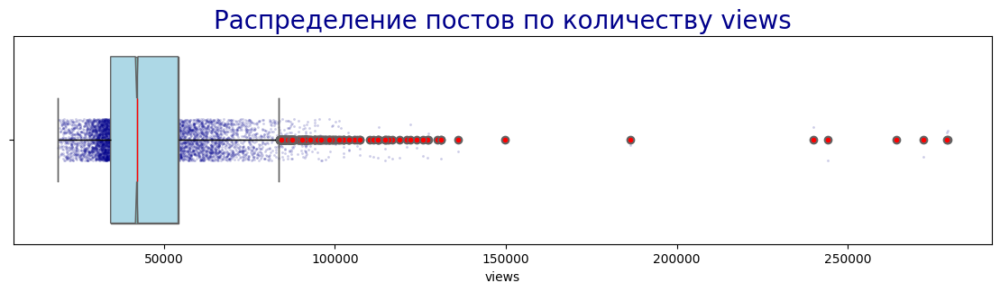

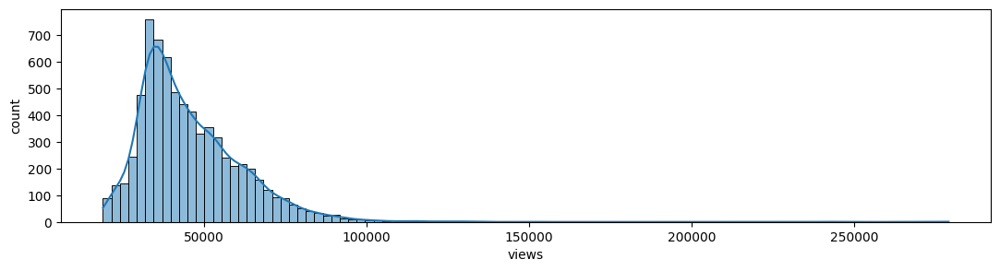

Общая информация по столбцу "forwarded":


count   7,133.00
mean      154.21
std       174.27
min         0.00
25%        56.00
50%       105.00
75%       188.00
max     3,212.00
Name: forwarded, dtype: float64




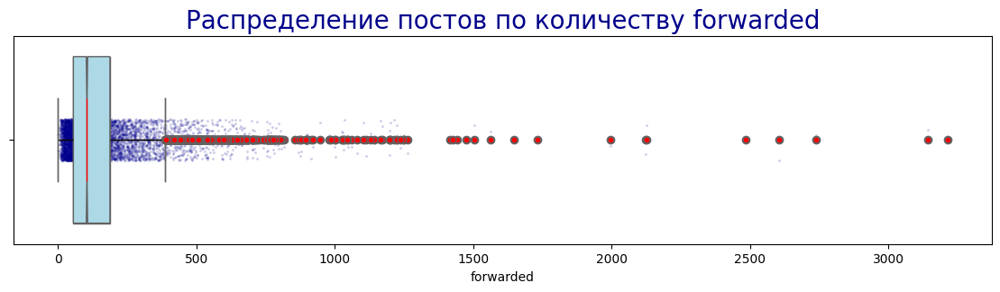

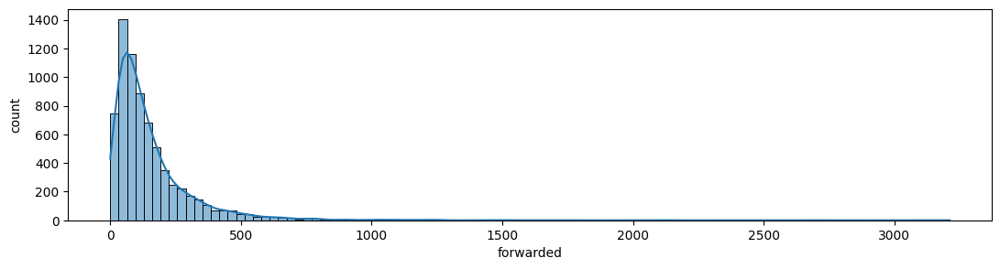

Общая информация по столбцу "reactions_count":


count   7,133.00
mean      356.96
std       396.38
min         0.00
25%       160.00
50%       256.00
75%       417.00
max     8,012.00
Name: reactions_count, dtype: float64




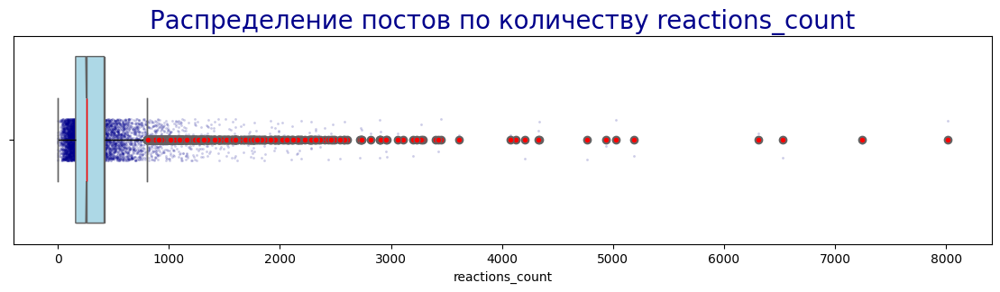

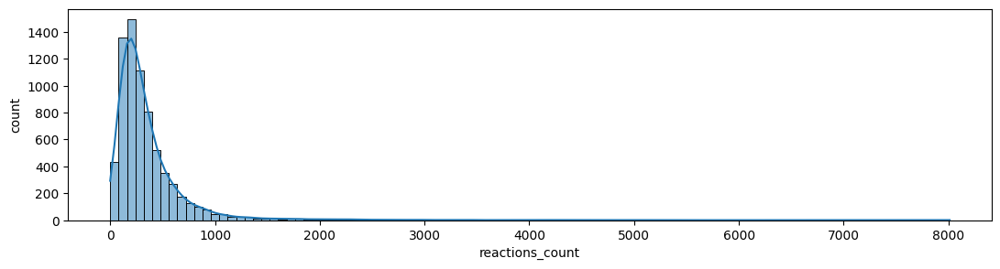

Общая информация по столбцу "comments":


count   7,133.00
mean       23.94
std        47.41
min         0.00
25%         4.00
50%        13.00
75%        27.00
max     1,010.00
Name: comments, dtype: float64




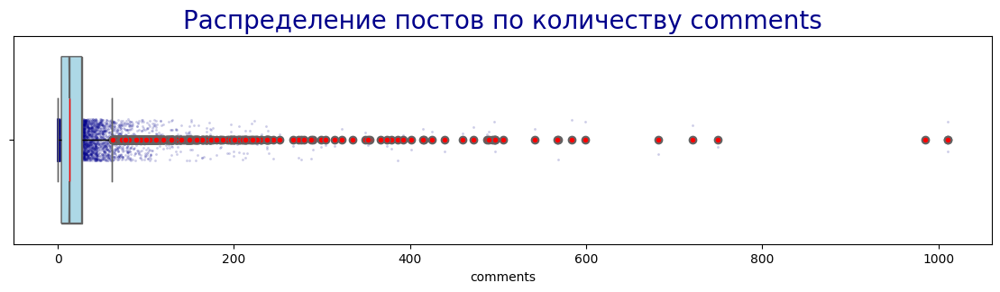

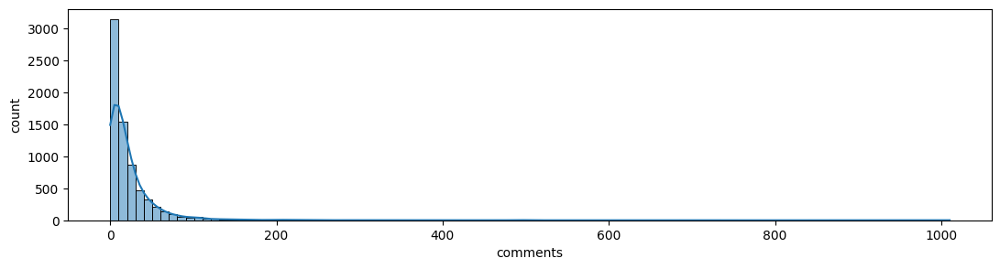

In [ ]:
for i in list(posts.columns):
    if posts[i].dtypes=='int' and i not in ('id', 'year'):
        info_column_number_continuous(posts[i])

____________
____________
**Промежуточный вывод:**

**Столбец "views" - просмотры:**
- среднее кол-во просмотров одного поста - 45,855;
- медианное кол-во просмотров 42,043;
- гистограмма смещена вправо;
- минимальное кол-во просмотров 18,998;
- есть выбросы - от 85,000 до 280,000 просмотров.

**Столбец "forwarded" - пересылки:**
- среднее кол-во пересылок одного поста - 154;
- медианное кол-во пересылок 105;
- гистограмма смещена вправо;
- минимальное кол-во пересылок поста 0;
- есть выбросы - от 400 до 3,200 пересылок.

**Столбец "reactions_count" - просмотры:**
- среднее кол-во реакций на один пост - 356;
- медианное кол-во реакций 256;
- гистограмма смещена вправо;
- минимальное кол-во реакций 0;
- есть выбросы - от 800 до 8,000 реакций.

**Столбец "comments" - просмотры:**
- среднее кол-во реакций на один пост - 23;
- медианное кол-во реакций 13;
- гистограмма смещена вправо;
- минимальное кол-во реакций 0;
- есть выбросы - от 50 до 1,010 реакций.

____________
___________

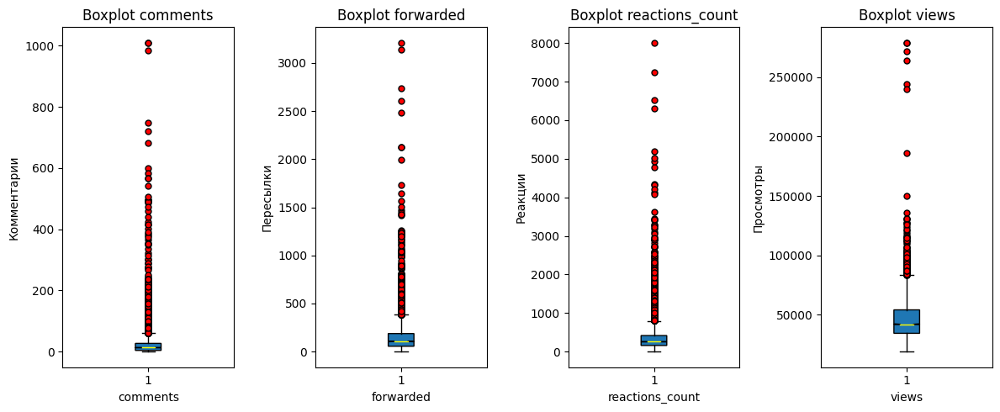

In [ ]:
# Веведем боксплоты с описательной статистикой по столбцам датафрейма posts (в один ряд для большей наглядности)
# Задаем параметры графикам
def boxplot_charts(df, column, ax, ylabel):
    ax.boxplot(df[column], notch=True,
               patch_artist=True,
               #boxprops=dict(facecolor='lightblue'),
               flierprops=dict(marker='o',
                               markersize=5,
                               markerfacecolor='red'),
               whiskerprops=dict(color='black'),
               medianprops=dict(color='yellow'))
    ax.set_xlabel(f'{column}')
    ax.set_ylabel(ylabel)
    ax.set_title(f'Boxplot {column}')

# Создаем общую фигуру и три подграфика (1 строка, 4 столбца)
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(12, 5), sharey=False)  # Устанавливаем sharey=False

# Добавляем параметр x_label для указания разной размерности оси x
boxplot_charts(posts, 'comments', axes[0], 'Комментарии')
boxplot_charts(posts, 'forwarded', axes[1], 'Пересылки')
boxplot_charts(posts, 'reactions_count', axes[2], 'Реакции')
boxplot_charts(posts, 'views', axes[3], 'Просмотры')

# Регулируем расположение подграфиков, чтобы они были близко друг к другу
plt.tight_layout()

# Отображение графиков
plt.show()

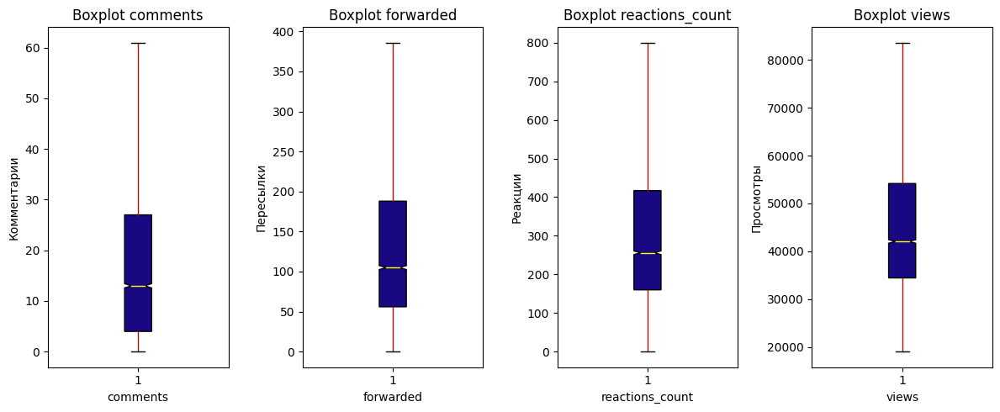

In [ ]:
# Веведем боксплоты без выбросов (для большей наглядности)

def boxplot_charts(df, column, ax, ylabel):
    ax.boxplot(df[column], notch=True,
               showfliers=False,
               patch_artist=True,
               boxprops=dict(facecolor='#180983'),
               flierprops=dict(marker='o',
                               markersize=5,
                               markerfacecolor='red'),
               whiskerprops=dict(color='#B01100'),
               medianprops=dict(color='yellow'))
    ax.set_xlabel(f'{column}')
    ax.set_ylabel(ylabel)
    ax.set_title(f'Boxplot {column}')
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(12, 5), sharey=False)  # Устанавливаем sharey=False

boxplot_charts(posts, 'comments', axes[0], 'Комментарии')
boxplot_charts(posts, 'forwarded', axes[1], 'Пересылки')
boxplot_charts(posts, 'reactions_count', axes[2], 'Реакции')
boxplot_charts(posts, 'views', axes[3], 'Просмотры')

plt.tight_layout()

### **3.2. Анализ технических метрик поста (основной раздел)**

#### **3.2.1. Тип публикации**

In [ ]:
# Изучим уникальные названия типов публикации
posts['type_attachment'].unique()

array(['MessageMediaPhoto', 'MessageMediaDocument', 'MessageMediaWebPage',
       'only_text'], dtype=object)

In [ ]:
# Создадим сводную таблицу кол-во публикаций в разрезе типов
df_type_attachment = posts.pivot_table(index='type_attachment', columns = 'year', values='id', aggfunc='count').reset_index()
df_type_attachment.columns = ['type_attachment', 'count_2022', 'count_2023']
df_type_attachment = df_type_attachment.sort_values(by='count_2023', ascending=False)
print('Сводная таблица: кол-во публикаций в разрезе типов')
print()
(
    df_type_attachment
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

Сводная таблица: кол-во публикаций в разрезе типов



,type_attachment,count_2022,count_2023
2,MessageMediaWebPage,1777,1227
1,MessageMediaPhoto,2448,1076
0,MessageMediaDocument,315,235
3,only_text,32,23


In [ ]:
# Альтернативный вывод таблицы для дальнейшей визуализации в презентации
print(df_type_attachment.to_markdown(tablefmt="grid"))

+----+----------------------+--------------+--------------+
|    | type_attachment      |   count_2022 |   count_2023 |
+====+======================+==============+==============+
|  2 | MessageMediaWebPage  |         1777 |         1227 |
+----+----------------------+--------------+--------------+
|  1 | MessageMediaPhoto    |         2448 |         1076 |
+----+----------------------+--------------+--------------+
|  0 | MessageMediaDocument |          315 |          235 |
+----+----------------------+--------------+--------------+
|  3 | only_text            |           32 |           23 |
+----+----------------------+--------------+--------------+


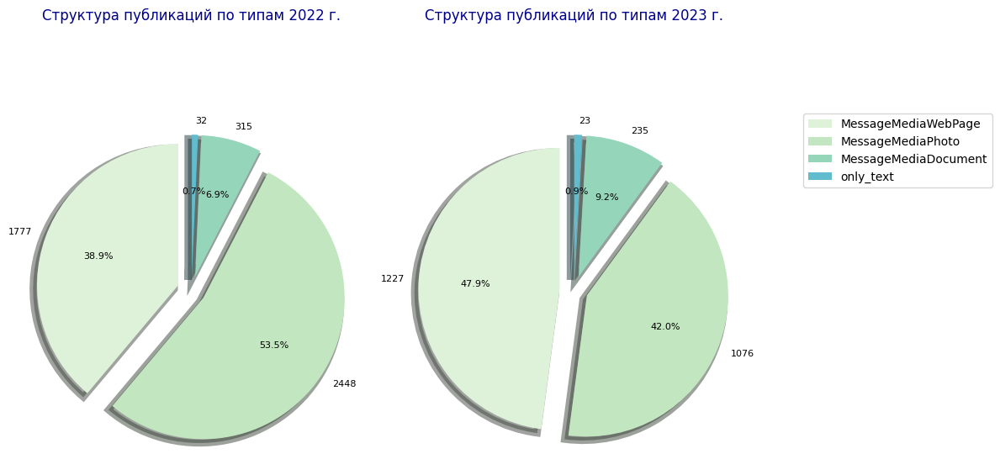

In [ ]:
# Построим по годам круговые диаграммы - кол-во публикаций в разрезе типов
def pie_plot_charts(df, col, ax):
    explode = [0.1]*df[col].nunique()
    colors = sns.color_palette('GnBu')
    ax.pie(df[col],
            labels = df[col].unique(),
            colors = colors,
            autopct = '%0.1f%%',
            explode = explode,
            shadow = 'True',
            startangle = 90,
            textprops = {'color': 'black','fontsize':8},
            wedgeprops = {'linewidth': 6},
            #frame = 'true',
            center = (0.1,0.1),
            rotatelabels = False)
    ax.set_title(f'Структура публикаций по типам {col[-4:]} г.', loc='center', size=12, color='darkblue', pad=80)
    plt.legend(df['type_attachment'].unique(), bbox_to_anchor=( 1.15 , 1 ), loc='upper left', borderaxespad= 0)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 10), sharey=False)  # Устанавливаем sharey=False

pie_plot_charts(df_type_attachment, 'count_2022', axes[0])
pie_plot_charts(df_type_attachment, 'count_2023', axes[1])

plt.tight_layout()
plt.show()

In [ ]:
# Создадим сводную таблицу на базе posts тип публикации - общее кол-во активности пользователей
df_type_attachment_actions = posts.pivot_table(index=['type_attachment', 'year'], values=['id', 'views', 'reactions_count', 'comments', 'forwarded'], aggfunc={'id':'count', 'views':'sum', 'reactions_count':'sum', 'comments':'sum', 'forwarded':'sum'}).reset_index()
df_type_attachment_actions['year'] = pd.to_datetime(df_type_attachment_actions['year'], format='%Y').dt.date
df_type_attachment_actions = df_type_attachment_actions[['type_attachment', 'year', 'id', 'comments', 'forwarded', 'reactions_count', 'views']]
print('Общее кол-во активностей подписчиков в разрезе типа поста 2022-2023 гг.')
print()
(
df_type_attachment_actions
            .style
            .format(decimal=",", thousands=" ", precision=2)
            .background_gradient(cmap='GnBu', axis=0)
)

Общее кол-во активностей подписчиков в разрезе типа поста 2022-2023 гг.



,type_attachment,year,id,comments,forwarded,reactions_count,views
0,MessageMediaDocument,2022-01-01,315,3 640,52 952,88 408,11 601 718
1,MessageMediaDocument,2023-01-01,235,7 792,77 493,152 819,14 891 349
2,MessageMediaPhoto,2022-01-01,2 448,38 340,332 956,792 054,92 260 089
3,MessageMediaPhoto,2023-01-01,1 076,63 265,240 176,795 924,65 140 750
4,MessageMediaWebPage,2022-01-01,1 777,20 664,191 808,300 185,65 529 586
5,MessageMediaWebPage,2023-01-01,1 227,35 024,198 414,391 781,74 657 925
6,only_text,2022-01-01,32,449,4 615,9 431,1 596 175
7,only_text,2023-01-01,23,1 601,1 537,15 596,1 410 648


In [ ]:
# Альтернативный вывод таблицы для дальнейшей визуализации в презентации
print('Общее кол-во активностей подписчиков в разрезе типа поста 2022-2023 гг.')
print()
print(df_type_attachment_actions.to_markdown(tablefmt="grid"))

Общее кол-во активностей подписчиков в разрезе типа поста 2022-2023 гг.

+----+----------------------+------------+------+------------+-------------+-------------------+----------+
|    | type_attachment      | year       |   id |   comments |   forwarded |   reactions_count |    views |
+====+======================+============+======+============+=============+===================+==========+
|  0 | MessageMediaDocument | 2022-01-01 |  315 |       3640 |       52952 |             88408 | 11601718 |
+----+----------------------+------------+------+------------+-------------+-------------------+----------+
|  1 | MessageMediaDocument | 2023-01-01 |  235 |       7792 |       77493 |            152819 | 14891349 |
+----+----------------------+------------+------+------------+-------------+-------------------+----------+
|  2 | MessageMediaPhoto    | 2022-01-01 | 2448 |      38340 |      332956 |            792054 | 92260089 |
+----+----------------------+------------+------+------------+-

In [ ]:
# Создадим сводную таблицу на базе posts тип публикации - среднее кол-во активностей пользователей на один пост
df_type_attachment_actions_post = posts.pivot_table(index=['type_attachment', 'year'], values=['id', 'views', 'reactions_count', 'comments', 'forwarded'], aggfunc={'id':'count', 'views':'mean', 'reactions_count':'mean', 'comments':'mean', 'forwarded':'mean'}).reset_index()
df_type_attachment_actions_post['year'] = pd.to_datetime(df_type_attachment_actions_post['year'], format='%Y')
df_type_attachment_actions_post = df_type_attachment_actions_post[['type_attachment', 'year', 'id', 'comments', 'forwarded', 'reactions_count', 'views']]
df_type_attachment_actions_post['comments_%'] = round(df_type_attachment_actions_post['comments']/(df_type_attachment_actions_post['comments'] + df_type_attachment_actions_post['forwarded'] + df_type_attachment_actions_post['reactions_count'] + df_type_attachment_actions_post['views'])*100, 2)
df_type_attachment_actions_post['forwarded_%'] = round(df_type_attachment_actions_post['forwarded']/(df_type_attachment_actions_post['comments'] + df_type_attachment_actions_post['forwarded'] + df_type_attachment_actions_post['reactions_count'] + df_type_attachment_actions_post['views'])*100, 2)
df_type_attachment_actions_post['reactions_count_%'] = round(df_type_attachment_actions_post['reactions_count']/(df_type_attachment_actions_post['comments'] + df_type_attachment_actions_post['forwarded'] + df_type_attachment_actions_post['reactions_count'] + df_type_attachment_actions_post['views'])*100, 2)
df_type_attachment_actions_post['views_%'] = round(df_type_attachment_actions_post['views']/(df_type_attachment_actions_post['comments'] + df_type_attachment_actions_post['forwarded'] + df_type_attachment_actions_post['reactions_count'] + df_type_attachment_actions_post['views'])*100, 2)
print('Среднее кол-во активностей подписчиков на один пост в ТГК КиноПоиск в разрезе типа поста 2022-2023 гг.')
print()
(
df_type_attachment_actions_post
            .style
            .format(decimal=",", thousands=" ", precision=2)
            .background_gradient(cmap='GnBu', axis=0)
)

Среднее кол-во активностей подписчиков на один пост в ТГК КиноПоиск в разрезе типа поста 2022-2023 гг.



,type_attachment,year,id,comments,forwarded,reactions_count,views,comments_%,forwarded_%,reactions_count_%,views_%
0,MessageMediaDocument,2022-01-01 00:00:00,315,"11,56","168,10","280,66","36 830,85","0,03","0,45","0,75","98,77"
1,MessageMediaDocument,2023-01-01 00:00:00,235,"33,16","329,76","650,29","63 367,44","0,05","0,51","1,01","98,43"
2,MessageMediaPhoto,2022-01-01 00:00:00,2 448,"15,66","136,01","323,55","37 687,94","0,04","0,36","0,85","98,75"
3,MessageMediaPhoto,2023-01-01 00:00:00,1 076,"58,80","223,21","739,71","60 539,73","0,10","0,36","1,20","98,34"
4,MessageMediaWebPage,2022-01-01 00:00:00,1 777,"11,63","107,94","168,93","36 876,53","0,03","0,29","0,45","99,22"
5,MessageMediaWebPage,2023-01-01 00:00:00,1 227,"28,54","161,71","319,30","60 845,90","0,05","0,26","0,52","99,17"
6,only_text,2022-01-01 00:00:00,32,"14,03","144,22","294,72","49 880,47","0,03","0,29","0,59","99,10"
7,only_text,2023-01-01 00:00:00,23,"69,61","66,83","678,09","61 332,52","0,11","0,11","1,09","98,69"


In [ ]:
# Альтернативный вывод таблицы для дальнейшей визуализации в презентации
print('Среднее кол-во активностей подписчиков на один пост в ТГК КиноПоиск в разрезе типа поста 2022-2023 гг.')
print()
print(df_type_attachment_actions_post.to_markdown(tablefmt="grid"))

Среднее кол-во активностей подписчиков на один пост в ТГК КиноПоиск в разрезе типа поста 2022-2023 гг.

+----+----------------------+---------------------+------+------------+-------------+-------------------+---------+--------------+---------------+---------------------+-----------+
|    | type_attachment      | year                |   id |   comments |   forwarded |   reactions_count |   views |   comments_% |   forwarded_% |   reactions_count_% |   views_% |
+====+======================+=====================+======+============+=============+===================+=========+==============+===============+=====================+===========+
|  0 | MessageMediaDocument | 2022-01-01 00:00:00 |  315 |    11.5556 |    168.102  |           280.66  | 36830.9 |         0.03 |          0.45 |                0.75 |     98.77 |
+----+----------------------+---------------------+------+------------+-------------+-------------------+---------+--------------+---------------+---------------------+----

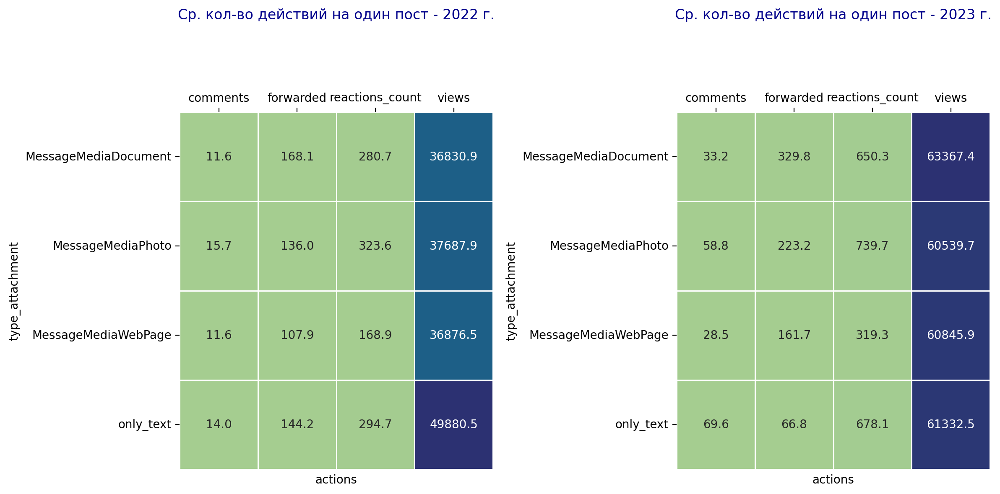

In [ ]:
# Построим в разрезе 2022/2023 гг heatmap тип публикации - действия посетителей
def heatmap_plot_charts(df, col, ax, xlabel):
    sns.heatmap(df, annot=True, linewidth=.5, fmt=".1f", ax=ax, cbar= False, cmap="crest")
    ax.set(xlabel=xlabel)
    ax.set_title(f'Ср. кол-во действий на один пост - {col} г.', loc='center', size=12, color='darkblue', pad=80)
    ax.xaxis.tick_top()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6), sharey=False, dpi=200)

heatmap_plot_charts(df_type_attachment_actions_post[df_type_attachment_actions_post['year']=='2022-01-01'][['type_attachment', 'comments', 'forwarded', 'reactions_count', 'views']].set_index('type_attachment'), '2022', axes[0], "actions")
heatmap_plot_charts(df_type_attachment_actions_post[df_type_attachment_actions_post['year']=='2023-01-01'][['type_attachment', 'comments', 'forwarded', 'reactions_count', 'views']].set_index('type_attachment'), '2023', axes[1], "actions")

plt.tight_layout()
plt.show()

In [ ]:
# Преобразуем сводную таблицу df_type_attachment_actions_post для построения графика
temp_actions_22 = pd.melt(df_type_attachment_actions_post[df_type_attachment_actions_post['year']=='2022-01-01'], id_vars=['type_attachment'], value_vars=['comments', 'forwarded', 'reactions_count', 'views'])
temp_actions_22.columns = ['type_attachment', 'actions', 'quantity']
temp_actions_22['quantity'] = temp_actions_22['quantity'].astype('int')
temp_actions_22

,type_attachment,actions,quantity
0,MessageMediaDocument,comments,11
1,MessageMediaPhoto,comments,15
2,MessageMediaWebPage,comments,11
3,only_text,comments,14
4,MessageMediaDocument,forwarded,168
5,MessageMediaPhoto,forwarded,136
6,MessageMediaWebPage,forwarded,107
7,only_text,forwarded,144
8,MessageMediaDocument,reactions_count,280
9,MessageMediaPhoto,reactions_count,323


In [ ]:
# Преобразуем сводную таблицу df_type_attachment_actions_post для построения графика
temp_actions_23 = pd.melt(df_type_attachment_actions_post[df_type_attachment_actions_post['year']=='2023-01-01'], id_vars=['type_attachment'], value_vars=['comments', 'forwarded', 'reactions_count', 'views'])
temp_actions_23.columns = ['type_attachment', 'actions', 'quantity']
temp_actions_23['quantity'] = temp_actions_23['quantity'].astype('int')
temp_actions_23

,type_attachment,actions,quantity
0,MessageMediaDocument,comments,33
1,MessageMediaPhoto,comments,58
2,MessageMediaWebPage,comments,28
3,only_text,comments,69
4,MessageMediaDocument,forwarded,329
5,MessageMediaPhoto,forwarded,223
6,MessageMediaWebPage,forwarded,161
7,only_text,forwarded,66
8,MessageMediaDocument,reactions_count,650
9,MessageMediaPhoto,reactions_count,739


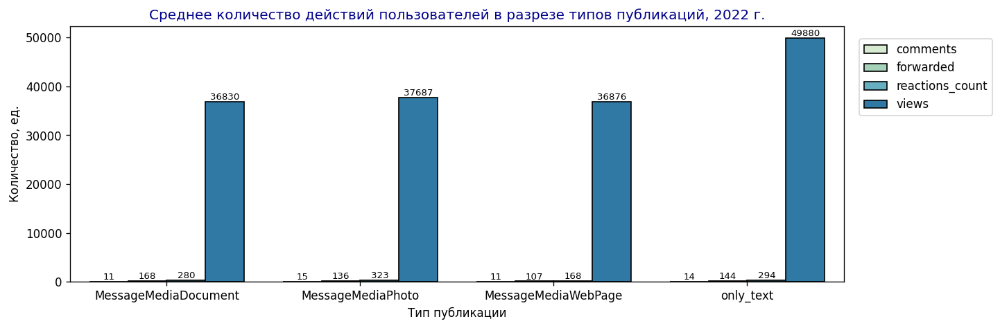

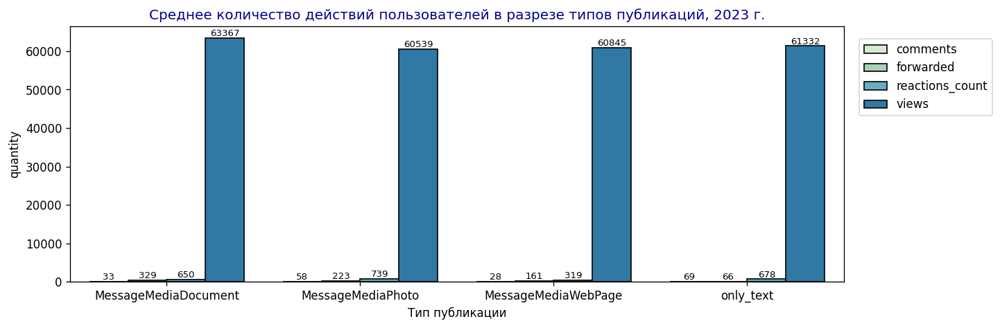

In [ ]:
# Построим столбчатый график тип публикации - количество действий пользователей
plt.figure(figsize=(12, 4), dpi=120)
splot = sns.barplot(temp_actions_22, x="type_attachment", y="quantity", hue='actions', palette = 'GnBu', edgecolor="black")
plt.title('Среднее количество действий пользователей в разрезе типов публикаций, 2022 г.', color = 'darkblue')
plt.xlabel('Тип публикации')
plt.ylabel('Количество, ед.')
plt.bar_label(splot.containers[0],size=8)
plt.bar_label(splot.containers[1],size=8)
plt.bar_label(splot.containers[2],size=8)
plt.bar_label(splot.containers[3],size=8)
plt.legend(loc=(1.02, 0.65))
plt.show()


plt.figure(figsize=(12, 4), dpi=120)
splot2 = sns.barplot(temp_actions_23, x="type_attachment", y="quantity", hue='actions', palette = 'GnBu', edgecolor="black")
plt.title('Среднее количество действий пользователей в разрезе типов публикаций, 2023 г.', color = 'darkblue')
plt.xlabel('Тип публикации')
plt.bar_label(splot2.containers[0],size=8)
plt.bar_label(splot2.containers[1],size=8)
plt.bar_label(splot2.containers[2],size=8)
plt.bar_label(splot2.containers[3],size=8)
plt.legend(loc=(1.02, 0.65))
plt.show()

___________
Увы, смотреть не на что...
___________

_____
_________

**Промежуточный вывод:**
- самый распространенный тип постов:
  - 2022 г. -  MessageMediaPhoto - 54%;
  - 2023 г. -  MessageMediaWebPage - 48%;
- самый редкий тип постов only_text:
  - 2022 г. - <1%;
  - 2023 г. - <1%;
- самый распространенный тип реакции подписчиков - просмотр;
- самый редкий тип реакции - комментарий;
- лидер по кол-ву просмотров, откликов и реакций:
   - 2022 г. - тип поста only_text;
   - 2023 г. - тип поста MessageMediaDocument;
- меньше других просмотров, откликов и реакций имеет тип поста MessageMediaWebPage;
- лидер по репостам - MessageMediaDocument.

Аудитория ТГК Кинопоиск любит читать и активно реагирует (в том числе репостит!) на MessageMediaDocument и only_text...неожиданное поведение для киноманов.

Авторы ТГК Кинопоиск наращивают долю MessageMediaWebPage, т.к. технические возможности растут и данный формат очень популярен во всем мире.

Сложно делать однозначные выводы, разница между кол-вом просмотров у разных типов постов не настолько велика, чтобы отказываться от какого-либо типа поста. В настоящее время контент ТГК выглядит сбалансированным и интересным...

Пока аудитория готова читать и обсуждать посты ТГК, но если увеличивать удельный вес картинок и видео и сокращать объем текта, писать аудитория перестанет...останутся просмотры и эмодзи-реакции.

Возможно, это общемировая тенденция. Однако часто пользователи хотят именно прочитать независимую рецензию от таких же простых пользователей как они, перед тем как подписываться на интернет сервис или смотреть тот или иной фильм,сериал...

Считаю, что наличие постов с большим объемом текста - это плюс ТГК КиноПоиск.

___________
___________

**!!!Замечание:**

Количество комментариев к посту может быть необъективной оценкой вовлеченности аудитории. Часто в рамках комментариев несколько подписчиков вступают в непродуктивный диалог между собой, увеличивая комментарии под постом.

Более интересный показатель - количество репостов. Репост свидетельствует о реальной заинтересованности подписчика и желанием поделиться постом с другими. (вирусное распростронение контента ТГК)

#### **3.2.2. Тема публикации**

##### **3.2.2.1. Рубрики КиноПоиска**

In [ ]:
# Объявим функцию по чистке текста публикаций от заданных в параметрах символах
def remove_chars(text, chars):
    return "".join([_ for _ in text if _ not in chars])

In [ ]:
# Объявим функцию очистки текста публикации от стоп-символов, лишних цифр и ссылок
def text_cleaner(s):
    s = s.lower()
    s = remove_chars(s, spec_chars)
    s = remove_chars(s, string.digits)
    text = [(word if 'http' not in word else word[:word.find('http')]) for word in s.split()]
    s_clean = ' '.join(text)
    return s_clean

In [ ]:
# Отсортируем датафрейм по дате публикации поста
# Создадим из столбца 'text' единую строку и почистим ее от "лишних" символов
posts = posts.sort_values(by='date', ascending=False)
all_text = ' '.join(posts['text'].to_list())
spec_chars = string.punctuation.replace('#', '') + '\n\xa0«»\t—…'
#del_chars = spec_chars.replace('.', '').replace(',', '').replace('!', '').replace('?', '')
text = remove_chars(all_text, spec_chars)


In [ ]:
# Создадим в датафрейме posts столбец 'text_clean' с очищенным текстом публикации
posts['text_clean'] = posts['text'].apply(text_cleaner)

In [ ]:
# Найдем рубрики, существующие в канале - по тегу # перед названием рубрики
match_list = re.findall(r'\b\#[0-9А-ЯЁа-яё]+\b', text)
x0 = list(set(match_list))
x = x0 + ['#Дождались', '#ГостьКинопоиска', '#КиноПоПятницам', '#Подслушано', '#кп_новоеимя', '#КПИтогиГода2023']
print('Количество рубрик: ', len(x))
print()
x

Количество рубрик:  27



['#коротко',
 '#подкастТарантино',
 '#коротыш',
 '#Венеция2022',
 '#Венеция2023',
 '#Оскар2022',
 '#ИтогиКП2023',
 '#КП100ВеликихСериалов',
 '#Оскар2023',
 '#НовыйСезон2022',
 '#Берлинале2022',
 '#КП100ВеликихИгр',
 '#ИсторияОтечественногоКино',
 '#КПитоги23',
 '#Канны2023',
 '#Канны2022Фото',
 '#КП100ВеликихФильмов',
 '#летоскинопоиском',
 '#Канны2022',
 '#ИтогиКП2022',
 '#ДежурныйПоКинопоиску',
 '#Дождались',
 '#ГостьКинопоиска',
 '#КиноПоПятницам',
 '#Подслушано',
 '#кп_новоеимя',
 '#КПИтогиГода2023']

In [ ]:
# Объявим функцию по определению принадлежности публикации к рубрике
def rubric_maker(s):
    for i in x:
      if i in s:
        return i.lower()[1:]
    else:
      return 'вне_рубрики'

In [ ]:
# Создадим столбец с рубрикой публикации
posts['text_rubric'] = posts['text'].apply(rubric_maker)

In [ ]:
# Изучим распределение постов по принадлежности к рубрике в абсолютной величине
posts['text_rubric'].value_counts()

вне_рубрики                  6765
коротыш                       113
оскар2022                      34
оскар2023                      31
канны2022                      27
венеция2022                    19
кп100великихсериалов           19
кп100великихфильмов            18
дождались                      17
венеция2023                    10
кпитоги23                       9
летоскинопоиском                9
канны2023                       7
подслушано                      7
новыйсезон2022                  7
кп_новоеимя                     6
итогикп2022                     6
берлинале2022                   6
дежурныйпокинопоиску            4
кпитогигода2023                 4
кинопопятницам                  4
подкасттарантино                3
итогикп2023                     2
гостькинопоиска                 2
историяотечественногокино       2
кп100великихигр                 1
коротко                         1
Name: text_rubric, dtype: int64

In [ ]:
# Изучим распределение постов по принадлежности к рубрике в относительной величине
pd.options.display.float_format = '{:.5f}'.format
posts['text_rubric'].value_counts(normalize=True)

вне_рубрики                 0.94841
коротыш                     0.01584
оскар2022                   0.00477
оскар2023                   0.00435
канны2022                   0.00379
венеция2022                 0.00266
кп100великихсериалов        0.00266
кп100великихфильмов         0.00252
дождались                   0.00238
венеция2023                 0.00140
кпитоги23                   0.00126
летоскинопоиском            0.00126
канны2023                   0.00098
подслушано                  0.00098
новыйсезон2022              0.00098
кп_новоеимя                 0.00084
итогикп2022                 0.00084
берлинале2022               0.00084
дежурныйпокинопоиску        0.00056
кпитогигода2023             0.00056
кинопопятницам              0.00056
подкасттарантино            0.00042
итогикп2023                 0.00028
гостькинопоиска             0.00028
историяотечественногокино   0.00028
кп100великихигр             0.00014
коротко                     0.00014
Name: text_rubric, dtype: fl

___________
__________
**Промежуточный вывод:**
- выявлено 27 рубрик (часть рубрик повторются год от года, меняя год в своем названии);
- в тексте поста рубрика выделена наличием тега # и словом рубрика;
- рубрики - это скорее задел на долгосрочную перспективу, в настоящее время 95% постов вне рубрик;
- топ-5 рубрик по общему кол-ву постов:
  - коротыш;
  - Оскар;
  - Канны;
  - 100 великих фильмов;
  - 100 великиз сериалов;
- самая регулярная рубрика - коротыш.
___________
___________

In [ ]:
# Создадим сводную таблицу для анализа рубрик в разрезе реакций подписчиков на 1 пост
# Анализировать будем 2023 г. (часть рубрик повторются год от года, меняя год в своем названии)
rubric_activ = posts[posts['year']==2023].pivot_table(index=('text_rubric'), values=['id', 'views', 'reactions_count', 'comments', 'forwarded'], aggfunc={'id':'count', 'views':'sum', 'reactions_count':'sum', 'comments':'sum', 'forwarded':'sum'})
rubric_activ = rubric_activ[['id', 'comments', 'forwarded','reactions_count', 'views']]
rubric_activ['comments_post'] = round(rubric_activ['comments']/rubric_activ['id'], 2)
rubric_activ['forwarded_post'] = round(rubric_activ['forwarded']//rubric_activ['id'], 2)
rubric_activ['reactions_count_post'] = round(rubric_activ['reactions_count']//rubric_activ['id'], 2)
rubric_activ['views_post'] = round(rubric_activ['views']//rubric_activ['id'], 2)
print('Активности подписчиков на один пост в разрезе рубрик ТГК КиноПоиск 2023 гг.')
print()
(
rubric_activ.sort_values(by='views_post', ascending=False)
            .style
            .format(decimal=",", thousands=" ", precision=2)
            .background_gradient(cmap='GnBu', axis=0)
)

Активности подписчиков на один пост в разрезе рубрик ТГК КиноПоиск 2023 гг.



,id,comments,forwarded,reactions_count,views,comments_post,forwarded_post,reactions_count_post,views_post
text_rubric,,,,,,,,,
дежурныйпокинопоиску,4,97,554,1 967,370 112,"24,25",138,491,92 528
итогикп2023,2,81,590,748,180 877,"40,50",295,374,90 438
кпитогигода2023,4,108,1 027,1 141,357 255,"27,00",256,285,89 313
кинопопятницам,4,95,791,1 813,325 050,"23,75",197,453,81 262
гостькинопоиска,2,178,167,1 670,153 986,"89,00",83,835,76 993
летоскинопоиском,9,406,1 483,6 139,650 983,"45,11",164,682,72 331
кп100великихфильмов,18,1 349,4 286,7 072,1 273 353,"74,94",238,392,70 741
кпитоги23,9,395,1 212,2 524,594 621,"43,89",134,280,66 069
дождались,17,824,3 949,6 044,1 112 990,"48,47",232,355,65 470


______________
______________
**Промежуточные итоги:**

интересен анализ рубрик по количеству реакций подписчиков на один пост. Можно довольно точно определить заинтересованность аудитории.

Итак:

- лидером по кол-ву просмотров стала рубрика "Дежурный по КиноПоиску" - в среднем 92 528 просмотров одного поста рубрики;
- топ-3 рубрик по кол-ву просмотров 1 поста:
   - дежурныйпокинопоиску;
   - итогикп2023;
   - кпитогигода2023

эти **рубрики имеют по 50% больше просмотров 1 поста, чем посты вне рубрик**;
- неудачными с точки зрения количества просмотров 1 поста выглядят:
    - кп100великихигр;
    - венеция2023;
    - подслушано
- лидером  по количеству о комментариев и реакций на 1 пост стала рубрика гостькинопоиска;
- лидер по количеству репостов на 1 пост  - рубрика коротыш.

Думаю, **идея с рубриками - удачное решение**.

Человеческий мозг так устроен, что он любит и отслеживает повторы:
- постоянная аудитория будет авансом благосклонно реагировать на новые публикации в заинтересовавшей рубрике;
- рубрика существенно экономит время подписчиков при просмотре контента и явлюяется хорощим гидом по ТГК;
- по рубрикам проще искать посты в ТГК.

##### **3.2.2.2. Темы КиноПоиска**

In [ ]:
# Объявим функцию по определению принадлежности публикации к теме
def topic_maker(s):
    if ('фильм' in s) and ('вечер' in s):
      return 'фильм на вечер'
    elif 'рубрик' in s:
      return 'рубрики кинопоиска'
    elif 'букмейт' in s:
      return 'читать тексты кинопоиска в букмейт'
    elif 'миядзаки' in s:
      return 'миядзаки'
    elif 'премьер' in s:
      return 'премьера'
    elif 'кинопоиск экстра' in s:
      return 'кинопоиск экстра'
    elif 'малкович' in s:
      return 'малкович'
    elif ('гость' in s) and ('кинопоиск' in s):
      return 'рубрика гость кинопоиска'
    elif ('мы' in s) and ('собрали' in s):
      return 'мы собрали'
    elif 'дорама' in s:
      return 'дорама недели'
    elif 'амедиатек' in s:
      return 'амедиатека'
    elif 'отзывы' in s:
      return 'отзывы'
    elif 'вспомнили' in s:
      return 'вспомнили'
    elif 'по словам актера' in s:
      return 'по словам актера'
    elif 'станислав зельвенский' in s:
      return 'станистлав зельвенский пишет подробнее'
    elif 'аниме' in s:
      return 'аниме'
    elif 'кинопопятницам' in s:
      return 'рубрика кино по пятницам'
    elif ('дежур' in s) and ('кинопоиск' in s):
      return 'шоу дежурный по кинопоиску'
    elif 'коротыш' in s:
      return 'киноманский коротыш'
    elif 'дождались' in s:
      return 'рубрика дождались'
    elif 'видеоэссе' in s:
      return 'видеоэссе'
    elif ('фильм' in s) and ('дня' in s):
      return 'фильм дня'
    elif ('кадры' in s) and ('фильма' in s):
      return 'кадры фильма'
    elif ('сериал' in s) and ('недели' in s):
      return 'сериал недели'
    elif ('угад' in s) and ('фильм' in s):
      return 'угадай фильм'
    elif ('кинопоиск' in s) and ('новости' in s):
      return 'кинопоиск новости'
    elif 'советуем' in s:
      return 'советуем'
    elif 'рассказываем' in s:
      return 'рассказываем'
    elif ('исполнит' in s) and ('главн' in s) and ('рол' in s):
      return 'испольнитель главной роли рассказывает'
    elif ('в' in s) and ('нашем' in s) and ('видео' in s):
      return 'в нашем видео'
    elif 'дайджест' in s:
      return 'дайджест'
    elif 'разбираемся' in s:
      return 'разбираемся'
    elif 'итоги' in s:
      return 'подводим итоги (года)'
    elif 'бежим смотреть' in s:
      return 'бежим смотреть'
    elif 'крупным планом' in s:
      return 'крупным планом'
    elif 'обзор' in s:
      return 'наш обзор'
    elif 'тест' in s:
      return 'наш тест'
    elif 'подборк' in s:
      return 'наша подборка'
    elif ('смотрите' in s) and (('фильм' in s) or ('сериал' in s)):
      return 'смотрите фильм/сериал'
    elif (('лучшие' in s) or ('топ-' in s)) and (('фильм' in s) or ('сериал' in s)):
      return 'лучшие фильм/сериал'
    elif ('что' in s) and ('смотреть' in s):
      return 'что смотреть'
    elif ('игр' in s) or ('квиз' in s):
      return 'игры'
    elif 'саундтрек' in s:
      return 'саундтрек'
    elif 'трейлер' in s:
      return 'смотрим трейлер'
    elif 'оскар' in s:
      return 'оскар'
    elif 'гардероб' in s:
      return 'гардероб'
    elif 'реценз' in s:
      return 'рецензии'
    elif 'сиквел' in s:
      return 'сиквел'
    elif 'постер' in s:
      return 'постер'
    elif 'мультфильм' in s:
      return 'мультфильм дня'
    elif (('наш' in s) and ('бот' in s)) or ('стикерпак' in s):
      return 'бот'
    elif ('почитать' in s) and ('кино' in s):
      return 'что почитать о кино'
    elif ('ответ' in s) and ('вопрос' in s):
      return 'время важных вопросов'
    elif 'видео' in s:
      return 'видео'
    elif 'гид' in s:
      return 'гид'
    elif 'главный герой' in s:
      return 'рубрика главный герой'
    elif 'блокбастер' in s:
      return 'блокбастер'
    elif 'поздравл' in s:
      return 'поздравляем'
    elif 'коммент' in s:
      return 'комментируем'
    elif 'premier' in s:
      return 'premier'
    elif 'впечатления' in s:
      return 'впечатления'
    elif 'getty' in s:
      return 'getty images'
    elif 'новое имя' in s:
      return 'рубрика кп_новоеимя'
    elif 'обсуждаем' in s:
      return 'обсуждаем увиденное'
    elif ('наш' in s) and ('карточк' in s):
      return 'наши карточки'
    elif 'конкурс' in s:
      return 'конкурс'
    elif 'подслушано' in s:
      return 'рубрика подслушано'
    elif 'индустрия' in s:
      return 'кинопоиск индустрия'
    elif '100 великих фильмов' in s:
      return '100 великих фильмов'
    else:
      return 'прочие'

In [ ]:
# Создадим столбец с темой публикации
posts['text_topic'] = posts['text_clean'].apply(topic_maker)

In [ ]:
# Изучим распределение постов по принадлежности к теме в абсолютной величине
print('Количество тем', posts['text_topic'].nunique()-1)
print()
posts['text_topic'].value_counts()

Количество тем 65



прочие                                    1799
премьера                                   948
рассказываем                               483
игры                                       346
getty images                               286
смотрим трейлер                            234
постер                                     204
станистлав зельвенский пишет подробнее     198
фильм дня                                  196
оскар                                      158
рубрики кинопоиска                         137
видеоэссе                                  113
мы собрали                                 105
комментируем                               105
киноманский коротыш                         98
разбираемся                                 98
аниме                                       95
фильм на вечер                              84
рецензии                                    72
сиквел                                      72
что смотреть                                68
дайджест     

In [ ]:
# Изучим распределение постов по принадлежности к теме в относительной величине
posts['text_topic'].value_counts(normalize=True)

прочие                                   0.25221
премьера                                 0.13290
рассказываем                             0.06771
игры                                     0.04851
getty images                             0.04010
смотрим трейлер                          0.03281
постер                                   0.02860
станистлав зельвенский пишет подробнее   0.02776
фильм дня                                0.02748
оскар                                    0.02215
рубрики кинопоиска                       0.01921
видеоэссе                                0.01584
мы собрали                               0.01472
комментируем                             0.01472
киноманский коротыш                      0.01374
разбираемся                              0.01374
аниме                                    0.01332
фильм на вечер                           0.01178
рецензии                                 0.01009
сиквел                                   0.01009
что смотреть        

___________
__________
**Промежуточный вывод:**
- выявлено 65 тем;
- деление на темы условно, можно использовать 3 способа определить тему:
  - в первом обзаце повторяющаяся от поста к посту фраза - название  темы, например:
     - фильм дня;
     - видеоэссе;
     - фильм на вечер;
     - сериал недели;
     - мультфильм дня;
     - дайджест подкастов;
  - повторяющееся от поста к посту слово - ссылка на текст основной большой статьи:
     - рассказываем;
     - мы собрали;
     - комментируем;
     - разбираемся;
     - советуем;
     - вспомнили;
  - собственно тема статьи - о чем она, способ определения - ключевые слова текста:
     - премьера;
     - игры;
     - смотрим трейлер;
     - саундтрек;
     - постер;
     - наше видео;
- тип поста MessageMediaWebPage условно темы не имеет, узнать тему можно посмотрев/прослушав пост;
- 25% постов остались с темой - заглушкой "Прочие";
- самая регулярная тема - премьера фильма/сериала.

Данный подход позволил из 7133 постов 5334 поста (75%) распределить на 65 тем. Далее темы можно укрупнить и оставить 5:

- рассказываем;
- показываем;
- рекомендуем;
- играем;
- встречаемся.

Даже те посты, которые остались с темой Прочие, могут быть отнесены к теме рассказываем или показываем в зависимоти от типа поста.

Однако подобное укрупнение похоже на тип публикации и не позволяет понять нюансов темы.

Окончательный вариант разбивки постов по темам нужно обсуждать с заказчиком.

Если у заказчика есть необходимость анализировать посты по темам и реакциям подписчиков, можно ввести обязательное присутствие в тексте поста заранее утвержденных триггерных слов (что уже частично реализовано).
___________
___________

In [ ]:
# Создадим сводную таблицу для анализа тем в разрезе реакций подписчиков на 1 пост
# Анализировать будем 2023 г.
topic_activ = posts[posts['year']==2023].pivot_table(index=('text_topic'), values=['id', 'views', 'reactions_count', 'comments', 'forwarded'], aggfunc={'id':'count', 'views':'sum', 'reactions_count':'sum', 'comments':'sum', 'forwarded':'sum'})
topic_activ = topic_activ[['id', 'comments', 'forwarded','reactions_count', 'views']]
topic_activ['comments_post'] = round(topic_activ['comments']/topic_activ['id'], 2)
topic_activ['forwarded_post'] = round(topic_activ['forwarded']//topic_activ['id'], 2)
topic_activ['reactions_count_post'] = round(topic_activ['reactions_count']//topic_activ['id'], 2)
topic_activ['views_post'] = round(topic_activ['views']//topic_activ['id'], 2)
print('Активности подписчиков на один пост в разрезе тем постов ТГК КиноПоиск 2023 гг.')
print()
(
topic_activ.sort_values(by=['views_post', 'id'], ascending=False)
            .style
            .format(decimal=",", thousands=" ", precision=2)
            .background_gradient(cmap='GnBu', axis=0)
)

Активности подписчиков на один пост в разрезе тем постов ТГК КиноПоиск 2023 гг.



,id,comments,forwarded,reactions_count,views,comments_post,forwarded_post,reactions_count_post,views_post
text_topic,,,,,,,,,
время важных вопросов,5,346,924,1 802,538 843,"69,20",184,360,107 768
обсуждаем увиденное,6,605,562,2 899,601 372,"100,83",93,483,100 228
шоу дежурный по кинопоиску,3,80,479,1 470,284 716,"26,67",159,490,94 905
отзывы,3,87,369,1 656,236 575,"29,00",123,552,78 858
малкович,1,31,254,723,77 221,"31,00",254,723,77 221
дорама недели,3,77,1 597,1 212,230 712,"25,67",532,404,76 904
кадры фильма,5,297,2 356,4 515,377 630,"59,40",471,903,75 526
видеоэссе,62,2 244,11 126,28 414,4 589 380,"36,19",179,458,74 022
подводим итоги (года),20,1 076,3 335,9 122,1 472 487,"53,80",166,456,73 624


______________
______________
**Промежуточные итоги:**

интересен анализ "тем" постов по количеству реакций подписчиков на один пост. Можно довольно точно определить заинтересованность аудитории.

интересно сравнение среднего количества просмотра одного поста по выбранной теме с аналогичным показателем по постам с темой "Прочие", который можно использовать как некий бенчмарк при оценки популярности темы у подписчиков ТГК.

Итак:

- лидером по кол-ву просмотров стала тема "Время важных вопросов" - в среднем 107 768 просмотров одного поста рубрики;
- топ-3 тем по кол-ву просмотров 1 поста:
   - время важных вопросов;
   - обсуждаем увиденное;
   - шоу дежурный по КиноПоиску

эти **рубрики имеют по 40% больше просмотров 1 поста, чем посты с темой прочие**;
- неудачными с точки зрения количества просмотров 1 поста выглядят темы:
    - КиноПоиск индустрия;
    - наши карточки;
    - постер.
- лидером  по количеству о комментариев тема "Комментируем" - о, как это логично!
- лидер по количеству реакций на 1 пост - тема "По словам актера";
- лидер по количеству репостов на 1 пост  - тема-рубрика "главный герой", подписчикам нравится репостить постеры и карточки ТГК.

Таким образом, **ТГК КиноПоиск имеет чувствительную к темам аудиторию**, размах колебаний по количеству просмотров в зависимости от темы от 100 000 просмотров поста до 48 000.

Также как и идея с рубриками, **идея с четким выделением темы поста в его теле - удачное решение**.

Приемущества те же:
- постоянная аудитория будет авансом благосклонно реагировать на новые публикации по заинтересовавшей теме;
- тема, обозначенная триггерным словом/словосочетанием, существенно экономит время подписчиков при просмотре контента и явлюяется хорошим гидом по ТГК;
- по темам проще искать посты в ТГК.

#### **3.2.3. Объем текста**

___________
___________

**Пояснения**

Максимальная длина текста в посте — 4096 символов. Если длина текста превышает это значение, он автоматически разделится на две публикации.

Максимальная длина текста в посте с прикрепленными файлами — 1024 символа.

Для того, чтобы узнать количество слов в Телеграмме, нужно считать каждое слово, каждую группу цифр, каждую смешанную группу знаков или отдельный знак. Перед каждым словом, группой цифр или знаком, перед которыми или после которых имеется дефис «-», пробел (или начало и конец строки), следует считать отдельное слово.

Важно не количество символов, а суть поста, насколько тема актуальна и интересно написана. Рекомендуют не делать посты, длина которых превышает 2000 символов.

Если пост оказался коротким, то не стоит лить воду и пытаться его растянуть.

Для больших текстов в ТГ существует Telegraph.
____________
___________

In [ ]:
# Создадим слолбец 'count_words' в датафрейме posts
# Для расчета кол-ва слов разобъем строку на отдельные слова по пробелу
posts['count_words'] = posts['text_clean'].copy(deep=True)
posts['count_words'] = posts['count_words'].apply(lambda x: len(x.split()))

In [ ]:
# Создадим слолбец 'count_symbol' в датафрейме posts
# За кол-во символов примем длину строки с текстом поста
posts['count_symbol'] = posts['text_clean'].copy(deep=True)
posts['count_symbol'] = posts['count_symbol'].apply(lambda x: len(x))
posts.head(2)

,id,date,text,views,reactions,with_media,forwarded,replies,reactions_count,comments,type_attachment,year,text_clean,text_rubric,text_topic,count_words,count_symbol
4572,36843,2023-12-31 21:04:56,С годом даркона!,74390,"{'_': 'MessageReactions', 'results': [{'_': 'R...",only_text,47,"{'_': 'MessageReplies', 'replies': 29, 'replie...",738,29,only_text,2023,с годом даркона,вне_рубрики,прочие,3,15
4573,36839,2023-12-31 18:02:03,"Привет, это команда Кинопоиска. \n \nВ Новый...",87034,"{'_': 'MessageReactions', 'results': [{'_': 'R...","{'_': 'MessageMediaPhoto', 'spoiler': False, '...",12,"{'_': 'MessageReplies', 'replies': 31, 'replie...",1218,31,MessageMediaPhoto,2023,привет это команда кинопоиска в новый год прин...,вне_рубрики,подводим итоги (года),93,555


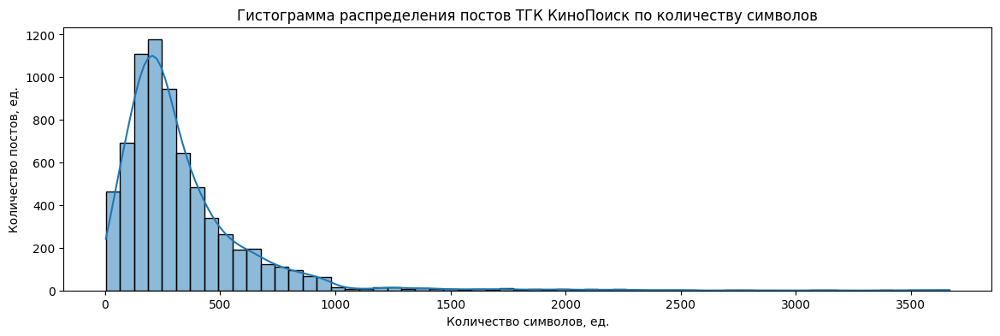

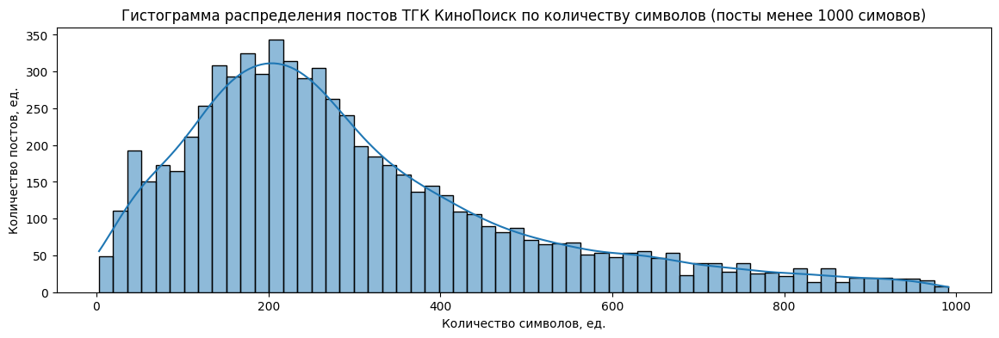

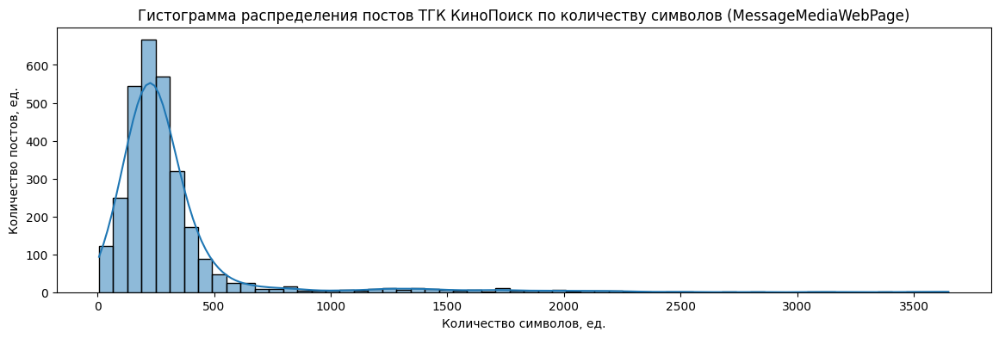

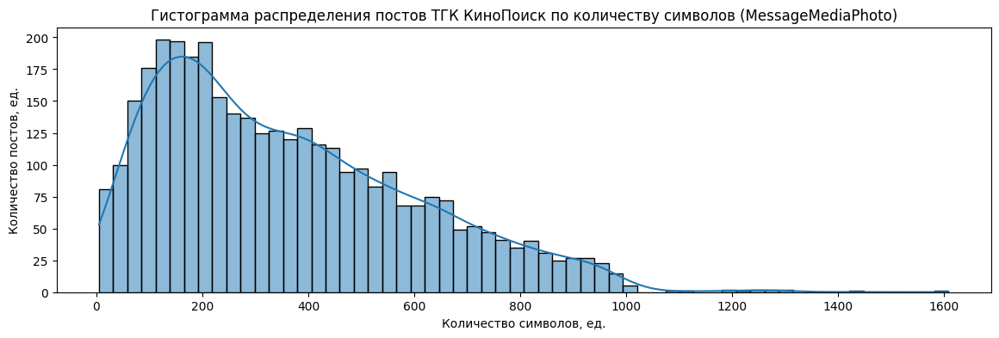

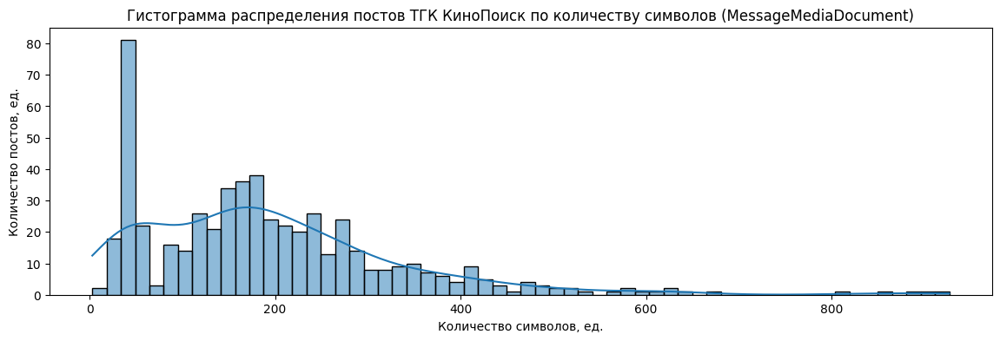

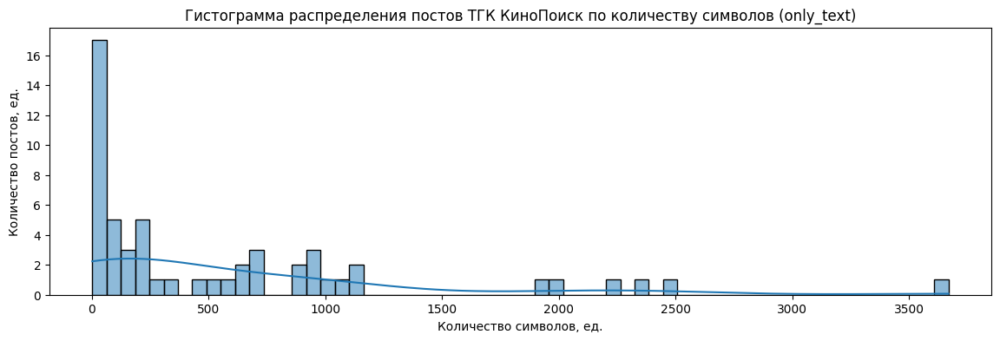

In [ ]:
# Построим гисторгамму распределения количества постов по количеству символов в посте
plt.figure(figsize=(14, 4))
sns.histplot(x = posts['count_symbol'], bins=60, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству символов')
plt.xlabel('Количество символов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

# Построим гисторгамму распределения количества постов по количеству символов в посте с кол-вом символов до 1000
plt.figure(figsize=(14, 4))
sns.histplot(x = posts[posts['count_symbol']<=1000]['count_symbol'], bins=60, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству символов (посты менее 1000 симовов)')
plt.xlabel('Количество символов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

# Построим гисторгамму распределения количества постов по количеству символов в посте MessageMediaWebPage
plt.figure(figsize=(14, 4))
sns.histplot(x = posts[posts['type_attachment']=='MessageMediaWebPage']['count_symbol'], bins=60, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству символов (MessageMediaWebPage)')
plt.xlabel('Количество символов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

# Построим гисторгамму распределения количества постов по количеству символов в посте MessageMediaPhoto
plt.figure(figsize=(14, 4))
sns.histplot(x = posts[posts['type_attachment']=='MessageMediaPhoto']['count_symbol'], bins=60, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству символов (MessageMediaPhoto)')
plt.xlabel('Количество символов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

# Построим гисторгамму распределения количества постов по количеству символов в посте MessageMediaDocument
plt.figure(figsize=(14, 4))
sns.histplot(x = posts[posts['type_attachment']=='MessageMediaDocument']['count_symbol'], bins=60, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству символов (MessageMediaDocument)')
plt.xlabel('Количество символов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

# Построим гисторгамму распределения количества постов по количеству символов в посте only_text
plt.figure(figsize=(14, 4))
sns.histplot(x = posts[posts['type_attachment']=='only_text']['count_symbol'], bins=60, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству символов (only_text)')
plt.xlabel('Количество символов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

In [ ]:
# Изучим описательную статистику по столбцу count_symbol
posts['count_symbol'].describe()

count   7133.00000
mean     330.09449
std      294.70850
min        3.00000
25%      161.00000
50%      254.00000
75%      406.00000
max     3668.00000
Name: count_symbol, dtype: float64

In [ ]:
# Изучим описательную статистику по столбцу count_symbol - MessageMediaWebPage
posts[posts['type_attachment']=='MessageMediaWebPage']['count_symbol'].describe()

count   3004.00000
mean     316.29660
std      342.77310
min        7.00000
25%      172.00000
50%      242.00000
75%      326.00000
max     3648.00000
Name: count_symbol, dtype: float64

In [ ]:
# Изучим описательную статистику по столбцу count_symbol - MessageMediaPhoto
posts[posts['type_attachment']=='MessageMediaPhoto']['count_symbol'].describe()

count   3524.00000
mean     359.06413
std      241.90679
min        5.00000
25%      162.00000
50%      310.00000
75%      515.50000
max     1608.00000
Name: count_symbol, dtype: float64

In [ ]:
# Изучим описательную статистику по столбцу count_symbol - MessageMediaDocument
posts[posts['type_attachment']=='MessageMediaDocument']['count_symbol'].describe()

count   550.00000
mean    194.92727
std     142.32962
min       3.00000
25%      92.00000
50%     173.50000
75%     255.75000
max     927.00000
Name: count_symbol, dtype: float64

In [ ]:
# Изучим описательную статистику по столбцу count_symbol - short_text
posts[posts['type_attachment']=='only_text']['count_symbol'].describe()

count     55.00000
mean     579.21818
std      773.74323
min        3.00000
25%       44.00000
50%      224.00000
75%      892.00000
max     3668.00000
Name: count_symbol, dtype: float64

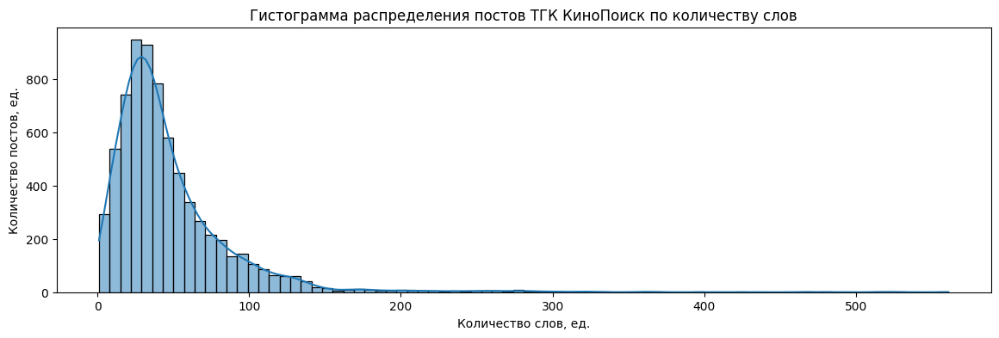

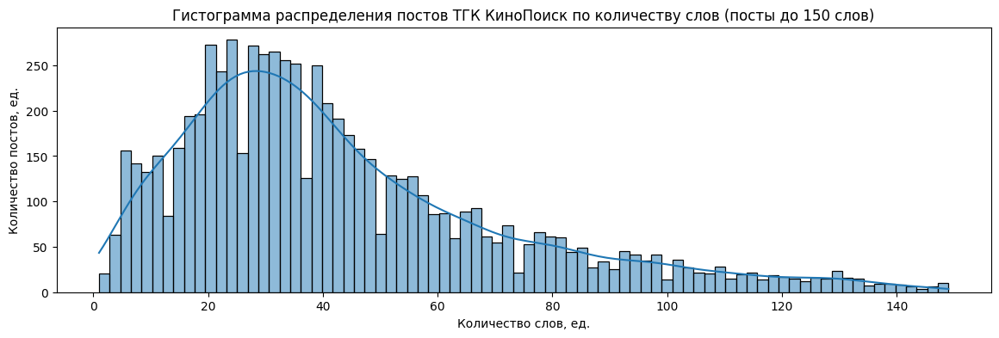

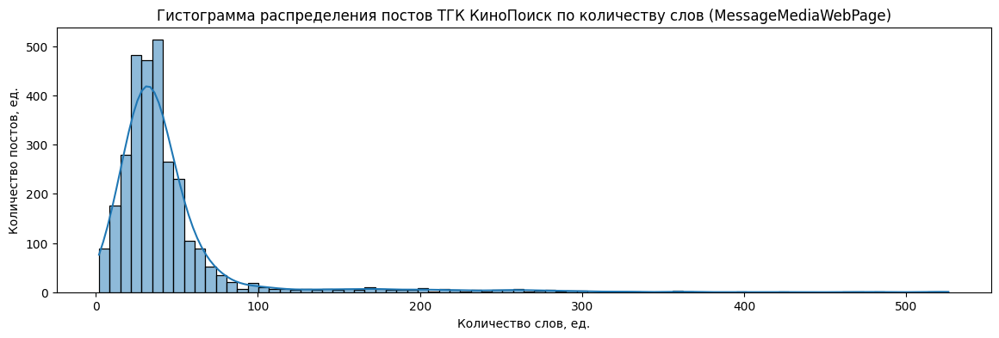

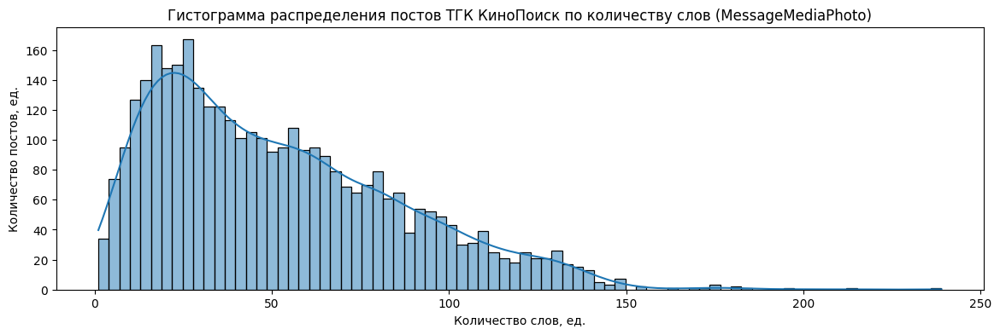

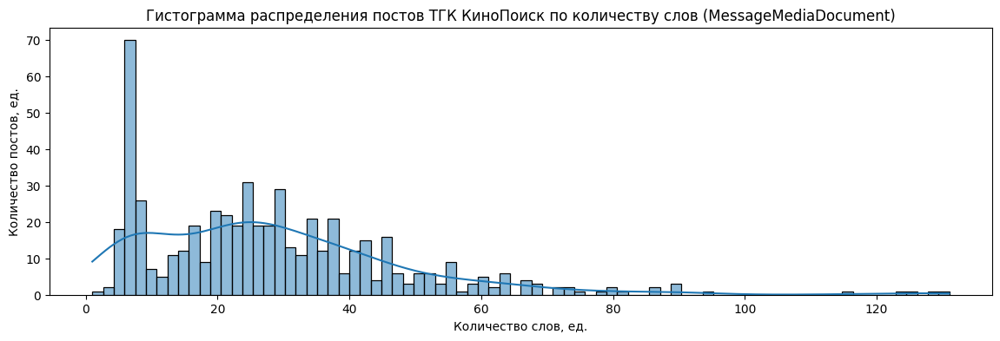

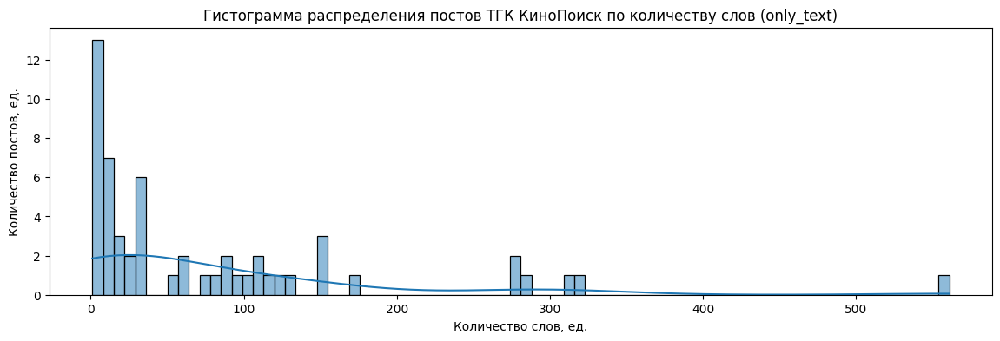

In [ ]:
# Построим гисторгамму распределения количества постов по количеству слов в посте
plt.figure(figsize=(14, 4))
sns.histplot(x = posts['count_words'], bins=80, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству слов')
plt.xlabel('Количество слов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

# Построим гисторгамму распределения количества постов по количеству слов в посте с кол-вом слов до 150
plt.figure(figsize=(14, 4))
sns.histplot(x = posts[posts['count_words']<=150]['count_words'], bins=80, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству слов (посты до 150 слов)')
plt.xlabel('Количество слов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

# Построим гисторгамму распределения количества постов по количеству слов в постах MessageMediaWebPage
plt.figure(figsize=(14, 4))
sns.histplot(x = posts[posts['type_attachment']=='MessageMediaWebPage']['count_words'], bins=80, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству слов (MessageMediaWebPage)')
plt.xlabel('Количество слов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

# Построим гисторгамму распределения количества постов по количеству слов в постах MessageMediaPhoto
plt.figure(figsize=(14, 4))
sns.histplot(x = posts[posts['type_attachment']=='MessageMediaPhoto']['count_words'], bins=80, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству слов (MessageMediaPhoto)')
plt.xlabel('Количество слов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

# Построим гисторгамму распределения количества постов по количеству слов в постах MessageMediaDocument
plt.figure(figsize=(14, 4))
sns.histplot(x = posts[posts['type_attachment']=='MessageMediaDocument']['count_words'], bins=80, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству слов (MessageMediaDocument)')
plt.xlabel('Количество слов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

# Построим гисторгамму распределения количества постов по количеству слов в постах short_text
plt.figure(figsize=(14, 4))
sns.histplot(x = posts[posts['type_attachment']=='only_text']['count_words'], bins=80, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству слов (only_text)')
plt.xlabel('Количество слов, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

In [ ]:
# Изучим описательную статистику по столбцу count_words
posts['count_words'].describe()

count   7133.00000
mean      47.24926
std       41.55137
min        1.00000
25%       23.00000
50%       37.00000
75%       58.00000
max      561.00000
Name: count_words, dtype: float64

___________
___________

**Промежуточный вывод:**

Объемы постов ТГК КиноПоиск:

- в ТГК приобладают посты с количеством симолов до 250 знаков (37 слов) - 50% от общего кол-ва постов;
- посты до 400 символов (58 слов) занимают 75% от общего количества постов;
- есть выбросы - посты с количесвом символов свыше 1000 симолов (150 слов)
- количество символов зависит от типа поста:
   - MessageMediaWebPage - медиана 242 символа;
   - MessageMediaPhoto - медиана 310 символов;
   - MessageMediaDocument - медиана 173 символа;
   - only_text - медиана 224 символа.

Визуальный анализ ТГК показал, что посты часто имеют ссылки на более объемные посты, опубликованные за пределами ТГК КиноПоиск. Практически все посты сопровождаются "сочными" картинками.

На мой взгляд, выбрана очень удачная стратегия подачи информации. Подписчикам есть на что посмотреть и есть что почитать, было бы желание.

Далее изучим взаимосвязи между количеством симовлов и количеством действий подписчиков (просмотров, комментариев, реакций)

__________
_______


**Пояснение:**

Не вижу смысла искать корреляцию в общей массе постов за 2022-2023 г.

Для анализа корреляций выберем посты со следующими параметрами:
- 2023 год;
- количество символов до 1000;
- тип поста - MessageMediaPhoto.

In [ ]:
# Создадим датафрейм для анализа корреляций с постами с заданными параметрами
symb = posts[(posts['count_symbol']<=1000) & (posts['year']==2023) & (posts['type_attachment']=='MessageMediaPhoto')]

In [ ]:
# Создадим временную сводную таблицу для изучения взаимосвязей между количеством симолов в посте и количеством реакций подписчиков
temp_count_symbol = symb[['id', 'views', 'reactions_count', 'forwarded', 'comments', 'count_symbol']].copy()
temp_count_symbol.head(2)

,id,views,reactions_count,forwarded,comments,count_symbol
4573,36839,87034,1218,12,31,555
4579,36824,87429,876,283,39,473


In [ ]:
# Изучим коэффициенты корреляции
temp_count_symbol.corr()

,id,views,reactions_count,forwarded,comments,count_symbol
id,1.00000,0.33974,0.02532,0.10420,-0.06632,0.23367
views,0.33974,1.00000,0.11904,0.25923,0.12480,0.12669
reactions_count,0.02532,0.11904,1.00000,0.29999,0.06593,-0.14594
forwarded,0.10420,0.25923,0.29999,1.00000,0.03483,-0.05917
comments,-0.06632,0.12480,0.06593,0.03483,1.00000,-0.21570
count_symbol,0.23367,0.12669,-0.14594,-0.05917,-0.21570,1.00000


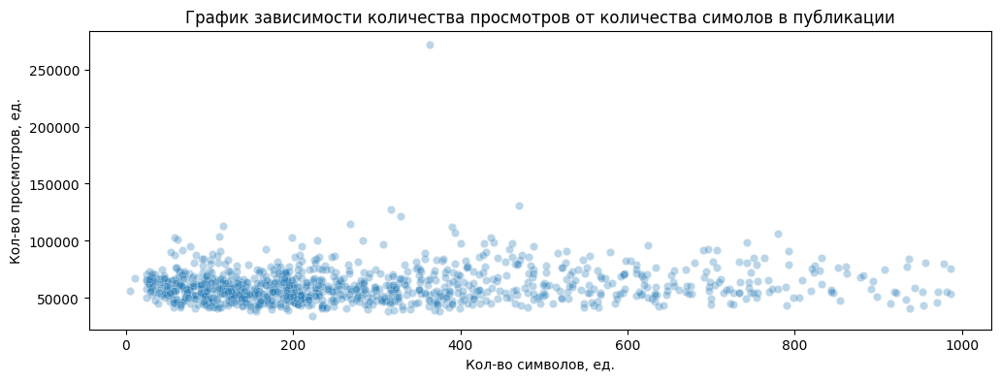

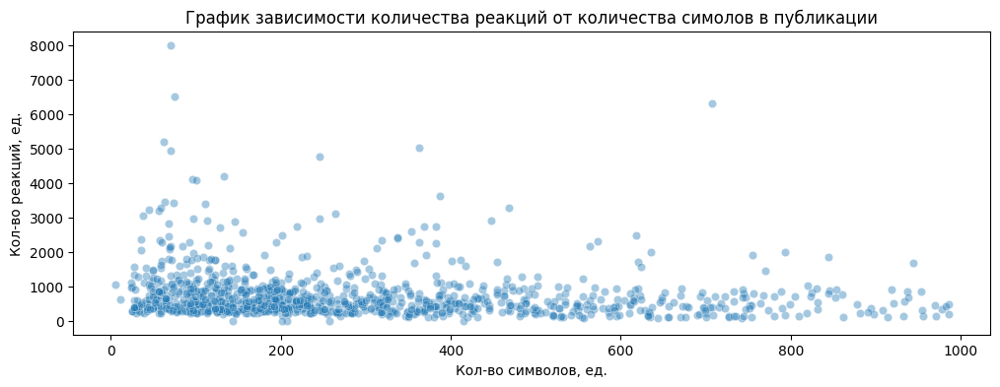

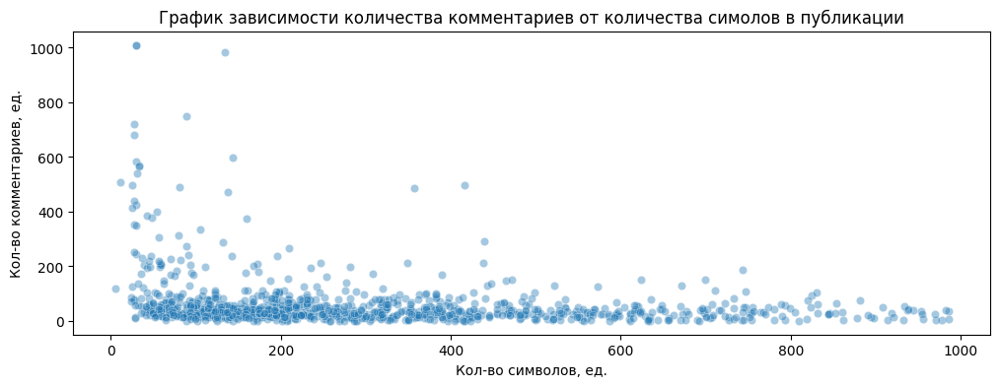

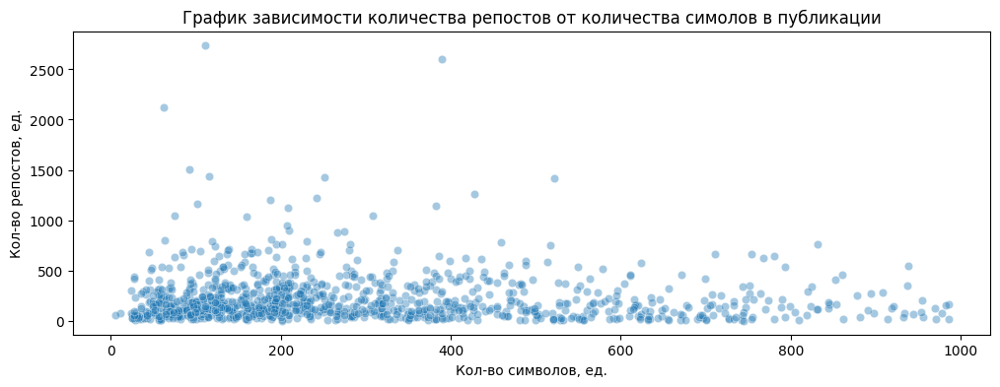

In [ ]:
# Построим график зависимости количества просмотров от количества симолов в публикации
plt.figure(figsize=(12, 4))
sns.scatterplot(data=temp_count_symbol, x='count_symbol', y='views', alpha=0.3)
plt.title('График зависимости количества просмотров от количества симолов в публикации')
plt.xlabel('Кол-во символов, ед.')
plt.ylabel('Кол-во просмотров, ед.')
plt.show;

# Построим график зависимости количества реакций от количества симолов в публикации
plt.figure(figsize=(12, 4))
sns.scatterplot(data=temp_count_symbol, x='count_symbol', y='reactions_count', alpha=0.4)
plt.title('График зависимости количества реакций от количества симолов в публикации')
plt.xlabel('Кол-во символов, ед.')
plt.ylabel('Кол-во реакций, ед.')
plt.show;

# Построим график зависимости количества комментариев от количества симолов в публикации
plt.figure(figsize=(12, 4))
sns.scatterplot(data=temp_count_symbol, x='count_symbol', y='comments', alpha=0.4)
plt.title('График зависимости количества комментариев от количества симолов в публикации')
plt.xlabel('Кол-во символов, ед.')
plt.ylabel('Кол-во комментариев, ед.')
plt.show;

# Построим график зависимости количества репостов от количества симолов в публикации
plt.figure(figsize=(12, 4))
sns.scatterplot(data=temp_count_symbol, x='count_symbol', y='forwarded', alpha=0.4)
plt.title('График зависимости количества репостов от количества симолов в публикации')
plt.xlabel('Кол-во символов, ед.')
plt.ylabel('Кол-во репостов, ед.')
plt.show;

___________
_____________
**Промежуточный вывод:**

Между количеством символов в публикации и количеством просмотров/реакций/комментариев/репостов есть слабовыраженная корреляция, но она настолько слабая, что на графике ее почти не видно:
- view - к-т корреляции 0.12;
- reactions_count - к-т корреляции -0.14;
- forwarded - к-т корреляции -0.05;
- comments - к-т корреляции -0.21.

Данное направление анализа затруднено еще и тем, что большая часть публикаций имеет ссылки на тексты в других источниках и оценить реальный объем предлагаемого к изучению контента сложно.
__________
________

**Пояснение:**

Подтвердим сделанный выше вывод другим способом - разобъем все поты на группы по количеству символов и рассчитаем количество активностей подписчиков на 1 пост.

In [ ]:
# Разделим посты на группы с помощью метода .cut()
# Рассчитаем кол-во активностей подписчиков на 1 пост каждой группы
interval_range = pd.interval_range(start=0,
                                   freq=100,
                                   end=1000)

symb = posts[(posts['count_symbol']<=1000) & (posts['year']==2023) & (posts['type_attachment']=='MessageMediaPhoto')]

symb['cut_symbol'] = pd.cut(symb['count_symbol'],
                       bins=interval_range,
                       labels=[1,2,3,4,5,6,7,8,9,10])
symb = symb.groupby('cut_symbol').agg({'id':'count', 'views':'sum', 'reactions_count':'sum', 'forwarded':'sum', 'comments':'sum'})
symb['views_p'] = round(symb['views']/symb['id'])
symb['reactions_count_p'] = round(symb['reactions_count']/symb['id'])
symb['forwarded_p'] = round(symb['forwarded']/symb['id'])
symb['comments_p'] = round(symb['comments']/symb['id'])
(
    symb.sort_values(by='views_p', ascending=False)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,id,views,reactions_count,forwarded,comments,views_p,reactions_count_p,forwarded_p,comments_p
cut_symbol,,,,,,,,,
"(400, 500]",84,5517488,56917,20200,4162,65684.000000,678.000000,240.000000,50.000000
"(700, 800]",40,2624727,27747,7960,1524,65618.000000,694.000000,199.000000,38.000000
"(800, 900]",21,1369301,12866,4262,784,65205.000000,613.000000,203.000000,37.000000
"(500, 600]",60,3777508,30807,10819,1747,62958.000000,513.000000,180.000000,29.000000
"(600, 700]",49,3071985,27512,6645,1616,62694.000000,561.000000,136.000000,33.000000
"(300, 400]",129,7977115,95903,29656,5913,61838.000000,743.000000,230.000000,46.000000
"(900, 1000]",18,1083790,9087,2587,436,60211.000000,505.000000,144.000000,24.000000
"(0, 100]",197,11831322,202307,37128,23787,60057.000000,1027.000000,188.000000,121.000000
"(200, 300]",180,10602385,117485,47349,7801,58902.000000,653.000000,263.000000,43.000000


___________
___________
**Промежуточный вывод:**

Альтернативный анализ распределения активностей пользователей по группам постов по кол-ву символов подтвердил результаты корреляционного анализа:

- слабая положительная зависимость между кол-вом символов и количеством просмотров на 1 пост;
- слабая отрицательная зависимость между кол-вом символов и количеством реакций/комментариев/репостов на 1 пост;


____________
____________

#### **3.2.4. Наличие эмодзи**

In [ ]:
# Создадим столбец 'count_emoji' в датафрейме posts
posts['count_emoji'] = posts['text'].copy(deep=True)
posts['count_emoji'] = posts['count_emoji'].apply(lambda x: emoji.emoji_count(x))
posts.head(2)

,id,date,text,views,reactions,with_media,forwarded,replies,reactions_count,comments,type_attachment,year,text_clean,text_rubric,text_topic,count_words,count_symbol,count_emoji
4572,36843,2023-12-31 21:04:56,С годом даркона!,74390,"{'_': 'MessageReactions', 'results': [{'_': 'R...",only_text,47,"{'_': 'MessageReplies', 'replies': 29, 'replie...",738,29,only_text,2023,с годом даркона,вне_рубрики,прочие,3,15,0
4573,36839,2023-12-31 18:02:03,"Привет, это команда Кинопоиска. \n \nВ Новый...",87034,"{'_': 'MessageReactions', 'results': [{'_': 'R...","{'_': 'MessageMediaPhoto', 'spoiler': False, '...",12,"{'_': 'MessageReplies', 'replies': 31, 'replie...",1218,31,MessageMediaPhoto,2023,привет это команда кинопоиска в новый год прин...,вне_рубрики,подводим итоги (года),93,555,1


In [ ]:
# Изучим столбец count_emoji с помощью метода .describe()
posts['count_emoji'].describe()

count   7133.00000
mean       0.41357
std        1.06649
min        0.00000
25%        0.00000
50%        0.00000
75%        0.00000
max       22.00000
Name: count_emoji, dtype: float64

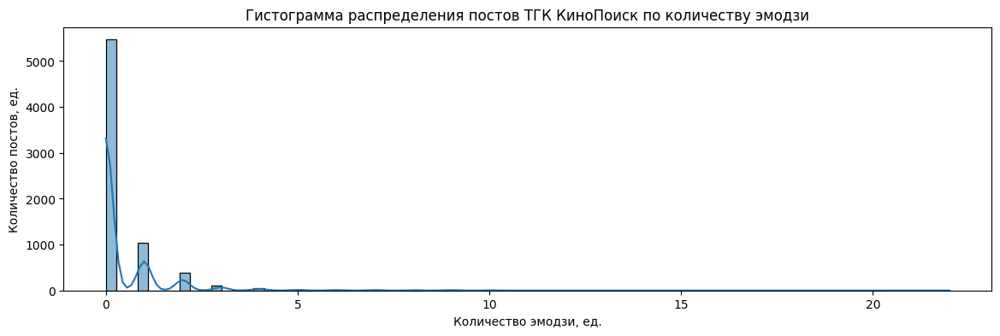

In [ ]:
# Построим гисторгамму распределения количества постов по количеству эмодзи в посте
plt.figure(figsize=(14, 4))
sns.histplot(x = posts['count_emoji'], bins=80, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству эмодзи')
plt.xlabel('Количество эмодзи, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

In [ ]:
# Объявим функцию по созданию категории поста в зависимости от количества emoji в тексте поста
def category_emoji(n):
  if n==0:
    return '0_emoji'
  elif n==1:
    return '1_emoji'
  elif n<6:
    return '2_5_emoji'
  else:
    return 'more_5_emoji'

In [ ]:
# Создадим столбец 'cat_emoji'
posts['cat_emoji'] = posts['count_emoji'].apply(lambda x: category_emoji(x))
display(posts['cat_emoji'].value_counts())
print()
posts['cat_emoji'].value_counts(normalize=True)

0_emoji         5466
1_emoji         1042
2_5_emoji        563
more_5_emoji      62
Name: cat_emoji, dtype: int64

0_emoji        0.76630
1_emoji        0.14608
2_5_emoji      0.07893
more_5_emoji   0.00869
Name: cat_emoji, dtype: float64

In [ ]:
# Создадим датафрейм для анализа влияния количества эмодзи в посте на количество реакций подписчиков
emoji = posts.groupby('cat_emoji').agg({'id':'count', 'views':'sum', 'reactions_count':'sum', 'forwarded':'sum', 'comments':'sum'})
emoji['views_p'] = round(emoji['views']/emoji['id'])
emoji['reactions_count_p'] = round(emoji['reactions_count']/emoji['id'])
emoji['forwarded_p'] = round(emoji['forwarded']/emoji['id'])
emoji['comments_p'] = round(emoji['comments']/emoji['id'])
(
    emoji.sort_values(by='views_p', ascending=False)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,id,views,reactions_count,forwarded,comments,views_p,reactions_count_p,forwarded_p,comments_p
cat_emoji,,,,,,,,,
2_5_emoji,563,34291296,410764,118340,21317,60908.000000,730.000000,210.000000,38.000000
1_emoji,1042,60146814,520574,221130,49908,57722.000000,500.000000,212.000000,48.000000
more_5_emoji,62,3080122,18701,9163,1102,49679.000000,302.000000,148.000000,18.000000
0_emoji,5466,229570008,1596159,751318,98448,42000.000000,292.000000,137.000000,18.000000


___________
___________
**Промежуточный вывод:**
- только 23% постов имеют в тексте эмодзи;
- более 2-х эмодзи имеют только 8% постов;
- посты с эмодзи имеют большее количетво реакций подписчиков, чем посты без эмодзи.

Авторы ТГК КиноПоиск редко используют эмодзи в тексте поста, поэтому сложно судить о статистической значимости вывода: наличие эмодзи в тексте приводит к росту вовлеченности подписчиков.

Однако, есть доказанный факт: человек склонен отзеркаливать эмоции собеседника...**возможно наличие эмодзи в тексте поста может бессознательно стимулировать подписчика оставить под постом свою реакцию**.

Можно проверить эту гипотезу, увеличив количество постов с эмодзи в тексте поста.
______________
______________


#### **3.2.5. Наличие ссылок (https)**

In [ ]:
# Создадим столбец 'count_https' в датафрейме posts
posts['count_https'] = posts['text'].copy(deep=True)
posts['count_https'] = posts['count_https'].apply(lambda x: x.count("https"))
posts['count_https'].describe()

count   7133.00000
mean       1.04584
std        1.75976
min        0.00000
25%        0.00000
50%        1.00000
75%        1.00000
max       25.00000
Name: count_https, dtype: float64

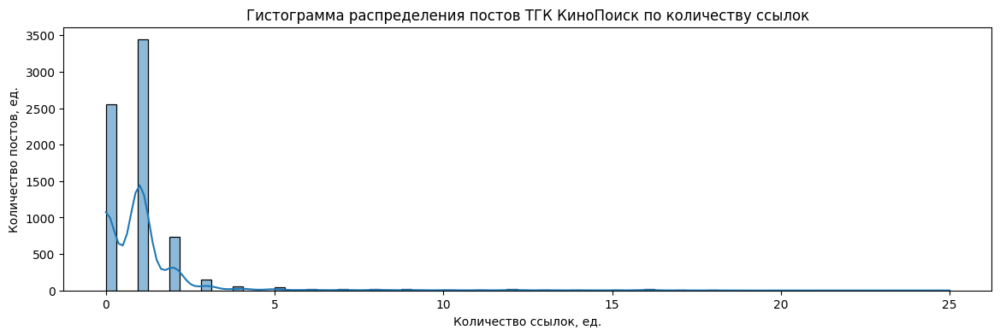

In [ ]:
# Построим гисторгамму распределения количества постов по количеству ссылок в посте
plt.figure(figsize=(14, 4))
sns.histplot(x = posts['count_https'], bins=80, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству ссылок')
plt.xlabel('Количество ссылок, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

In [ ]:
# Объявим функцию по созданию категории поста в зависимости от количества emoji в тексте поста
def category_https(n):
  if n==0:
    return '0_https'
  elif n==1:
    return '1_https'
  elif n<6:
    return '2_5_https'
  else:
    return 'more_5_https'

In [ ]:
# Создадим столбец 'cat_emoji'
posts['cat_https'] = posts['count_https'].apply(lambda x: category_https(x))
display(posts['cat_https'].value_counts())
print()
posts['cat_https'].value_counts(normalize=True)

1_https         3440
0_https         2556
2_5_https        982
more_5_https     155
Name: cat_https, dtype: int64

1_https        0.48227
0_https        0.35833
2_5_https      0.13767
more_5_https   0.02173
Name: cat_https, dtype: float64

In [ ]:
# Создадим датафрейм для анализа влияния количества ссылок в посте на количество реакций подписчиков
https = posts.groupby('cat_https').agg({'id':'count', 'views':'sum', 'reactions_count':'sum', 'forwarded':'sum', 'comments':'sum'})
https['views_p'] = round(https['views']/https['id'])
https['reactions_count_p'] = round(https['reactions_count']/https['id'])
https['forwarded_p'] = round(https['forwarded']/https['id'])
https['comments_p'] = round(https['comments']/https['id'])
(
    https.sort_values(by='views_p', ascending=False)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,id,views,reactions_count,forwarded,comments,views_p,reactions_count_p,forwarded_p,comments_p
cat_https,,,,,,,,,
2_5_https,982,54452609,388894,178080,26245,55451.000000,396.000000,181.000000,27.000000
more_5_https,155,7571476,27339,12002,2192,48848.000000,176.000000,77.000000,14.000000
1_https,3440,160819853,1144145,530465,81191,46750.000000,333.000000,154.000000,24.000000
0_https,2556,104244302,985820,379404,61147,40784.000000,386.000000,148.000000,24.000000


___________
___________
**Промежуточный вывод:**
- 65% постов имеют в тексте ссылки;
- 48%  постов имеют одну ссылку;
- 17% постов имеют более одной ссылки;
- посты со ссылками имеют большее количество реакций подписчиков, чем посты без ссылок;
- наибольшее количество реакций имеют посты с 2-5 ссылками.

Авторы ТГК КиноПоиск часто используют ссылки на другие интернет-ресурсы в тексте поста, что говорит о заимствовании контента.
______________
______________

#### **3.2.5. Наличие изображений**

__________
_________
**Промежуточный вывод:**

В отличие от html формата, в котором можно посчитать количество изображений в тексте по хештегу img, в предоставленных нам данных нет информации о количестве картинок в тексте. Известен только тип публикации, в том числе документ с фото и видео. Тип публикации анализировался в п.3.3.1. Поэтому пропустим данный раздел исследования.



__________
__________

#### **3.2.6. Знаки препинания (сложность текста)**

In [ ]:
# Создадим столбец 'count_punctuation' в датафрейме posts
posts['count_punctuation'] = posts['text'].copy(deep=True)
posts['count_punctuation'] = posts['count_punctuation'].apply(lambda x: len([i for i in x if i in ',!?:;-']))
posts['count_punctuation'].describe()

count   7133.00000
mean       8.74148
std        9.01662
min        0.00000
25%        3.00000
50%        6.00000
75%       11.00000
max       85.00000
Name: count_punctuation, dtype: float64

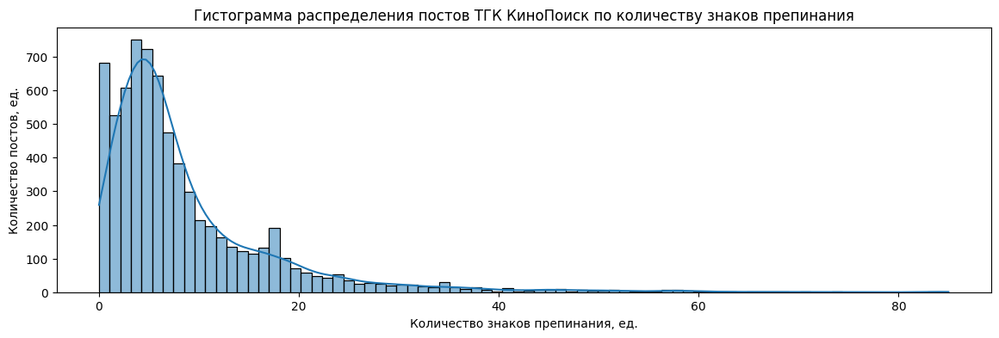

In [ ]:
# Построим гисторгамму распределения количества постов по количеству ссылок в посте
plt.figure(figsize=(14, 4))
sns.histplot(x = posts['count_punctuation'], bins=80, kde=True)
plt.title('Гистограмма распределения постов ТГК КиноПоиск по количеству знаков препинания')
plt.xlabel('Количество знаков препинания, ед.')
plt.ylabel('Количество постов, ед.')
plt.show;

In [ ]:
# Объявим функцию по созданию категории поста в зависимости от количества знаков препинания в тексте поста
def category_punctuation(n):
  if n==0:
    return '0_punctuation'
  elif n<6:
    return '1_5_punctuation'
  elif n<11:
    return '6_10_punctuation'
  else:
    return 'more_10_punctuation'

In [ ]:
# Создадим столбец 'cat_emoji'
posts['cat_punctuation'] = posts['count_punctuation'].apply(lambda x: category_punctuation(x))
display(posts['cat_punctuation'].value_counts())
print()
posts['cat_punctuation'].value_counts(normalize=True)

1_5_punctuation        3060
6_10_punctuation       2014
more_10_punctuation    1830
0_punctuation           229
Name: cat_punctuation, dtype: int64

1_5_punctuation       0.42899
6_10_punctuation      0.28235
more_10_punctuation   0.25655
0_punctuation         0.03210
Name: cat_punctuation, dtype: float64

In [ ]:
# Создадим датафрейм для анализа влияния количества знаков препинания в посте на количество реакций подписчиков
punctuation = posts.groupby('cat_punctuation').agg({'id':'count', 'views':'sum', 'reactions_count':'sum', 'forwarded':'sum', 'comments':'sum'})
punctuation['views_p'] = round(punctuation['views']/punctuation['id'])
punctuation['reactions_count_p'] = round(punctuation['reactions_count']/punctuation['id'])
punctuation['forwarded_p'] = round(punctuation['forwarded']/punctuation['id'])
punctuation['comments_p'] = round(punctuation['comments']/punctuation['id'])
(
    punctuation.sort_values(by='views_p', ascending=False)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,id,views,reactions_count,forwarded,comments,views_p,reactions_count_p,forwarded_p,comments_p
cat_punctuation,,,,,,,,,
6_10_punctuation,2014,96709103,644145,316219,45972,48018.000000,320.000000,157.000000,23.000000
1_5_punctuation,3060,138788809,1193357,504519,76855,45356.000000,390.000000,165.000000,25.000000
more_10_punctuation,1830,82340673,626227,250289,36190,44995.000000,342.000000,137.000000,20.000000
0_punctuation,229,9249655,82469,28924,11758,40392.000000,360.000000,126.000000,51.000000


___________
___________
**Промежуточный вывод:**
- только 3% постов не имеют в тексте знаков препинания;
- 42%  постов имеют 1-5 знаков препинания;
- 28% постов имеют 6-10 знаков препинания;
- 26% постов имеют 11 и более знаков препинания;
- посты со знаками препинания имеют большее количество реакций подписчиков, чем посты без знаков препинания;
- наибольшее количество реакций имеют посты с 6-10 знаками препинания.

Судя по количеству знаков препинания в постах преобладают простые предложения. Длина поста 5-10 коротких предложений.
______________
______________

#### **3.2.7. Время публикации**

In [ ]:
# Создадим датафрейм с группировкой постов по часу публикации
posts['hour'] = posts['date'].dt.hour
posts_hour = posts.groupby('hour').agg({'id':'count', 'views':'sum', 'reactions_count':'sum', 'comments':'sum', 'forwarded':'sum'}).reset_index()
posts_hour['avg_views'] = round(posts_hour['views']/posts_hour['id'], 2)
posts_hour.sort_values(by='avg_views', ascending=False)

,hour,id,views,reactions_count,comments,forwarded,avg_views
21,21,28,1510182,17483,1112,6802,53935.07000
19,19,103,5376454,51234,3163,22942,52198.58000
18,18,310,16097153,153194,9753,60766,51926.30000
3,3,14,725278,10823,39,3936,51805.57000
20,20,30,1504007,15823,849,4953,50133.57000
22,22,7,342401,7387,428,4194,48914.43000
17,17,427,20102462,171628,13623,67861,47078.37000
7,7,491,23016250,199564,11496,75772,46876.27000
11,11,553,25891745,178837,12758,82059,46820.52000
9,9,527,24628061,201605,13116,83788,46732.56000


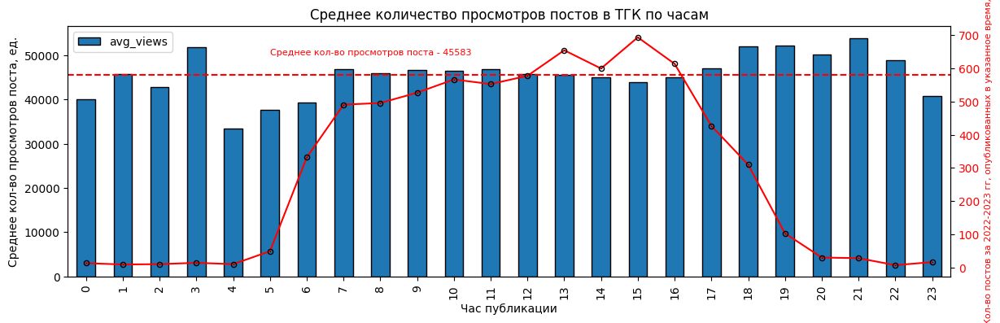

In [ ]:
# Построим график количество просмотров постов на ТГК по часам
fig, ax1 = plt.subplots()

a = int(posts_hour['avg_views'].mean())
posts_hour.plot(x = 'hour',
                y = 'avg_views',
                kind = 'bar',
                figsize=(14, 4),
                edgecolor = 'black',
                ax=ax1)
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(5, 50000, f'Среднее кол-во просмотров поста - {a}', fontsize=8, color="r")
plt.title('Среднее количество просмотров постов в ТГК по часам')
plt.xlabel('Час публикации')
plt.ylabel('Среднее кол-во просмотров поста, ед.')

ax2 = ax1.twinx()
ax2.plot(posts_hour['hour'],
         posts_hour['id'],
         lw=1.5,
         marker = 'o',
         ms=1,
         markerfacecolor = 'black',
         markeredgewidth = 4.5,
         markeredgecolor = 'black',
         color="r")
ax2.set_ylabel("Кол-во постов за 2022-2023 гг, опубликованных в указанное время, шт.", fontsize=8, color="red")
for label in ax2.get_yticklabels():
    label.set_color("r")
plt.show()

_______________
______________
**Промежуточный вывод:**
Нет яроко выраженной зависимоти межуду временем публикации и количеством просмотра одного поста.

Количество просмотров выше среднего у постов, опубликованных с 17-00 до 22-00, можно объяснить тем, что в эти часы аудитория менее занята текущими делами и с большей активностью следит за постами в ТГ.

**Аудитория канала находится в разных часовых поясах. Поэтому выбранная ТГК Кинопоиск стратегия публикавать один пост раз в 1-2 часа выглядит правильной.**

ТГК публикует довольно короткие посты с большим количесвом фото и видео, такие публикации не требуют большого времени на просмотр, приносят позитивные эмоции. Контент легко "заходит" аудитории в свободное время.

Поэтому важна периодичность и постоянность публикаций.

Нет смысла искать какое-то "волшебное" время, когда аудитория более лояльна к постам.
____________
____________

#### **3.2.8. Срок жизни поста**

In [ ]:
# Соединим датафреймы posts и comments, сгруппируем по id поста, где в столбцах будет дата и время публикации поста и последнего комментария
posts_comments = (posts.merge(comments, left_on=['id'], right_on=['post_id'], how='right')
                              .sort_values(by=['id', 'date_comment'])
                              .groupby('id')
                              .agg({'date':'first',
                                    'text': 'first',
                                    'views':'first',
                                    'reactions_count': 'first',
                                    'comments': 'first',
                                    'date_comment':'last'})
                      )
posts_comments.head(2)

,date,text,views,reactions_count,comments,date_comment
id,,,,,,
28701.00000,2022-09-22 13:30:17,Первые кадры третьего сезона сериала Netflix «...,34882.00000,382.00000,9.00000,2022-10-01 10:11:06
28711.00000,2022-09-22 14:05:18,Тема наркотиков не табуирована в отечественном...,38448.00000,115.00000,15.00000,2022-09-23 17:38:24


In [ ]:
# Создадим столбец 'time_of_life' - разница м/д временем публикации и временем последнего комментария
posts_comments['time_of_life'] = posts_comments['date_comment'] - posts_comments['date']

In [ ]:
# переведем timedelta в дни
posts_comments['time_of_life'] = posts_comments['time_of_life'].apply(lambda x: x.total_seconds()/(60*60*24))

In [ ]:
# Посмотрим описательную статистику по столбцу 'time_of_life'
posts_comments['time_of_life'].describe()

count   3819.00000
mean      13.31478
std       39.59889
min        0.08367
25%        0.78343
50%        2.07395
75%        6.94078
max      451.51862
Name: time_of_life, dtype: float64

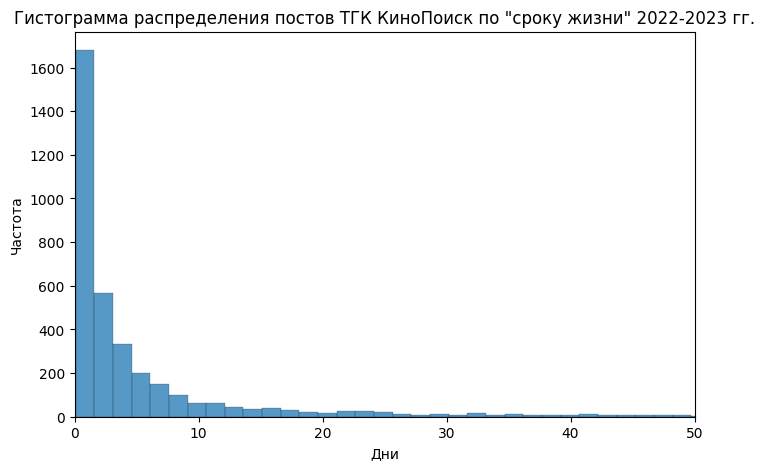

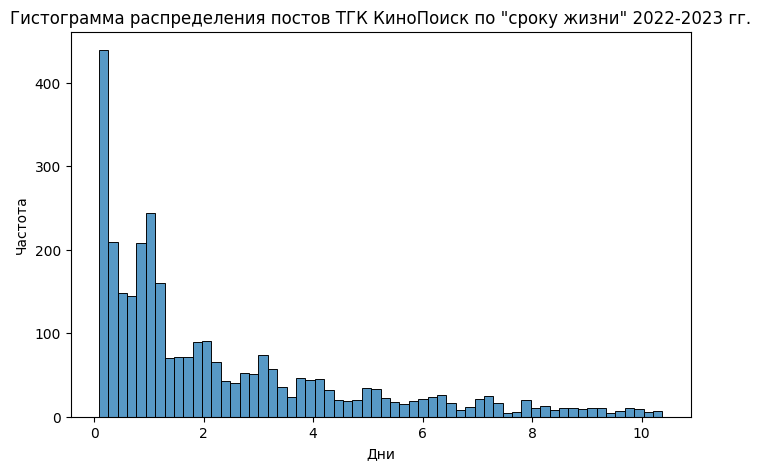

In [ ]:
# Построим гистограмму распределения постов по "сроку жизни"
plt.figure(figsize=(8, 5))
sns.histplot(x='time_of_life', data=posts_comments, bins=300, edgecolor = 'black')
plt.title('Гистограмма распределения постов ТГК КиноПоиск по "сроку жизни" 2022-2023 гг.')
plt.xlabel('Дни')
plt.ylabel('Частота')
plt.xlim(0, 50)
plt.show()

# Построим гистограмму распределения постов по "сроку жизни" без выбросов
plt.figure(figsize=(8, 5))
sns.histplot(x='time_of_life', data=posts_comments[posts_comments['time_of_life']<6.94078*1.5], bins=60, edgecolor = 'black')
plt.title('Гистограмма распределения постов ТГК КиноПоиск по "сроку жизни" 2022-2023 гг.')
plt.xlabel('Дни')
plt.ylabel('Частота')
plt.show()

___________
___________
**Промежуточный вывод:**
- 50% постов имеют "срок жизни 2.07 дня;
- 75% постов имеют "срок жизни 7 дней;
- максимальное количество комментариев пост получает в первые сутки...если уточнить, то в первые 2часа после публикации.

Есть выбросы, но они малоинформативны.
_________
_________

### **3.3. Семантический анализ (основной раздел)**

#### **3.3.0. Объявим функции для проведения частотного анализа текста**

In [ ]:
# Объявим функцию, удаляющую специальные символы и цифр из текста
def remove_chars(text, chars):
    return "".join([_ for _ in text if _ not in chars])

In [ ]:
def text_analyst(df, col):
  # Объединение текста из всех строк в одну переменную
  all_text = ' '.join(df[col].tolist())
  text = all_text.lower()
  # Создадим строку со специальными символами, которые мы удалим из текста
  spec_chars = string.punctuation + '\n\xa0«»\t—…'
  # Удалим из текста специальные символы
  text = remove_chars(text, spec_chars)
  # Удалим из текста цифры
  text = remove_chars(text, string.digits)
  # Создадим список слов - токенов
  text_tokens = word_tokenize(text)
  # Приведем список токенов к объекту класса Текст
  text = nltk.Text(text_tokens)
  # рассчитаем статистики распределения частот слов в тексте с помощью класса FreqDist
  fdist = FreqDist(text)
  # Загрузка списка (множества) русских стоп-слов
  russian_stopwords = stopwords.words("russian")
  # Расширим список стоп-слов
  russian_stopwords.extend(['это', 'еще', 'который', 'россия', 'ия'])
  # Удаление стоп-слов из текста
  filtered_tokens = [word for word in text if word not in russian_stopwords]
  fdist = FreqDist(filtered_tokens)
  # Объединение токенов обратно в текст
  filtered_text = ' '.join(filtered_tokens)
  # Создание объекта для работы с морфологией
  morph = pymorphy2.MorphAnalyzer()
  # Токенизация текста
  tokens = word_tokenize(filtered_text)
  # Лемматизация каждого токена
  lemmatized_tokens = [morph.parse(token)[0].normal_form for token in tokens]
  # Удалим стоп-слова после леммизации
  lemmatized_tokens = [token for token in lemmatized_tokens if token not in russian_stopwords]
  # Узнаем 20 самых любим слов авторов блога и их количество в наших публикациях
  fdist = FreqDist(lemmatized_tokens)
  top_words = fdist.most_common(20)
  print('20 самых любим слов авторов и их количество в публикациях:')
  print()
  [print(*i) for i in top_words]
  print()
  # Построим график частотности слов
  print('Построим график частотности слов')
  fdist.plot(30,cumulative=False);
  print()
  # Объединение лемматизированных токенов обратно в текст (если нужно)
  lemmatized_text = ' '.join(lemmatized_tokens)
  # Создание облака слов
  wordcloud = WordCloud(width=800, height=400, background_color='white').generate(lemmatized_text)
  # Отображение облака слов
  plt.figure(figsize=(9, 7),dpi=150)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title('Облако слов')
  plt.show()

#### **3.3.1. Частотный анализ текста постов ТГК КиноПоиск (Облако слов)**

20 самых любим слов авторов и их количество в публикациях:

фильм 2747
сериал 1724
год 1599
новый 1472
главный 909
роль 897
первый 872
режиссёр 847
наш 841
выйти 821
сезон 756
кинопоиск 577
проект 567
стать 561
свой 539
картина 525
история 524
премьера 524
также 512
актёр 511

Построим график частотности слов


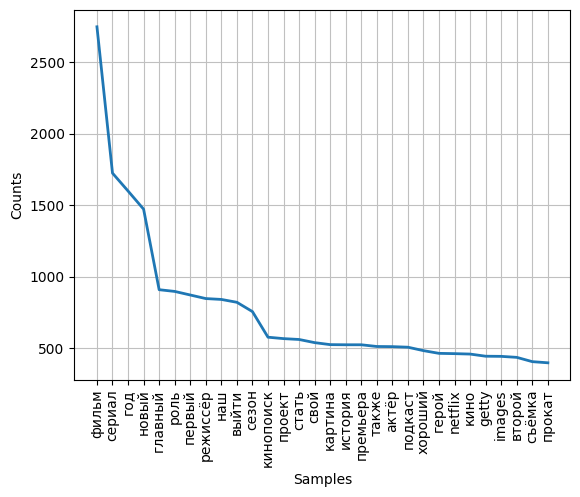

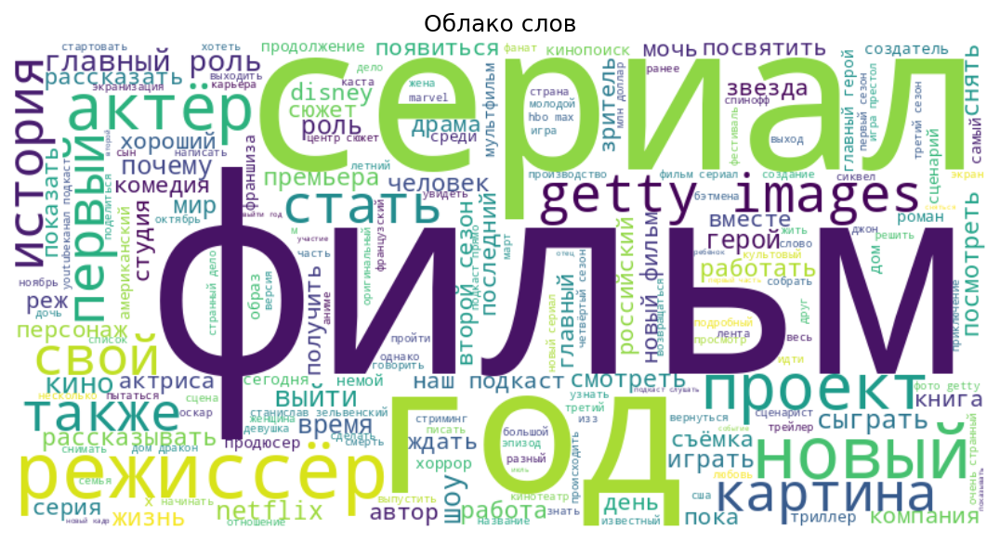

In [ ]:
text_analyst(posts.loc[posts['year']==2022], 'text')

20 самых любим слов авторов и их количество в публикациях:

фильм 1207
новый 679
подписываться 671
наш 639
сериал 588
год 489
кинопоиск 462
главный 385
кинопоискhttpstmekinopoisk 335
выйти 329
кинопоискhttptmekinopoisk 282
первый 279
хороший 271
смотреть 264
режиссёр 261
самый 260
роль 255
кино 254
свой 232
рассказывать 224

Построим график частотности слов


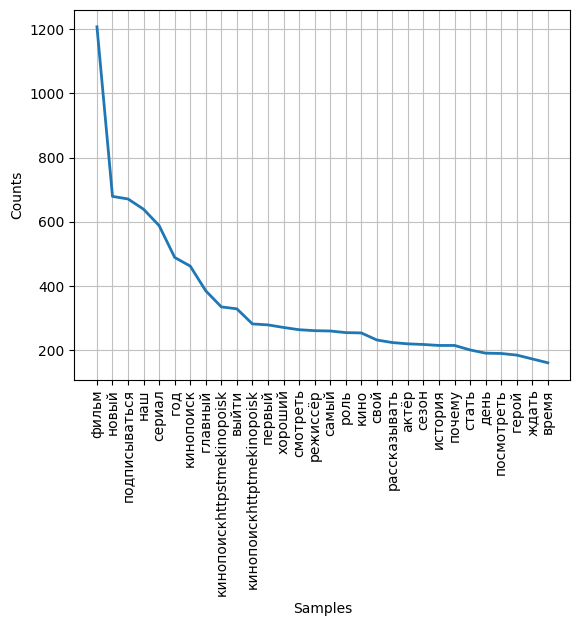

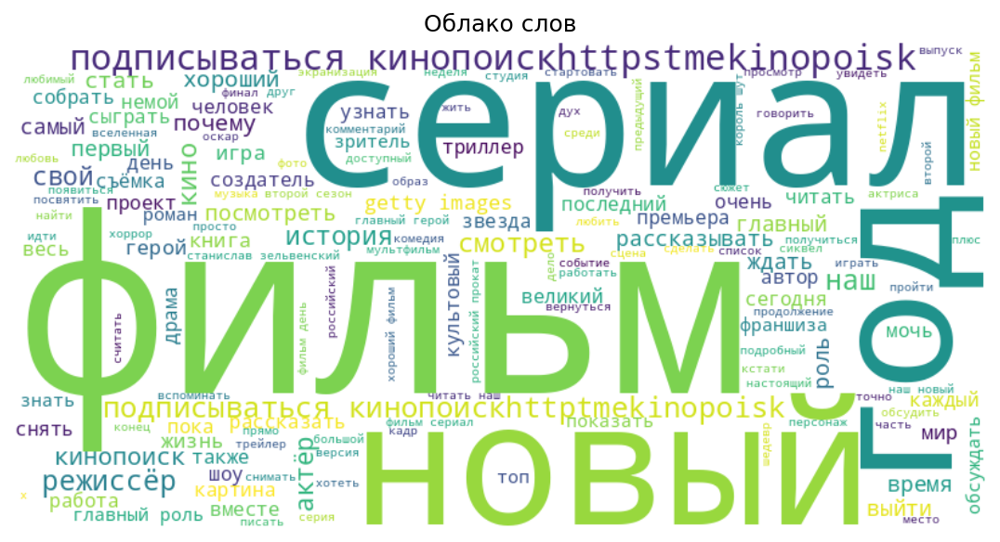

In [ ]:
text_analyst(posts.loc[posts['year']==2023], 'text')

______________
______________
**Промежуточный вывод:**

Мы нашли самые популярные у авторов канала слова.

Облако слов говорит о том, что самая популярная тема ТГК - фильмы и сериалы.

В топ-5 слов, постоянно повторяющихся в постах:

- существительные:
   - фильм,
   - сериал,
   - роль,
   - режиссёр,
   - кинопоиск;
- прилагательные:
  - новый,
  - главный,
  - первый,
  - последний,
  - хороший;
- глаголы:
  - подписаться,
  - выйти,
  - стать,
  - рассказать,
  - показать.

В 2023 годы тексты становятся более "агрессивными" с позиций продвижения подписки. Все посты заканчиваются призывом поключиться к  КиноПоску - "облако слов" это "видит".

Однако в целом, даже отдельно взятые слова звучат "вкусно", а ведь есть еще и "сочные" картинки!

Думаю, посты оставляют легкий и приятный эмоциональный отклик у подписчиков ТГК, вызывают желание посмотреть фильм/сериал, о котором идет речь в посте.

Авторам текстов следует внимательнее изучить "облако слов", в нем присутствуют часто повторяемые стоп-слова. Тексты постов короткие, если вспомнить методику Ильяхова, то удаление лишних стоп-слов, позволит добавить в тест смысл...не увеличивая при этом количества символов.

Проверим с помощью облака слов реакцию пользователей ТГК.
____________
___________

#### **3.3.2. Частотный анализ текста комментариев к постам ТГК КиноПоиск (Облако слов)**

20 самых любим слов авторов и их количество в публикациях:

фильм 15103
картинка 7655
смотреть 7425
сериал 6254
хороший 4984
очень 4950
просто 4231
посмотреть 4132
первый 3819
год 3797
человек 3649
кино 3415
кинопоиск 3378
сезон 3307
ещё 3291
вообще 2969
свой 2874
знать 2698
всё 2539
серия 2494

Построим график частотности слов


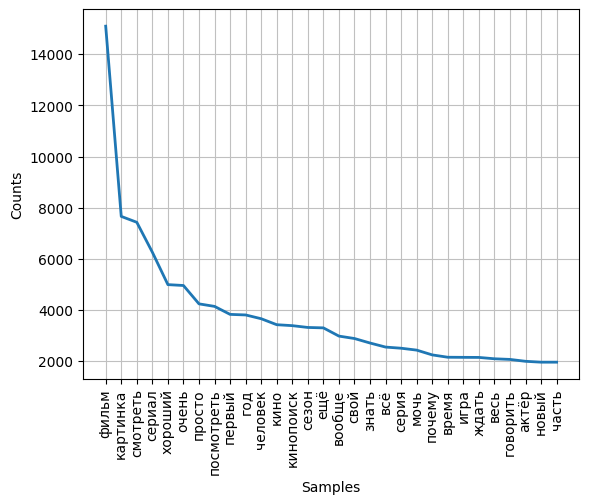

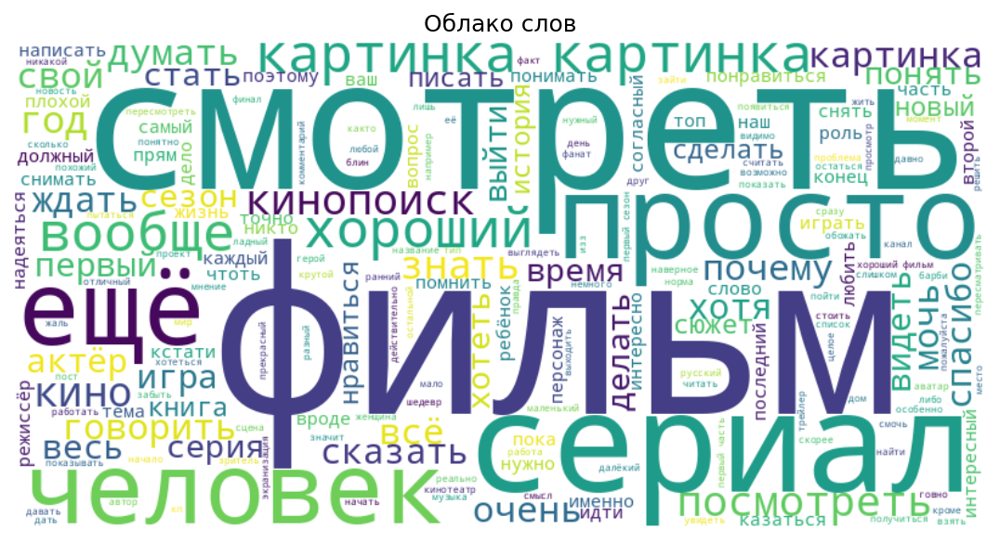

In [ ]:
text_analyst(comments, 'text_comment')

______________
______________
**Промежуточный вывод:**

Мы нашли самые популярные у подписчиков канала слова.

Облако слов говорит о том, что (!!!) самая актуальная для подписчиков тема ТГК - фильмы и сериалы (почему нас это не удивляет;)).

В топ-5 слов,  повторяющихся в комментариях:

- существительные:
   - фильм,
   - картинка,
   - сериал/серия/сезон,
   - человек,
   - кино;
- прилагательные:
  - хороший,
  - новый,
  - первый,
  - интересный,
  - согласный;
- глаголы:
  - смотреть/посмотреть,
  - знать,
  - хотеть,
  - сделать,
  - мочь.

Комментарии пользователей созвучны с постами ТГК, т.е.посты вызывают ожидаемую реакцию - ТГК рассказывает о фильмах/сериалах, а аудитория смотрит их или хочет посмотрть.
____________
___________

### **3.4. Анализ реакций (эмодзи) подписчиков на посты ТГК КиноПоиск (основной рздел)**

In [ ]:
# Создадим таблицу для хранения распаршенных данных
parsed_data = pd.DataFrame(columns=['id', 'emoji', 'cnt_emoji'])

In [ ]:
# Объявим функцию для парсинга словарей в отдельные колонки и заполнения новой таблицы
def parse_reactions(row):
    parsed_rows = []
    try:
        reactions = ast.literal_eval(row['reactions'])
        for reaction in reactions['results']:
            emoji = reaction['reaction'].get('emoticon', None)
            count = reaction['count']
            parsed_rows.append({'id': row['id'], 'emoji': emoji, 'cnt_emoji': count})
    except Exception as e:
        print(f"Error: {e}")
    return parsed_rows

In [ ]:
# Примененим функцию parse_reactions к каждой строке и заполненим новую таблицу
for index, row in posts.iterrows():
    parsed_rows = pd.DataFrame(parse_reactions(row))
    parsed_data = pd.concat([parsed_data, parsed_rows], ignore_index=True)

Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan
Error: malformed node or string: nan


In [ ]:
# Создадим сводный датафрейм с общим количеством эмодзи
# Найдем топ-20 эмодзи (по количеству)
parsed_data_emoji = parsed_data.groupby('emoji').agg({'cnt_emoji':'sum'}).reset_index()
top_20_emoji = parsed_data_emoji.sort_values(by='cnt_emoji', ascending=False).head(20)
(
    top_20_emoji
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,emoji,cnt_emoji
18,👍,824808
2,❤,673822
19,👎,230973
29,🔥,218590
3,❤‍🔥,127190
39,😢,115753
33,😁,57288
45,🤔,37173
25,💔,24605
56,🥰,20900


In [ ]:
# Строим график treemap
fig = px.treemap(top_20_emoji,
                 path=[px.Constant('emoji'), 'emoji'],
                 values=top_20_emoji['cnt_emoji'],
                 color=top_20_emoji['cnt_emoji'],
                 color_continuous_scale='YlGnBu',
                 color_continuous_midpoint=np.average(top_20_emoji['cnt_emoji']),
                 width=1000,
                 height=00,
                 title='Топ-20 популярных реакций (эмодзи)'
                )

# Увеличение текста на диаграмме
fig.update_layout(uniformtext=dict(minsize=15, mode='show'))

# Установка отступов
fig.update_layout(margin=dict(t=40, l=25, r=25, b=25))

# Показать график
fig.show()

In [ ]:
# нейтральные эмодзи - neutral_emodzi
neutral_emoji = ['🤔','🐳','🍓','🥱','🍾','😐','🌚','💅','🌭','💋','🤯', '👀', '🤡','🎄','🍌']
# негативные эмодзи - bad_emodzi
bad_emoji = ['👎','😢','💔', '😱', '💩', '🤮', '🗿', '😭', '🤬']
# хорошие эмодзи - good_emodzi
good_emoji = ['👍','❤','🔥','❤‍🔥','😁','🥰','🕊	','👏','🎉','⚡','🤣','💯','😍', '🤩','💘','👻']

In [ ]:
# Объявим функцию создания категории эмодзи
def category_emoji_2(n):
  if n in neutral_emoji:
    return 'neutral_emoji'
  elif n in bad_emoji:
    return 'bad_emoji'
  elif n in good_emoji:
    return 'good_emoji'
  else:
    return 'other_emoji'

In [ ]:
# создадим в датафрейме parsed_data_emoji столбец 'cat_emoji'
parsed_data_emoji['category_emoji'] = parsed_data_emoji['emoji'].apply(lambda x: category_emoji_2(x))
parsed_data_emoji['cnt_emoji'] = parsed_data_emoji['cnt_emoji'].astype('int')
parsed_data_emoji.head(2)

,emoji,cnt_emoji,category_emoji
0,☃,1242,other_emoji
1,⚡,11521,good_emoji


In [ ]:
# Изучим датафрейм parsed_data_emoji методом .describe()
parsed_data_emoji.describe(include='all').T.fillna('-')

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
emoji,60.00000,60,☃,1,-,-,-,-,-,-,-
cnt_emoji,60.00000,-,-,-,42436.63333,140515.36333,9.00000,586.50000,2928.00000,13385.00000,824808.00000
category_emoji,60.00000,4,other_emoji,21,-,-,-,-,-,-,-


In [ ]:
# Сгруппируем кол-во эмодзи по категориям и посчитаем % каждой категории в общем количестве
df_category_emoji = parsed_data_emoji.groupby('category_emoji').agg({'cnt_emoji':'sum'}).reset_index()
df_category_emoji['cnt_emoji_%'] = df_category_emoji['cnt_emoji']/(df_category_emoji['cnt_emoji'].sum())*100
df_category_emoji['cnt_emoji_%'] = df_category_emoji['cnt_emoji_%'].astype('int')
df_category_emoji = df_category_emoji.sort_values(by='cnt_emoji_%', ascending=False)
(
    df_category_emoji
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,category_emoji,cnt_emoji,cnt_emoji_%
1,good_emoji,1984048,77
0,bad_emoji,415467,16
2,neutral_emoji,119624,4
3,other_emoji,27059,1


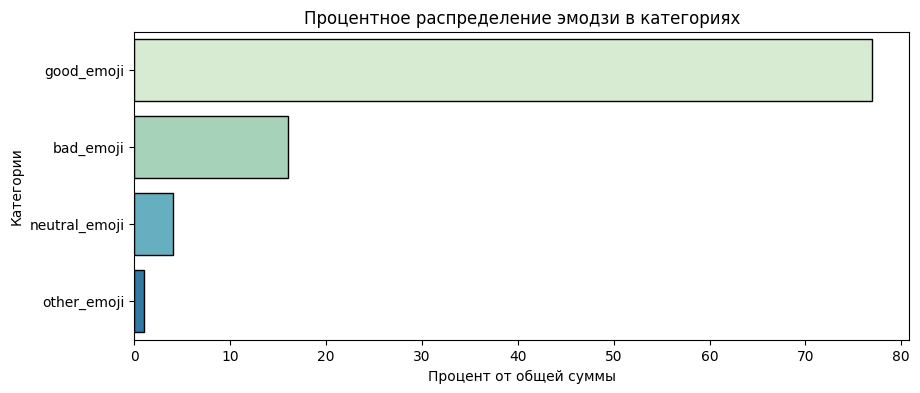

In [ ]:
# Создание диаграммы распределения категорий эмодзи в общем количестве (в %)
plt.figure(figsize=(10, 4))
sns.barplot(x='cnt_emoji_%', y='category_emoji', data=df_category_emoji, palette='GnBu', edgecolor = 'black')
plt.xlabel('Процент от общей суммы')
plt.ylabel('Категории')
plt.title('Процентное распределение эмодзи в категориях')
plt.show()

In [ ]:
# Применим функцию category_emoji_2 к датафрейму parsed_data
# Узнаем количество эмодзи в разрезе категорий по каждому посту
parsed_data['category_emoji'] = parsed_data['emoji'].apply(lambda x: category_emoji_2(x))
parsed_data_id = parsed_data.pivot_table(index=['id', 'category_emoji'], values='cnt_emoji', aggfunc='sum').reset_index()
parsed_data_id.head()

,id,category_emoji,cnt_emoji
0,22653,bad_emoji,19
1,22653,good_emoji,61
2,22655,bad_emoji,241
3,22655,good_emoji,44
4,22656,bad_emoji,30


In [ ]:
# Изменим структуру датафрейма parsed_data_id
parsed_data_id = parsed_data_id.pivot(index='id', columns='category_emoji')['cnt_emoji']
parsed_data_id = parsed_data_id.fillna(0)
parsed_data_id = parsed_data_id.reset_index()
parsed_data_id.columns = ['id', 'bad_emoji', 'good_emoji', 'neutral_emoji', 'other_emoji']
parsed_data_id.head()

,id,bad_emoji,good_emoji,neutral_emoji,other_emoji
0,22653,19.00000,61.00000,0.00000,0.00000
1,22655,241.00000,44.00000,0.00000,0.00000
2,22656,30.00000,40.00000,0.00000,0.00000
3,22657,10.00000,61.00000,0.00000,0.00000
4,22658,65.00000,184.00000,0.00000,0.00000


In [ ]:
# Объединим датафреймы posts и parsed_data_id
# Получим полную картину по каждому посту: текст, активности подписчиков, количество эмодзи в разрезе категорий
posts = pd.merge(posts, parsed_data_id, on = 'id', how = 'inner' )
posts.head(2)

,id,date,text,views,reactions,with_media,forwarded,replies,reactions_count,comments,type_attachment,year,text_clean,text_rubric,text_topic,count_words,count_symbol,count_emoji,cat_emoji,count_https,cat_https,count_punctuation,cat_punctuation,hour,bad_emoji,good_emoji,neutral_emoji,other_emoji
0,36843,2023-12-31 21:04:56,С годом даркона!,74390,"{'_': 'MessageReactions', 'results': [{'_': 'R...",only_text,47,"{'_': 'MessageReplies', 'replies': 29, 'replie...",738,29,only_text,2023,с годом даркона,вне_рубрики,прочие,3,15,0,0_emoji,0,0_https,1,1_5_punctuation,21,0.00000,612.00000,121.00000,5.00000
1,36839,2023-12-31 18:02:03,"Привет, это команда Кинопоиска. \n \nВ Новый...",87034,"{'_': 'MessageReactions', 'results': [{'_': 'R...","{'_': 'MessageMediaPhoto', 'spoiler': False, '...",12,"{'_': 'MessageReplies', 'replies': 31, 'replie...",1218,31,MessageMediaPhoto,2023,привет это команда кинопоиска в новый год прин...,вне_рубрики,подводим итоги (года),93,555,1,1_emoji,0,0_https,11,more_10_punctuation,18,0.00000,987.00000,222.00000,9.00000


In [ ]:
# Выведем топ-10 постов по количеству положительных и отрицательных эмоций
top_10_good_emoji = posts.sort_values(by='good_emoji', ascending=False)[['id', 'text', 'views', 'good_emoji']].head(10)
top_10_bad_emoji = posts.sort_values(by='bad_emoji', ascending=False)[['id', 'text', 'views','bad_emoji']].head(10)

print('Топ-10 постов по количеству положительных эмодзи')
print()
display(top_10_good_emoji)
print()
print('Топ-10 постов по количеству отрицательных эмодзи')
print()
display(top_10_bad_emoji)

Топ-10 постов по количеству положительных эмодзи



,id,text,views,good_emoji
1647,32799,5 тысяч сердечек на этом посте и мы ставим Кен...,72894,7685.00000
4381,27739,Привет! Этот текст пишет Антон из SMM команды ...,82651,7204.00000
98,36607,Гэри Олдман благодарит судьбу за «Гарри Поттер...,91394,6296.00000
1507,33123,Ушла эпоха!\n\n__Будете __[__скучать__](https:...,70984,5643.00000
1151,33980,«Барбигеймер» уже на «томатах»!\n\n__За кого б...,71598,4668.00000
1858,32383,Молодому киноману на фото сегодня 60!\n\nУзнал...,64051,3992.00000
770,34915,Нолан — гений! Теперь официально.\n\n__Рады за...,61134,3899.00000
858,34691,Кристофер Нолан — лучший режиссер последних 25...,49100,3470.00000
184,36361,Тони Старк больше не появится в фильмах Marvel...,85502,3236.00000
1329,33528,ААААААААААААА!\n\n__Ждете новый шедевр мастера...,68116,3113.00000



Топ-10 постов по количеству отрицательных эмодзи



,id,text,views,bad_emoji
467,35634,Умер звезда «Друзей» Мэттью Перри. Ему было 54...,62826,4907.00000
1543,33042,Перезапуск «Назад в будущее»? \n\nТаких планов...,66511,4760.00000
3571,29214,[Умер](https://deadline.com/2022/10/robbie-col...,73253,3975.00000
1492,33160,«Ведьмак» после ухода Генри Кавилла — почему?\...,53903,3150.00000
692,35108,Палочки вверх 🪄\n\n[Умер](https://www.theguard...,103949,3099.00000
1762,32569,Умерла актриса дубляжа Елена Шульман. Ей было ...,68379,2575.00000
717,35050,«Офис» [переснимут](https://t.me/kinopoisk_soo...,53472,2482.00000
1360,33474,Он просто устал! \n\n__Ждете сериал по любимой...,56132,2450.00000
427,35741,Джон Уик — точно всё 🪦\n\n«На текущий момент „...,51205,2377.00000
1367,33454,Все равно ждем!\n\n__А вы?\n__❤️—__ еще как\n_...,57174,2154.00000


In [ ]:
# Посчитаем к-ты корреляции между количеством просмотров и количеством положительных эмодзи по посту
posts[['id', 'views', 'good_emoji']].corr()

,id,views,good_emoji
id,1.00000,0.64058,0.33015
views,0.64058,1.00000,0.32737
good_emoji,0.33015,0.32737,1.00000


In [ ]:
# Посчитаем к-ты корреляции между количеством просмотров и количеством отрицательных эмодзи по посту
posts[['id', 'views', 'bad_emoji']].corr()

,id,views,bad_emoji
id,1.00000,0.64058,0.09470
views,0.64058,1.00000,0.13714
bad_emoji,0.09470,0.13714,1.00000


____________
____________
**Промежуточный вывод:**
- топ-3 эмодзи по общему количеству (за 2022-2023 гг.):
    - 👍	824808;
    - ❤	 673822;
    - 👎	230973;
- всего для выражения эмоций подписчики ТГК КиноПоиск используют 60 эмодзи;
- все эмодзи условно можно разделить на:
    - положительные (эмоции);
    - отрицательные (эмоции);
    - нейтральные (эмоции);
    - прочие эмодзи (не связанные с эмоциями);
- самые популярные - положительные эмодзи, они составляют 77% от общего количества эмодзи;
- выше выведены топ-10 постов с наибольшим количеством положительных и отрицательных эмодзи;
- корреляция между количеством просмотров и количеством положительных/отрицательных эмодзи - положительная слабовыраженная (0.33/0.14 соответственно).

**!!!Отрицательные эмодзи - это такие же активности подписчиков как и положительные, они связаны не  с ТГК Кинопоиск, а с содержанием конкретного поста.**

Наличие противоположных эмоций, вызванных постом, повышают активность пользователей, они начинают активнее общаться между собой в комментариях, увеличивая показатель вовлеченности аудитории.

____________
____________


### **3.5. Анализ метрик эффективности ТГК КиноПоиск (основной раздел)**

#### **3.5.00 Справка по метрикам и KPI (информационный подраздел)**

В рамках данной работы мы исследуем следующие метрики эффективности работы ТГК:

- количество постов за период;
- общее количесво подписчиков;
- приток подписчиков;
- отток подписчиков;
- месячный охват аудитории;
- средний охват одним постом;
- охват одного поста;
- реакции на один пост;
- ER - к-т вовлеченности по охвату (одного поста, за м-ц);
- ERR - к-т вовлеченности по общему кол-ву подписчиков (одного поста, за м-ц).

Глубина анализа:
- показатели, связанные с постами - 2022-2023 гг.
- показатели, связанные с пописчиками - 2023 г.

Ниже приведена справка с определение каждого показателя(метрики)



______________________________
______________________________
**Чем метрики отличаются от KPI.**

По сути, метрики и KPI — это определенные показатели эффективности.

***Разница между ними следующая:***

**Метрики** — это показатели, которые отображают фактические данные за выбранный период.

**KPI (Key Performance Indicators — ключевые показатели эффективности)** — показатели, которые помогают задать цели и оценить эффективность достижения нужных метрик.

_______________________

**!!!Стандарт KPI для ТГ еще не сформирован. Поэтому многие Telegram-бизнесмены ориентируются на количество подписчиков и «глаз»**
________________________
________________________

__________________
________________
**Метрики оценки ТГ канала:**

- **Метрики количества подписчиков:**

   - **общее количество подписчиков;**
   - **количество новых подписчиков (приток):**
количество новых пользователей, которые подписались на канал за определенный период времени.
   - **динамика количества подписчиков**
стабильный рост — хороший показатель, резкие скачки вверх - свидетельствуют о рекламе или накрутках, резкое снижение - может объясняться неудачной публикацией или тем, что ТГ удалил ботов.
   - **Конверсионная скорость:**  
отношение числа новых подписчиков к числу просмотров(посещений) канала.
   - **Количество подписчиков, покинувших канал (отток):**  
число подписчиков, которые отписались от канала за определенный период времени.

- **Метрики количества постов:** это количество постов, опубликованных за период день/неделю/месяц

- **Метрики вовлеченности:**

   - **количество просмотров постов/эмодзи/ комментариев/репостов**
это критерии вовлечённости аудитории.
   - **месячный охват аудитории**
это суммарное количество просмотров всех публикаций за месяц. Манипулировать этим показателем легко, хвастаться им — приятно, но на деле он практически бесполезен.
   - **средний охват одного поста (среднее количество просмотров поста)**
величина гораздо более показательная. Считается он так: охват всех постов на канале за 30 дней (без учета репостов из других каналов) и делим на количество постов.
   - **охват одного поста** - какое количество
уникальных просмотров (значок "глаза" у поста в телеграм канале) было у поста. Особенность подсчета этой метрики у телеграм - что считаются уникальные просмотры за день, если пользователь смотел пост два раза за два дня - это будет расценено как 2 просмотра.
   - **ERR (Engagement Rate by Reach) - коэффициент вовлечённости по охвату**
(кол-во реакций(комментарии, эмодзи, репосты)/охват(просмотры)*100)

    - 0-5% - канал либо заброшен, либо аудитория совсем мертвая.
    - 5-10% - большинство каналов в ТГ имеют такой показатель.
     - 10-20% - с этой границы каналы можно начать рассматривать для покупки, ВП или закупки рекламы
     - 20-50% - приличные каналы, как правило авторские, с прозранчной историей.
   - **ER (engagement rate) - коэффициент охвата** (кол-во реакций(комментарии, эмодзи, репосты)/количество подписчиков*100)

**!!!ER и ERR - инструмент для оценки эффективности контента, а не самоцель.**

- **Метрики качества контента:**
   - **индекс цитирования**
показатель авторитетности;
   - **уникальность контента;**
   - **Качество контента:**
реакции аудитории на опубликованный контент. Позволяет понять, какие типы контента (текстовые сообщения, изображения, видео, опросы и т.д.) наиболее эффективны для привлечения новых подписчиков.
___________________
__________________

**Дополнительные метрики**


- **CRR – это охватная эффективность канала.**

CRR = (Сумма охватов первые 24 часа / Число постов) / Общее число подписчиков * 100%
- **PRR – охватная эффективность поста**

PRR = (Охват одного поста / Число постов) / Общее число подписчиков * 100%
-  **GCR – контакт-эффективность всего канала.**

GCR = Суммарное количество просмотров за день / Число подписчиков × 100%

- **GPR – эффективность конкретной публикации.**

GPR = Просмотры конкретной публикации / Количество подписчиков × 100%

- **индекс цитирования (CCI)**

CCI = (Упоминания + Репосты) / Число публикаций в канале * 100%;

- **Post ADR**

долю аудитории у публикации за весь период ее «жизни» на канале. Позволяет сравнить эффективность постов и определить наиболее популярный контент и публикации, которые получают наименьший отклик у подписчиков.

Post ADR = («Глаз» / Количество дней с момента публикации) / Число подписчиков * 100%

- **1-Day Reach**.

Это охват в первые 24 часа после выкладывания поста на канал («глаз»);

#### **3.5.0. Создание рабочих функций (технический подраздел)**

In [ ]:
# Объявим функцию создания датафрейма с описательными статистиками столбца по месяцам
def month_describer(df, col):
    df0 = df[col].describe().to_frame().reset_index()
    df0.columns = ['indicator', 'all']
    for i in range(1, 13):
        df00 = df[df['month']==i][col].describe().to_frame().reset_index()
        df00.columns = ['indicator', i]
        df0 = df0.merge(df00)
    display(df0)

In [ ]:
def boxploter(df, col, x, y, title):
    data = [df[df['month']==i][col].to_list() for i in range(1, 13)]

    fig = plt.figure(figsize =(13, 4))
    ax = fig.add_subplot(111)
    bp = ax.boxplot(data, patch_artist = True, notch ='True', vert = 0)

    for whisker in bp['whiskers']: whisker.set(color ='#8B008B', linewidth = 1.5, linestyle =":")
    for cap in bp['caps']: cap.set(color ='#8B008B', linewidth = 3)
    for median in bp['medians']: median.set(color ='orange', linewidth = 3)
    for flier in bp['fliers']: flier.set(marker ='o', color ='red', linewidth = 0.6, alpha = 0.6)

    plt.title(title)
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    plt.xlabel(x)
    plt.ylabel(y)
    plt.show(bp)

    fig = plt.figure(figsize =(13, 3))
    ax = fig.add_subplot(111)
    bp = ax.boxplot(data, patch_artist = True, notch ='True', vert = 0, showfliers=False)

    for whisker in bp['whiskers']: whisker.set(color ='#8B008B', linewidth = 1.5, linestyle =":")
    for cap in bp['caps']: cap.set(color ='#8B008B', linewidth = 3)
    for median in bp['medians']: median.set(color ='orange', linewidth = 3)
    for flier in bp['fliers']: flier.set(marker ='o', color ='red', linewidth = 0.6, alpha = 0.6)

    plt.title(f'{title} (без выбросов)')
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    plt.xlabel(x)
    plt.ylabel(y)
    plt.show(bp)

#### **3.5.1. Метрика - количество публикаций (постов) в ТГК Кинопоиск(датафрейм posts)**

______________
Глубина анализа данного раздела: 2022-2023 гг.

Анализирумые показатели:
- количество постов за день;
- количество постов за месяц
______________

##### **3.5.1.1. Количество публикаций (постов) в ТГК Кинопоиск по дням**

____________
Данная метрика важна при анализе характера взаимодействия ТГК с подписчиками
____________________

In [ ]:
# Создадим столбец 'day' с датой - уберем время публикации
# Создадим столбец 'wod' с номером дня недели
# Создадим столбец 'hour' с часом публикации поста
# Создадим 2 столбца с месяцем публикации как периодом 'month' и с месяцем публикации как номером 'month_n'
posts['day'] = posts['date'].dt.date
posts['wod'] = posts['date'].dt.weekday
posts['hour'] = posts['date'].dt.hour
posts['month'] = posts['date'].dt.to_period("M")
posts['month_n'] = posts['date'].dt.month

In [ ]:
#Создадим датафрейм posts_stat_day - агрегируем по дням датафрейм posts
posts_stat_day = posts.groupby(['day', 'year', 'wod']).agg({'id':'count', 'views':'sum', 'reactions_count':'sum', 'comments':'sum', 'forwarded':'sum'}).reset_index()
posts_stat_day.columns = ['day', 'year', 'day_week', 'post_day', 'views_day', 'reactions_day', 'comments_day', 'forwarded_day']
posts_stat_day['avg_views_post'] = round(posts_stat_day['views_day']/posts_stat_day['post_day'])
posts_stat_day['avg_reactions_post'] = round(posts_stat_day['reactions_day']/posts_stat_day['post_day'])
posts_stat_day['avg_comments_post'] = round(posts_stat_day['comments_day']/posts_stat_day['post_day'])
posts_stat_day['avg_forwarded_post'] = round(posts_stat_day['forwarded_day']/posts_stat_day['post_day'])
posts_stat_day.head(2)

,day,year,day_week,post_day,views_day,reactions_day,comments_day,forwarded_day,avg_views_post,avg_reactions_post,avg_comments_post,avg_forwarded_post
0,2022-01-01,2022,5,7,202568,1270,103,973,28938.00000,181.00000,15.00000,139.00000
1,2022-01-02,2022,6,6,173651,1028,56,583,28942.00000,171.00000,9.00000,97.00000


In [ ]:
# Сгруппируем полученные данные по дням недели и годам, возьмем среднее значение показателей
posts_wod = posts_stat_day.groupby(['day_week', 'year']).agg({'post_day':'mean', 'views_day':'mean', 'reactions_day':'mean', 'comments_day':'mean', 'forwarded_day':'mean'}).astype('int').reset_index()
posts_wod

,day_week,year,post_day,views_day,reactions_day,comments_day,forwarded_day
0,0,2022,13,507411,3767,218,1754
1,0,2023,7,431291,4536,311,1558
2,1,2022,14,523361,3762,201,1822
3,1,2023,7,447880,4463,284,1662
4,2,2022,15,550940,3657,196,1919
5,2,2023,7,459055,4284,308,1699
6,3,2022,15,554501,3783,203,1940
7,3,2023,8,483126,3601,252,1696
8,4,2022,14,513333,3314,164,1608
9,4,2023,8,482100,3917,296,1577


In [ ]:
#Создадим датафрейм posts_stat_h - агрегируем по часам посты из датафрейма posts
posts_stat_h = posts.groupby(['year', 'day', 'hour']).agg({'id':'count', 'views':'sum', 'reactions_count':'sum', 'comments':'sum', 'forwarded':'sum'}).reset_index()
posts_stat_h = posts_stat_h.groupby(['year', 'hour']).agg({'id':'mean', 'views':'mean', 'reactions_count':'mean', 'comments':'mean', 'forwarded':'mean'}).reset_index()
posts_stat_h.head(2)

,year,hour,id,views,reactions_count,comments,forwarded
0,2022,0,4.00000,126663.00000,2050.00000,91.00000,748.50000
1,2022,1,2.50000,90005.00000,1151.50000,19.00000,539.50000


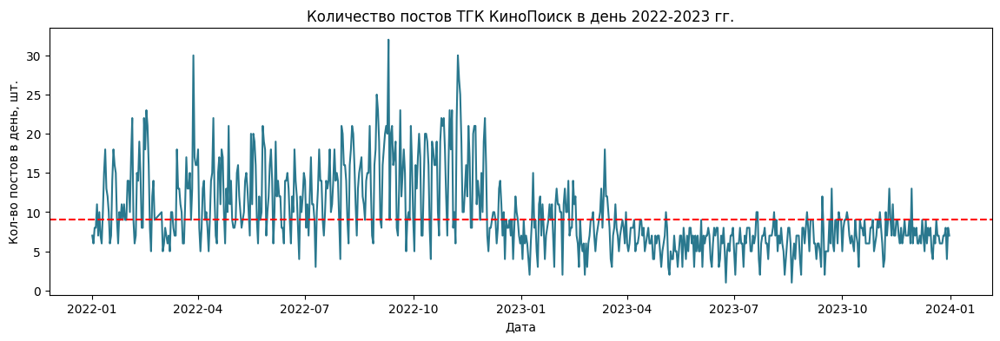

In [ ]:
# Построим график количество постов в день - 2022-2023 гг.
plt.figure(figsize=(14, 4))
plt.plot(posts_stat_day['day'], posts_stat_day['post_day'], color='#2A788EFF', label='Ср.количество реакций на пост')
plt.axhline(y = int(posts_stat_day['post_day'].mean()), color = 'r', linestyle = '--')

plt.title('Количество постов ТГК КиноПоиск в день 2022-2023 гг.')
plt.xlabel('Дата')
plt.ylabel('Кол-во постов в день, шт.')
plt.show()

In [ ]:
# Посмотрим описательную статистику количества постов по дням за 2022-2023 гг.
describe_posts = posts_stat_day[posts_stat_day['year']==2022]['post_day'].describe().to_frame().reset_index()
describe_posts = describe_posts.merge(posts_stat_day[posts_stat_day['year']==2023]['post_day'].describe().to_frame().reset_index(), on='index', suffixes=('_2022', '_2023'))
(
    describe_posts.set_index('index').drop('count', axis=0)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,post_day_2022,post_day_2023
index,,
mean,12.707521,7.002740
std,5.214475,2.437683
min,3.000000,1.000000
25%,9.000000,6.000000
50%,12.000000,7.000000
75%,16.000000,8.000000
max,32.000000,18.000000


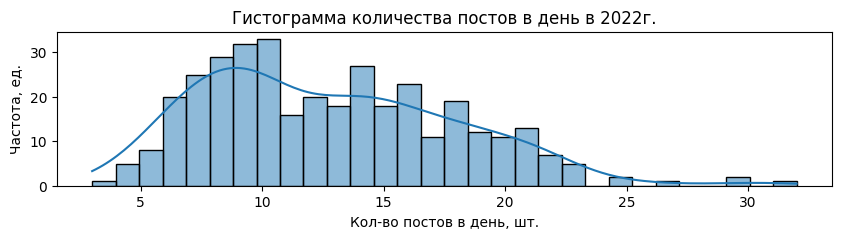

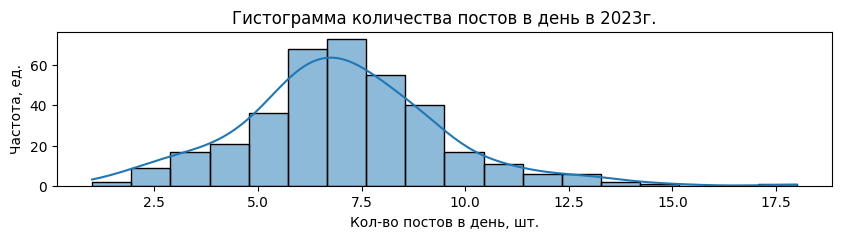

In [ ]:
# Построим гистограмму количества постов в день в 2022 гг.
plt.figure(figsize=(10, 2))
sns.histplot(x = posts_stat_day[posts_stat_day['year']==2022]['post_day'], bins=30, kde=True)
plt.title('Гистограмма количества постов в день в 2022г.')
plt.xlabel('Кол-во постов в день, шт.')
plt.ylabel('Частота, ед.')

# Построим гистограмму количества постов в день в 2023 гг.
plt.figure(figsize=(10, 2))
sns.histplot(x = posts_stat_day[posts_stat_day['year']==2023]['post_day'], bins=18, kde=True)
plt.title('Гистограмма количества постов в день в 2023г.')
plt.xlabel('Кол-во постов в день, шт.')
plt.ylabel('Частота, ед.')
plt.show()

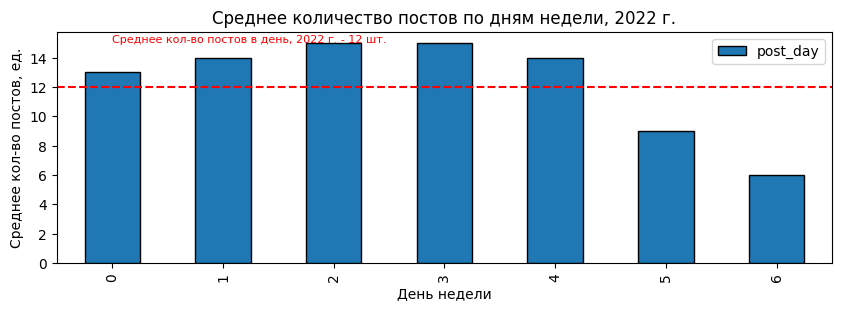

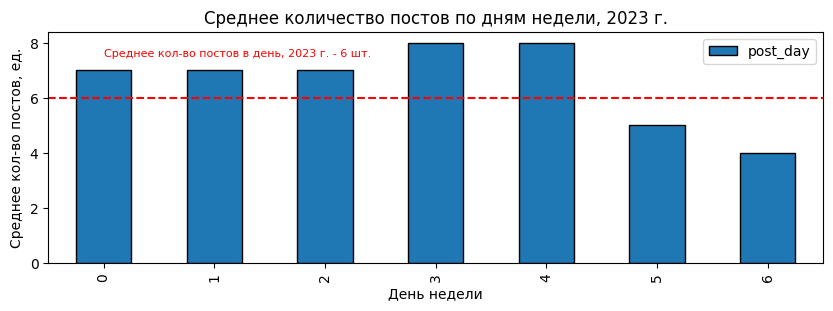

In [ ]:
# Построим график количество постов по дням недели, 2022 г.
a = int(posts_wod[posts_wod['year']==2022]['post_day'].mean())
a1 = int(posts_wod[posts_wod['year']==2023]['post_day'].mean())

posts_wod[posts_wod['year']==2022].plot(x = 'day_week', y = 'post_day', kind = 'bar', figsize=(10, 3), edgecolor = 'black')
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(0, 15, f'Среднее кол-во постов в день, 2022 г. - {a} шт.', fontsize=8, color="r")
plt.title('Среднее количество постов по дням недели, 2022 г.')
plt.xlabel('День недели')
plt.ylabel('Среднее кол-во постов, ед.')
plt.show()

# Построим график количество постов по дням недели, 2022 г.

posts_wod[posts_wod['year']==2023].plot(x = 'day_week', y = 'post_day', kind = 'bar', figsize=(10, 3), edgecolor = 'black')
plt.axhline(y = a1, color = 'r', linestyle = '--')
plt.text(0, 7.5, f'Среднее кол-во постов в день, 2023 г. - {a1} шт.', fontsize=8, color="r")
plt.title('Среднее количество постов по дням недели, 2023 г.')
plt.xlabel('День недели')
plt.ylabel('Среднее кол-во постов, ед.')
plt.show()

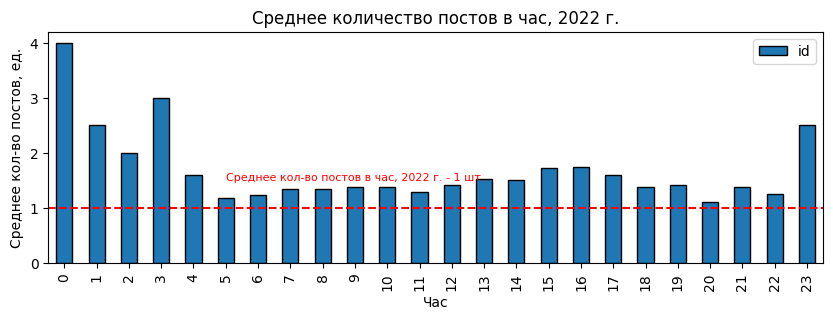

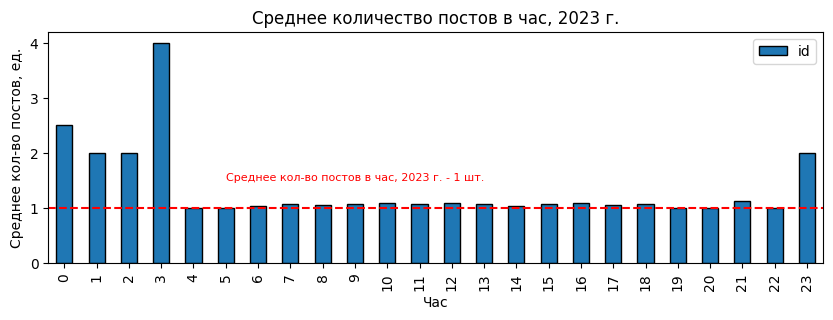

In [ ]:
# Построим график количество постов по часам публикации, 2022 г.
a = int(posts_stat_h[posts_stat_h['year']==2022]['id'].mean())
a1 = int(posts_stat_h[posts_stat_h['year']==2023]['id'].mean())

posts_stat_h[posts_stat_h['year']==2022].plot(x = 'hour', y = 'id', kind = 'bar', figsize=(10, 3), edgecolor = 'black')
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(5, 1.5, f'Среднее кол-во постов в час, 2022 г. - {a} шт.', fontsize=8, color="r")
plt.title('Среднее количество постов в час, 2022 г.')
plt.xlabel('Час')
plt.ylabel('Среднее кол-во постов, ед.')
plt.show()

# Построим график количество постов по дням недели, 2022 г.

posts_stat_h[posts_stat_h['year']==2023].plot(x = 'hour', y = 'id', kind = 'bar', figsize=(10, 3), edgecolor = 'black')
plt.axhline(y = a1, color = 'r', linestyle = '--')
plt.text(5, 1.5, f'Среднее кол-во постов в час, 2023 г. - {a1} шт.', fontsize=8, color="r")
plt.title('Среднее количество постов в час, 2023 г.')
plt.xlabel('Час')
plt.ylabel('Среднее кол-во постов, ед.')
plt.show()

__________
_________
**Промежуточный вывод:**
- среднее количество постов в день:
    - 2022 г. - 12;
    - 2023 г. - 7;
- минимальное количество постов в день:
    - 2022 г. - 3;
    - 2023 г. - 1;
- максимальное количество постов в день:
    - 2022 г. - 32;
    - 2023 г. - 18;
- std:
    - 2022 г. - 5.2;
    - 2023 г. - 2.4;
- наибольшее количество публикаций:
    - 2022 г. - среда, четверг;
    - 2023 г. - четверг, пятница;
- наименьшее количество публикаций:
    - 2022 г. - суббота, воскресение;
    - 2023 г. - суббота, воскресение.

Видно, что количество постов в 2023 г. уменьшилось по сравнению с 2023 гг.

Также сократился разброс количества постов, т.е. ТГК определился с оптимальным/достаточным количеством постов в день.

В субботу/воскресение авторы ТГК "отдыхают": количество постов почти в 2 раза меньше, чем на неделе.

Интерес аудитории ТГК подддерживает постоянно в течение дня:

раз в 1-2 часа выходит новая публикация.


_____________________
_________________

##### **3.5.1.2. Количество публикаций (постов) в ТГК Кинопоиск по месяцам**

____________
Данная метрика важна для оценки результатов деятельности ТГК и его сотрудников за отчетный период
____________________

In [ ]:
# Создадим сводную таблицу posts_stat с основными метриками эффективности ТГК по месяцам

posts_stat = posts.groupby('month').agg({'id':'count', 'views':'sum', 'reactions_count':'sum', 'comments':'sum', 'forwarded':'sum'}).reset_index()
posts_stat.columns = ['month', 'post_count_month', 'views_count_month', 'reactions_count_month', 'comments_count_month', 'forwarded_count_month']
posts_stat['avg_views_count_post'] = round(posts_stat['views_count_month']/posts_stat['post_count_month'])
posts_stat['avg_reactions_count_post'] = round(posts_stat['reactions_count_month']/posts_stat['post_count_month'])
posts_stat['avg_comments_count_post'] = round(posts_stat['comments_count_month']/posts_stat['post_count_month'])
posts_stat['avg_forwarded_count_post'] = round(posts_stat['forwarded_count_month']/posts_stat['post_count_month'])
posts_stat.head(2)

,month,post_count_month,views_count_month,reactions_count_month,comments_count_month,forwarded_count_month,avg_views_count_post,avg_reactions_count_post,avg_comments_count_post,avg_forwarded_count_post
0,2022-01,321,8841275,41579,4112,27953,27543.00000,130.00000,13.00000,87.00000
1,2022-02,312,8831323,34781,3722,25813,28306.00000,111.00000,12.00000,83.00000


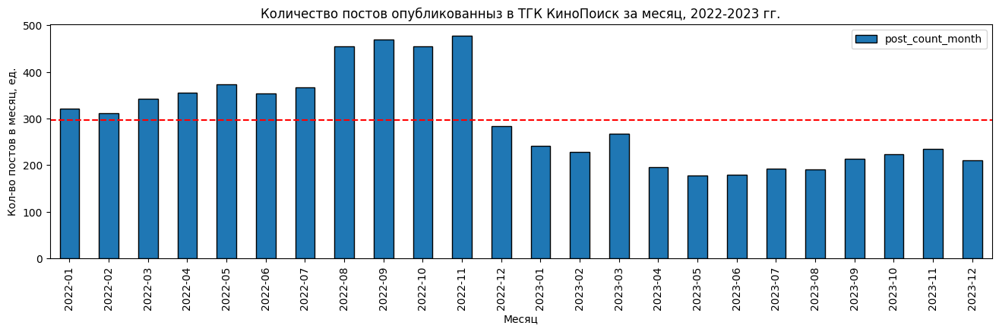

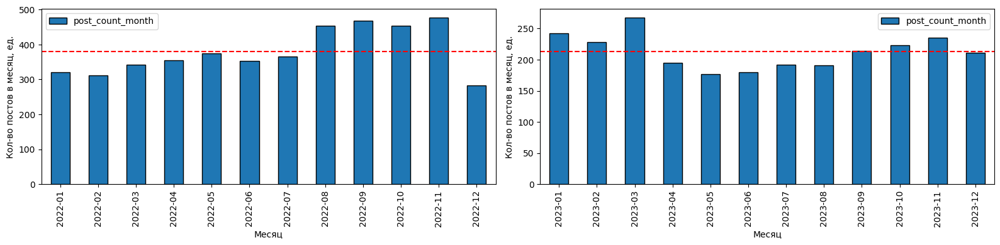

In [ ]:
# Построим график количество постов опубликованных на ТГК за месяц

posts_stat.plot(x = 'month', y = 'post_count_month', kind = 'bar', figsize=(16, 4), edgecolor = 'black')
plt.axhline(y = posts_stat['post_count_month'].mean(), color = 'r', linestyle = '--')
plt.title('Количество постов опубликованныз в ТГК КиноПоиск за месяц, 2022-2023 гг.')
plt.xlabel('Месяц')
plt.ylabel('Кол-во постов в месяц, ед.')
plt.show();

def plot_charts(df, col1, col2, ax):
    df.plot(x = col1, y = col2, kind = 'bar', edgecolor = 'black', ax=ax)
    ax.axhline(y = df[col2].mean(), color = 'r', linestyle = '--')
    ax.set_xlabel('Месяц')
    ax.set_ylabel('Кол-во постов в месяц, ед.')
    #ax.set_title(f'Кол-во постов {col[-4:]} г.', loc='center', size=12, color='darkblue', pad=80)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 4), sharey=False)

plot_charts(posts_stat.loc[posts_stat['month']<'2023-01'], 'month', 'post_count_month', axes[0])
plot_charts(posts_stat.loc[posts_stat['month']>'2022-12'], 'month', 'post_count_month', axes[1])

plt.tight_layout()
plt.show()

_______________
______________
**Промежуточный вывод:**

С точки зрения анализа количества постов на ТГК, месячная разбивка ничего нового не дает. Вся необходимая информация была получена в ходе анализа среднего количества постов за день.

Авторам ТГК можно выстовить kpi -количество постов за месяц и отслеживать его выполнение.
_______________
______________

#### **3.5.2. Метрики - общее количество за месяц и среднее количество за месяц  просмотров/реакций/комментариев/перепостов (постов) в ТГК Кинопоиск(датафрейм posts)**

##### **3.5.2.1. Количество просмотров постов в ТГК Кинопоиск за месяц (общее и среднедневное за месяц)**

In [ ]:
# Анализ проводим по датафрейму posts_stat за 2022-2023 гг.
posts_stat.head(2)

,month,post_count_month,views_count_month,reactions_count_month,comments_count_month,forwarded_count_month,avg_views_count_post,avg_reactions_count_post,avg_comments_count_post,avg_forwarded_count_post
0,2022-01,321,8841275,41579,4112,27953,27543.00000,130.00000,13.00000,87.00000
1,2022-02,312,8831323,34781,3722,25813,28306.00000,111.00000,12.00000,83.00000


In [ ]:
# Посмотрим описательную статистику кол-во просмотров за м-ц за 2022-2023 гг.
describe_views = posts_stat['views_count_month'].describe().to_frame().astype('int').reset_index()
describe_views = describe_views.merge(posts_stat['avg_views_count_post'].describe().to_frame().astype('int').reset_index(), on='index', suffixes=('_2022', '_2023'))
(
    describe_views.set_index('index').drop('count', axis=0)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,views_count_month,avg_views_count_post
index,,
mean,13602562,49357
std,2708274,14434
min,8831323,27543
25%,11747085,37684
50%,13172008,48184
75%,15642201,60812
max,18155955,84863


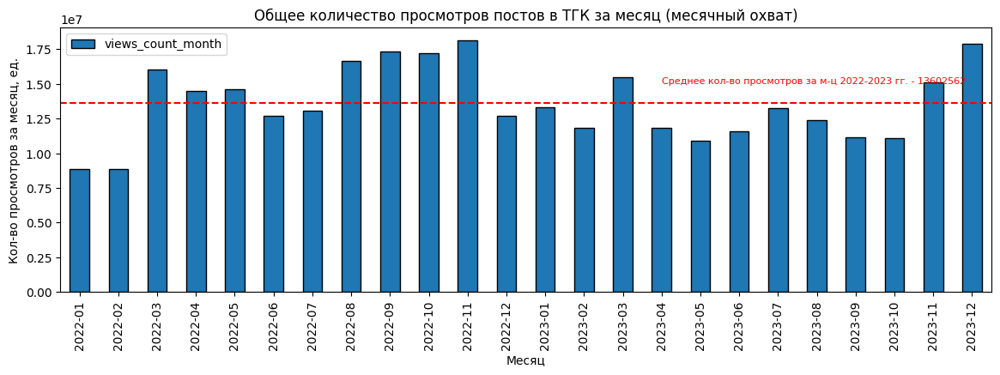

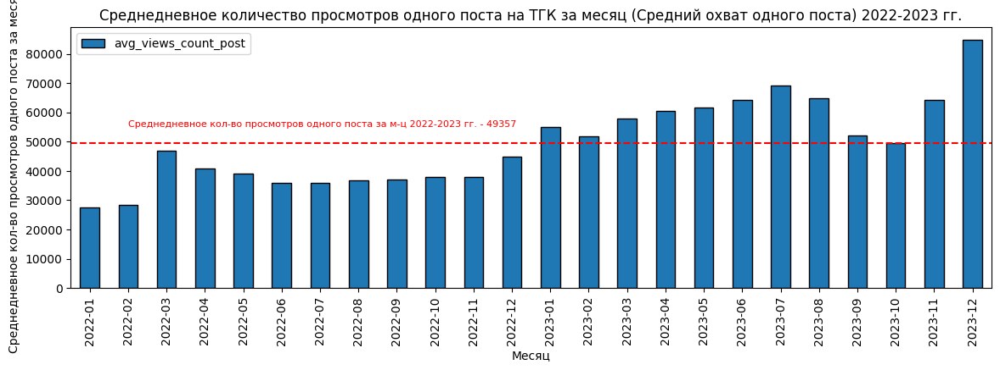

In [ ]:
# Построим график количество просмотров постов на ТГК за месяц (месячный охват)
a = int(posts_stat['views_count_month'].mean())
posts_stat.plot(x = 'month', y = 'views_count_month', kind = 'bar', figsize=(14, 4), edgecolor = 'black')
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(15, 15000000, f'Среднее кол-во просмотров за м-ц 2022-2023 гг. - {a}', fontsize=8, color="r")
plt.title('Общее количество просмотров постов в ТГК за месяц (месячный охват)')
plt.xlabel('Месяц')
plt.ylabel('Кол-во просмотров за месяц, ед.')
plt.show();

# Построим график среднедневное количество просмотров одного поста на ТГК за месяц

ax = plt.gca()
a = int(posts_stat['avg_views_count_post'].mean())
posts_stat.plot(x = 'month', y = 'avg_views_count_post', kind = 'bar', ax = ax, figsize=(14, 4), edgecolor = 'black')
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(1, 55000, f'Среднедневное кол-во просмотров одного поста за м-ц 2022-2023 гг. - {a}', fontsize=8, color="r")
plt.title('Среднедневное количество просмотров одного поста на ТГК за месяц (Средний охват одного поста) 2022-2023 гг.')
plt.xlabel('Месяц')
plt.ylabel('Среднедневное кол-во просмотров одного поста за месяц, ед.')
plt.show();

_____________
**Пояснение:**
Несколько не в тему к метрикам общего количества просмотров за м-ц и среднедневного количества просмотров за месяц.

Однако выведем топ-15 и антитоп-15 постов по количеству просмотров одного поста.
______________

In [ ]:
# Посмотрим топ=15 самых просматриваемых постов за 2022-2023 гг.
posts[['date', 'id', 'text', 'views']].sort_values(by='views', ascending=False).head(15)

,date,id,text,views
6389,2022-03-13 19:56:56,23729,Стали [известны](https://www.bafta.org/film/aw...,279115
402,2023-11-07 10:01:20,35809,💯 100. Великих. Фильмов. XXI века\n\nПредставл...,278962
295,2023-11-20 07:01:41,36059,Не выходи из комнаты и ешь сыр 🧀\n\nТаким реце...,272087
6317,2022-03-20 06:53:32,23834,Сегодня ночью в Лос-Анджелесе [вручили](https:...,264180
2205,2023-02-11 15:02:14,31733,Прямо сейчас общаемся в прямом эфире с Владисл...,244143
2207,2023-02-11 11:30:30,31731,"«Вавилон» — кино о кино, поэтому в нем много о...",239884
153,2023-12-09 07:30:17,36462,Журналист «Загадки дыры» пишет книгу о прошлом...,186321
6485,2022-02-23 17:20:11,23617,Netflix [объявил](https://youtu.be/N5BE2jbszzM...,149805
959,2023-08-18 09:33:57,34440,"«Когда мне предложили спеть за Супер-Кота, я с...",136156
113,2023-12-14 16:57:29,36570,Как звучали фильмы в немую эпоху? Почему Ян Ти...,131097


In [ ]:
# Посмотрим самые НЕпросмативаемые посты за 2023 г. (уберем 2022 г. так как там было меньше подписчиков)
posts[posts['year']==2023][['date', 'id', 'text', 'views']].sort_values(by='views').head(15)

,date,id,text,views
2185,2023-02-14 09:21:59,31772,Горшок и Князь на постере сериала «Король и Шу...,34256
2009,2023-03-10 10:01:40,32102,"Яндекс выпустил большое исследование, посвящен...",38139
556,2023-10-16 15:32:25,35420,"⚡️Принцесса Диана, принц Чарльз, Елизавета II ...",38228
552,2023-10-17 10:10:47,35434,"Постер «Мальчика и птицы» Хаяо Миядзаки, опубл...",38258
2007,2023-03-10 11:01:34,32109,До #Оскар2023 осталось три дня.\n\nПродолжаем ...,39046
551,2023-10-17 11:04:03,35435,Фанаты Майка Флэнагана тут? \n\nНа Netflix выш...,39082
585,2023-10-12 10:10:49,35351,26 октября состоится премьера первой серии дра...,39098
2255,2023-02-07 09:02:19,31642,Джон Красински поделился фото со съемок фильма...,39322
559,2023-10-16 11:53:49,35408,"На днях Майкл Кейн объявил, что уходит из кино...",39546
544,2023-10-18 10:59:26,35452,⚡️ Завершились съемки третьего сезона «Триггер...,39852


________________
**Пояснение:**
С ноября 2023 в ТГК Кинопоиск пришло рекордное количество подписчиков.

Возможно у них другие приоритеты, чем у "старой" аудитории.

Посмотри топ-15 по кол-ву просмотров постов за ноябрь-декабрь 2023 г.
_______________

In [ ]:
# Посмотрим топ=15 самых просматриваемых постов за ноябрь-декабрь 2022-2023 гг.
posts[posts['date']>='2023-11-01 00:00:00'][['date', 'id', 'text', 'views']].sort_values(by='views', ascending=False).head(15)

,date,id,text,views
402,2023-11-07 10:01:20,35809,💯 100. Великих. Фильмов. XXI века\n\nПредставл...,278962
295,2023-11-20 07:01:41,36059,Не выходи из комнаты и ешь сыр 🧀\n\nТаким реце...,272087
153,2023-12-09 07:30:17,36462,Журналист «Загадки дыры» пишет книгу о прошлом...,186321
113,2023-12-14 16:57:29,36570,Как звучали фильмы в немую эпоху? Почему Ян Ти...,131097
320,2023-11-16 16:00:23,35996,Большая статья о «Cпартаке»! ⚽️\n\nВ честь вых...,123790
21,2023-12-28 15:05:02,36784,"Прощай, 2023-й год! \n\nКаким он был для нас и...",116716
110,2023-12-15 08:30:06,36576,✅ [Итоги-2023 посмотрели](https://clck.ru/377F...,114707
387,2023-11-09 12:16:35,35839,"День рождения у Кинопоиска, а подарки — вам ❤️...",112558
35,2023-12-26 14:51:02,36740,Пацаны vs чушпаны 👊 \n\nПересмотрели «Слово па...,111365
19,2023-12-28 18:38:35,36788,"Фильм дня — [**«Рождество кота Боба»,**](https...",106635


In [ ]:
# Посмотрим топ=15 самых НЕпросматриваемых постов за ноябрь-декабрь 2022-2023 гг.
posts[posts['date']>='2023-11-01 00:00:00'][['date', 'id', 'text', 'views']].sort_values(by='views').head(15)

,date,id,text,views
441,2023-11-01 16:08:26,35705,Сегодня советуем вам посмотреть в Плюсе китайс...,43774
435,2023-11-02 08:31:46,35721,**⚡️**** Лучшая новость дня: финал **[**«Атаки...,43921
433,2023-11-02 10:55:25,35723,"Драма с Шайа ЛаБафом, жуткий «Звонок», док о ...",44362
437,2023-11-02 06:55:40,35719,"Лучший день — тот, что начинается на съемках 🎥...",44979
438,2023-11-01 21:24:28,35717,Вторая серия [**«Цикад»**](https://www.kinopoi...,46285
379,2023-11-10 08:11:01,35861,"Чем порадовать себя и близких, если вы обожает...",46559
440,2023-11-01 17:08:58,35711,"Ровно пять лет назад закончился «Физрук», пода...",46734
377,2023-11-10 09:49:02,35871,"Два, три, Юра, приди!",46824
425,2023-11-03 09:30:57,35743,Вы только поглядите на них 😭💕\n\nЭти красотки ...,47190
365,2023-11-11 09:01:16,35896,Барагозин — фанат «Терминатора»! \n\nГригорий ...,47465


___________
_________
**Промежуточный вывод:**
- показатель общее количество просмотров впечатляет, но мало что объясняет (показатель не учитывает ни изменения кол-ва постов, ни изменения количества подписчиков):
   - среднее за 2022-2023 гг. кол-во просмотров за месяц - 13 602 562 шт. в месяц;
   - ярко враженной тенденции в общем кол-ве просмотров за месяц нет, уже 2 года этот показатель находится в диапозоне - от 9 до 18 млн. шт в месяц;
- среднедневное количество просмотров одного поста на ТГК за месяц (этот показатель уже учитывает динамику изменения количества постов):
   - среднее значение показателя за 2022-2023 гг - 49 357;
   - в 2023 г. показатель выше, чем в 2022 г.

Причину существенной разницы между количеством просмотров отдельных постов объяснить сложно...это субъективное восприятие аудитории. Обобщенные показатели дают нам более объективную картину.

Однако данные абсолютные показатели не учитывают другие факторы - количество постов, численность аудитории - поэтому далее мы проанализируем более "интересные" (информативные) показатели.

Из-за низкой информативности не будем рекомендовать показатели общее количество просмотров на месяц и среднедневное количество просмотров за месяц в качестве KPI ТГК КиноПоиск.


____________
_______________

##### **3.5.2.2. Количество реакций подписчиков на посты в ТГК Кинопоиск за месяц (датафрейм posts)**

In [ ]:
# Анализ проводим по датафрейму posts_stat за 2022-2023 гг.
posts_stat.head(2)

,month,post_count_month,views_count_month,reactions_count_month,comments_count_month,forwarded_count_month,avg_views_count_post,avg_reactions_count_post,avg_comments_count_post,avg_forwarded_count_post
0,2022-01,321,8841275,41579,4112,27953,27543.00000,130.00000,13.00000,87.00000
1,2022-02,312,8831323,34781,3722,25813,28306.00000,111.00000,12.00000,83.00000


In [ ]:
# Посмотрим описательную статистику кол-во реакций за м-ц за 2022-2023 гг.
describe_reactions = posts_stat['reactions_count_month'].describe().to_frame().astype('int').reset_index()
describe_reactions = describe_reactions.merge(posts_stat['avg_reactions_count_post'].describe().to_frame().astype('int').reset_index(), on='index', suffixes=('_2022', '_2023'))
(
    describe_reactions.set_index('index').drop('count', axis=0)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,reactions_count_month,avg_reactions_count_post
index,,
mean,106091,395
std,27864,156
min,34781,111
25%,93225,267
50%,103926,364
75%,125299,535
max,156119,630


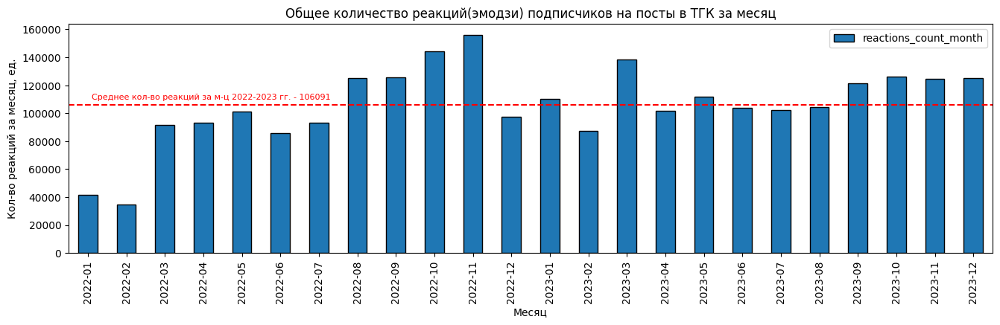

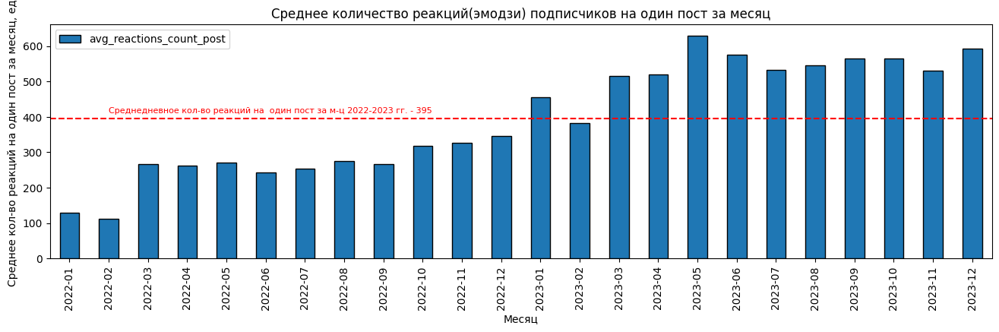

In [ ]:
# Построим график количество реакций подписчиков на посты в ТГК за месяц
a = int(posts_stat['reactions_count_month'].mean())
posts_stat.plot(x = 'month', y = 'reactions_count_month', kind = 'bar', figsize=(16, 4), edgecolor = 'black')
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(0.1, 110000, f'Среднее кол-во реакций за м-ц 2022-2023 гг. - {a}', fontsize=8, color="r")
plt.title('Общее количество реакций(эмодзи) подписчиков на посты в ТГК за месяц')
plt.xlabel('Месяц')
plt.ylabel('Кол-во реакций за месяц, ед.')
plt.show();

# Построим график среднее количество реакций подписчиков на один пост за месяц
a = int(posts_stat['avg_reactions_count_post'].mean())
posts_stat.plot(x = 'month', y = 'avg_reactions_count_post', kind = 'bar', figsize=(16, 4), edgecolor = 'black')
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(1, 410, f'Среднедневное кол-во реакций на  один пост за м-ц 2022-2023 гг. - {a}', fontsize=8, color="r")
plt.title('Среднее количество реакций(эмодзи) подписчиков на один пост за месяц')
plt.xlabel('Месяц')
plt.ylabel('Среднее кол-во реакций на один пост за месяц, ед.')
plt.show();

In [ ]:
# Посмотрим топ=15 постов с наибольшим кол-вом реакций за 2022-2023 гг.
posts[['date', 'id', 'text', 'reactions_count']].sort_values(by='reactions_count', ascending=False).head(15)

,date,id,text,reactions_count
1647,2023-04-26 12:15:34,32799,5 тысяч сердечек на этом посте и мы ставим Кен...,8012
4381,2022-08-22 13:40:57,27739,Привет! Этот текст пишет Антон из SMM команды ...,7245
1507,2023-05-22 13:22:32,33123,Ушла эпоха!\n\n__Будете __[__скучать__](https:...,6529
98,2023-12-17 07:02:01,36607,Гэри Олдман благодарит судьбу за «Гарри Поттер...,6311
467,2023-10-29 01:14:56,35634,Умер звезда «Друзей» Мэттью Перри. Ему было 54...,5190
1543,2023-05-16 08:14:36,33042,Перезапуск «Назад в будущее»? \n\nТаких планов...,5026
1151,2023-07-19 17:03:33,33980,«Барбигеймер» уже на «томатах»!\n\n__За кого б...,4939
184,2023-12-04 13:38:21,36361,Тони Старк больше не появится в фильмах Marvel...,4770
3571,2022-10-14 17:03:35,29214,[Умер](https://deadline.com/2022/10/robbie-col...,4334
466,2023-10-29 09:11:18,35635,"Прощай, любимый Чендлер 💔\n\nМы тебя не забудем.",4332


In [ ]:
# Посмотрим топ=15 постов с наименьшим кол-вом реакций за 2022-2023 гг.
posts[['date', 'id', 'text', 'reactions_count']].sort_values(by='reactions_count').head(15)

,date,id,text,reactions_count
6803,2022-01-31 15:15:18,23132,"Не забываем, что наш #подкаст можно слушать и ...",6
6279,2022-03-23 10:32:29,23887,Слушайте этот #подкаст прямо в Telegram.,11
6713,2022-02-07 16:55:24,23267,Слушайте этот #подкаст прямо в Telegram!,12
6615,2022-02-14 16:02:07,23402,"Telegram — еще одно место, где можно включить ...",14
6692,2022-02-09 10:47:17,23290,Не отходя от кассы: слушайте этот #подкаст пря...,15
6504,2022-02-22 08:05:15,23584,"Слушайте этот #подкаст прямо тут, в Telegram.",16
6760,2022-02-03 15:33:40,23197,Слушайте #подкаст прямо в Telegram.,17
6873,2022-01-24 16:05:10,23029,Не смотрите по сторонам — только в наш Telegra...,17
7085,2022-01-05 09:01:25,22707,"#подкаст можно слушать прямо здесь, как и всег...",17
6959,2022-01-17 15:15:16,22890,Чуть не забыли: наш #подкаст доступен и в Tele...,18


________________
**Пояснение:**
С ноября 2023 в ТГК Кинопоиск пришло рекордное количество подписчиков.

Возможно у них другие приоритеты, чем у "старой" аудитории.

Посмотри топ-15 по кол-ву реакций на один пост за ноябрь-декабрь 2023 г.
_______________

In [ ]:
# Посмотрим топ=15 самых "реактивных" постов за ноябрь-декабрь 2022-2023 гг.
posts[posts['date']>='2023-11-01 00:00:00'][['date', 'id', 'text', 'reactions_count']].sort_values(by='reactions_count', ascending=False).head(15)

,date,id,text,reactions_count
98,2023-12-17 07:02:01,36607,Гэри Олдман благодарит судьбу за «Гарри Поттер...,6311
184,2023-12-04 13:38:21,36361,Тони Старк больше не появится в фильмах Marvel...,4770
334,2023-11-14 18:31:59,35970,Мэтт Леблан попрощался с покойным Мэттью Перри...,3292
427,2023-11-03 07:53:35,35741,Джон Уик — точно всё 🪦\n\n«На текущий момент „...,3110
244,2023-11-27 07:00:16,36183,Кристофер Нолан защищает франшизы!\n\n«Это важ...,2737
232,2023-11-28 13:19:24,36207,Кого [представляет](https://www.gamesradar.com...,2726
247,2023-11-26 14:30:45,36177,Николас Кейдж [устал](https://www.cbr.com/nico...,2474
406,2023-11-07 07:59:52,35805,Сэр Ридли Скотт жжет! \n\n«Займитесь своей жиз...,2406
299,2023-11-19 13:01:39,36052,Ридли Скотт против историков!\n\nРежиссер «Нап...,2304
180,2023-12-05 09:18:23,36369,Зима. Ожидание: 🎄⛄️🥳\n\nЗима. Реальность: 😴🥵💔\...,2040


In [ ]:
# Посмотрим топ=15 самых "НЕреактивных" постов за ноябрь-декабрь 2022-2023 гг.
posts[posts['date']>='2023-11-01 00:00:00'][['date', 'id', 'text', 'reactions_count']].sort_values(by='reactions_count').head(15)

,date,id,text,reactions_count
364,2023-11-11 10:02:24,35897,**Свежий дайджест подкастов Кинопоиска! Что вы...,92
305,2023-11-18 13:17:22,36040,"**Свежий дайджест подкастов! Рассказываем, что...",99
200,2023-12-02 11:01:50,36300,**Свежий дайджест подкастов Кинопоиска! Что вы...,104
13,2023-12-30 08:01:33,36809,**Последний дайджест наших** **подкастов в это...,115
354,2023-11-12 15:32:34,35915,"Кстати, подписывайтесь на наш [«Плюс Фандом»](...",120
357,2023-11-12 11:01:02,35907,Первый сезон «30 сребреников» принес испанском...,122
257,2023-11-25 09:01:29,36158,"**Свежий дайджест подкастов! Рассказываем, что...",133
419,2023-11-04 09:01:31,35769,**Свежий дайджест подкастов Кинопоиска! Что вы...,134
277,2023-11-22 15:35:15,36103,**Простой способ сохранить сознание! Надо всег...,140
323,2023-11-16 12:02:04,35993,Что значит быть молодым? Отвечают актеры [сери...,143


___________
_________
**Промежуточный вывод:**
- показатель общее количество реакций малоинформативен (показатель не учитывает ни изменения кол-ва постов, ни изменения количества подписчиков):
   - среднее за 2022-2023 гг. кол-во реакций за месяц - 106 091 шт. в месяц;
   - количество реакций в 2023 г. меньше, чем в 2022 г.;
- среднедневное количество реакций на один пост  ТГК за месяц (этот показатель уже учитывает динамику изменения количества постов):
   - среднее значение показателя за 2022-2023 гг - 395 шт.;
   - в 2023 г. показатель выше, чем в 2022 г.

Причину существенной разницы между количеством реакций на отдельные посты объяснить сложно...это субъективное восприятие аудитории. Обобщенные показатели дают нам более объективную картину.

Однако данные абсолютные показатели не учитывают другие факторы - количество постов, численность аудитории - поэтому далее мы проанализируем более "интересные" (информативные) показатели.

Из-за низкой информативности не будем рекомендовать показатели общее количество реакций за месяц и среднедневное количество реакций за месяц в качестве KPI ТГК КиноПоиск.

Полезно просматривать ТОП/антиТОП по кол-ву реакций постов на период (месяц, неделя, день). Это показатель обратной реакции аудитории.
____________
_______________

##### **3.5.2.3. Количество комментариев подписчиков на посты в ТГК Кинопоиск за месяц (датафрейм posts)**

In [ ]:
# Анализ проводим по датафрейму posts_stat за 2022-2023 гг.
posts_stat.head(2)

,month,post_count_month,views_count_month,reactions_count_month,comments_count_month,forwarded_count_month,avg_views_count_post,avg_reactions_count_post,avg_comments_count_post,avg_forwarded_count_post
0,2022-01,321,8841275,41579,4112,27953,27543.00000,130.00000,13.00000,87.00000
1,2022-02,312,8831323,34781,3722,25813,28306.00000,111.00000,12.00000,83.00000


In [ ]:
# Посмотрим описательную статистику кол-во комментариев за м-ц за 2022-2023 гг.
describe_comments = posts_stat['comments_count_month'].describe().to_frame().astype('int').reset_index()
describe_comments = describe_comments.merge(posts_stat['avg_comments_count_post'].describe().to_frame().astype('int').reset_index(), on='index', suffixes=('_2022', '_2023'))
(
    describe_comments.set_index('index').drop('count', axis=0)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,comments_count_month,avg_comments_count_post
index,,
mean,7115,28
std,3250,16
min,0,0
25%,6441,16
50%,7906,28
75%,9528,42
max,11335,55


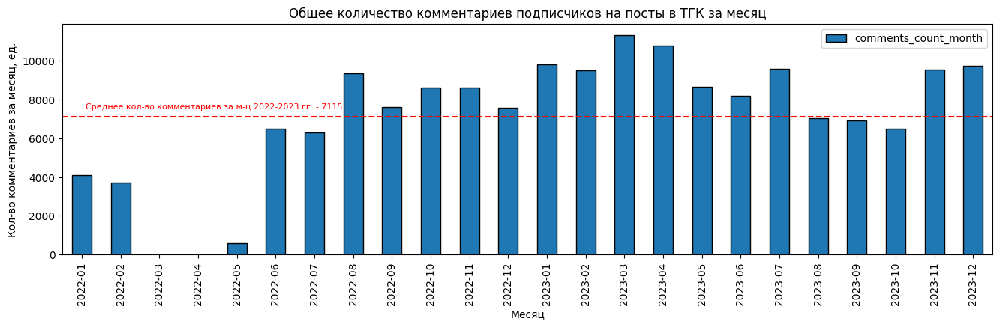

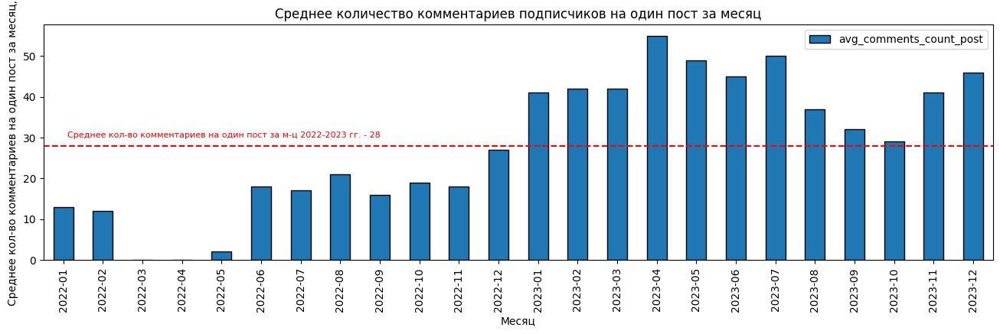

In [ ]:
# Построим график количество комментариев подписчиков на посты в ТГК за месяц
a = int(posts_stat['comments_count_month'].mean())
posts_stat.plot(x = 'month', y = 'comments_count_month', kind = 'bar', figsize=(16, 4), edgecolor = 'black')
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(0.1, 7500, f'Среднее кол-во комментариев за м-ц 2022-2023 гг. - {a}', fontsize=8, color="r")
plt.title('Общее количество комментариев подписчиков на посты в ТГК за месяц')
plt.xlabel('Месяц')
plt.ylabel('Кол-во комментариев за месяц, ед.')
plt.show();

# Построим график среднее количество комментариев подписчиков на один пост за месяц
a = int(posts_stat['avg_comments_count_post'].mean())
posts_stat.plot(x = 'month', y = 'avg_comments_count_post', kind = 'bar', figsize=(16, 4), edgecolor = 'black')
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(0.1, 30, f'Среднее кол-во комментариев на один пост за м-ц 2022-2023 гг. - {a}', fontsize=8, color="r")
plt.title('Среднее количество комментариев подписчиков на один пост за месяц')
plt.xlabel('Месяц')
plt.ylabel('Среднее кол-во комментариев на один пост за месяц, ед.')
plt.show();

In [ ]:
# Посмотрим топ=15 постов с наибольшим кол-вом комментариев за 2022-2023 гг.
posts[['date', 'id', 'text', 'comments']].sort_values(by='comments', ascending=False).head(15)

,date,id,text,comments
1467,2023-05-28 09:07:40,33211,Ждем ваши ответы в комментах 👀,1010
1664,2023-04-23 10:03:55,32763,Ждем ваши ответы в комментах 👀,1010
1700,2023-04-17 17:02:03,32698,"Флешмоб! \n\nВыложите постер фильма, который в...",985
1690,2023-04-19 10:50:57,32709,"Покажите сцену из фильма, во время которой вы ...",749
2139,2023-02-18 18:01:35,31859,Ждем ответы в комментариях 🙌,721
2104,2023-02-25 16:01:57,31932,Ждем ответы в комментариях 💿,682
1436,2023-06-02 16:00:41,33290,Пятничная флудилка? Почему нет!\n\nСегодня всп...,599
1513,2023-05-20 16:02:27,33104,Ждем ваши ответы в комментах 🐳,583
1758,2023-04-09 16:31:20,32573,Ждем ваши ответы в комментариях 🙃,568
1807,2023-04-02 15:30:37,32487,Ждем ваши ответы в комментариях 🎞,567


In [ ]:
# Посмотрим топ=15 постов с наименьшим кол-вом комментариев за 2022-2023 гг.
posts[['date', 'id', 'text', 'comments']].sort_values(by='comments').head(15)

,date,id,text,comments
5732,2022-05-05 17:00:46,24778,"«Как бы Рэйми ни пытался показать, что он полу...",0
5895,2022-04-22 07:02:57,24475,[Трейлер](https://youtu.be/aoYXtKF_g1Y) сериал...,0
5896,2022-04-22 06:30:10,24473,National Geographic [поставил](https://www.blo...,0
5897,2022-04-22 05:52:59,24472,Студия Searchlight приостановила съемки фильма...,0
5898,2022-04-21 18:47:42,24471,К выходу на Кинопоиске в Плюсе всех частей фра...,0
5899,2022-04-21 17:52:16,24470,В основной конкурс Каннского кинофестиваля доб...,0
5473,2022-05-27 11:27:11,25282,Что показали и рассказали на ивенте Star Wars ...,0
5900,2022-04-21 16:15:31,24467,Первые кадры из фильма «Голова паука» (Spiderh...,0
5894,2022-04-22 07:30:36,24476,Каждый эпизод четвертого сезона «Очень странны...,0
5901,2022-04-21 15:30:51,24466,[Трейлер](https://youtu.be/pDuKaZkWClA) сериал...,0


________________
**Пояснение:**
С ноября 2023 в ТГК Кинопоиск пришло рекордное количество подписчиков.

Возможно у них другие приоритеты, чем у "старой" аудитории.

Посмотри топ-15 по кол-ву комментариев на один пост за ноябрь-декабрь 2023 г.
_______________

In [ ]:
# Посмотрим топ=15 самых комментируемых постов за ноябрь-декабрь 2022-2023 гг.
posts[posts['date']>='2023-11-01 00:00:00'][['date', 'id', 'text', 'comments']].sort_values(by='comments', ascending=False).head(15)

,date,id,text,comments
361,2023-11-11 14:01:35,35900,"Друзья, у нас конкурс!\n\nДано: 100 великих фи...",487
96,2023-12-17 13:20:53,36609,Ждем ответы в комментах 🎄\n\n🔥 Подписывайтесь ...,401
414,2023-11-04 19:45:29,35782,Они пришли. \n\nФинал [«Атаки титанов»](https:...,379
246,2023-11-26 16:54:34,36178,Кинобитва года! Давайте решим ее в комментах р...,335
297,2023-11-19 17:01:50,36054,Ждем ваши ответы в комментах!\n\n🎬 Подписывайт...,304
172,2023-12-06 13:18:41,36390,"Мы точно знаем, что вы ждали эту новость! ☄️\n...",290
356,2023-11-12 11:32:16,35908,Называем главный фильм в комментах прямо сейча...,288
412,2023-11-05 12:59:59,35784,"Ну что, обсудим грандиозный финал [**«Атаки ти...",273
94,2023-12-18 07:34:05,36614,Опишите ваше понедельничное настроение одним к...,239
48,2023-12-24 16:02:20,36706,Главный вопрос прямо сейчас 🎞\n\n🔥 Подписывайт...,213


_________
**Комментарий:**

аудитория реагирует на призывы оставлять комментарии!!!

аудитория реагирует на обращение - "Друзья"!!!

т.о., авторы ТГК могут "создавать" обратную реакцию подписчиков, создавать ощущение сопричастности...
___________

In [ ]:
# Посмотрим топ=15 самых НЕкомментируемых постов за ноябрь-декабрь 2022-2023 гг.
posts[posts['date']>='2023-11-01 00:00:00'][['date', 'id', 'text', 'comments']].sort_values(by='comments').head(15)

,date,id,text,comments
323,2023-11-16 12:02:04,35993,Что значит быть молодым? Отвечают актеры [сери...,0
257,2023-11-25 09:01:29,36158,"**Свежий дайджест подкастов! Рассказываем, что...",0
13,2023-12-30 08:01:33,36809,**Последний дайджест наших** **подкастов в это...,0
313,2023-11-17 14:40:49,36007,«Для фанатов Гондри фильм будет настоящим пода...,1
364,2023-11-11 10:02:24,35897,**Свежий дайджест подкастов Кинопоиска! Что вы...,1
419,2023-11-04 09:01:31,35769,**Свежий дайджест подкастов Кинопоиска! Что вы...,2
216,2023-11-30 07:31:56,36251,"Странно, неуютно, но ужасно смешно. \n\nТак мо...",2
305,2023-11-18 13:17:22,36040,"**Свежий дайджест подкастов! Рассказываем, что...",2
178,2023-12-05 13:50:22,36371,"«Музыкальный редактор Кристофер Брукс, работав...",3
55,2023-12-23 15:02:03,36695,"**Скорсезе, чушпаны, Сокуров и финал «Короны» ...",3


___________
_________
**Промежуточный вывод:**
- показатель общее количество комментариев малоинформативен (показатель не учитывает ни изменения кол-ва постов, ни изменения количества подписчиков):
   - среднее за 2022-2023 гг. кол-во комментариев за месяц - 7 115 шт. в месяц;
   - количество комментариев в 2023 г. больше, чем в 2022 г.;
- среднедневное количество комментариев на один пост  ТГК за месяц (этот показатель уже учитывает динамику изменения количества постов):
   - среднее значение показателя за 2022-2023 гг - 28 шт.;
   - в 2023 г. показатель выше, чем в 2022 г.

Причину существенной разницы между количеством комментариев на отдельные посты объяснить сложно...это субъективное восприятие аудитории. Обобщенные показатели дают нам более объективную картину.

Однако данные абсолютные показатели не учитывают другие факторы - количество постов, численность аудитории - поэтому далее мы проанализируем более "интересные" (информативные) показатели.

Из-за низкой информативности **не будем рекомендовать показатели общее количество комментариев за месяц и среднедневное количество комментариев за месяц в качестве KPI** ТГК КиноПоиск.

Полезно просматривать ТОП/антиТОП по кол-ву комментариев постов на период (месяц, неделя, день). Это показатель обратной реакции аудитории. **!!!** Но есть нюанс - **вступая в диалог между собой подписчики создают комментарии, несвязанные непостредственно с постом**.
____________
____________

##### **3.5.2.4. Количество пересылок постов подписчиками  в ТГК Кинопоиск за месяц (датафрейм posts)**

In [ ]:
# Анализ проводим по датафрейму posts_stat за 2022-2023 гг.
posts_stat.head(2)

,month,post_count_month,views_count_month,reactions_count_month,comments_count_month,forwarded_count_month,avg_views_count_post,avg_reactions_count_post,avg_comments_count_post,avg_forwarded_count_post
0,2022-01,321,8841275,41579,4112,27953,27543.00000,130.00000,13.00000,87.00000
1,2022-02,312,8831323,34781,3722,25813,28306.00000,111.00000,12.00000,83.00000


In [ ]:
# Посмотрим описательную статистику кол-во пересылок за м-ц за 2022-2023 гг.
describe_forwarded = posts_stat['forwarded_count_month'].describe().to_frame().astype('int').reset_index()
describe_forwarded = describe_forwarded.merge(posts_stat['avg_forwarded_count_post'].describe().to_frame().astype('int').reset_index(), on='index', suffixes=('_2022', '_2023'))
(
    describe_forwarded.set_index('index').drop('count', axis=0)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,forwarded_count_month,avg_forwarded_count_post
index,,
mean,45687,164
std,11908,52
min,25813,83
25%,37731,129
50%,44843,165
75%,50910,185
max,70705,331


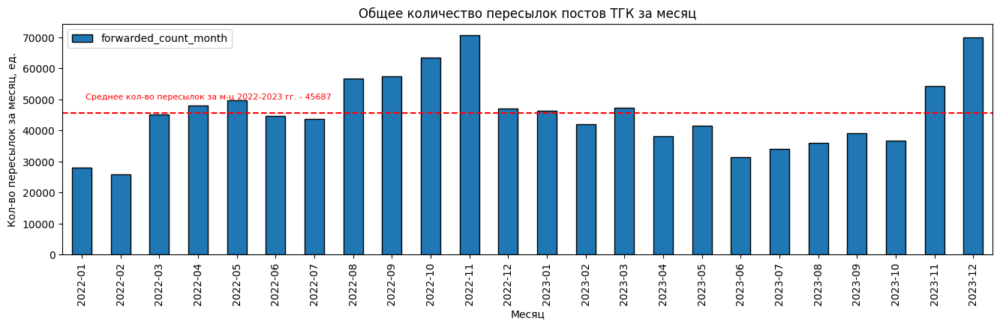

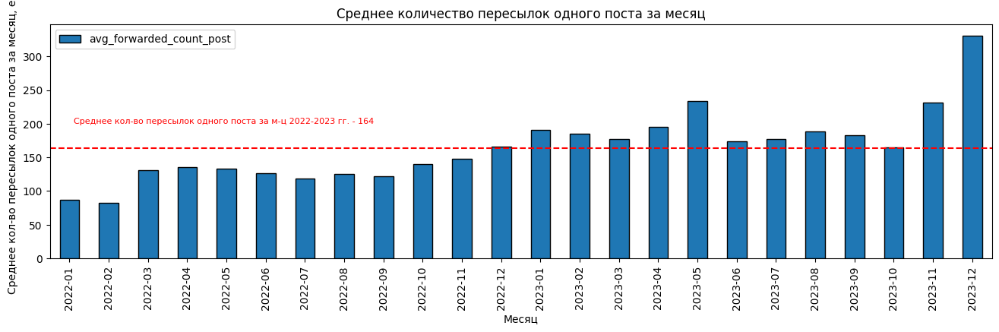

In [ ]:
# Построим график количество пересылок постов ТГК за месяц
a = int(posts_stat['forwarded_count_month'].mean())
posts_stat.plot(x = 'month', y = 'forwarded_count_month', kind = 'bar', figsize=(16, 4), edgecolor = 'black')
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(0.1, 50000, f'Среднее кол-во пересылок за м-ц 2022-2023 гг. - {a}', fontsize=8, color="r")
plt.title('Общее количество пересылок постов ТГК за месяц')
plt.xlabel('Месяц')
plt.ylabel('Кол-во пересылок за месяц, ед.')
plt.show();

# Построим график среднее количество пересылок на один пост за месяц
a = int(posts_stat['avg_forwarded_count_post'].mean())
posts_stat.plot(x = 'month', y = 'avg_forwarded_count_post', kind = 'bar', figsize=(16, 4), edgecolor = 'black')
plt.axhline(y = a, color = 'r', linestyle = '--')
plt.text(0.1, 200, f'Среднее кол-во пересылок одного поста за м-ц 2022-2023 гг. - {a}', fontsize=8, color="r")
plt.title('Среднее количество пересылок одного поста за месяц')
plt.xlabel('Месяц')
plt.ylabel('Среднее кол-во пересылок одного поста за месяц, ед.')
plt.show();

In [ ]:
# Посмотрим топ=15 постов с наибольшим кол-вом перепостов за 2022-2023 гг.
posts[['date', 'id', 'text', 'forwarded']].sort_values(by='forwarded', ascending=False).head(15)

,date,id,text,forwarded
1605,2023-05-03 16:00:18,32906,⚡Трейлер [второй](https://www.youtube.com/watc...,3212
4381,2022-08-22 13:40:57,27739,Привет! Этот текст пишет Антон из SMM команды ...,3141
692,2023-09-28 11:44:47,35108,Палочки вверх 🪄\n\n[Умер](https://www.theguard...,2739
387,2023-11-09 12:16:35,35839,"День рождения у Кинопоиска, а подарки — вам ❤️...",2603
5350,2022-06-05 18:56:54,25561,⚡️Дождались: премьера тизер-трейлера фильма [«...,2485
1794,2023-04-04 16:01:04,32501,Долгожданный [трейлер](https://www.youtube.com...,2127
467,2023-10-29 01:14:56,35634,Умер звезда «Друзей» Мэттью Перри. Ему было 54...,2124
3571,2022-10-14 17:03:35,29214,[Умер](https://deadline.com/2022/10/robbie-col...,1994
168,2023-12-07 07:37:21,36408,"⚡️Новый трейлер «Мастера и Маргариты», который...",1733
6389,2022-03-13 19:56:56,23729,Стали [известны](https://www.bafta.org/film/aw...,1648


In [ ]:
# Посмотрим топ=15 постов с наименьшим кол-вом перепостов за 2022-2023 гг.
posts[['date', 'id', 'text', 'forwarded']].sort_values(by='forwarded').head(15)

,date,id,text,forwarded
4130,2022-09-07 17:29:00,28235,Станислав Зельвенский вещает из Венеции не тол...,0
6958,2022-01-17 16:30:54,22891,На прошлой неделе в России завершилась «нового...,1
354,2023-11-12 15:32:34,35915,"Кстати, подписывайтесь на наш [«Плюс Фандом»](...",2
6886,2022-01-22 14:59:15,23004,А у нас [прямой эфир](https://youtu.be/nLtqmSf...,3
1815,2023-04-01 09:10:23,32458,"Слушаем и кайфуем!\n\nНаши подкасты, которые в...",4
5749,2022-05-04 16:31:41,24747,"Пол Шредер («Холодный расчет», «Дневник пастыр...",5
2807,2022-12-02 10:54:06,30623,"Привет! Вы наверняка заметили, что наш канал «...",5
6868,2022-01-25 06:13:56,23035,"Эмиральд Феннел («Девушка, подающая надежды», ...",6
3985,2022-09-15 10:32:38,28519,«Мне бы хотелось явить себя миру не только с т...,6
131,2023-12-12 08:54:45,36527,Дорогие друзья! Мы приготовили для вас кое-что...,6


________________
**Пояснение:**
С ноября 2023 в ТГК Кинопоиск пришло рекордное количество подписчиков.

Возможно у них другие приоритеты, чем у "старой" аудитории.

Посмотри топ-15 по кол-ву репостов одного поста за ноябрь-декабрь 2023 г.
_______________

In [ ]:
# Посмотрим топ=15  постов по кол-ву репостов за ноябрь-декабрь 2022-2023 гг.
posts[posts['date']>='2023-11-01 00:00:00'][['date', 'id', 'text', 'forwarded']].sort_values(by='forwarded', ascending=False).head(15)

,date,id,text,forwarded
387,2023-11-09 12:16:35,35839,"День рождения у Кинопоиска, а подарки — вам ❤️...",2603
168,2023-12-07 07:37:21,36408,"⚡️Новый трейлер «Мастера и Маргариты», который...",1733
71,2023-12-21 09:21:57,36662,Финал «Слова пацана» вышел — теперь официально...,1562
229,2023-11-29 07:18:44,36219,Лучшим фильмом 2023 года по версии IndieWire [...,1415
69,2023-12-21 13:09:07,36665,Ловите новогодний подарок 🎄🎄🎄\n\nМы обновили н...,1264
180,2023-12-05 09:18:23,36369,Зима. Ожидание: 🎄⛄️🥳\n\nЗима. Реальность: 😴🥵💔\...,1248
402,2023-11-07 10:01:20,35809,💯 100. Великих. Фильмов. XXI века\n\nПредставл...,1224
140,2023-12-11 07:49:24,36494,Ёлки! Персонажные постеры сказочного приключен...,1200
240,2023-11-27 14:23:26,36189,Дженна Ортега и Джейкоб Элорди идеально подошл...,1143
384,2023-11-09 15:27:52,35843,Pixar наконец показала тизер «Головоломки 2» и...,1128


In [ ]:
# Посмотрим АНТИтоп=15  постов по кол-ву репостов за ноябрь-декабрь 2022-2023 гг.
posts[posts['date']>='2023-11-01 00:00:00'][['date', 'id', 'text', 'forwarded']].sort_values(by='forwarded').head(15)

,date,id,text,forwarded
354,2023-11-12 15:32:34,35915,"Кстати, подписывайтесь на наш [«Плюс Фандом»](...",2
131,2023-12-12 08:54:45,36527,Дорогие друзья! Мы приготовили для вас кое-что...,6
111,2023-12-15 07:31:52,36575,Какие режиссер и актер(-ы) еще никогда не рабо...,7
300,2023-11-19 11:00:43,36051,Что думают о «Кибердеревне» самые юные зрители...,10
5,2023-12-31 07:57:31,36829,"Новый год — время, когда принято делиться друг...",10
404,2023-11-07 09:45:53,35807,"Вы готовы? Ставьте реакцию, если да!",11
276,2023-11-22 16:34:31,36104,"Мы счастливы, Винсент? Да, ведь у нас весь Плю...",12
403,2023-11-07 09:53:43,35808,Вы не готовы... Или готовы? Не можем понять!,12
1,2023-12-31 18:02:03,36839,"Привет, это команда Кинопоиска. \n \nВ Новый...",12
225,2023-11-29 10:58:08,36224,Этот голос узнаешь из тысячи,13


___________
_________
**Промежуточный вывод:**
- показатель общее количество репостов малоинформативен (показатель не учитывает ни изменения кол-ва постов, ни изменения количества подписчиков):
   - среднее за 2022-2023 гг. кол-во репостов за месяц - 45 687 шт. в месяц;
   - количество репостов в 2023 г. **!!!меньше**, чем в 2022 г. (**плохой результат**);
- среднедневное количество репостов одного поста  ТГК за месяц (этот показатель уже учитывает динамику изменения количества постов):
   - среднее значение показателя за 2022-2023 гг - 164 шт.;
   - в 2023 г. показатель боольше, чем в 2022 г.

Причину существенной разницы между количеством репостов на отдельные посты объяснить сложно...это субъективное восприятие аудитории. Обобщенные показатели дают нам более объективную картину.

Однако данные абсолютные показатели не учитывают другие факторы - количество постов, численность аудитории - поэтому далее мы проанализируем более "интересные" (информативные) показатели.

Из-за низкой информативности **не будем рекомендовать показатели общее количество репостов за месяц и среднедневное количество комментариев за месяц в качестве KPI** ТГК КиноПоиск.

**Репосты очень важны.** Они помогают вывести контент ТГК за пределы существующей аудитории и, возможно, привлекут новых подписчиков.
____________
____________

##### **3.5.2.5. Подведение промежуточных итогов помесячного анализа эффективности ТГК КиноПоиск (датафрейм posts)**

In [ ]:
# Создадим сводную таблицу для построения воронки вовлеченности на базе датафрейма posts_stat
df_funnel = posts.groupby('year').agg({'views':'sum', 'reactions_count':'sum', 'comments':'sum', 'forwarded':'sum'}).reset_index()
df_funnel['year'] = pd.to_datetime(df_funnel['year'], format='%Y')
df_funnel['views_%'] = round(df_funnel['views']/(df_funnel['views'] + df_funnel['reactions_count'] + df_funnel['comments'] + df_funnel['forwarded'])*100, 3)
df_funnel['reactions_%'] = round(df_funnel['reactions_count']/(df_funnel['views'] + df_funnel['reactions_count'] + df_funnel['comments'] + df_funnel['forwarded'])*100, 3)
df_funnel['comments_%'] = round(df_funnel['comments']/(df_funnel['views'] + df_funnel['reactions_count'] + df_funnel['comments'] + df_funnel['forwarded'])*100, 3)
df_funnel['forwarded_%'] = round(df_funnel['forwarded']/(df_funnel['views'] + df_funnel['reactions_count'] + df_funnel['comments'] + df_funnel['forwarded'])*100, 3)
print(df_funnel.to_markdown(tablefmt="grid"))

+----+---------------------+-----------+-------------------+------------+-------------+-----------+---------------+--------------+---------------+
|    | year                |     views |   reactions_count |   comments |   forwarded |   views_% |   reactions_% |   comments_% |   forwarded_% |
+====+=====================+===========+===================+============+=============+===========+===============+==============+===============+
|  0 | 2022-01-01 00:00:00 | 170672874 |           1190078 |      63093 |      580167 |    98.937 |          0.69 |        0.037 |         0.336 |
+----+---------------------+-----------+-------------------+------------+-------------+-----------+---------------+--------------+---------------+
|  1 | 2023-01-01 00:00:00 | 155788629 |           1356120 |     107682 |      516331 |    98.745 |          0.86 |        0.068 |         0.327 |
+----+---------------------+-----------+-------------------+------------+-------------+-----------+---------------+---

In [ ]:
# Объявим функцию построения воронки вовлеченности
def funnel_maker(period):
    df = df_funnel.loc[df_funnel['year']== period][['views', 'reactions_count', 'comments']]
    data = dict(number = list(df.iloc[0]), stage = list(df.columns))
    fig = px.funnel(data, x='number', y='stage', title= f'Воронка вовлеченности пользователей ТГК Кинописк- {period[:4]} г.')
    fig.show()

In [ ]:
# Построим воронку вовлеченности пользователей ТГК: просмотр - реакция - комментарий
funnel_maker('2022-01-01')

# Построим воронку вовлеченности пользователей ТГК: просмотр - реакция - комментарий
funnel_maker('2023-01-01')

________________
Графики хороши для презентаций.

Однако данные исходного датасета уже агрегированы и таблица с описательной статистикой для меня более информативна.

_________________

In [ ]:
# Выведем описательную статистику к датафрейму posts_stat
print('Описательна статистика деятельности ТГК КиноПоиск 2022 г.')
print()
posts_stat[posts_stat['month']<'2023-01'].describe().T.drop('count', axis=1).astype('int').style.format('{:,}')

Описательна статистика деятельности ТГК КиноПоиск 2022 г.



,mean,std,min,25%,50%,75%,max
post_count_month,380,66,283,337,360,454,478
views_count_month,"14,222,739","3,128,271","8,831,323","12,710,711","14,535,078","16,811,857","18,155,955"
reactions_count_month,"99,173","36,252","34,781","89,949","95,480","125,362","156,119"
comments_count_month,"5,257","3,491",0,"2,940","6,409","7,885","9,359"
forwarded_count_month,"48,347","12,983","25,813","44,370","47,526","56,824","70,705"
avg_views_count_post,"37,390","5,600","27,543","35,890","37,446","39,461","46,789"
avg_reactions_count_post,255,70,111,251,267,286,345
avg_comments_count_post,13,8,0,9,16,18,27
avg_forwarded_count_post,126,23,83,121,128,136,166


In [ ]:
# Выведем описательную статистику к датафрейму posts_stat
print('Описательна статистика деятельности ТГК КиноПоиск 2023 г.')
print()
posts_stat[posts_stat['month']>='2023-01'].describe().T.drop('count', axis=1).astype('int').style.format('{:,}')

Описательна статистика деятельности ТГК КиноПоиск 2023 г.



,mean,std,min,25%,50%,75%,max
post_count_month,213,27,177,191,212,229,268
views_count_month,"12,982,385","2,170,493","10,893,861","11,459,331","12,113,719","13,743,683","17,906,182"
reactions_count_month,"113,010","14,308","87,213","103,273","110,959","124,957","138,232"
comments_count_month,"8,973","1,541","6,482","7,891","9,534","9,778","11,335"
forwarded_count_month,"43,027","10,607","31,296","36,490","40,250","46,565","69,944"
avg_views_count_post,"61,324","9,581","49,579","54,215","61,057","64,510","84,863"
avg_reactions_count_post,534,64,383,519,538,568,630
avg_comments_count_post,42,7,29,40,42,46,55
avg_forwarded_count_post,202,45,165,177,186,204,331


In [ ]:
# Создадим датафрейм posts_by_month со средними за м-ц значениями кол-ва просмотров/комментариев/реакций/репостов
posts_by_month = posts.groupby('month').agg({'id':'count', 'views':'mean', 'comments':'mean', 'forwarded':'mean', 'reactions_count':'mean'}).astype('int').reset_index()
posts_by_month.columns = ['year_month', 'posts_count', 'views_mean', 'comments_mean', 'forwarded_mean', 'reactions_mean']
posts_by_month

,year_month,posts_count,views_mean,comments_mean,forwarded_mean,reactions_mean
0,2022-01,321,27542,12,87,129
1,2022-02,312,28305,11,82,111
2,2022-03,343,46788,0,131,266
3,2022-04,355,40775,0,135,262
4,2022-05,374,39023,1,133,271
5,2022-06,353,35934,18,126,242
6,2022-07,366,35760,17,119,254
7,2022-08,454,36733,20,124,276
8,2022-09,469,36971,16,122,267
9,2022-10,454,37922,19,139,318


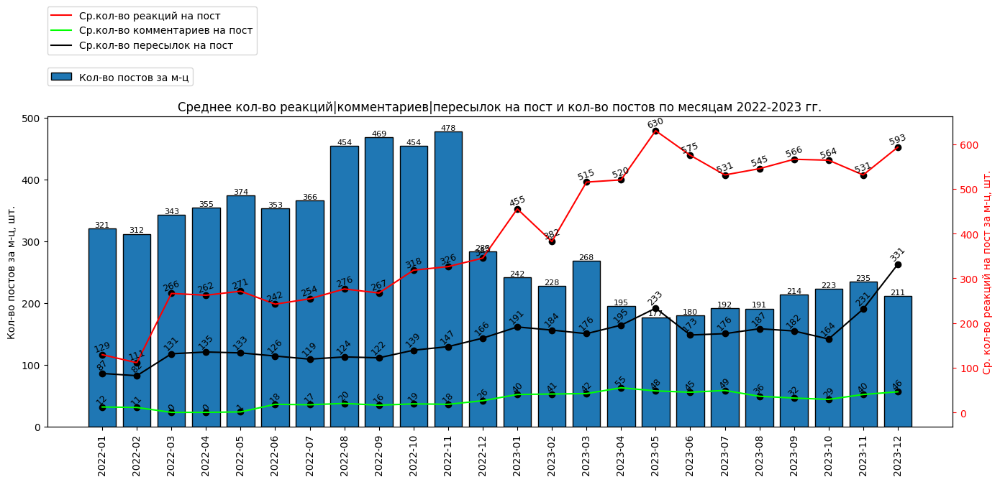

In [ ]:
# Построим график со средним за м-ц кол-вом реакций/комментариев/репостов за 2022-2023 гг.
posts_by_month['year_month'] = posts_by_month['year_month'].astype('str')
x_values = posts_by_month['year_month']
y1_values = posts_by_month['reactions_mean']
y2_values = posts_by_month['comments_mean']
y3_values = posts_by_month['forwarded_mean']
y4_values = posts_by_month['posts_count']

fig, ax = plt.subplots(figsize=(14, 6))

bar = ax.bar(x_values, y4_values, label='Кол-во постов за м-ц', edgecolor = 'black')

for i, val in enumerate(y4_values):
    ax.text(x_values[i], val, f'{val:.0f}', ha='center', va='bottom', fontsize=8, color='black',  rotation=0)

ax.set_ylabel('Кол-во постов за м-ц, шт.')
plt.xticks(rotation=90)
ax.grid(False)

plt.legend(loc=(0, 1.1))
plt.title('Среднее кол-во реакций|комментариев|пересылок на пост и кол-во постов по месяцам 2022-2023 гг.')
plt.xticks(rotation=90)

# Создание второй оси y (правая ось)
ax2 = ax.twinx()
line1, = ax2.plot(x_values, y1_values, color='red', label='Ср.кол-во реакций на пост')
line2, = ax2.plot(x_values, y2_values, color='lime', label='Ср.кол-во комментариев на пост')
line3, = ax2.plot(x_values, y3_values, color='black', label='Ср.кол-во пересылок на пост')

for i, x in enumerate(x_values):
    ax2.text(x, y1_values[i]+1, f'{y1_values[i]:.0f}', ha='center', va='bottom', fontsize=9, color='black', rotation=20)
    ax2.scatter(x, y1_values[i], color='black', zorder=0.1)

    ax2.text(x, y2_values[i], f'{y2_values[i]:.0f}', ha='center', va='bottom', fontsize=9, color='black', rotation=45)
    ax2.scatter(x, y2_values[i], color='black', zorder=0.5)

    ax2.text(x, y3_values[i]+3, f'{y3_values[i]:.0f}', ha='center', va='bottom', fontsize=9, color='black', rotation=45)
    ax2.scatter(x, y3_values[i], color='black', zorder=5)

ax2.set_ylabel('Ср. кол-во реакций на пост за м-ц, шт.', color='red')
ax2.tick_params('y', colors='red')
plt.tight_layout()
plt.legend(loc=(0, 1.2));

__________
__________
**Промежуточный вывод:**

**Количество постов ТГК Кинопоиск:**
- Общее количество постов в 2023 г. уменьшилось по сравнению с 2022 г.:
  - в 2022 г. - в среднем за м-ц публиковался 381 пост;
  - в 2023 г. - в среднем за м-ц публиковалось 213 постов;
- Сезонных колебаний кол-ва постов, опубликованных за месяц, нет;

**Количество просмотров постов ТГК КиноПоиск:**
- Общее количество просмотров в 2023 г. уменьшилось по сравнению с 2022 г. (темп снижения существенно меньше, чем по кол-ву постов):
  - в 2022 г. - в среднем за м-ц было 14.5 млн. просмотров;
  - в 2023 г. - в среднем за м-ц было 12.1 млн. просмотров;
- Среднее количество просмотров одного поста в 2023 г. существенно увеличилось по сравнению с 2022 г.:
  - в 2022 г. - в среднем за м-ц было 37.4 т. просмотров одного поста;
  - в 2023 г. - в среднем за м-ц было 61.1 т. просмотров одного поста;

**Количество репостов ТГК КиноПоиск:**
- Общее количество репостов в 2023 г. уменьшилось по сравнению с 2022 г.:
  - в 2022 г. - в среднем за м-ц было 47.6 т. перепостов;
  - в 2023 г. - в среднем за м-ц было 40.6 т. перепостов;
- Среднее количество репостов одного поста в 2023 г. существенно увеличилось по сравнению с 2022 г.:
  - в 2022 г. - в среднем за м-ц было 129 репостов одного поста;
  - в 2023 г. - в среднем за м-ц было 185 репостов одного поста;

**Количество реакций ТГК КиноПоиск:**
- Общее количество реакций в 2023 г. увеличилось по сравнению с 2022 г.:
  - в 2022 г. - в среднем за м-ц было 95.5 т. реакций;
  - в 2023 г. - в среднем за м-ц было 110.9 т. реакций;
- Среднее количество реакций на однин пост в 2023 г. существенно увеличилось по сравнению с 2022 г.:
  - в 2022 г. - в среднем за м-ц было 266 реакций на один пост;
  - в 2023 г. - в среднем за м-ц было 537 реакций на один пост;

**Количество комментариев ТГК КиноПоиск:**
- Общее количество комментариев в 2023 г. увеличилось по сравнению с 2022 г.:
  - в 2022 г. - в среднем за м-ц было 6.4 т. комментариев;
  - в 2023 г. - в среднем за м-ц было 9.5 т. комментариев;
- Среднее количество комментариев на однин пост в 2023 г. существенно увеличилось по сравнению с 2022 г.:
  - в 2022 г. - в среднем за м-ц было 17 комментариев на один пост;
  - в 2023 г. - в среднем за м-ц было 42 комментариев на один пост.

Уменьшение количества постов вряд ли можно рассматривать как минус деятельности ТГК. Контент должен быть постоянным, достаточным и интересным аудитории - это все есть. Спамить подписчикам ТГ тоже не стоит.

Рост количества реакций - это однозначный позитив в работе ТГК. Возможно этот рост связан не с ростом вовлеченности аудитории, а с ростом количества подписчиков. Это мы выясним в следующем разделе проекта.
_____
_____

#### **3.5.3. Метрика - общее количество подписчиков (датафреймы subscribers_detailed и subscribers_general)**

Данные по количеству подписчиков предоставлены заказчиком с 2022-08-17 по 2024-01-18.

Мы приняли решение анализировать 2023 год.

Удалим лишние строки.

In [ ]:
# Вспомним структуру датафрейма subscribers_general
subscribers_general.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 520 entries, 0 to 519
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         520 non-null    datetime64[ns]
 1   subscribers  520 non-null    int64         
 2   changes      520 non-null    int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 12.3 KB


In [ ]:
# Оставим в датафрейме subscribers_general только строки 2023 г.
subscribers_general = subscribers_general[(subscribers_general['date']>'2022-12-31')&(subscribers_general['date']<'2024-01-01')]

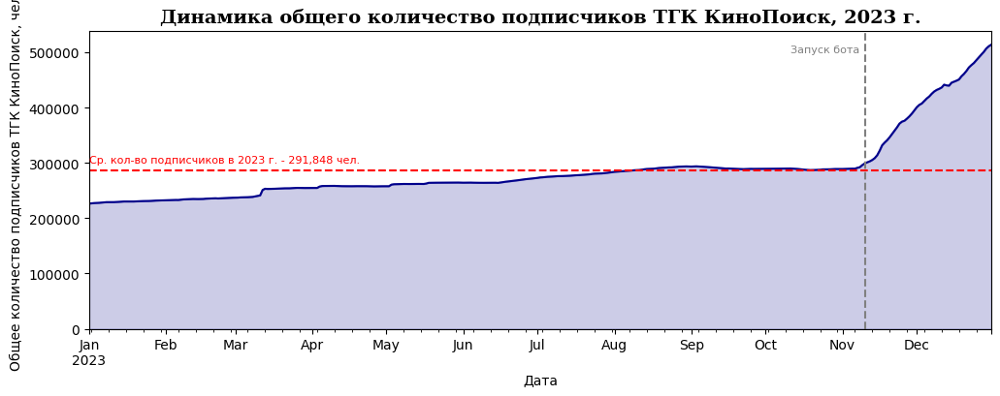

In [ ]:
# Построим график динамики общего количество подписчиков ТГК КиноПоиск
fig, ax = plt.subplots()
subscribers_general.plot(x='date',
                         y='subscribers',
                         kind = 'area',
                         alpha = 0.2,
                         color = 'darkblue',
                         figsize=(12, 4),
                         ax = ax)
subscribers_general.plot(x='date',
                         y='subscribers',
                         color = 'darkblue',
                         alpha = 1.0,
                         figsize=(12, 4),
                         ax=ax)
ax.get_legend().remove()
ax.text('2023-01-01', 300000, 'Ср. кол-во подписчиков в 2023 г. - 291,848 чел.', fontsize=8, color="red")
ax.text('2023-10-11', 500000, 'Запуск бота', fontsize=8, color="grey")
plt.axhline(y = subscribers_general['subscribers'].mean(), color = 'r', linestyle = '--')
plt.axvline(x = '2023-11-10', color = 'grey', linestyle = '--')
plt.title('Динамика общего количество подписчиков ТГК КиноПоиск, 2023 г.', font={'weight':'bold', 'size': '14', 'family':'serif'})
plt.xlabel('Дата')
plt.ylabel('Общее количество подписчиков ТГК КиноПоиск, чел.')
plt.show()

In [ ]:
# Изучим описательную статистику по столбцу 'subscribers' методом .describe()
subscribers_general['subscribers'].describe()

count      365.00000
mean    286162.81370
std      59063.11440
min     226447.00000
25%     254866.00000
50%     273747.00000
75%     289729.00000
max     513900.00000
Name: subscribers, dtype: float64

In [ ]:
# Создадим датафрейм subscribers_month с количеством подписчиков на конец месяца
subscribers_general['month'] = subscribers_general['date'].dt.month
subscribers_month = subscribers_general.sort_values(by='date').pivot_table(index='month', values = 'subscribers', aggfunc='last').reset_index()
subscribers_month['changes'] = round(subscribers_month['subscribers'] - subscribers_month['subscribers'].shift())
subscribers_month['changes_%'] = round(subscribers_month['subscribers'].pct_change()*100)
subscribers_month = subscribers_month.fillna(0)
(
    subscribers_month
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,month,subscribers,changes,changes_%
0,1,232345,0.000000,0.000000
1,2,237054,4709.000000,2.000000
2,3,254716,17662.000000,7.000000
3,4,257955,3239.000000,1.000000
4,5,264399,6444.000000,2.000000
5,6,272431,8032.000000,3.000000
6,7,283270,10839.000000,4.000000
7,8,293626,10356.000000,4.000000
8,9,289479,-4147.000000,-1.000000
9,10,289031,-448.000000,-0.000000


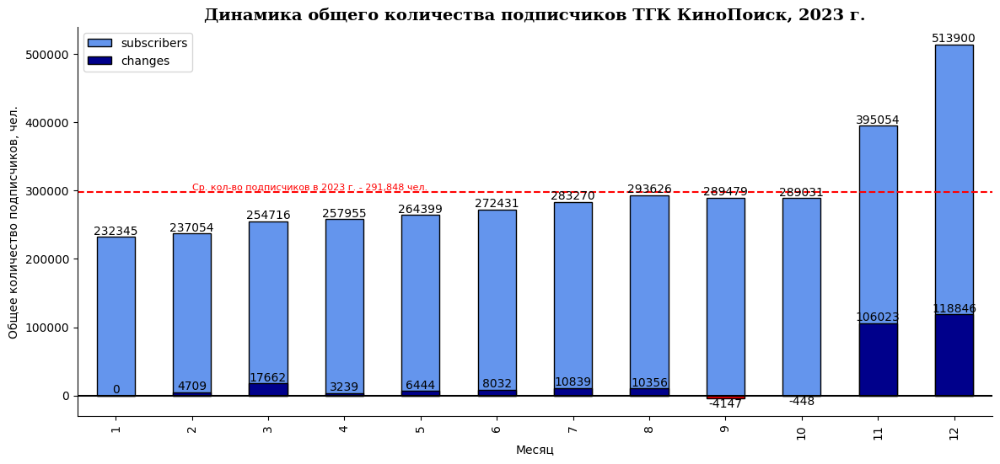

In [ ]:
# Визуализируем динамику общего количества подписчиков ТГК КиноПоиск по месяцам 2023 г.
fig, ax = plt.subplots()
subscribers_month.plot(x='month',
               y='subscribers',
               kind = 'bar',
               figsize=(14, 6),
               edgecolor = 'black',
               color='#6495ED',
               ax=ax)
color = ['red' if i<0 else 'darkblue' for i in subscribers_month['changes'].to_list()]
subscribers_month.plot(x='month',
               y='changes',
               kind = 'bar',
               figsize=(14, 6),
               edgecolor = 'black',
               color=color,
               ax=ax)
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
plt.axhline(y = subscribers_month['subscribers'].mean(), color = 'r', linestyle = '--')
plt.axhline(y = 0, color = 'black')
plt.title('Динамика общего количества подписчиков ТГК КиноПоиск, 2023 г.', font={'weight':'bold', 'size': '14', 'family':'serif'})
plt.xlabel('Месяц')
plt.ylabel('Общее количество подписчиков, чел.')
ax = plt.gca()
plt.xticks(rotation=90)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.text(1, 301000, 'Ср. кол-во подписчиков в 2023 г. - 291,848 чел.', fontsize=8, color="red")
plt.show()

In [ ]:
# Вспомним структуру датафрейма subscribers_detailed
subscribers_detailed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12282 entries, 0 to 12281
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          12282 non-null  datetime64[ns]
 1   subscribers   12282 non-null  int64         
 2   unsubscribed  12282 non-null  int64         
 3   week_day      12282 non-null  object        
 4   day           12282 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(2), object(1)
memory usage: 479.9+ KB


In [ ]:
# Создадим столбец 'day' на базе столбца 'date', убрав информацию о времени
# Создадим столбец 'hour' на базе столбца 'date'
subscribers_detailed['day'] = subscribers_detailed['date'].dt.date

In [ ]:
# Оставим в датафрейме subscribers_detailed только строки 2023 г.
subscribers_detailed = subscribers_detailed[(subscribers_detailed['date']>'2022-12-31')&(subscribers_detailed['date']<'2024-01-01')]

In [ ]:
# Создадим датафрейм subscribers_detailed_day - приток/отток подписчиков за день (суммировав часовые данные)
subscribers_detailed_day =  subscribers_detailed.groupby('day').agg({'subscribers':'sum', 'unsubscribed':'sum'}).reset_index()
subscribers_detailed_day.head()

,day,subscribers,unsubscribed
0,2022-12-31,105,-71
1,2023-01-01,1214,-32
2,2023-01-02,359,-13
3,2023-01-03,347,-34
4,2023-01-04,205,-14


In [ ]:
# Изучим описательную статистику по столбцу subscribers
subscribers_detailed_day[['subscribers', 'unsubscribed']].describe().T

,count,mean,std,min,25%,50%,75%,max
subscribers,366.00000,2221.34426,3134.86536,25.00000,233.25000,1263.00000,2200.00000,15824.00000
unsubscribed,366.00000,-1404.39617,1638.68646,-6887.00000,-1678.25000,-1124.50000,-82.00000,0.00000


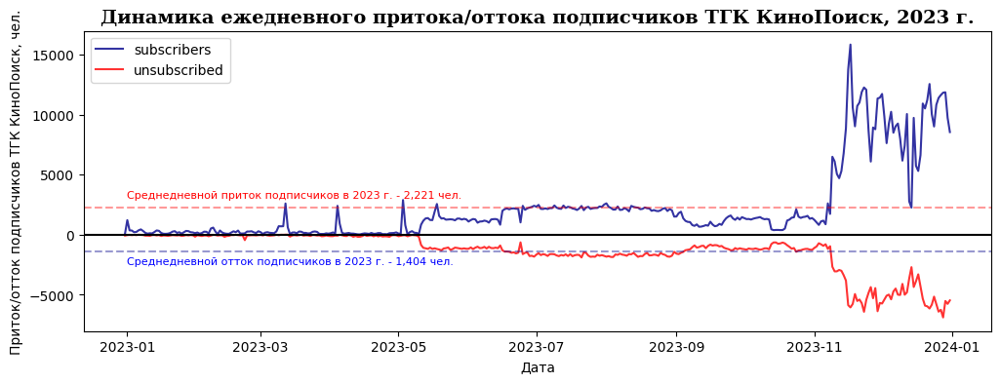

In [ ]:
# Построим график динамики ежедневного притока/оттока подписчиков ТГК КиноПоиск в 2023 г.
fig, ax = plt.subplots()
subscribers_detailed_day.plot(x='day',
                         y='subscribers',
                         alpha = 0.8,
                         color = 'darkblue',
                         figsize=(12, 4),
                         ax = ax)
subscribers_detailed_day.plot(x='day',
                         y='unsubscribed',
                         color = 'red',
                         alpha = 0.8,
                         figsize=(12, 4),
                         ax=ax)
#ax.get_legend().remove()
plt.axhline(y = subscribers_detailed_day['subscribers'].mean(), color = 'r', linestyle = '--', alpha=0.4)
plt.axhline(y = subscribers_detailed_day['unsubscribed'].mean(), color = 'darkblue', linestyle = '--', alpha=0.4)
plt.axhline(y = 0, color = 'black')
ax.text('2023-01-01', 3000, 'Среднедневной приток подписчиков в 2023 г. - 2,221 чел.', fontsize=8, color="red")
ax.text('2023-01-01', -2500, 'Среднедневной отток подписчиков в 2023 г. - 1,404 чел.', fontsize=8, color="blue")
plt.title('Динамика ежедневного притока/оттока подписчиков ТГК КиноПоиск, 2023 г.', font={'weight':'bold', 'size': '14', 'family':'serif'})
plt.xlabel('Дата')
plt.ylabel('Приток/отток подписчиков ТГК КиноПоиск, чел.')
plt.show()

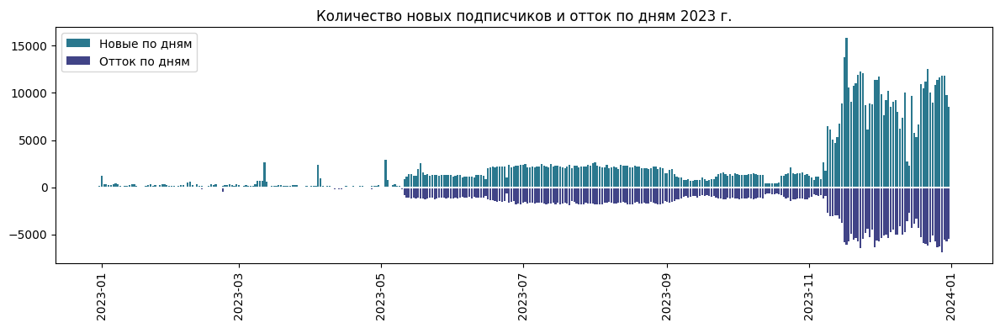

In [ ]:
# Альтернативная визуализация
x_values = subscribers_detailed_day['day']
y2_values = subscribers_detailed_day['unsubscribed']
y1_values = subscribers_detailed_day['subscribers']

fig, ax = plt.subplots(figsize=(12, 4))
bar1 = ax.bar(x_values, y1_values, color='#2A788EFF', label='Новые по дням')
bar2 = ax.bar(x_values, y2_values, color='#414487FF', label='Отток по дням')
plt.xticks(rotation=90)
plt.axhline(y = 0, color = 'white')

ax.grid(False)
plt.legend(loc='best')
plt.title('Количество новых подписчиков и отток по дням 2023 г.')
plt.tight_layout()

plt.show()

___________
___________
**Промежуточные итоги:**
- по состоянию на 21.02.2024 ТГК Кинопоиск имеет уадиторию - 598 071 чел.;
- анализ количества подписчиков проводился за 2023 г.;
- общая динамика количества подписчиков - растущая;
- на начало 2023 г. аудитория составляла - 226,447 чел.;
- на конец 2023 г. аудитория составляла - 513,900 чел. (рост в 2.2 раза);
- месячный темп прироста общего числа подписчиков:
   - минимальный -1%;
   - максимальный 37%;
- резкий рост количества подписчиков пришелся на ноябрь-декабрь 2023 г.:
   - по состоянию на 01-11-2023 было 289,479 подписчиков;
   - по состоянию на 31-12-2023 было 513,900 подписчиков (рост в 1.8 раза);
   - темп прироста в ноябре - 37%;
   - емп прироста в декабре - 30%.

Основной причиной резкого роста количества подписчиков является запуск бота, создающего персональный киноколлаж в обмен на подписку.

Бот привел новых подписчиков, но при этом существенно увеличилась дневная амплитуда колебаний оттока/притока подписчиков, что сразу бросается в глаза на графике.

Креатив творит чудеса! А качественный контент позволяет удерживать подписчикав и формировать сообщество кинолюбителей вокруг ТГК КиноПоиск.
_______________
_______________

#### **3.5.4. Метрика - количество новых (приток) подписчиков (датафрейм subscribers_detailed_day)**

In [ ]:
# Вспомним структуру датафрейма subscribers_detailed_day
subscribers_detailed_day.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   day           366 non-null    object
 1   subscribers   366 non-null    int64 
 2   unsubscribed  366 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 8.7+ KB


In [ ]:
# Добавим в датафрейм subscribers_detailed_day столбец с днем недели
# Добавим в датафрейм subscribers_detailed_day столбец с месяцем
subscribers_detailed_day['day'] = pd.to_datetime(subscribers_detailed_day['day'])
subscribers_detailed_day['wod'] = subscribers_detailed_day['day'].dt.weekday
subscribers_detailed_day['month'] = subscribers_detailed_day['day'].dt.month

In [ ]:
# Добавим в датафрейм subscribers_detailed_day столбц с общим кол-вом подписчиков из датафрема subscribers_general
# Создадим столбец 'subscribers_day_%' - % притока новых подписчиков за день к общему количеству подписчиков
# Создадим столбец 'unsubscribed_day_%' - % оттока подписчиков за день к общему количеству подписчиков
subscribers_detailed_day = subscribers_detailed_day.merge(subscribers_general[['date', 'subscribers']], left_on='day', right_on='date', suffixes=('_day', '_all'))
subscribers_detailed_day = subscribers_detailed_day.drop('date', axis= 1)
subscribers_detailed_day['subscribers_day_%'] = round(subscribers_detailed_day['subscribers_day']/subscribers_detailed_day['subscribers_all']*100, 3)
subscribers_detailed_day['unsubscribed_day_%'] = round(subscribers_detailed_day['unsubscribed']/subscribers_detailed_day['subscribers_all']*100, 3)
subscribers_detailed_day.head()

,day,subscribers_day,unsubscribed,wod,month,subscribers_all,subscribers_day_%,unsubscribed_day_%
0,2023-01-01,1214,-32,6,1,226447,0.53600,-0.01400
1,2023-01-02,359,-13,0,1,226928,0.15800,-0.00600
2,2023-01-03,347,-34,1,1,227365,0.15300,-0.01500
3,2023-01-04,205,-14,2,1,227621,0.09000,-0.00600
4,2023-01-05,229,-32,3,1,227805,0.10100,-0.01400


In [ ]:
# Создадим таблицу описательных статистик притока подписчиков в разрезе м-цев (абс. данные)
print('Таблица описательных статистик притока подписчиков в разрезе м-цев (абс. данные)')
print()
month_describer(subscribers_detailed_day, 'subscribers_day')

Таблица описательных статистик притока подписчиков в разрезе м-цев (абс. данные)



,indicator,all,1,2,3,4,5,6,7,8,9,10,11,12
0,count,365.00000,31.00000,28.00000,31.00000,30.00000,31.00000,30.00000,31.00000,31.00000,30.00000,31.00000,30.00000,31.00000
1,mean,2227.14247,247.41935,212.64286,302.32258,205.63333,1079.80645,1636.16667,2246.54839,2137.54839,1109.26667,1177.51613,7204.33333,9011.77419
2,std,3137.20269,206.33949,129.74311,466.75221,442.42712,694.83127,546.90396,117.14715,188.10154,357.07489,447.47230,4440.54594,2559.18561
3,min,25.00000,72.00000,41.00000,40.00000,25.00000,25.00000,829.00000,2041.00000,1505.00000,660.00000,379.00000,812.00000,2252.00000
4,25%,240.00000,134.50000,105.50000,114.50000,74.25000,544.50000,1137.00000,2161.50000,2039.00000,796.50000,1217.00000,3129.25000,7805.00000
5,50%,1264.00000,206.00000,187.00000,171.00000,109.50000,1260.00000,1304.00000,2223.00000,2129.00000,1072.50000,1324.00000,7735.00000,9723.00000
6,75%,2200.00000,309.00000,268.50000,254.50000,141.25000,1343.50000,2173.25000,2321.00000,2236.50000,1367.50000,1416.50000,10931.50000,10863.00000
7,max,15824.00000,1214.00000,590.00000,2598.00000,2402.00000,2887.00000,2407.00000,2508.00000,2607.00000,1913.00000,2110.00000,15824.00000,12541.00000


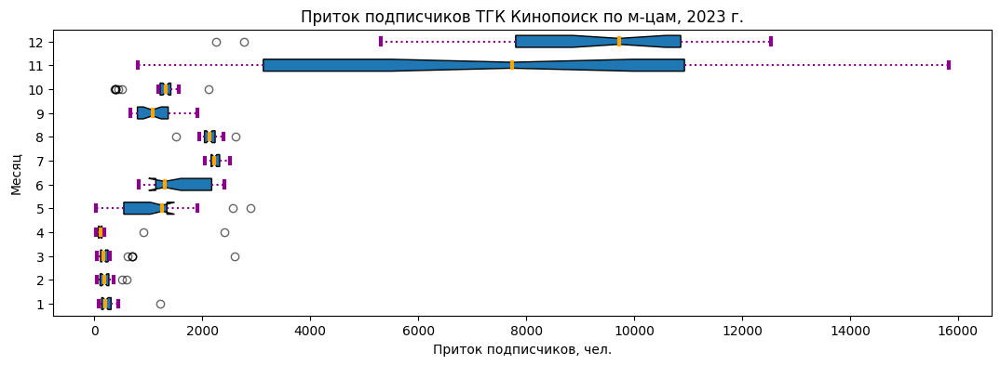

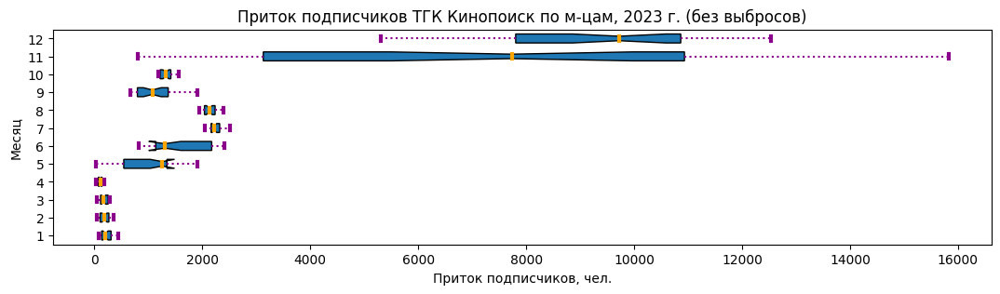

In [ ]:
# Визуализация описательных статистик метрики приток подписчиков ТГК Кинопоиск по м-цам
boxploter(subscribers_detailed_day, 'subscribers_day', 'Приток подписчиков, чел.', 'Месяц', "Приток подписчиков ТГК Кинопоиск по м-цам, 2023 г.")

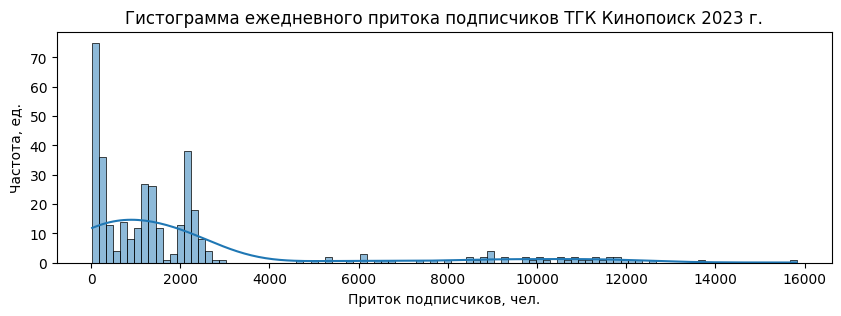

In [ ]:
# Построим гистограмму ежедневного притока подписчиков ТГК Кинопоиск 2023 г.
plt.figure(figsize=(10, 3))
sns.histplot(x = subscribers_detailed_day['subscribers_day'], bins=100, kde=True)
plt.title('Гистограмма ежедневного притока подписчиков ТГК Кинопоиск 2023 г.')
plt.xlabel('Приток подписчиков, чел.')
plt.ylabel('Частота, ед.');

In [ ]:
# Создадим таблицу описательных статистик притока подписчиков в разрезе м-цев (% к общему кол-ву подписчиков)
print('Таблица описательных статистик притока подписчиков в разрезе м-цев (% к общему кол-ву подписчиков)')
print()
month_describer(subscribers_detailed_day, 'subscribers_day_%')

Таблица описательных статистик притока подписчиков в разрезе м-цев (% к общему кол-ву подписчиков)



,indicator,all,1,2,3,4,5,6,7,8,9,10,11,12
0,count,365.00000,31.00000,28.00000,31.00000,30.00000,31.00000,30.00000,31.00000,31.00000,30.00000,31.00000,30.00000,31.00000
1,mean,0.65742,0.10797,0.09061,0.12213,0.07990,0.41023,0.61260,0.80845,0.73939,0.38137,0.40758,2.10597,1.98574
2,std,0.78120,0.09110,0.05532,0.18688,0.17194,0.26434,0.19981,0.04199,0.06931,0.12212,0.15486,1.23693,0.54623
3,min,0.01000,0.03100,0.01800,0.01600,0.01000,0.01000,0.31400,0.73000,0.51300,0.22700,0.13100,0.28100,0.51200
4,25%,0.09700,0.05850,0.04500,0.04550,0.02900,0.20800,0.43025,0.78350,0.69800,0.27400,0.42350,1.05925,1.77250
5,50%,0.46300,0.08900,0.07950,0.07000,0.04250,0.47600,0.49350,0.80200,0.73800,0.36800,0.45800,2.24050,2.15500
6,75%,0.79000,0.13400,0.11400,0.10050,0.05450,0.50800,0.80650,0.82950,0.77800,0.47250,0.49050,3.04600,2.34050
7,max,4.76700,0.53600,0.25200,1.03500,0.93400,1.10700,0.88900,0.90600,0.91800,0.65100,0.73200,4.76700,2.92200


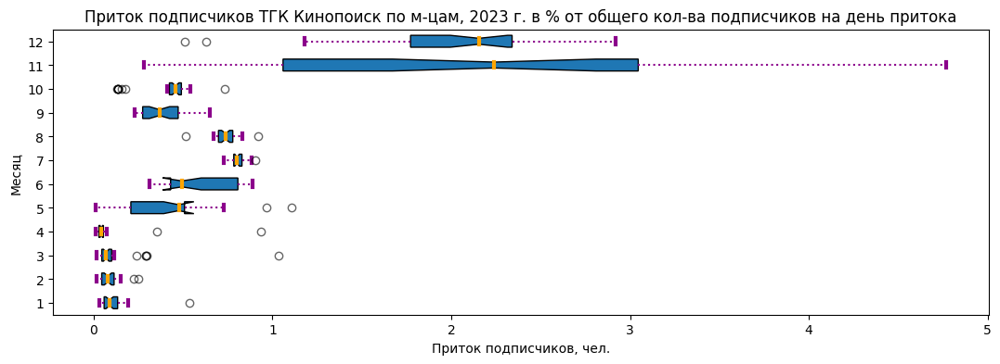

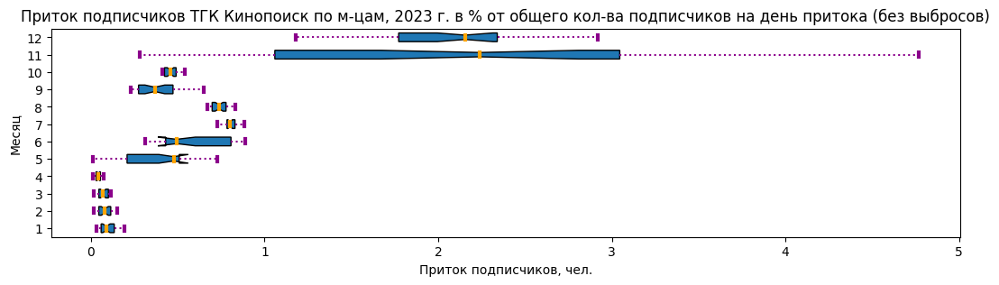

In [ ]:
# Визуализация описательных статистик метрики приток подписчиков ТГК Кинопоиск по м-цам в % от общего количества подписчиков
boxploter(subscribers_detailed_day, 'subscribers_day_%', 'Приток подписчиков, чел.', 'Месяц', "Приток подписчиков ТГК Кинопоиск по м-цам, 2023 г. в % от общего кол-ва подписчиков на день притока")

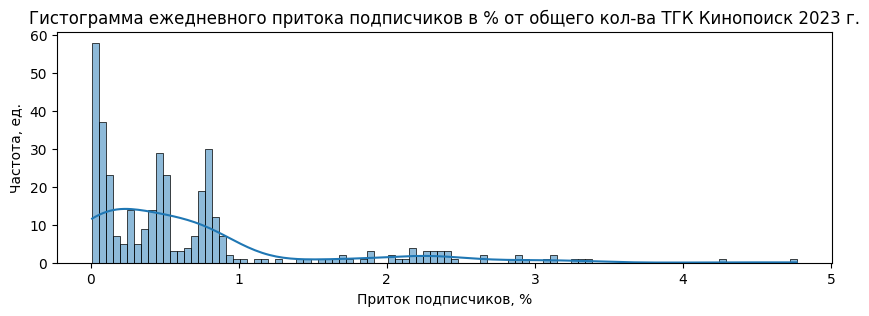

In [ ]:
# Построим гистограмму ежедневного притока подписчиков в % от общего кол-ва ТГК Кинопоиск 2023 г.
plt.figure(figsize=(10, 3))
sns.histplot(x = subscribers_detailed_day['subscribers_day_%'], bins=100, kde=True)
plt.title('Гистограмма ежедневного притока подписчиков в % от общего кол-ва ТГК Кинопоиск 2023 г.')
plt.xlabel('Приток подписчиков, %')
plt.ylabel('Частота, ед.');

In [ ]:
# В какой день недели происходит наибольший приток подписчиков
subscribers_wod = subscribers_detailed_day.pivot_table(index='wod', values='subscribers_day', aggfunc='mean').reset_index()
subscribers_wod = subscribers_wod.sort_values(by='subscribers_day', ascending=False).round()
(
    subscribers_wod
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,wod,subscribers_day
4,4,2566.000000
3,3,2361.000000
1,1,2259.000000
5,5,2193.000000
2,2,2186.000000
6,6,2049.000000
0,0,1979.000000


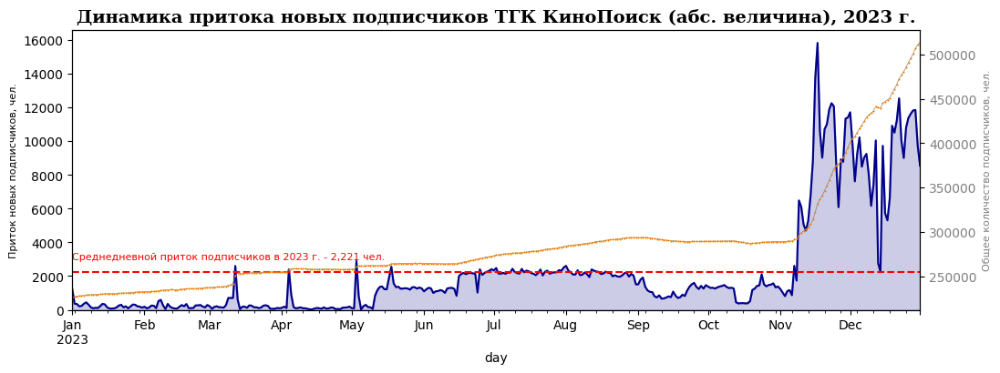

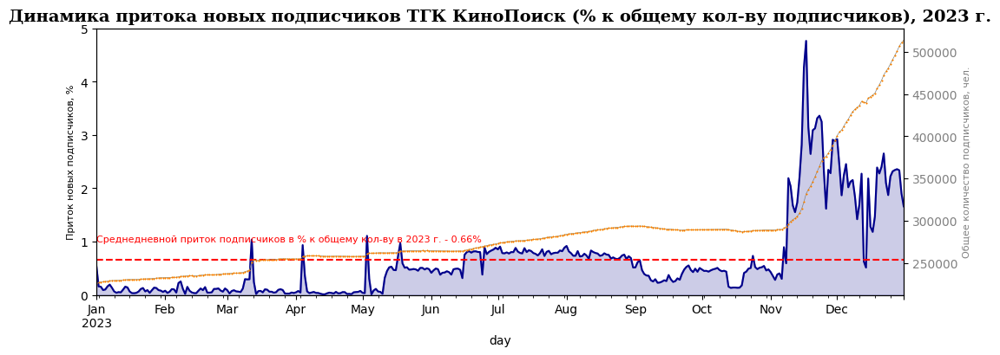

In [ ]:
# Построим график динамики притока подписчиков ТГК КиноПоиск (абс. величина)
fig, ax1 = plt.subplots()
subscribers_detailed_day.plot(x='day',
                         y='subscribers_day',
                         kind = 'area',
                         alpha = 0.2,
                         color = 'darkblue',
                         figsize=(12, 4),
                         ax = ax1)
subscribers_detailed_day.plot(x='day',
                         y='subscribers_day',
                         color = 'darkblue',
                         alpha = 1.0,
                         figsize=(12, 4),
                         ax=ax1)
ax1.get_legend().remove()
ax1.text('2023-01-01', 3000, 'Среднедневной приток подписчиков в 2023 г. - 2,221 чел.', fontsize=8, color="red")
plt.axhline(y = subscribers_detailed_day['subscribers_day'].mean(), color = 'r', linestyle = '--')
ax1.set_ylabel("Приток новых подписчиков, чел.", fontsize=8)

ax2 = ax1.twinx()
ax2.plot(subscribers_detailed_day['day'],
         subscribers_detailed_day['subscribers_all'],
         lw=0.5,
         marker = 'o',
         ms=1,
         markerfacecolor = 'red',
         markeredgewidth = 0.5,
         markeredgecolor = 'orange',
         color="grey")
ax2.set_ylabel("Общее количество подписчиков, чел.", fontsize=8, color="grey")
for label in ax2.get_yticklabels():
    label.set_color("grey")

plt.title('Динамика притока новых подписчиков ТГК КиноПоиск (абс. величина), 2023 г.', font={'weight':'bold', 'size': '14', 'family':'serif'})
plt.xlabel('Дата')
plt.show()

# Построим график динамики притока подписчиков ТГК КиноПоиск (% к общему кол-ву подписчиков)
fig, ax1 = plt.subplots()
subscribers_detailed_day.plot(x='day',
                         y='subscribers_day_%',
                         kind = 'area',
                         alpha = 0.2,
                         color = 'darkblue',
                         figsize=(12, 4),
                         ax = ax1)
subscribers_detailed_day.plot(x='day',
                         y='subscribers_day_%',
                         color = 'darkblue',
                         alpha = 1.0,
                         figsize=(12, 4),
                         ax=ax1)
ax1.get_legend().remove()
ax1.text('2023-01-01', 1, 'Среднедневной приток подписчиков в % к общему кол-ву в 2023 г. - 0.66%', fontsize=8, color="red")
plt.axhline(y = subscribers_detailed_day['subscribers_day_%'].mean(), color = 'r', linestyle = '--')
ax1.set_ylabel("Приток новых подписчиков, %", fontsize=8)

ax2 = ax1.twinx()
ax2.plot(subscribers_detailed_day['day'],
         subscribers_detailed_day['subscribers_all'],
         lw=0.5,
         marker = 'o',
         ms=1,
         markerfacecolor = 'red',
         markeredgewidth = 0.5,
         markeredgecolor = 'orange',
         color="grey")
ax2.set_ylabel("Общее количество подписчиков, чел.", fontsize=8, color="grey")
for label in ax2.get_yticklabels():
    label.set_color("grey")

plt.title('Динамика притока новых подписчиков ТГК КиноПоиск (% к общему кол-ву подписчиков), 2023 г.', font={'weight':'bold', 'size': '14', 'family':'serif'})
plt.xlabel('Дата')
plt.show()

In [ ]:
# Создадим таблицу с притоком новых клиентов за месяц
subscribers_detailed_m = subscribers_detailed_day.pivot_table(index='month', values='subscribers_day', aggfunc='sum').reset_index()
subscribers_detailed_m.columns = ['month', 'subscribers_month']
subscribers_detailed_m['subscribers_year_%'] = round(subscribers_detailed_m['subscribers_month']/subscribers_detailed_m['subscribers_month'].sum()*100, 2)
(
    subscribers_detailed_m
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,month,subscribers_month,subscribers_year_%
0,1,7670,0.940000
1,2,5954,0.730000
2,3,9372,1.150000
3,4,6169,0.760000
4,5,33474,4.120000
5,6,49085,6.040000
6,7,69643,8.570000
7,8,66264,8.150000
8,9,33278,4.090000
9,10,36503,4.490000


In [ ]:
# Узнаем сколько всего новых подписчиков привлек ТГК Кинопоиск в 2023 г.
subscribers_detailed_m['subscribers_month'].sum()

812907

In [ ]:
# Изучим описательную статистику месячного притока подписчиков с помощью метода describe()
subscribers_detailed_m['subscribers_month'].describe()

count       12.00000
mean     67742.25000
std      87966.83580
min       5954.00000
25%       8946.50000
50%      34988.50000
75%      67108.75000
max     279365.00000
Name: subscribers_month, dtype: float64

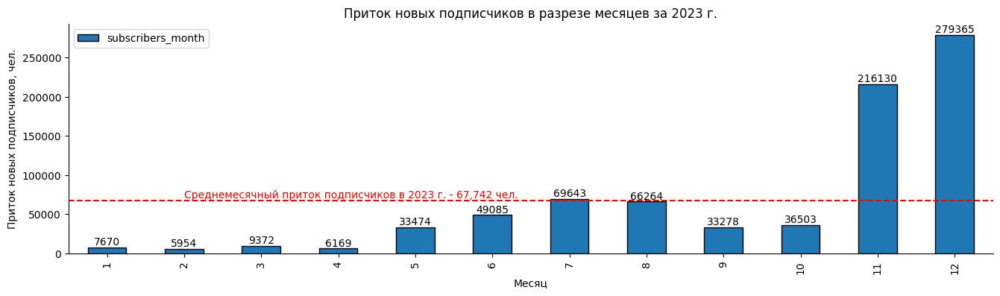

In [ ]:
# Построим график приток новых подписчиков в разрезе месяцев за 2023 г.
fig, ax = plt.subplots()
subscribers_detailed_m.plot(x = 'month', y = 'subscribers_month', kind = 'bar', ax=ax, figsize=(16, 4), edgecolor = 'black')
plt.axhline(y = subscribers_detailed_m['subscribers_month'].mean(), color = 'r', linestyle = '--')
plt.title('Приток новых подписчиков в разрезе месяцев за 2023 г.')
plt.text(1, 71000, 'Среднемесячный приток подписчиков в 2023 г. - 67,742 чел.', fontsize=10, color="red")
ax.bar_label(ax.containers[0])
plt.xlabel('Месяц')
plt.ylabel('Приток новых подписчиков, чел.')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show();

___________
___________
**Промежуточные выводы:**
- анализировался 2023 год;
- наименьшее кол-во новых подписчиков было привлечено в феврале 2023 г.- 5 954 чел (0.73% от общего притока за год);
- наибольшее кол-во новых подписчиков было привлечено в декабре 2023 г.- 279 365 чел (34.37% от общего притока за год);
- всего в 2023 г. было привлчено 812 907 новых подписчиков (без учета оттока);
- статистика по дневному притоку:
  - минимум - 25 чел (0.01% от общего кол-ва на день притока);
  - максимум - 25 824 чел (0.66% от общего кол-ва на день притока);
  - средний - 2 227 чел. (4.77% от общего кол-ва на день притока);
- наибольшее количество новых подписчиков подписывалось на канал в пятницу, наименьшее - в понедельник. Эу информацию можно учитывать при запуске кампаний по привлечению подписчиков.

Анализировать приток новых пописчиков можно с помощью разных показателей(метрик):
- дневной приток (чел./день);
- месячный приток (чел/м-ц);
- приток в % от общего количества подписчиков на дату привлечения (%).

Выбор той или иной метрики зависит от целей анализа и потребностей бизнеса.

Например,
- дневной приток интересен при анализе кампаний по привлечению подписчиков;
- месячный приток интересен как KPI сотрудников ТГК;
- приток в % от общего количества подписчиков на дату привлечения интересен при проведении сравнительного анализа.
_________
_________

#### **3.5.5. Метрика - отток подписчиков (датафрейм subscribers_detailed_day)**

In [ ]:
# Создадим таблицу описательных статистик оттока подписчиков в разрезе м-цев (абс. данные)
print('Таблица описательных статистик оттока подписчиков в разрезе м-цев (абс. данные)')
print()
month_describer(subscribers_detailed_day, 'unsubscribed')

Таблица описательных статистик оттока подписчиков в разрезе м-цев (абс. данные)



,indicator,all,1,2,3,4,5,6,7,8,9,10,11,12
0,count,365.00000,31.00000,28.00000,31.00000,30.00000,31.00000,30.00000,31.00000,31.00000,30.00000,31.00000,30.00000,31.00000
1,mean,-1408.04932,-54.87097,-76.71429,-54.67742,-96.90000,-800.61290,-1279.86667,-1698.35484,-1693.38710,-1130.03333,-1080.77419,-3714.80000,-5105.77419
2,std,1639.44278,34.94638,82.11999,40.56138,50.35553,509.37986,282.64389,97.80612,110.61756,213.49869,226.62285,2008.36723,939.20856
3,min,-6887.00000,-164.00000,-453.00000,-160.00000,-176.00000,-1301.00000,-1828.00000,-1896.00000,-1858.00000,-1617.00000,-1421.00000,-6418.00000,-6887.00000
4,25%,-1679.00000,-77.00000,-74.75000,-71.00000,-137.00000,-1176.00000,-1490.75000,-1768.00000,-1779.50000,-1247.50000,-1221.50000,-5496.75000,-5766.00000
5,50%,-1126.00000,-49.00000,-59.00000,-55.00000,-103.00000,-1105.00000,-1186.50000,-1698.00000,-1684.00000,-1120.50000,-1181.00000,-4089.00000,-5156.00000
6,75%,-85.00000,-32.00000,-41.25000,-24.50000,-56.25000,-131.00000,-1084.25000,-1634.50000,-1630.50000,-936.50000,-945.00000,-1551.75000,-4606.00000
7,max,0.00000,-5.00000,-10.00000,0.00000,-6.00000,-26.00000,-637.00000,-1470.00000,-1428.00000,-826.00000,-645.00000,-714.00000,-2704.00000


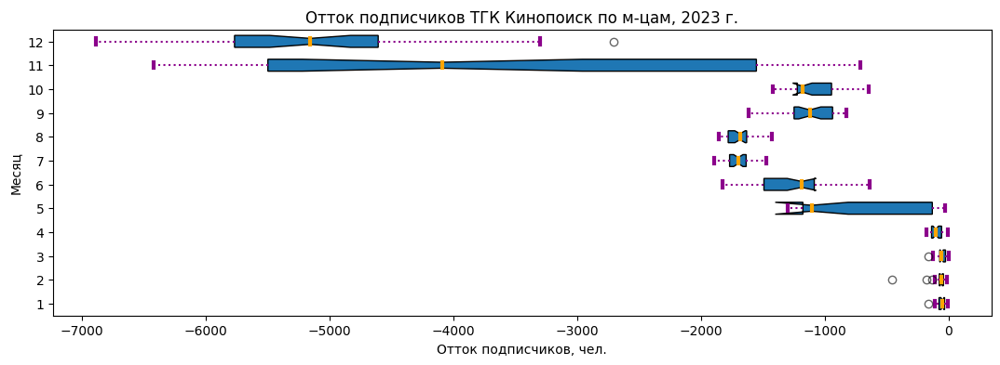

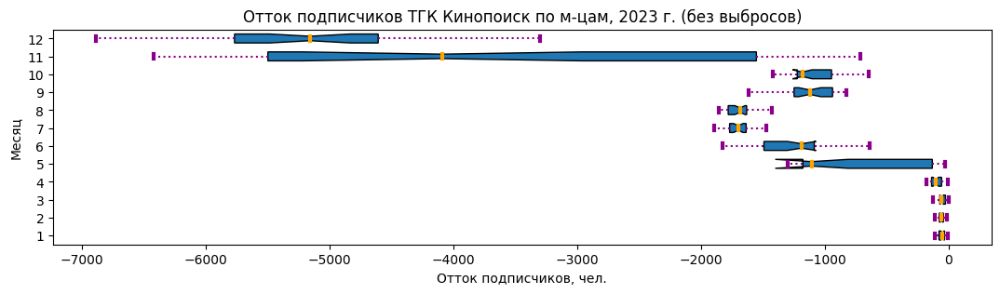

In [ ]:
# Визуализация описательных статистик метрики отток подписчиков ТГК Кинопоиск по м-цам
boxploter(subscribers_detailed_day, 'unsubscribed', 'Отток подписчиков, чел.', 'Месяц', "Отток подписчиков ТГК Кинопоиск по м-цам, 2023 г.")

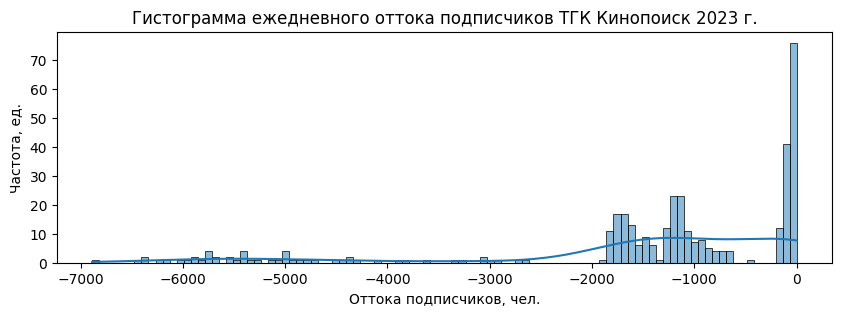

In [ ]:
# Построим гистограмму ежедневного оттока подписчиков ТГК Кинопоиск 2023 г.
plt.figure(figsize=(10, 3))
sns.histplot(x = subscribers_detailed_day['unsubscribed'], bins=100, kde=True)
plt.title('Гистограмма ежедневного оттока подписчиков ТГК Кинопоиск 2023 г.')
plt.xlabel('Оттока подписчиков, чел.')
plt.ylabel('Частота, ед.');

In [ ]:
# Создадим таблицу описательных статистик оттока подписчиков в разрезе м-цев (% к общему кол-ву подписчиков)
print('Таблица описательных статистик оттока подписчиков в разрезе м-цев (% к общему кол-ву подписчиков)')
print()
month_describer(subscribers_detailed_day, 'unsubscribed_day_%')

Таблица описательных статистик оттока подписчиков в разрезе м-цев (% к общему кол-ву подписчиков)



,indicator,all,1,2,3,4,5,6,7,8,9,10,11,12
0,count,365.00000,31.00000,28.00000,31.00000,30.00000,31.00000,30.00000,31.00000,31.00000,30.00000,31.00000,30.00000,31.00000
1,mean,-0.42495,-0.02384,-0.03264,-0.02194,-0.03763,-0.30387,-0.47967,-0.61116,-0.58555,-0.38850,-0.37410,-1.08627,-1.12571
2,std,0.40911,0.01513,0.03486,0.01608,0.01955,0.19297,0.10135,0.03367,0.04032,0.07185,0.07807,0.53376,0.18787
3,min,-1.82300,-0.07100,-0.19200,-0.06300,-0.06800,-0.49300,-0.67100,-0.67900,-0.65200,-0.55100,-0.49300,-1.82300,-1.42900
4,25%,-0.59100,-0.03350,-0.03225,-0.02900,-0.05325,-0.44450,-0.55500,-0.63550,-0.61550,-0.42625,-0.42250,-1.51475,-1.26950
5,50%,-0.40900,-0.02100,-0.02500,-0.02200,-0.04000,-0.41800,-0.44900,-0.61000,-0.58800,-0.38700,-0.40900,-1.15800,-1.16100
6,75%,-0.03500,-0.01400,-0.01725,-0.01000,-0.02150,-0.05050,-0.41100,-0.59100,-0.56500,-0.32250,-0.32900,-0.52925,-1.05950
7,max,0.00000,-0.00200,-0.00400,0.00000,-0.00200,-0.01000,-0.23700,-0.52600,-0.48600,-0.28500,-0.22300,-0.24700,-0.61500


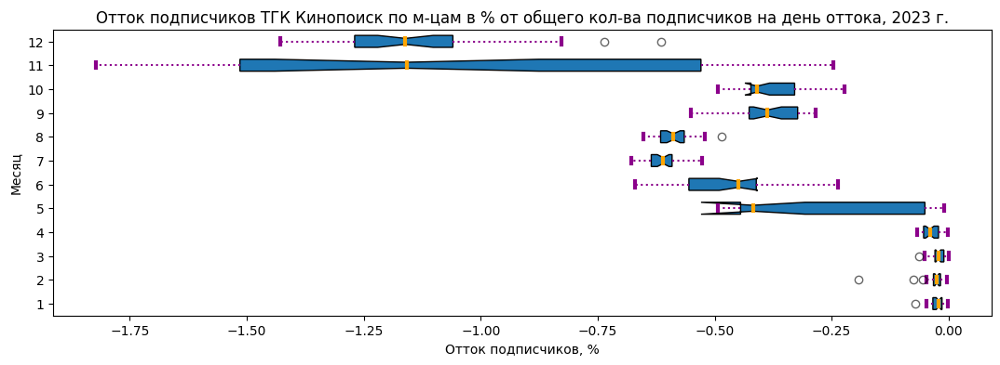

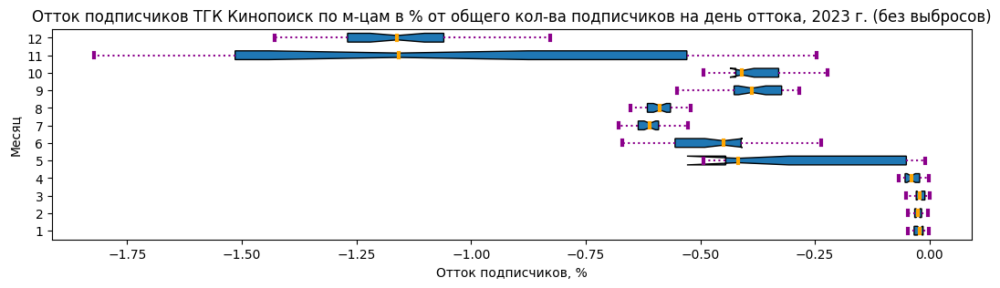

In [ ]:
# Визуализация описательных статистик метрики отток подписчиков ТГК Кинопоиск по м-цам в % от общего количества подписчиков
boxploter(subscribers_detailed_day, 'unsubscribed_day_%', 'Отток подписчиков, %', 'Месяц', "Отток подписчиков ТГК Кинопоиск по м-цам в % от общего кол-ва подписчиков на день оттока, 2023 г.")

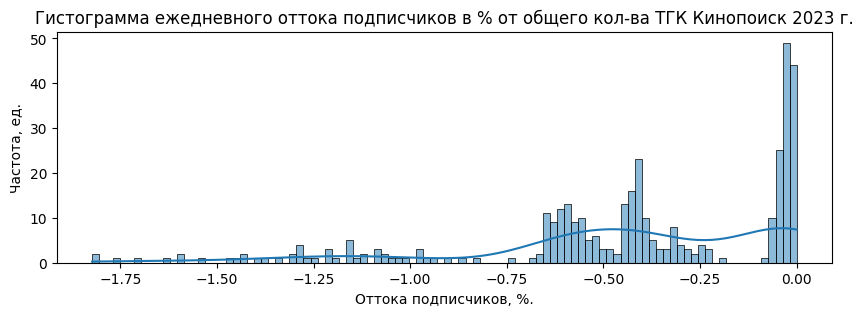

In [ ]:
# Построим гистограмму ежедневного оттока подписчиков в % от общего кол-ва ТГК Кинопоиск 2023 г.
plt.figure(figsize=(10, 3))
sns.histplot(x = subscribers_detailed_day['unsubscribed_day_%'], bins=100, kde=True)
plt.title('Гистограмма ежедневного оттока подписчиков в % от общего кол-ва ТГК Кинопоиск 2023 г.')
plt.xlabel('Оттока подписчиков, %.')
plt.ylabel('Частота, ед.');

In [ ]:
# В какой день недели происходит наибольший отток подписчиков
unsubscribed_wod = subscribers_detailed_day.pivot_table(index='wod', values='unsubscribed', aggfunc='mean').reset_index()
unsubscribed_wod = unsubscribed_wod.sort_values(by='unsubscribed').round()
(
    unsubscribed_wod
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,wod,unsubscribed
3,3,-1484.000000
4,4,-1472.000000
5,5,-1416.000000
2,2,-1410.000000
1,1,-1392.000000
0,0,-1353.000000
6,6,-1331.000000


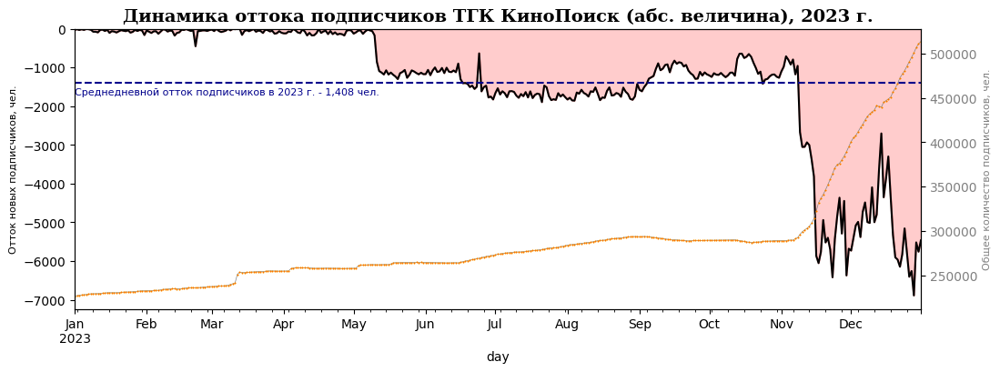

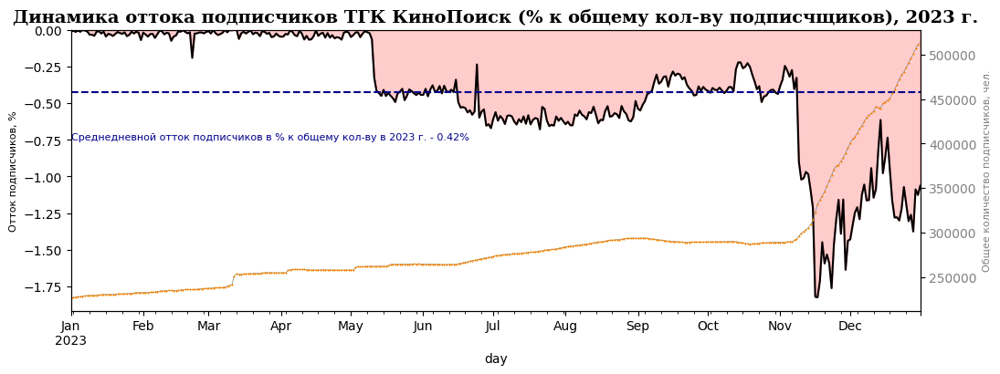

In [ ]:
# Построим график динамики оттока подписчиков ТГК КиноПоиск (абс. величина)
fig, ax1 = plt.subplots()
subscribers_detailed_day.plot(x='day',
                         y='unsubscribed',
                         kind = 'area',
                         alpha = 0.2,
                         color = 'red',
                         figsize=(12, 4),
                         ax = ax1)
subscribers_detailed_day.plot(x='day',
                         y='unsubscribed',
                         color = 'black',
                         alpha = 1.0,
                         figsize=(12, 4),
                         ax=ax1)
ax1.get_legend().remove()
ax1.text('2023-01-01', -1700, 'Среднедневной отток подписчиков в 2023 г. - 1,408 чел.', fontsize=8, color="darkblue")
plt.axhline(y = subscribers_detailed_day['unsubscribed'].mean(), color = 'darkblue', linestyle = '--')
ax1.set_ylabel("Отток новых подписчиков, чел.", fontsize=8)

ax2 = ax1.twinx()
ax2.plot(subscribers_detailed_day['day'],
         subscribers_detailed_day['subscribers_all'],
         lw=0.5,
         marker = 'o',
         ms=1,
         markerfacecolor = 'red',
         markeredgewidth = 0.5,
         markeredgecolor = 'orange',
         color="grey")
ax2.set_ylabel("Общее количество подписчиков, чел.", fontsize=8, color="grey")
for label in ax2.get_yticklabels():
    label.set_color("grey")

plt.title('Динамика оттока подписчиков ТГК КиноПоиск (абс. величина), 2023 г.', font={'weight':'bold', 'size': '14', 'family':'serif'})
plt.xlabel('Дата')
plt.show()

# Построим график динамики оттока подписчиков ТГК КиноПоиск (% к общему кол-ву подписчиков)
fig, ax1 = plt.subplots()
subscribers_detailed_day.plot(x='day',
                         y='unsubscribed_day_%',
                         kind = 'area',
                         alpha = 0.2,
                         color = 'red',
                         figsize=(12, 4),
                         ax = ax1)
subscribers_detailed_day.plot(x='day',
                         y='unsubscribed_day_%',
                         color = 'black',
                         alpha = 1.0,
                         figsize=(12, 4),
                         ax=ax1)
ax1.get_legend().remove()
ax1.text('2023-01-01', -0.75, 'Среднедневной отток подписчиков в % к общему кол-ву в 2023 г. - 0.42%', fontsize=8, color="darkblue")
plt.axhline(y = subscribers_detailed_day['unsubscribed_day_%'].mean(), color = 'darkblue', linestyle = '--')
ax1.set_ylabel("Отток подписчиков, %", fontsize=8)

ax2 = ax1.twinx()
ax2.plot(subscribers_detailed_day['day'],
         subscribers_detailed_day['subscribers_all'],
         lw=0.5,
         marker = 'o',
         ms=1,
         markerfacecolor = 'red',
         markeredgewidth = 0.5,
         markeredgecolor = 'orange',
         color="grey")
ax2.set_ylabel("Общее количество подписчиков, чел.", fontsize=8, color="grey")
for label in ax2.get_yticklabels():
    label.set_color("grey")

plt.title('Динамика оттока подписчиков ТГК КиноПоиск (% к общему кол-ву подписчщиков), 2023 г.', font={'weight':'bold', 'size': '14', 'family':'serif'})
plt.xlabel('Дата')
plt.show()

In [ ]:
# Создадим таблицу с оттоком клиентов за месяц
unsubscribed_detailed_m = subscribers_detailed_day.pivot_table(index='month', values='unsubscribed', aggfunc='sum').reset_index()
unsubscribed_detailed_m.columns = ['month', 'unsubscribed_month']
unsubscribed_detailed_m['unsubscribed_year_%'] = round(unsubscribed_detailed_m['unsubscribed_month']/unsubscribed_detailed_m['unsubscribed_month'].sum()*100, 2)
(
    unsubscribed_detailed_m
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,month,unsubscribed_month,unsubscribed_year_%
0,1,-1701,0.330000
1,2,-2148,0.420000
2,3,-1695,0.330000
3,4,-2907,0.570000
4,5,-24819,4.830000
5,6,-38396,7.470000
6,7,-52649,10.240000
7,8,-52495,10.210000
8,9,-33901,6.600000
9,10,-33504,6.520000


In [ ]:
# Узнаем сколько всего ушло подписчиков ТГК Кинопоиск в 2023 г.
unsubscribed_detailed_m['unsubscribed_month'].sum()

-513938

In [ ]:
# Изучим описательную статистику месячного оттока подписчиков с помощью метода describe()
unsubscribed_detailed_m['unsubscribed_month'].describe()

count        12.00000
mean     -42828.16667
std       48024.13149
min     -158279.00000
25%      -52533.50000
50%      -33702.50000
75%       -2717.25000
max       -1695.00000
Name: unsubscribed_month, dtype: float64

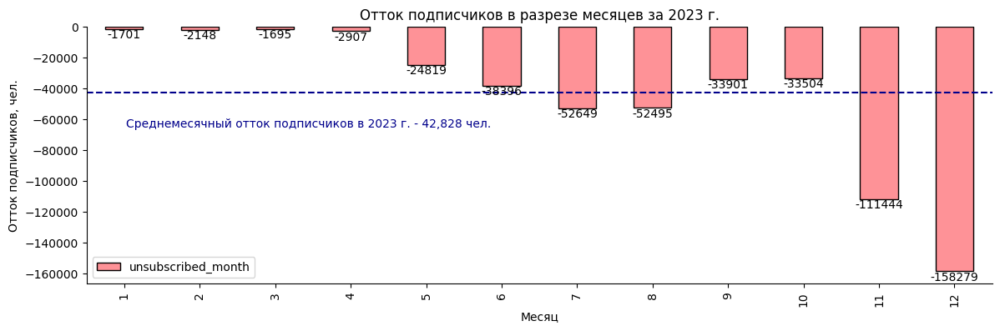

In [ ]:
# Построим график оттока подписчиков в разрезе месяцев за 2023 г.
fig, ax = plt.subplots()
unsubscribed_detailed_m.plot(x = 'month', y = 'unsubscribed_month', kind = 'bar', ax=ax, figsize=(14, 4), color = '#FE9297', edgecolor = 'black')
plt.axhline(y = unsubscribed_detailed_m['unsubscribed_month'].mean(), color = 'darkblue', linestyle = '--')
plt.title('Отток подписчиков в разрезе месяцев за 2023 г.')
plt.text(0.02, -65000, 'Среднемесячный отток подписчиков в 2023 г. - 42,828 чел.', fontsize=10, color="darkblue")
ax.bar_label(ax.containers[0])
plt.xlabel('Месяц')
plt.legend(loc=3)
plt.ylabel('Отток подписчиков, чел.')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show();

___________
___________
**Промежуточные выводы:**
- анализировался 2023 год;
- наименьший отток подписчиков был в марте 2023 г.- 1 695 чел (0.33% от общего оттока за год);
- наибольший отток подписчиков был в декабре 2023 г.- 158 279 чел (30.80% от общего оттока за год);
- всего в 2023 г. отток составил 513 938 подписчиков (без учета притока);
- статистика по дневному оттоку:
  - минимум - 85 чел (0.04% от общего кол-ва подписчиков);
  - максимум - 6 887 чел (1.82% от общего кол-ва подписчиков);
  - средний - 1 408 чел. (0.42% от общего кол-ва подписчиков);
- наибольший отток подписчиков происходит в четверг, наименьший - в воскресение. Эу информацию можно учитывать при запуске кампаний по привлечению подписчиков.

Анализировать отток пописчиков можно с помощью разных показателей(метрик):
- дневной отток (чел./день);
- месячный отток (чел/м-ц);
- отток в % от общего количества подписчиков на дату оттока (%).

Выбор той или иной метрики зависит от целей анализа и потребностей бизнеса.
_________
_________

#### **3.5.6. Метрики одного поста: охват подписчиков, ER, ERR ((датафрейм posts_metric))**

##### **3.5.6.0. Справочный материал: охват, просмотр, ER, ERR (информационный подраздел)**

**Вовлеченность -**

 можно определить как интерес подписчика к опубликованному контенту или каналу в целом.

Существует множество различных метрик, которые можно использовать для измерения уровня вовлеченности.


 - **ER** - это метрика вовлеченности, которая измеряет **количество просмотров разделенное на количество подписчиков канала**.


 - **ERR** - это метрика вовлеченности, которая измеряет **количество реакций(эмодзи, комментарии, репосты) на пост разделенное на количество охваченных подписчиков (количество просмотров)**.


 Каждая социальная сеть имеет свой оптимальный ER. Например, в Телеграм - 10-20% ER считается хорошим показателем.

 Если ER превышает 50%, то в этом случае уже пахнет накруткой ботами.

ER можно сравнивать с ER других каналов, однако лучше всего сравнить свой ER со своими за определенный период времени.

С помощью ER и ERR можно узнать:

- сколько "мертвых" подписчиков у ТГК;
- сколько подписчиков действительно заинтересованы в контенте;
- сколько подписчиков являются активными;
- насколько вирусным является контент.

ER и ERR также могут быть использованы для прогнозирования вовлеченности ЦА.

**Показ -**

просмотр одним и тем же подписчиком поста несколько раз подряд.

**Охват -**

просмотр одним и тем же подписчиком поста только один раз.



##### **3.5.6.1. Создание рабочего датафрейма posts_metric**

In [ ]:
# Создадим датафрейм posts_metric на базе
posts_metric = posts.copy(deep=True)

In [ ]:
# Удалим лишние столбцы
# Добавим столбец с количеством подписчиков за месяц
posts_metric = posts_metric[posts_metric['year']==2023][['id', 'date', 'text', 'views', 'forwarded', 'reactions_count', 'comments', 'type_attachment']]
posts_metric['day'] = pd.to_datetime(posts_metric['date'].dt.date)
posts_metric['all_reaction'] = posts_metric['forwarded'] + posts_metric['reactions_count'] + posts_metric['comments']
posts_metric = posts_metric.merge(subscribers_general[['date', 'subscribers']], left_on='day', right_on='date')
posts_metric.head(2)

,id,date_x,text,views,forwarded,reactions_count,comments,type_attachment,day,all_reaction,date_y,subscribers
0,36843,2023-12-31 21:04:56,С годом даркона!,74390,47,738,29,only_text,2023-12-31,814,2023-12-31,513900
1,36839,2023-12-31 18:02:03,"Привет, это команда Кинопоиска. \n \nВ Новый...",87034,12,1218,31,MessageMediaPhoto,2023-12-31,1261,2023-12-31,513900


In [ ]:
# Добавим столбцы с ежедневным притоком/оттоком подписчиков
subscribers_detailed['day'] = pd.to_datetime(subscribers_detailed['day'])
posts_metric = posts_metric.merge(subscribers_detailed_day[['day', 'subscribers_day', 'unsubscribed']], on='day')
posts_metric = posts_metric.drop('date_y', axis= 1)
posts_metric.columns = ['id', 'date', 'text', 'views', 'forwarded', 'reactions',
       'comments', 'type_attachment', 'day', 'all_reactions', 'subscribers_all',
       'subscribers_day', 'unsubscribed_day']
posts_metric.head(2)

,id,date,text,views,forwarded,reactions,comments,type_attachment,day,all_reactions,subscribers_all,subscribers_day,unsubscribed_day
0,36843,2023-12-31 21:04:56,С годом даркона!,74390,47,738,29,only_text,2023-12-31,814,513900,8541,-5466
1,36839,2023-12-31 18:02:03,"Привет, это команда Кинопоиска. \n \nВ Новый...",87034,12,1218,31,MessageMediaPhoto,2023-12-31,1261,513900,8541,-5466


##### **3.5.6.2. Расчет метрик одного поста: охват, ER, ERR, конверсионная скорость**

In [ ]:
# Расчитаем в отдельных столбцах показатели охвата(reach), ER, ERR на один пост
posts_metric['reach_post'] = posts_metric['views']
posts_metric['er_post'] = round(posts_metric['reach_post']/posts_metric['subscribers_all']*100, 2)
posts_metric['err_post'] = round(posts_metric['all_reactions']/posts_metric['reach_post']*100, 2)
posts_metric['rate_conversion_post'] = round(posts_metric['subscribers_day']/posts_metric['reach_post']*100, 2)
posts_metric.head(2)

,id,date,text,views,forwarded,reactions,comments,type_attachment,day,all_reactions,subscribers_all,subscribers_day,unsubscribed_day,reach_post,er_post,err_post,rate_conversion_post
0,36843,2023-12-31 21:04:56,С годом даркона!,74390,47,738,29,only_text,2023-12-31,814,513900,8541,-5466,74390,14.48000,1.09000,11.48000
1,36839,2023-12-31 18:02:03,"Привет, это команда Кинопоиска. \n \nВ Новый...",87034,12,1218,31,MessageMediaPhoto,2023-12-31,1261,513900,8541,-5466,87034,16.94000,1.45000,9.81000


In [ ]:
# Создадим столбец 'month' с номером м-ца в датафрейме posts_metric
posts_metric['month'] = posts_metric['day'].dt.month

In [ ]:
# Объявим функцию month_describer для анализа описательных статистик метрик по месяцам анализируемого года
def month_describer(df, col, type='int'):
    df0 = df[col].describe().to_frame().astype(type).drop('count', axis=0).reset_index()
    df0.columns = ['indicator', 'all']
    for i in range(1, 13):
        df00 = df[df['month']==i][col].describe().to_frame().astype(type).drop('count', axis=0).reset_index()
        df00.columns = ['indicator', i]
        df0 = df0.merge(df00)
    display(df0)

###### **3.5.6.2.1. Охват одного поста**

___________
**Охват** - это количество уникальных просмотров одного поста.

У нас охват будет совпадать с количеством просмотров (view), другой информации нет.

Просмотры за день в ТГ уникальны, но в последующие дни если один и тот же подписчик продолжает просматривать пост, то повторные просмотры опять включаются в расчет показателя просмотр.
______________

In [ ]:
# Создадим таблицу описательных статистик охвата подписчиков одним постом ТГК Кинопоиск по месяцам
print('Таблица описательных статистик охвата подписчиков одним постом ТГК Кинопоиск по месяцам')
print()
month_describer(posts_metric, 'reach_post')

Таблица описательных статистик охвата подписчиков одним постом ТГК Кинопоиск по месяцам



,indicator,all,1,2,3,4,5,6,7,8,9,10,11,12
0,mean,60950,54891,51833,57861,60567,61547,64201,69039,64970,52188,49578,64356,84863
1,std,15399,7997,19981,10275,8896,6898,10868,10144,10826,7863,6500,22245,11911
2,min,34256,41355,34256,38139,44282,48616,45785,55709,49906,41263,38228,43774,64978
3,25%,51235,49310,44575,51449,55404,56694,56105,62752,57948,48386,45208,54419,77477
4,50%,58332,53102,47898,55857,59684,61053,64198,66689,63050,51071,49049,62743,83634
5,75%,67025,58704,53898,62540,64902,64882,69871,72619,69680,54098,52698,68851,90540
6,max,278962,83612,244143,107260,131016,90295,122115,127110,136156,121114,85920,278962,186321


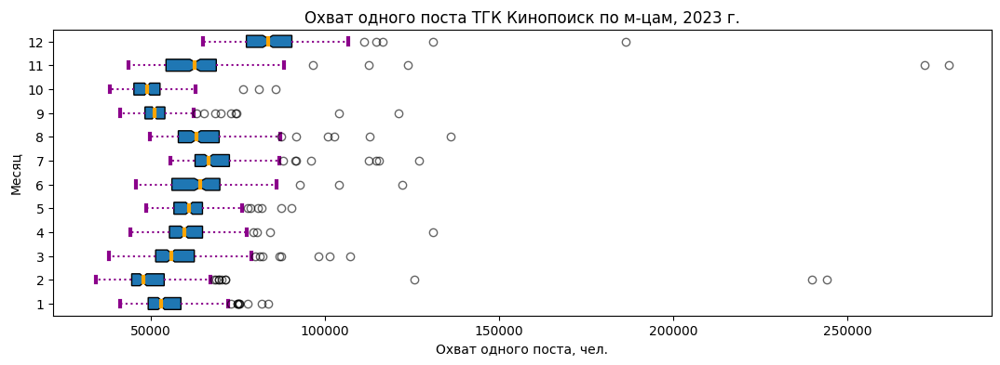

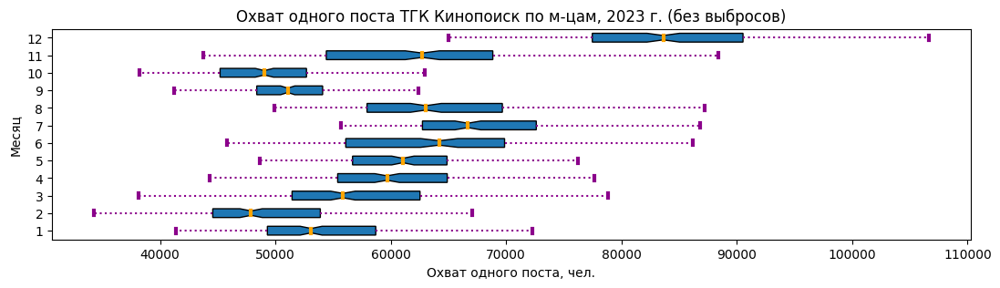

In [ ]:
# Визуализация описательных статистик метрики охват одного поста ТГК Кинопоиск по м-цам
boxploter(posts_metric, 'reach_post', 'Охват одного поста, чел.', 'Месяц', "Охват одного поста ТГК Кинопоиск по м-цам, 2023 г.")

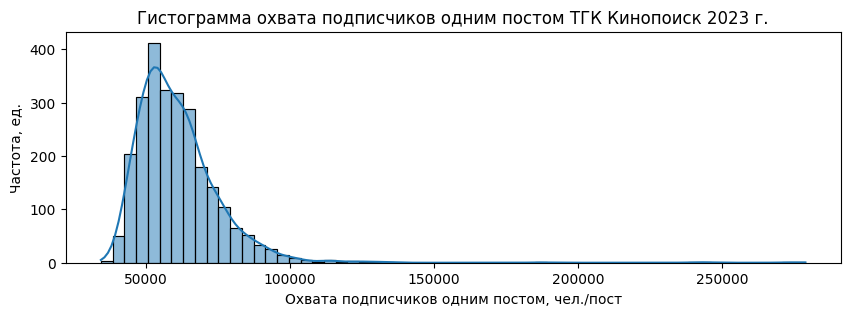

In [ ]:
# Построим гистограмму охвата подписчиков одним постом ТГК Кинопоиск 2023 г.
plt.figure(figsize=(10, 3))
sns.histplot(x = posts_metric['reach_post'], bins=60, kde=True)
plt.title('Гистограмма охвата подписчиков одним постом ТГК Кинопоиск 2023 г.')
plt.xlabel('Охвата подписчиков одним постом, чел./пост')
plt.ylabel('Частота, ед.');

In [ ]:
#Топ-10 постов по охвату за 2023 г.
posts_metric.sort_values(by='reach_post', ascending=False).head(10)[['day', 'id', 'text', 'reach_post']]

,day,id,text,reach_post
402,2023-11-07,35809,💯 100. Великих. Фильмов. XXI века\n\nПредставл...,278962
295,2023-11-20,36059,Не выходи из комнаты и ешь сыр 🧀\n\nТаким реце...,272087
2205,2023-02-11,31733,Прямо сейчас общаемся в прямом эфире с Владисл...,244143
2207,2023-02-11,31731,"«Вавилон» — кино о кино, поэтому в нем много о...",239884
153,2023-12-09,36462,Журналист «Загадки дыры» пишет книгу о прошлом...,186321
959,2023-08-18,34440,"«Когда мне предложили спеть за Супер-Кота, я с...",136156
113,2023-12-14,36570,Как звучали фильмы в немую эпоху? Почему Ян Ти...,131097
1695,2023-04-18,32703,Вы просили — мы сделали! \n\nРасширенное интер...,131016
1214,2023-07-10,33834,Свежий Итсэлайв уже завтра!\n\nГостями прямого...,127110
2102,2023-02-25,31934,В Берлине подвели итоги 73-го Берлинского кино...,125732


In [ ]:
#АНТИтоп-10 постов по охвату за 2023 г.
posts_metric.sort_values(by='reach_post').head(10)[['day', 'id', 'text', 'reach_post']]

,day,id,text,reach_post
2185,2023-02-14,31772,Горшок и Князь на постере сериала «Король и Шу...,34256
2009,2023-03-10,32102,"Яндекс выпустил большое исследование, посвящен...",38139
556,2023-10-16,35420,"⚡️Принцесса Диана, принц Чарльз, Елизавета II ...",38228
552,2023-10-17,35434,"Постер «Мальчика и птицы» Хаяо Миядзаки, опубл...",38258
2007,2023-03-10,32109,До #Оскар2023 осталось три дня.\n\nПродолжаем ...,39046
551,2023-10-17,35435,Фанаты Майка Флэнагана тут? \n\nНа Netflix выш...,39082
585,2023-10-12,35351,26 октября состоится премьера первой серии дра...,39098
2255,2023-02-07,31642,Джон Красински поделился фото со съемок фильма...,39322
559,2023-10-16,35408,"На днях Майкл Кейн объявил, что уходит из кино...",39546
544,2023-10-18,35452,⚡️ Завершились съемки третьего сезона «Триггер...,39852


____________
___________
**Промежуточный вывод:**
- глубина анализа 2023 г.;
- среднее кол-во просмотров (охват) одного поста - 60 950;
- минимальное кол-во просмотров - 34 256 (февральский пост-"Горшок и князь" постер к сериалу "Король и шут");
- максимальное кол-во просмотров - 278 962 (ноябрьский пост - 100 великих фильма 21 века);
- интересно данны показатель изучать по месяцам и проводить сравнительный анализ кол-ва просмотров от месяца к месяцу;
- в сентябре-ноябре 2023 г. наблюдалось снижение количества просмотров поста;
- хорошие показатели просмотров были в летние месяцы - июнь_август;
- максимальное количество просмотров пришлось на ноябрь - декабрь 2023 г. Однако в этот период произошел двухкратный рост числа подписчиков, а количество просмотров одного поста выросло существенно меньше.

Показатель охват одного поста - очень важный показатель, его можно и нужно отслеживать регулярно: ежедневно, еженедельно, ежемесячно.

Он позволяет количественно измерять интерес аудитории канала к контенту и своевременно реагировать на запросы аудитории.

Показатель может быть использован в качестве KPI сотрудников ТГК.
_______________
_______________


###### **3.5.6.2.2. Показатель ER одного поста**

___________
ER = Количество просмотров поста/Общее количество подписчиков на момент публикации поста * 100%
________________

In [ ]:
# Создадим таблицу описательных статистик метрики ER одного поста ТГК Кинопоиск по м-цам
print('Таблица описательных статистик метрики ER одного поста ТГК Кинопоиск по м-цам, %')
print()
month_describer(posts_metric, 'er_post', 'float')

Таблица описательных статистик метрики ER одного поста ТГК Кинопоиск по м-цам, %



,indicator,all,1,2,3,4,5,6,7,8,9,10,11,12
0,mean,21.68095,23.86864,22.09487,23.25698,23.50379,23.43000,24.08239,24.84427,22.48147,17.95519,17.16659,19.62230,18.76194
1,std,5.10571,3.54110,8.48289,3.86115,3.45929,2.66705,3.94877,3.69819,3.72957,2.73075,2.24868,6.93811,2.41949
2,min,13.27000,17.89000,14.60000,15.87000,17.18000,18.39000,17.32000,19.84000,17.34000,14.22000,13.27000,15.15000,14.48000
3,25%,18.54000,21.39000,19.08250,20.84750,21.46000,21.48000,21.25750,22.54250,20.14000,16.63500,15.64000,17.49000,17.64500
4,50%,21.08000,23.11500,20.53500,22.53500,23.14000,23.14000,24.09500,24.01000,21.85000,17.59000,17.00000,18.53000,18.54000
5,75%,23.89000,25.59500,22.87750,24.66000,25.21500,24.77000,26.09500,26.29750,24.11500,18.57500,18.23500,19.93000,19.50500
6,max,104.06000,36.37000,104.06000,42.40000,50.81000,34.63000,46.04000,46.01000,46.91000,41.94000,29.73000,95.81000,43.12000


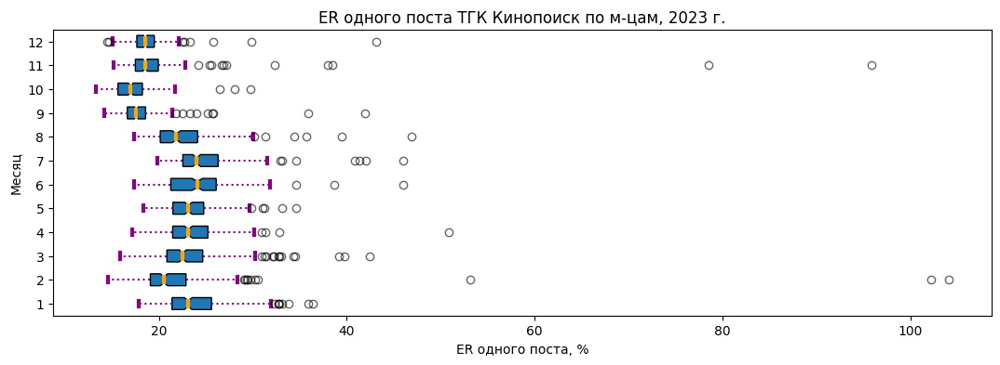

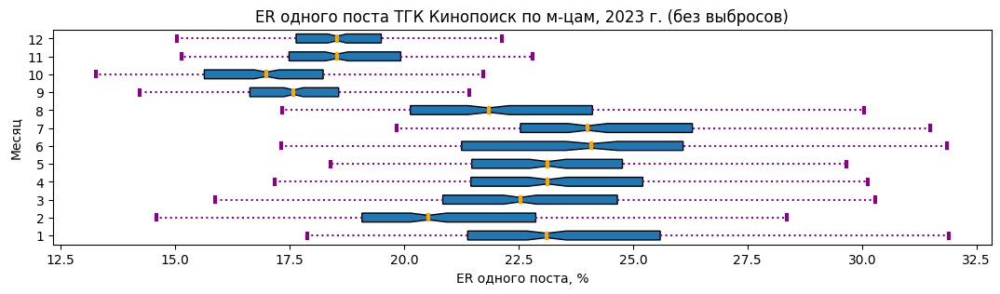

In [ ]:
# Визуализация описательных статистик метрики ER одного поста ТГК Кинопоиск по м-цам
boxploter(posts_metric, 'er_post', 'ER одного поста, %', 'Месяц', "ER одного поста ТГК Кинопоиск по м-цам, 2023 г.")

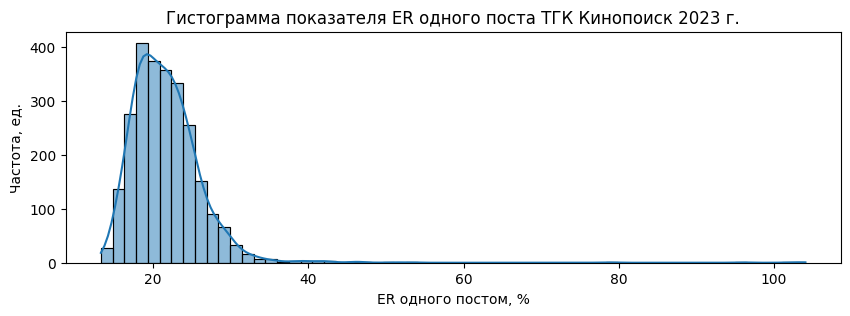

In [ ]:
# Построим гистограмму показателя ER одного поста ТГК Кинопоиск 2023 г.
plt.figure(figsize=(10, 3))
sns.histplot(x = posts_metric['er_post'], bins=60, kde=True)
plt.title('Гистограмма показателя ER одного поста ТГК Кинопоиск 2023 г.')
plt.xlabel('ER одного постом, %')
plt.ylabel('Частота, ед.');

In [ ]:
#Топ-10 постов по ER за 2023 г.
pd.set_option('display.max_colwidth', 200)
posts_metric.sort_values(by='er_post', ascending=False).head(10)[['day', 'id', 'text', 'er_post']]

,day,id,text,er_post
2205,2023-02-11,31733,"Прямо сейчас общаемся в прямом эфире с Владиславом Тироном и Милой Ершовой — звездами сериала «Фандорин. Азазель». \n\nОбсуждаем с ребятами съемки, последние новости о кино и многое другое. Трансл...",104.06000
2207,2023-02-11,31731,"«Вавилон» — кино о кино, поэтому в нем много отсылок к другим фильмам, особенно к классике. \n\nПоказываем главные референсы в нашем видео.",102.25000
402,2023-11-07,35809,"💯 100. Великих. Фильмов. XXI века\n\nПредставляем наш новый спецпроект! На этой неделе в честь нашего дня рождения (сегодня нам 20 лет!) мы будем делать то, что любим больше всего — рассказывать в...",95.81000
295,2023-11-20,36059,"Не выходи из комнаты и ешь сыр 🧀\n\nТаким рецептом [поделился](https://www.youtube.com/watch?v=Rf_gzOjR7rc) Киллиан Мёрфи во время сессии вопросов и ответов об «Оппенгеймере». Актер рассказал, что...",78.55000
2102,2023-02-25,31934,"В Берлине подвели итоги 73-го Берлинского кинофестиваля. Жюри в этом году возглавляла Кристен Стюарт, а лучшим фильмом стала картина «На Адаманте» Николя Филибера. \n\nМы следили за церемонией наг...",53.17000
1695,2023-04-18,32703,"Вы просили — мы сделали! \n\nРасширенное интервью Андрея Князева и Влада Коноплёва о работе над сериалом «Король и Шут», о прошлом и настоящем группы, своих любимых песнях и источниках вдохновения...",50.81000
959,2023-08-18,34440,"«Когда мне предложили спеть за Супер-Кота, я сначала отнесся к этой идее скептически. Но потом посмотрел несколько серий и, если честно, залип».\n\nНа экранах кинотеатров — мультфильм «Леди Баг и ...",46.91000
1342,2023-06-17,33501,"Как «Джон Уик» изменил жанр боевика? Почему Киану Ривз — идеальный выбор на роль жестокого киллера с душевной раной? Зачем режиссер Чад Стахелски цитирует в своей франшизе Бернардо Бертолуччи, Вон...",46.04000
1214,2023-07-10,33834,"Свежий Итсэлайв уже завтра!\n\nГостями прямого эфира, который пройдет на Плюс Даче, станут звезды сериала «Пищеблок». Вспомним первый сезон, обсудим, как создавался второй, какие новые герои в нем...",46.01000
153,2023-12-09,36462,"Журналист «Загадки дыры» пишет книгу о прошлом Катамарановска. А зрители знакомятся с молодыми версиями Инженера, Розы Робота и других героев скетчей Антона Лапенко — на этот раз в пионерском лаге...",43.12000


In [ ]:
#АНТИтоп-10 постов по ER за 2023 г.
pd.set_option('display.max_colwidth', 200)
posts_metric.sort_values(by='er_post').head(10)[['day', 'id', 'text', 'er_post']]

,day,id,text,er_post
556,2023-10-16,35420,"⚡️Принцесса Диана, принц Чарльз, Елизавета II и другие — на первых кадрах финального сезона «Короны». \n\nПремьера на Netflix — 16 ноября.\n\nПодписывайтесь на [**«Кинопоиск | Новости»**](https:/...",13.27000
552,2023-10-17,35434,"Постер «Мальчика и птицы» Хаяо Миядзаки, опубликованный французским прокатчиком мультфильма.\n\nВ России новая работа режиссера «Порко Россо» и «Принцессы Мононоке» выйдет в прокат 7 декабря, ее в...",13.30000
585,2023-10-12,35351,26 октября состоится премьера первой серии драмы [**«Цикады»**](https://www.kinopoisk.ru/series/5365497/?utm_referrer=www.google.com&utm_source=telegram&utm_medium=social) от создателей «Нулевого ...,13.49000
551,2023-10-17,35435,Фанаты Майка Флэнагана тут? \n\nНа Netflix вышел новый мини-сериал мастера «Падение дома Ашеров» 👻\n\nПри чем тут Эдгар Аллан По и каким вышло шоу — рассказываем в наших карточках.\n\n🎬 Подписывай...,13.59000
559,2023-10-16,35408,"На днях Майкл Кейн объявил, что уходит из кино.\n\nПровожаем великого британского артиста подборкой его лучших ролей. \n\n📸: Getty Images\n\n🎬 Подписывайтесь на [**«Кинопоиск»**](https://t.me/kino...",13.72000
544,2023-10-18,35452,"⚡️ Завершились съемки третьего сезона «Триггера».\n\nОб этом сообщил Максим Матвеев в своих соцсетях: «Стоп, снято! Третий сезон начал свой путь к зрителю… Невероятно люблю нашу группу!».\n\nНовые...",13.87000
577,2023-10-13,35367,"К цифровому релизу «Неудержимых 4» [пересмотрели](https://www.kinopoisk.ru/media/article/4008418/?utm_source=telegram&utm_medium=social) предыдущие три части за вас и рассказываем, что в них произ...",13.89000
576,2023-10-13,35368,"Почему [уровни](https://www.youtube.com/watch?v=1wHRYMW-_ao) называются уровнями? Когда это слово начало использоваться, чтобы обозначать игровые этапы?\n\nСпециально для [**«Кинопоиск | Игры»**](...",13.94000
569,2023-10-14,35387,"Майкл Фассбендер настолько вжился в роль киллера, что на съемках «Убийцы» Дэвида Финчера… ни разу не моргнул. \n\nКак [рассказал](https://www.indiewire.com/news/general-news/michael-fassbender-did...",14.13000
571,2023-10-14,35376,"Новинки-новиночки!\n\nСобрали фильмы и сериалы, которые вышли на стримингах на этой неделе.",14.15000


_____________

**Пояснение:**

Откуда 104%?!

Столбец 'view' - на повторный просмотр пользователем следующий день рассматривает как новый просмотр.

Увы, другой информации нет.

____________


___________
____________
**Промежуточные итоги:**


не уверена, что данный показатель нужно было рассчитывать, классическая формула предполагает расчет ER одного поста за месяц.

Однако, показатель интуитивно понятен и его легко рассчитать.

**ER - это % от общего количества подписчиков на день публикации поста, которые просмотрели данный пост.**

- средний показатель ER поста в 2023 г. - 21.68%;
- минимальный показатель ER поста в 2023 г. - 13.27% (октябрьский пост - пост о финальном сезоне «Короны»);
- максимальный показатель - 104.06% (февральский пост - прямой эфир со звездами сериала Фандорин и Азазель);
- интересно изучать данный показатель в разрезе месяцев года и проводить сравнительный анализ от месяца к месяцу;
- лучшие значения показателя были зарегистрированы в январе, июле и июне 2023 г.;
- худщие показатели - в сентябре и октябре.

Показатель ER в отличие от показателя охвата, учитывает одновременно количество просмотров и общее количество подписчиков ТГК.

Особенно интересно изучать показатель ER за ноябрь-декабрь 2023 г. - количество подписчиков выросло в разы, а показатель ER был низким по сравнению с другими месяцами.

**Аудитория, подписавшаяся на канал, не заинтересована в просмотре его контента...**

**Чтобы удержать новую аудиторию, нужно внимательно следить за показателем охват одного поста, изучать реакции на отдельные посты и менять контент с учетом интересов вновь приобретенной аудитории**.

Однако смена контента может не понравиться постоянной аудитории.

Нужно искать баланс.
______________
_____________

###### **3.5.6.2.3. Показатель ERR одного поста**

_______________
ERR = Общее количество реакций на пост(комментарии, репосты, эмодзи)/Количество просмотров поста * 100%
___________

In [ ]:
# Создадим таблицу описательных статистик метрики ERR одного поста ТГК Кинопоиск по м-цам
print('Таблица описательных статистик метрики ERR одного поста ТГК Кинопоиск по м-цам, %')
print()
err = month_describer(posts_metric, 'err_post', 'float')

Таблица описательных статистик метрики ERR одного поста ТГК Кинопоиск по м-цам, %



,indicator,all,1,2,3,4,5,6,7,8,9,10,11,12
0,mean,1.27894,1.25000,1.21803,1.24933,1.26031,1.46322,1.26233,1.09865,1.17838,1.46953,1.50090,1.25111,1.15052
1,std,1.03081,0.76498,0.75391,0.87174,1.09235,1.36446,1.13893,0.91943,0.82085,1.35403,1.28571,0.92971,0.88197
2,min,0.11000,0.26000,0.11000,0.27000,0.21000,0.25000,0.20000,0.21000,0.21000,0.25000,0.24000,0.19000,0.18000
3,25%,0.64000,0.72000,0.64750,0.68750,0.68000,0.70000,0.61000,0.56000,0.55000,0.67250,0.71000,0.62500,0.56000
4,50%,0.99000,1.02500,1.02500,0.98000,0.99000,1.10000,0.96000,0.88500,0.86000,1.03000,1.10000,1.00000,0.95000
5,75%,1.56000,1.62750,1.56250,1.53250,1.47000,1.73000,1.49000,1.30000,1.56500,1.79750,1.85000,1.49500,1.44000
6,max,11.86000,4.91000,4.30000,6.78000,11.75000,10.90000,7.06000,7.49000,3.75000,8.98000,11.86000,6.78000,7.16000


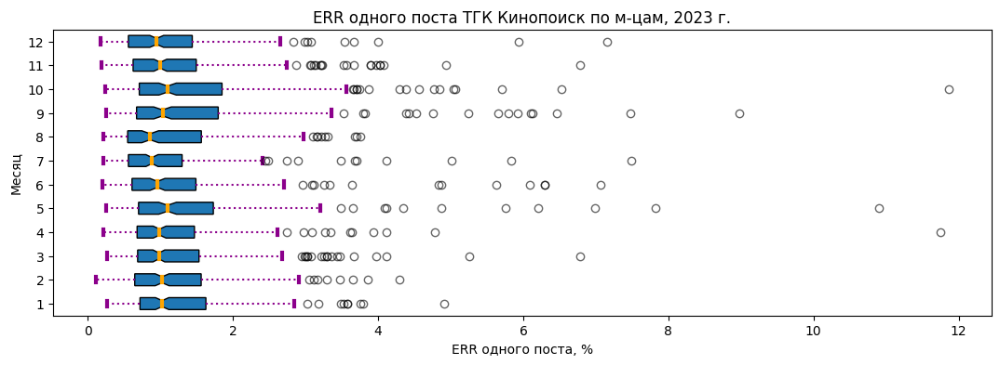

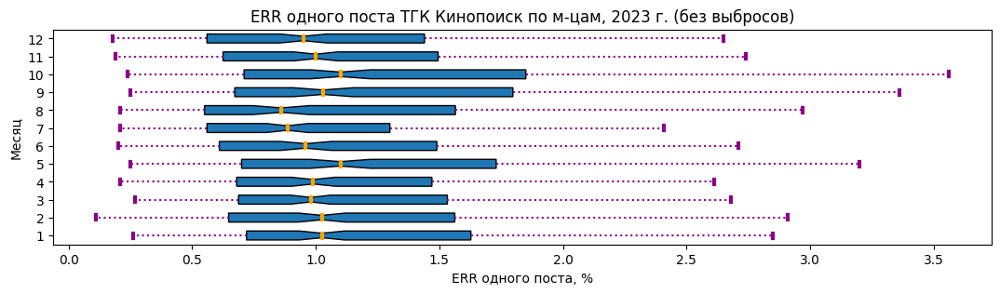

In [ ]:
# Визуализация описательных статистик метрики ERR одного поста ТГК Кинопоиск по м-цам
boxploter(posts_metric, 'err_post', 'ERR одного поста, %', 'Месяц', "ERR одного поста ТГК Кинопоиск по м-цам, 2023 г.")

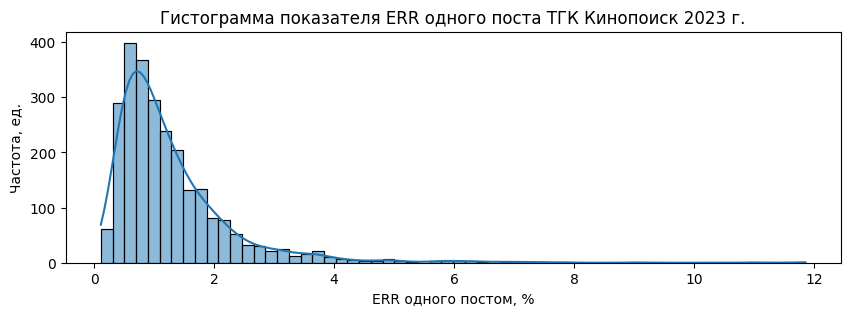

In [ ]:
# Построим гистограмму показателя ERR одного поста ТГК Кинопоиск 2023 г.
plt.figure(figsize=(10, 3))
sns.histplot(x = posts_metric['err_post'], bins=60, kde=True)
plt.title('Гистограмма показателя ERR одного поста ТГК Кинопоиск 2023 г.')
plt.xlabel('ERR одного постом, %')
plt.ylabel('Частота, ед.');

In [ ]:
#Топ-10 постов по ERR за 2023 г.
posts_metric.sort_values(by='err_post', ascending=False).head(10)[['day', 'id', 'text', 'err_post']]

,day,id,text,err_post
467,2023-10-29,35634,Умер звезда «Друзей» Мэттью Перри. Ему было 54 года.\n\nФото: Getty Images,11.86000
1647,2023-04-26,32799,5 тысяч сердечек на этом посте и мы ставим Кена-Гослинга на аватарку канала 💖,11.75000
1507,2023-05-22,33123,Ушла эпоха!\n\n__Будете __[__скучать__](https://t.me/kinopoisk_Industry/1936)__ по привычному дубляжу Леонардо__ __ДиКаприо?\n__❤️__ - да__ \n👎__ - нет__,10.90000
858,2023-09-04,34691,"Кристофер Нолан — лучший режиссер последних 25 лет по версии [Rotten Tomatoes](https://editorial.rottentomatoes.com/article/best-directors-of-the-last-25-years/).\n\n__Согласны?\n\n👍 — да, гений!\...",8.98000
1543,2023-05-16,33042,"Перезапуск «Назад в будущее»? \n\nТаких планов пока нет, но исполнитель роли Марти Макфлая, Майкл Дж. Фокс, уже [сформировал](https://variety.com/2023/film/news/michael-j-fox-christopher-lloyd-bac...",7.82000
1151,2023-07-19,33980,«Барбигеймер» уже на «томатах»!\n\n__За кого болеете?\n__👍__ __—__ Нолан __— __гений\n__❤️__ __—__ «Барби» — это все__,7.49000
770,2023-09-17,34915,Нолан — гений! Теперь официально.\n\n__Рады за режиссера?\n❤️ — еще как!\n👎 — не особо \n\n__🎬 Подписывайтесь на [**«Кинопоиск»**](http://t.me/kinopoisk),7.48000
98,2023-12-17,36607,"Гэри Олдман благодарит судьбу за «Гарри Поттера» и «Темного рыцаря». Актер [признался,](https://www.indiewire.com/news/general-news/gary-oldman-harry-potter-and-batman-movies-saved-me-1234936398/)...",7.16000
1421,2023-06-05,33330,Капитан Джек Воробей может вернуться!\n\n__Ждете продолжение?\n__❤️__ __—__ конечно! \n__👎__ __—__ не особо__,7.06000
1492,2023-05-24,33160,«Ведьмак» после ухода Генри Кавилла — почему?\n\nШоураннер сериала Лорен Шмидт Хиссрик объяснила решение продолжать сериал после смены актера: «У нас был выбор — заставить Геральта уйти и закончит...,6.99000


In [ ]:
#АНТИтоп-10 постов по ERR за 2023 г.
posts_metric.sort_values(by='err_post').head(10)[['day', 'id', 'text', 'err_post']]

,day,id,text,err_post
2205,2023-02-11,31733,"Прямо сейчас общаемся в прямом эфире с Владиславом Тироном и Милой Ершовой — звездами сериала «Фандорин. Азазель». \n\nОбсуждаем с ребятами съемки, последние новости о кино и многое другое. Трансл...",0.11000
13,2023-12-30,36809,**Последний дайджест наших** **подкастов в этом году! \n**\n👀 [**«Крупным планом»**.](https://podcast.ru/e/06QdpzegWu~?utm_source=telegram&utm_medium=social) Обсудили главные события и тенденции у...,0.18000
200,2023-12-02,36300,"**Свежий дайджест подкастов Кинопоиска! Что вышло на этой неделе**.\n\n👀 [**«Крупным планом»**.](https://podcast.ru/e/68B2O8wndIF?utm_source=telegram&utm_medium=social) Разобрали, как устроен вели...",0.18000
2141,2023-02-18,31857,"Заслушаться можно! Публикуем традиционный дайджест наших подкастов, которые вышли на этой неделе.\n\n👀 [**«Крупным планом».**](https://podcast.ru/1526671261)** **Редактор Кинопоиска Даулет Жанайда...",0.18000
305,2023-11-18,36040,"**Свежий дайджест подкастов! Рассказываем, что вышло на этой неделе**.\n\n👀 [**«Крупным планом»**](https://podcast.ru/e/.nVAtL5CmK5). Даулет Жанайдаров и Всеволод Коршунов рассказывают о своих дес...",0.19000
55,2023-12-23,36695,"**Скорсезе, чушпаны, Сокуров и финал «Короны» — в дайджесте наших подкастов. **\n\n👀 [**«Крупным планом»**](https://podcast.ru/1526671261?utm_source=telegram&utm_medium=social)** № 1.** Даулет Жан...",0.20000
1344,2023-06-17,33499,**О безумии и «Теде Лассо» — встречайте свежий** **дайджест наших подкастов!\n**\n📺 [**«В предыдуших сериях»**](https://podcast.ru/e/4u3ikr9Miur). Обсуждаем финал самого душевного и позитивного се...,0.20000
1765,2023-04-08,32566,"Слушаем подкасты, которые вышли на этой неделе! \n\n👀 [**«Крупным планом»**](https://podcast.ru/e/kNSnmPORJz?utm_source=telegram&utm_medium=social). Делимся впечатлениями от четвертой части «Джона...",0.21000
1039,2023-08-05,34256,"**Подготовили свежий дайджест наших подкастов! Что вышло на этой неделе:\n**\n👀 [**«Крупным планом»**](https://podcast.ru/e/1sCgkCjBf9~?utm_source=telegram&utm_medium=social). Обсудили, как устрое...",0.21000
1257,2023-07-03,33744,"**Пачка сериалов, «Паутина вселенных» и музыка — в дайджесте подкастов. **\n\n👀 [**«Крупным планом»**](https://podcast.ru/1526671261). Обсуждаем продолжение анимационной серии о мультивселенной «Ч...",0.21000


___________
____________
**Промежуточные итоги:**


не уверена, что данный показатель нужно было рассчитывать, классическая формула предполагает расчет ERR одного поста за месяц.

Однако, показатель интуитивно понятен и его легко рассчитать.

**ERR - это количество реакций(комментариев, репостов, эмодзи), которые приходятся на один просмотр поста, выраженное в %**

- средний показатель ERR поста в 2023 г. - 1.28%;
- минимальный показатель ERR поста в 2023 г. - 0.11% (февральский пост с интервью звезд сериала «Фандорин. Азазель»...он набрал рекордное кол-во просмотров...а вот реакций - нет);
- максимальный показатель - 11.86% (ноябрьский пост на смерть Мэттью Перри);
- интересно изучать данный показатель в разрезе месяцев года и проводить сравнительный анализ от месяца к месяцу;
- ERR показал себя как самый стабильный показатель, он равномерно распределен по месяцам.

Показатель ERR в отличие от показателя ER, не учитывает общее количество подписчиков ТГК. ERR показывает степень вовлеченночти подписчиков, просмотревших пост.

ERR для KPI не подходит, скорее он нужен для изучения действующей аудитории канала.

Те кто вообще не просматривают посты - это абсолютное неизвестное, а вот подписчиков, просматривающих посты можно изучать и на их основе настраивать контент.

Помнится кто-то сказал, что жалоба - это подарок. Реакции - это тоже подарок, ключ к пониманию своей аудитории.
______________
_____________

###### **3.5.6.2.4. Показатель rate_conversion одного поста**

_______________
rate_conversion = Количество новых подписчиков (приток за день)/ Количество просмотров одного поста * 100%
_________________

In [ ]:
# Создадим таблицу описательных статистик метрики rate_conversion одного поста ТГК Кинопоиск по м-цам
print('Таблица описательных статистик метрики rate_conversion одного поста ТГК Кинопоиск по м-цам, %')
print()
err = month_describer(posts_metric, 'rate_conversion_post', 'float')

Таблица описательных статистик метрики rate_conversion одного поста ТГК Кинопоиск по м-цам, %



,indicator,all,1,2,3,4,5,6,7,8,9,10,11,12
0,mean,3.29948,0.39946,0.40816,0.64194,0.35421,1.83186,2.54639,3.29609,3.33141,2.22374,2.35444,11.39991,10.76294
1,std,4.32291,0.36204,0.30954,0.98890,0.70016,1.05882,0.64729,0.40696,0.50801,0.67449,0.79372,6.28066,2.99803
2,min,0.03000,0.12000,0.06000,0.04000,0.05000,0.03000,0.98000,1.77000,1.66000,0.94000,0.76000,0.93000,1.72000
3,25%,0.35000,0.22250,0.19000,0.19000,0.12000,1.37000,2.01000,3.06000,2.98000,1.59250,2.31500,7.20000,9.82500
4,50%,2.20000,0.29000,0.32500,0.31000,0.17000,2.10000,2.58000,3.34000,3.33000,2.32000,2.64000,12.24000,11.48000
5,75%,3.34000,0.46750,0.49000,0.59000,0.23000,2.32000,3.07000,3.56000,3.72500,2.77000,2.84500,15.94000,12.42500
6,max,26.87000,2.47000,1.36000,5.44000,3.91000,5.65000,4.07000,4.29000,4.67000,3.94000,3.75000,26.87000,17.79000


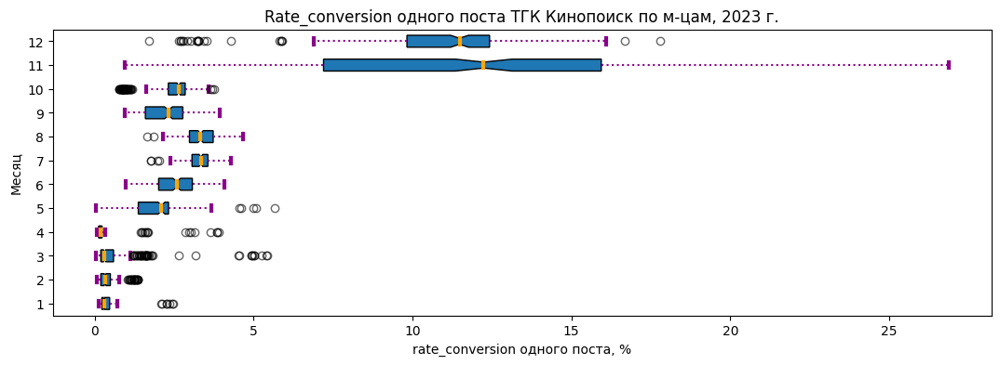

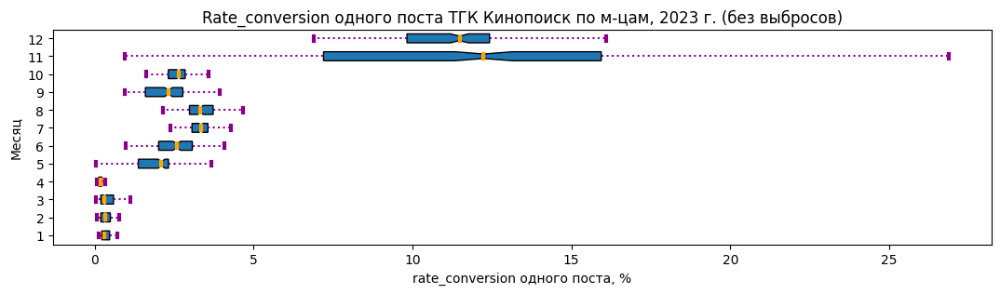

In [ ]:
# Визуализация описательных статистик метрики rate_conversion одного поста ТГК Кинопоиск по м-цам
boxploter(posts_metric, 'rate_conversion_post', 'rate_conversion одного поста, %', 'Месяц', "Rate_conversion одного поста ТГК Кинопоиск по м-цам, 2023 г.")

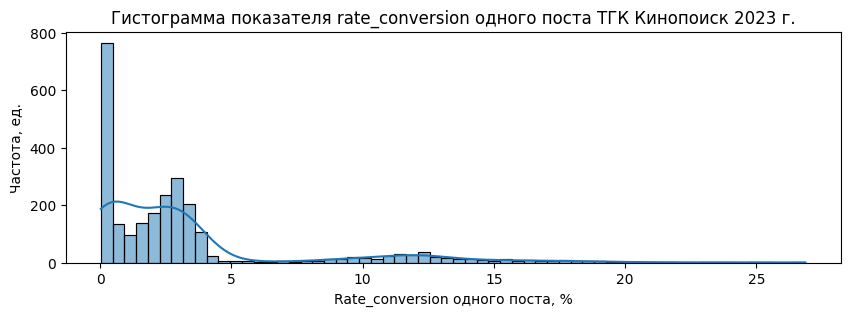

In [ ]:
# Построим гистограмму показателя rate_conversion одного поста ТГК Кинопоиск 2023 г.
plt.figure(figsize=(10, 3))
sns.histplot(x = posts_metric['rate_conversion_post'], bins=60, kde=True)
plt.title('Гистограмма показателя rate_conversion одного поста ТГК Кинопоиск 2023 г.')
plt.xlabel('Rate_conversion одного поста, %')
plt.ylabel('Частота, ед.');

___________
____________
**Промежуточные итоги:**


опять не уверена, что данный показатель нужно было рассчитывать, но его выбрала команда.

Этот показатель уже не так интуитивно понятен как ER и ERR, но его тоже легко рассчитать.

**Rate_conversion - это количество новых подписчиков, которые приходятся на один просмотр поста, выраженное в %. Этот показатель по-русски называют скоростью конверсии.**

- средний показатель Rate_conversion поста в 2023 г. - 3.3%;
- минимальный показатель ERR поста в 2023 г. - 0.03%;
- максимальный показатель - 26.87%;
- Rate_conversion был на минимумах с января по апрель;
- в мае - октябре зафиксировался на уровне 2-3%%;
- в ноябре-декабре показательно Rate_conversion просто взлетел. В чем причина?

В отличие от других показателей Rate_conversion учитывает приток новых подписчиков. И если новые подписчики не проявляют интереса к постам ТГК - показатель начинает сильно расти.

В качесте KPI я бы не рассматривала данный показатель.
Трудно требовать команды ТГ сразу разобраться с потребностями новой аудитории.

Привлекли подписчиков - это хорошо, кто-то из них все-равно станет постоянным подписчиков. Однако эффективность бота уже вызывает у меня сомнение.

Как долго в подписчиках останется аудитория, которой не интересен контент ТГК? Месяц? 2?
______________
_____________

##### **3.5.6.3. Расчет метрик за период (месяц): охват, ER, ERR**

In [ ]:
posts_metric.head(2)

,id,date,text,views,forwarded,reactions,comments,type_attachment,day,all_reactions,subscribers_all,subscribers_day,unsubscribed_day,reach_post,er_post,err_post,rate_conversion_post,month
0,36843,2023-12-31 21:04:56,С годом даркона!,74390,47,738,29,only_text,2023-12-31,814,513900,8541,-5466,74390,14.48000,1.09000,11.48000,12
1,36839,2023-12-31 18:02:03,"Привет, это команда Кинопоиска. \n \nВ Новый год принято подводить итоги и размышлять о будущем. Но вместо этого мы просто скажем вам спасибо. За ваши лайки и репосты, за критичные комментарии и...",87034,12,1218,31,MessageMediaPhoto,2023-12-31,1261,513900,8541,-5466,87034,16.94000,1.45000,9.81000,12


In [ ]:
posts_metric_month = posts_metric.groupby('month').agg({'id':'count', 'views':'mean', 'reactions':'mean', 'forwarded':'mean','comments':'mean', 'subscribers_all':'mean', 'subscribers_day':'mean', 'unsubscribed_day':'mean'}).reset_index()
posts_metric_month.columns = ['month_2023', 'count_posts', 'avg_views', 'avg_reactions', 'avg_forwarded', 'avg_comments',
       'avg_subscribers_all', 'avg_subscribers_day', 'avg_unsubscribed_day']
posts_metric_month['avg_all_reactions'] = posts_metric_month['avg_reactions'] + posts_metric_month['avg_forwarded'] + posts_metric_month['avg_comments']
posts_metric_month['reach_post'] = posts_metric_month['avg_views']
posts_metric_month['er_month'] = round(posts_metric_month['avg_views']/posts_metric_month['avg_subscribers_all']*100, 2)
posts_metric_month['err_month'] = round(posts_metric_month['avg_all_reactions']/posts_metric_month['avg_views']*100, 2)
posts_metric_month['rate_conversion_month'] = round(posts_metric_month['avg_subscribers_day']/posts_metric_month['avg_views']*100, 2)
posts_metric_month[['month_2023', 'count_posts', 'avg_views', 'avg_reactions',
       'avg_forwarded', 'avg_comments', 'avg_subscribers_all',
       'avg_subscribers_day', 'avg_unsubscribed_day', 'avg_all_reactions',
       'reach_post']] = posts_metric_month[['month_2023', 'count_posts', 'avg_views', 'avg_reactions',
       'avg_forwarded', 'avg_comments', 'avg_subscribers_all',
       'avg_subscribers_day', 'avg_unsubscribed_day', 'avg_all_reactions',
       'reach_post']].astype('int')
posts_metric_month

,month_2023,count_posts,avg_views,avg_reactions,avg_forwarded,avg_comments,avg_subscribers_all,avg_subscribers_day,avg_unsubscribed_day,avg_all_reactions,reach_post,er_month,err_month,rate_conversion_month
0,1,242,54891,455,191,40,230062,220,-63,687,54891,23.86000,1.25000,0.40000
1,2,228,51833,382,184,41,234475,204,-75,608,51833,22.11000,1.17000,0.39000
2,3,268,57861,515,176,42,248396,351,-53,734,57861,23.29000,1.27000,0.61000
3,4,195,60567,520,195,55,257706,225,-98,771,60567,23.50000,1.27000,0.37000
4,5,177,61547,630,233,48,262737,1112,-820,913,61547,23.43000,1.48000,1.81000
5,6,180,64201,575,173,45,266368,1651,-1304,795,64201,24.10000,1.24000,2.57000
6,7,192,69039,531,176,49,277963,2239,-1717,758,69039,24.84000,1.10000,3.24000
7,8,191,64970,545,187,36,288986,2123,-1711,770,64970,22.48000,1.19000,3.27000
8,9,214,52188,566,182,32,290705,1146,-1165,781,52188,17.95000,1.50000,2.20000
9,10,223,49578,564,164,29,288802,1178,-1087,758,49578,17.17000,1.53000,2.38000


###### **3.5.6.3.1. Охват одного поста за месяц 2023 г.**

______________
Охват одного поста за месяц — величина гораздо более показательная.

Считается он так:

берем охват всех постов на канале за 30 дней (без учета репостов из других каналов) и делим на количество постов. Получаем среднее количество просмотров поста.
__________


In [ ]:
# Выведем описательную статистику по охвату подписчиков одним постом ТГК КиноПоиск в 2023 г.
posts_metric_month['reach_post'].describe().to_frame().drop('count', axis=0).astype('int').style.format("{:,.0f}")

,reach_post
mean,"61,324"
std,"9,581"
min,"49,578"
25%,"54,215"
50%,"61,057"
75%,"64,509"
max,"84,863"


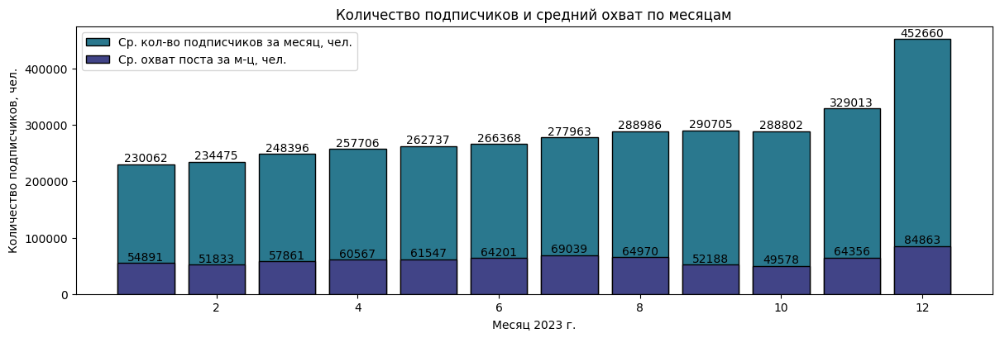

In [ ]:
# Построим график количество подписчиков и средний охват по месяцам
x_values = posts_metric_month['month_2023']
y1_values = posts_metric_month['avg_subscribers_all']
y2_values = posts_metric_month['reach_post']

fig, ax = plt.subplots(figsize=(12, 4))

bar1 = ax.bar(x_values, y1_values, color='#2A788EFF', label='Ср. кол-во подписчиков за месяц, чел.', edgecolor = 'black',)
bar2 = ax.bar(x_values, y2_values, color='#414487FF', label='Ср. охват поста за м-ц, чел.', edgecolor = 'black')

for bar in bar1:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{round(yval, 0):.0f}', ha='center', va='bottom', color='black').set_rotation(0)

for bar in bar2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{round(yval, 0):.0f}', ha='center', va='bottom', color='black').set_rotation(0)

ax.grid(False)
plt.legend(loc='best')
plt.title('Количество подписчиков и средний охват по месяцам')
plt.tight_layout()
plt.xlabel('Месяц 2023 г.')
plt.ylabel('Количество подписчиков, чел.')

plt.show()

In [ ]:
# Рассчитаем темп прироста охвата и темп прироста общего кол-ва подписчиков
posts_metric_month['reach_post_%'] = round(posts_metric_month['reach_post'].pct_change()*100, 2)
posts_metric_month['avg_subscribers_all_%'] = round(posts_metric_month['avg_subscribers_all'].pct_change()*100, 2)
posts_metric_month = posts_metric_month.fillna(0)
posts_metric_month.head(2)

,month_2023,count_posts,avg_views,avg_reactions,avg_forwarded,avg_comments,avg_subscribers_all,avg_subscribers_day,avg_unsubscribed_day,avg_all_reactions,reach_post,er_month,err_month,rate_conversion_month,reach_post_%,avg_subscribers_all_%
0,1,242,54891,455,191,40,230062,220,-63,687,54891,23.86000,1.25000,0.40000,0.00000,0.00000
1,2,228,51833,382,184,41,234475,204,-75,608,51833,22.11000,1.17000,0.39000,-5.57000,1.92000


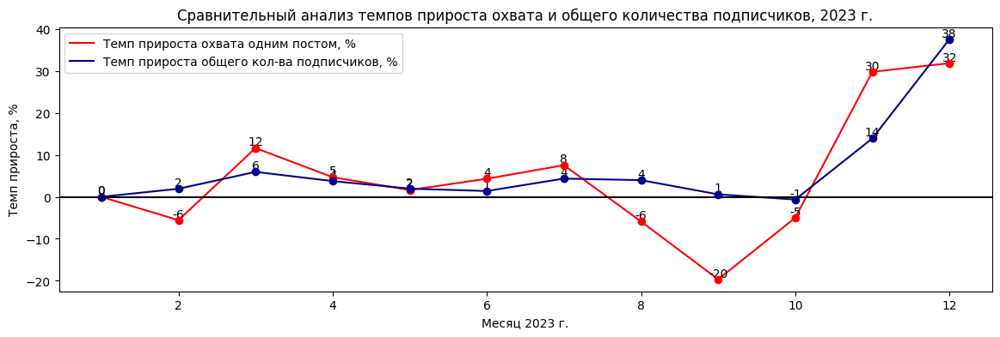

In [ ]:
# Построим график темпов прироста охвата и общего количества подписчиков
x_values = posts_metric_month['month_2023']
y1_values = posts_metric_month['reach_post_%']
y2_values = posts_metric_month['avg_subscribers_all_%']

fig, ax = plt.subplots(figsize=(14, 4))

line1, = ax.plot(x_values, y1_values, color='red', label='Темп прироста охвата одним постом, %')
line2, = ax.plot(x_values, y2_values, color='darkblue', label='Темп прироста общего кол-ва подписчиков, %')

for i, x in enumerate(x_values):
    ax.text(x, y1_values[i], f'{y1_values[i]:.0f}', ha='center', va='bottom', color='black')
    ax.scatter(x, y1_values[i], color='red', zorder=5)

    ax.text(x, y2_values[i], f'{y2_values[i]:.0f}', ha='center', va='bottom', color='black')
    ax.scatter(x, y2_values[i], color='darkblue', zorder=5)
plt.axhline(y = 0, color = 'black')
ax.grid(False)
plt.legend(loc='best')
plt.title('Сравнительный анализ темпов прироста охвата и общего количества подписчиков, 2023 г.')
plt.xlabel('Месяц 2023 г.')
plt.ylabel('Темп прироста, %');

______________
______________
**Промежуточный вывод:**

- средний охват одного поста за м-ц - 61 324 чел.;
- минимальный - 49 578 чел.;
- максимальный - 84 863 чел.;
- минимальным показатель был в сентябре-октябре;
- максимальные значения были достигнуты в ноябре-декабре.

Показатель не учитывает изменение общего количества подписчиков. Что следует из формулы расчета показателя и подтверждается графиком динамики темпов прироста двух показателей.

Охват одного поста - показатель, который можно использовать в качестве KPI ТГК.
____________
_____________

###### **3.5.6.3.2. Показатель ER за месяц 2023 г.**

____________
ER = (Суммарное количество просмотров за период/количество постов за период)/количество подписчиков*100%
______________


In [ ]:
# Выведем описательную статистику показателя ER ТГК КиноПоиск за месяц 2023 г.
posts_metric_month['er_month'].describe().to_frame().drop('count', axis=0)

,er_month
mean,21.75333
std,2.65696
min,17.17000
25%,19.35750
50%,22.88500
75%,23.59000
max,24.84000


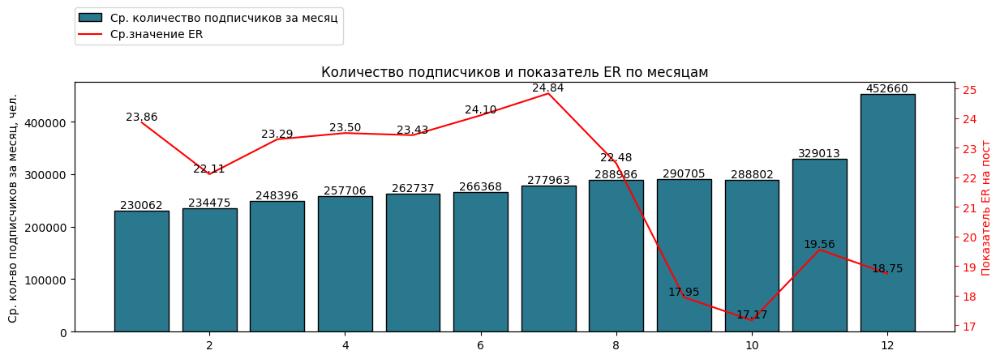

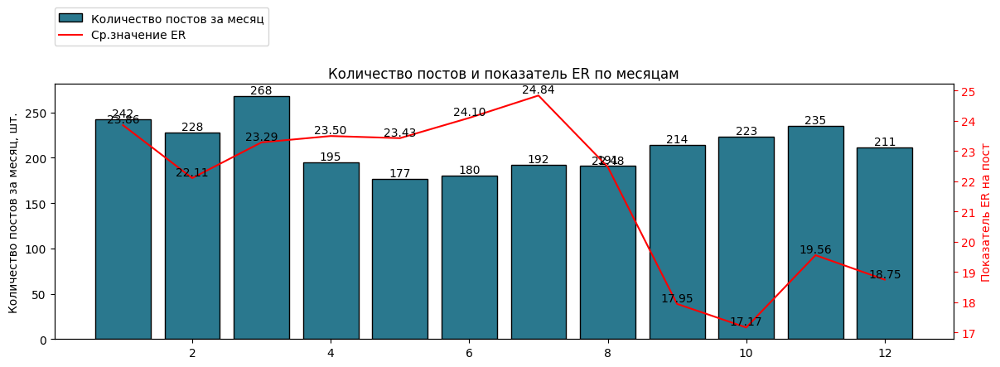

In [ ]:
# Построим график количество подписчиков и показатель ER по месяцам
x_values = posts_metric_month['month_2023']
y1_values = posts_metric_month['avg_subscribers_all']
y2_values = posts_metric_month['er_month']

fig, ax1 = plt.subplots(figsize=(14, 4))

bar1 = ax1.bar(x_values, y1_values, color='#2A788EFF', edgecolor = 'black', label='Ср. количество подписчиков за месяц')
for bar in bar1:
    yval = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.0f}', ha='center', va='bottom', color='black')

ax1.set_ylabel('Ср. кол-во подписчиков за месяц, чел.')

ax2 = ax1.twinx()
line2 = ax2.plot(x_values, y2_values, 'r', label='Ср.значение ER')  # График 2 на оси y2 (правая ось)
for i, val in enumerate(y2_values):
    ax2.text(x_values[i], val, f'{val:.2f}', ha='center', va='bottom', color='black',  rotation=0)

ax2.set_ylabel('Показатель ER на пост', color='r')
ax2.tick_params('y', colors='r')
ax1.grid(False)
ax2.grid(False)
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
lines = lines_1 + lines_2
labels = labels_1 + labels_2
plt.legend(lines, labels, loc=(0, 1.15))

plt.title('Количество подписчиков и показатель ER по месяцам')
plt.show()

# Построим график количество постов и показатель ER по месяцам
x_values = posts_metric_month['month_2023']
y1_values = posts_metric_month['count_posts']
y2_values = posts_metric_month['er_month']

fig, ax1 = plt.subplots(figsize=(14, 4))

bar1 = ax1.bar(x_values, y1_values, color='#2A788EFF', edgecolor = 'black', label='Количество постов за месяц')
for bar in bar1:
    yval = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.0f}', ha='center', va='bottom', color='black')

ax1.set_ylabel('Количество постов за месяц, шт.')

ax2 = ax1.twinx()
line2 = ax2.plot(x_values, y2_values, 'r', label='Ср.значение ER')  # График 2 на оси y2 (правая ось)
for i, val in enumerate(y2_values):
    ax2.text(x_values[i], val, f'{val:.2f}', ha='center', va='bottom', color='black',  rotation=0)

ax2.set_ylabel('Показатель ER на пост', color='r')
ax2.tick_params('y', colors='r')
ax1.grid(False)
ax2.grid(False)
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
lines = lines_1 + lines_2
labels = labels_1 + labels_2
plt.legend(lines, labels, loc=(0, 1.15))

plt.title('Количество постов и показатель ER по месяцам')
plt.xlabel('Месяц 2023 г.')
plt.show()

______________
_____________
**Промежуточный вывод:**

- среднее значение ER в 2023 г. - 21.75%;
- минимальное значение - 17.17%(октябрь);
- максимальное - 24.84%(июль);
- с июля тренд по показателю падающий, в ноябре- декабре падение остановилось благодаря мощному притоку новых подписчиков, но перейти в фазу роста показаель так и не смог.

Абсолютное значение показателя не похое для ТГ, хотя есть куда расти. Необходимо менять контент. Определяться с целевой аудиторией.

Данный показатель можно использовать в качестве KPI ТГК.
_______________
_______________

###### **3.5.6.3.3. Показатель ERR за месяц 2023 г.**

___________
ERR = (Суммарное количество реакций(комментарии, эмодзи, репост)/количество постов за период)/средний охват поста*100%

_____________

In [ ]:
# Выведем описательную статистику показателя ERR ТГК КиноПоиск за месяц 2023 г.
posts_metric_month['err_month'].describe().to_frame().drop('count', axis=0)

,err_month
mean,1.28250
std,0.14353
min,1.10000
25%,1.18500
50%,1.25000
75%,1.32250
max,1.53000


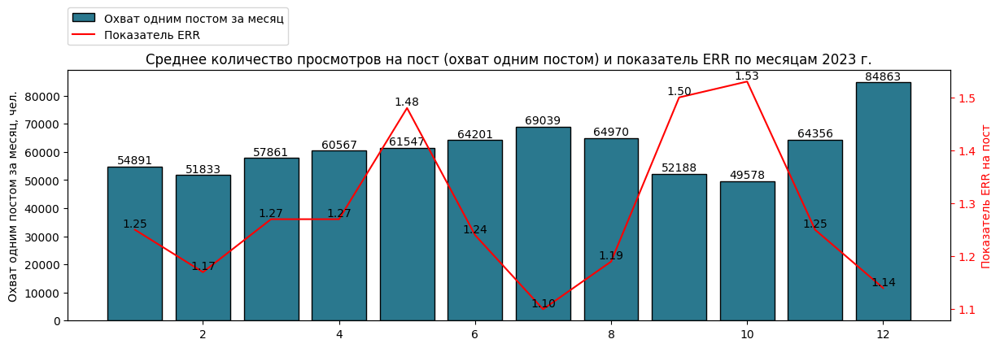

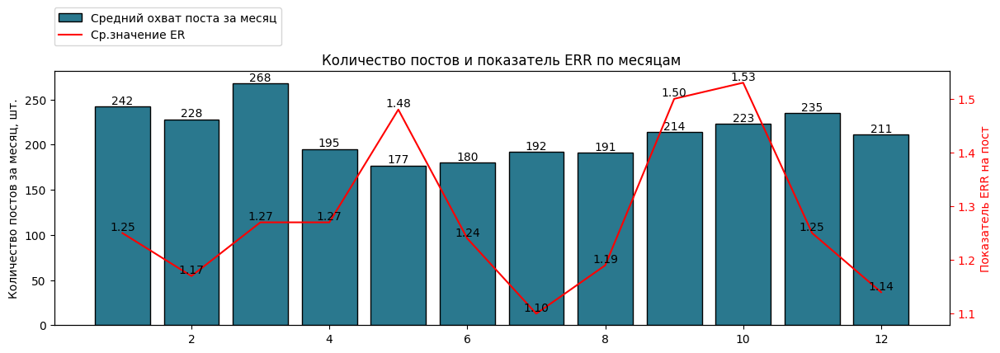

In [ ]:
# Построим график среднее количество просмотров на пост (охват одним постом) и показатель ER по месяцам
x_values = posts_metric_month['month_2023']
y1_values = posts_metric_month['avg_views']
y2_values = posts_metric_month['err_month']

fig, ax1 = plt.subplots(figsize=(14, 4))

bar1 = ax1.bar(x_values, y1_values, color='#2A788EFF', edgecolor = 'black', label='Охват одним постом за месяц')
for bar in bar1:
    yval = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.0f}', ha='center', va='bottom', color='black')

ax1.set_ylabel('Охват одним постом за месяц, чел.')

ax2 = ax1.twinx()
line2 = ax2.plot(x_values, y2_values, 'r', label='Показатель ERR')  # График 2 на оси y2 (правая ось)
for i, val in enumerate(y2_values):
    ax2.text(x_values[i], val, f'{val:.2f}', ha='center', va='bottom', color='black',  rotation=0)

ax2.set_ylabel('Показатель ERR на пост', color='r')
ax2.tick_params('y', colors='r')
ax1.grid(False)
ax2.grid(False)
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
lines = lines_1 + lines_2
labels = labels_1 + labels_2
plt.legend(lines, labels, loc=(0, 1.1))

plt.title('Среднее количество просмотров на пост (охват одним постом) и показатель ERR по месяцам 2023 г.')
plt.show()

# Построим график среднее количество просмотров на пост (охват одним постом) и показатель ERR по месяцам
x_values = posts_metric_month['month_2023']
y1_values = posts_metric_month['count_posts']
y2_values = posts_metric_month['err_month']

fig, ax1 = plt.subplots(figsize=(14, 4))

bar1 = ax1.bar(x_values, y1_values, color='#2A788EFF', edgecolor = 'black', label='Средний охват поста за месяц')
for bar in bar1:
    yval = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.0f}', ha='center', va='bottom', color='black')

ax1.set_ylabel('Количество постов за месяц, шт.')

ax2 = ax1.twinx()
line2 = ax2.plot(x_values, y2_values, 'r', label='Ср.значение ER')  # График 2 на оси y2 (правая ось)
for i, val in enumerate(y2_values):
    ax2.text(x_values[i], val, f'{val:.2f}', ha='center', va='bottom', color='black',  rotation=0)

ax2.set_ylabel('Показатель ERR на пост', color='r')
ax2.tick_params('y', colors='r')
ax1.grid(False)
ax2.grid(False)
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
lines = lines_1 + lines_2
labels = labels_1 + labels_2
plt.legend(lines, labels, loc=(0, 1.1))

plt.title('Количество постов и показатель ERR по месяцам')
plt.show()

______________
_____________
**Промежуточный вывод:**

- среднее значение ERR в 2023 г. - 1.28%;
- минимальное значение - 1.10%(июль);
- максимальное - 1.53%(октябрь);
- график показателя похож на синусоиду, то вверх, то вниз.

Рост количества просмотров при стабильном количестве реакций ведет к снижению показатея ERR. Поэтому первый провал мы видем в июле, когда охват достигал своего пикового значения и второй провал - в ноябре-декабре, когда количество просмотров выросло в след за ростом количества пользователей, а роста количества реакций не произошло.

Данный показатель может быть использован в качестве KPI ТГК, хотя на количество реакций подписчиков влиять сложнение, чем на охват и приток новых подписчиков.

Пока видно, что аудитория дарит реакции на подарки, реалити-шоу, встречи со звездами сериалов и топ лучши фильмов.

Еще аудитория зеркалит. И смайлик в тексте поста может вызвать желание оставить эмодзи в ответ.
_______________
_______________

###### **3.5.6.3.4. Показатель rate_conversion за месяц 2023 г.**

In [ ]:
# Выведем описательную статистику показателя rate_conversion ТГК КиноПоиск за месяц 2023 г.
posts_metric_month['rate_conversion_month'].describe().to_frame().drop('count', axis=0)

,rate_conversion_month
mean,3.28250
std,3.79898
min,0.37000
25%,0.55750
50%,2.29000
75%,3.24750
max,11.49000


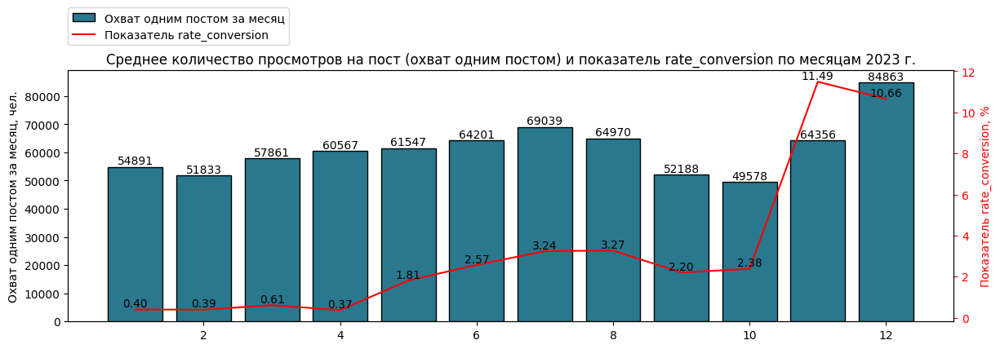

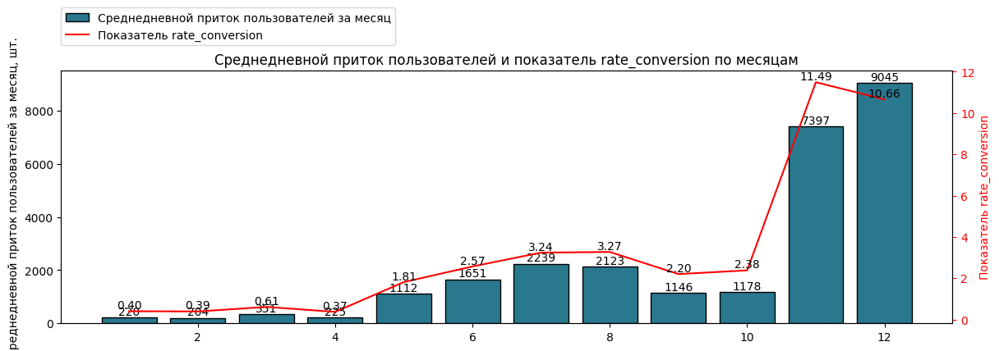

In [ ]:
# Построим график среднее количество просмотров на пост (охват одним постом) и показатель rate_conversion по месяцам
x_values = posts_metric_month['month_2023']
y1_values = posts_metric_month['avg_views']
y2_values = posts_metric_month['rate_conversion_month']

fig, ax1 = plt.subplots(figsize=(14, 4))

bar1 = ax1.bar(x_values, y1_values, color='#2A788EFF', edgecolor = 'black', label='Охват одним постом за месяц')
for bar in bar1:
    yval = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.0f}', ha='center', va='bottom', color='black')

ax1.set_ylabel('Охват одним постом за месяц, чел.')

ax2 = ax1.twinx()
line2 = ax2.plot(x_values, y2_values, 'r', label='Показатель rate_conversion')  # График 2 на оси y2 (правая ось)
for i, val in enumerate(y2_values):
    ax2.text(x_values[i], val, f'{val:.2f}', ha='center', va='bottom', color='black',  rotation=0)

ax2.set_ylabel('Показатель rate_conversion, %', color='r')
ax2.tick_params('y', colors='r')
ax1.grid(False)
ax2.grid(False)
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
lines = lines_1 + lines_2
labels = labels_1 + labels_2
plt.legend(lines, labels, loc=(0, 1.1))

plt.title('Среднее количество просмотров на пост (охват одним постом) и показатель rate_conversion по месяцам 2023 г.')
plt.show()

# Построим график средненевное количество новых подписчиков и показатель rate_conversion по месяцам
x_values = posts_metric_month['month_2023']
y1_values = posts_metric_month['avg_subscribers_day']
y2_values = posts_metric_month['rate_conversion_month']

fig, ax1 = plt.subplots(figsize=(14, 4))

bar1 = ax1.bar(x_values, y1_values, color='#2A788EFF', edgecolor = 'black', label='Среднедневной приток пользователей за месяц')
for bar in bar1:
    yval = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.0f}', ha='center', va='bottom', color='black')

ax1.set_ylabel('Среднедневной приток пользователей за месяц, шт.')

ax2 = ax1.twinx()
line2 = ax2.plot(x_values, y2_values, 'r', label='Показатель rate_conversion')  # График 2 на оси y2 (правая ось)
for i, val in enumerate(y2_values):
    ax2.text(x_values[i], val, f'{val:.2f}', ha='center', va='bottom', color='black',  rotation=0)

ax2.set_ylabel('Показатель rate_conversion', color='r')
ax2.tick_params('y', colors='r')
ax1.grid(False)
ax2.grid(False)
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
lines = lines_1 + lines_2
labels = labels_1 + labels_2
plt.legend(lines, labels, loc=(0, 1.1))

plt.title('Среднедневной приток пользователей и показатель rate_conversion по месяцам')
plt.show()

______________
_____________
**Промежуточный вывод:**

- среднее значение rate_conversion в 2023 г. - 3.28%;
- минимальное значение - 0.37%(апрель);
- максимальное - 11.49%(декабрь);
- показатель рослетом, потом в сентябре-октябре снижался, и, наконец, в ноябре-декабре 2023 г. взлетел вверх.

Показатель полностью коррелирует с показателем общей численности подписчиков канала. Я бы не стала использовать его в качесте KPI ТГК, ограничившись показателем общего количества подписчиков.

_______________
_______________

###### **3.5.6.3.5. Темпы прироста основных показателей работы ТГК КиноПоиск по месяцам 2023 г.**

_____________
Рассчитаем относительные показатели - темпы прироста от месяца к месяцу основных количественных метрик и посмотрим на получившиеся результаты на графике.
______________

In [ ]:
# Создадим столбцы с темпами прироста отдельных показателей
# Установим темп прироста за январь равным 0
posts_metric_month['count_posts_%'] = round(posts_metric_month['count_posts'].pct_change()*100, 2)
posts_metric_month['avg_reactions_%'] = round(posts_metric_month['avg_reactions'].pct_change()*100, 2)
posts_metric_month['avg_forwarded_%'] = round(posts_metric_month['avg_forwarded'].pct_change()*100, 2)
posts_metric_month['avg_comments_%'] = round(posts_metric_month['avg_comments'].pct_change()*100, 2)
posts_metric_month['avg_subscribers_day_%'] = round(posts_metric_month['avg_subscribers_day'].pct_change()*100, 2)
posts_metric_month['avg_unsubscribed_day_%'] = round(posts_metric_month['avg_unsubscribed_day'].pct_change()*100, 2)
posts_metric_month = posts_metric_month.fillna(0)
posts_metric_month

,month_2023,count_posts,avg_views,avg_reactions,avg_forwarded,avg_comments,avg_subscribers_all,avg_subscribers_day,avg_unsubscribed_day,avg_all_reactions,reach_post,er_month,err_month,rate_conversion_month,reach_post_%,avg_subscribers_all_%,count_posts_%,avg_reactions_%,avg_forwarded_%,avg_comments_%,avg_subscribers_day_%,avg_unsubscribed_day_%
0,1,242,54891,455,191,40,230062,220,-63,687,54891,23.86000,1.25000,0.40000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
1,2,228,51833,382,184,41,234475,204,-75,608,51833,22.11000,1.17000,0.39000,-5.57000,1.92000,-5.79000,-16.04000,-3.66000,2.50000,-7.27000,19.05000
2,3,268,57861,515,176,42,248396,351,-53,734,57861,23.29000,1.27000,0.61000,11.63000,5.94000,17.54000,34.82000,-4.35000,2.44000,72.06000,-29.33000
3,4,195,60567,520,195,55,257706,225,-98,771,60567,23.50000,1.27000,0.37000,4.68000,3.75000,-27.24000,0.97000,10.80000,30.95000,-35.90000,84.91000
4,5,177,61547,630,233,48,262737,1112,-820,913,61547,23.43000,1.48000,1.81000,1.62000,1.95000,-9.23000,21.15000,19.49000,-12.73000,394.22000,736.73000
5,6,180,64201,575,173,45,266368,1651,-1304,795,64201,24.10000,1.24000,2.57000,4.31000,1.38000,1.69000,-8.73000,-25.75000,-6.25000,48.47000,59.02000
6,7,192,69039,531,176,49,277963,2239,-1717,758,69039,24.84000,1.10000,3.24000,7.54000,4.35000,6.67000,-7.65000,1.73000,8.89000,35.61000,31.67000
7,8,191,64970,545,187,36,288986,2123,-1711,770,64970,22.48000,1.19000,3.27000,-5.89000,3.97000,-0.52000,2.64000,6.25000,-26.53000,-5.18000,-0.35000
8,9,214,52188,566,182,32,290705,1146,-1165,781,52188,17.95000,1.50000,2.20000,-19.67000,0.59000,12.04000,3.85000,-2.67000,-11.11000,-46.02000,-31.91000
9,10,223,49578,564,164,29,288802,1178,-1087,758,49578,17.17000,1.53000,2.38000,-5.00000,-0.65000,4.21000,-0.35000,-9.89000,-9.38000,2.79000,-6.70000


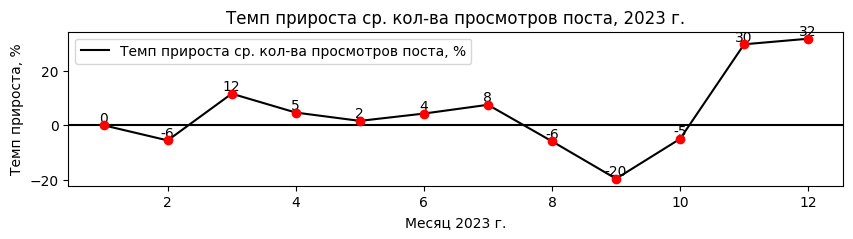

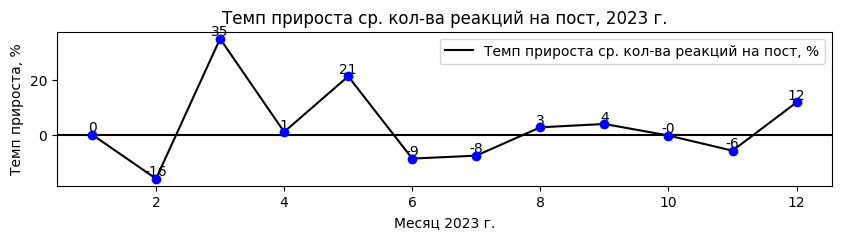

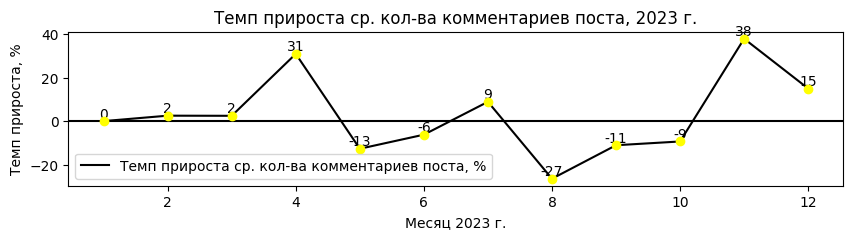

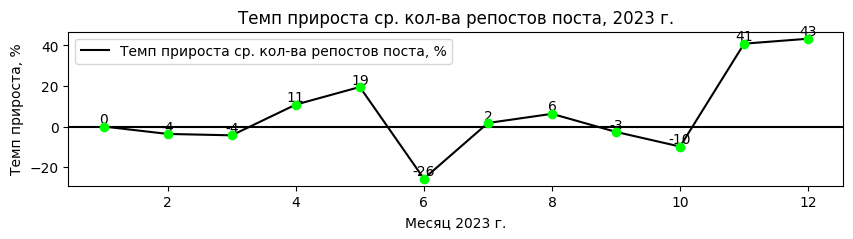

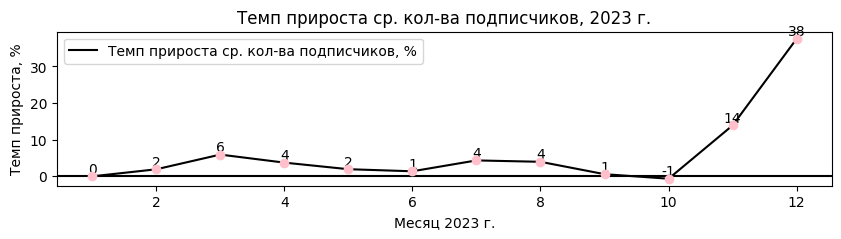

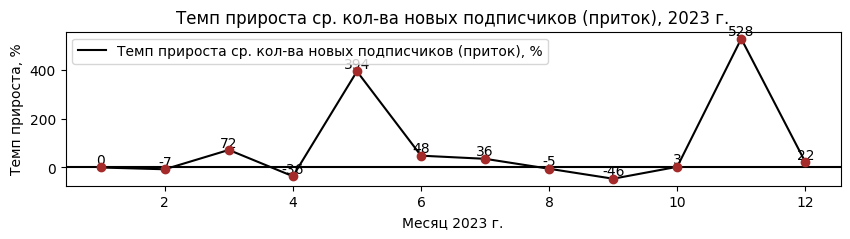

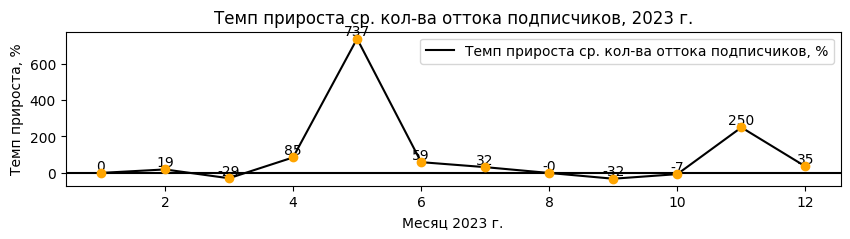

In [ ]:
list_metrics = [
                'reach_post_%',
                'avg_reactions_%',
                'avg_comments_%',
                'avg_forwarded_%',
                'avg_subscribers_all_%',
                'avg_subscribers_day_%',
                'avg_unsubscribed_day_%'
]
color_plot = ['red', 'blue', 'yellow', 'lime', 'pink', 'brown', 'orange']
title = [
    'ср. кол-ва просмотров поста',
    'ср. кол-ва реакций на пост',
    'ср. кол-ва комментариев поста',
    'ср. кол-ва репостов поста',
    'ср. кол-ва подписчиков',
    'ср. кол-ва новых подписчиков (приток)',
    'ср. кол-ва оттока подписчиков'
    ]
for i in range(len(list_metrics)):
    x_values = posts_metric_month['month_2023']
    y_values = posts_metric_month[list_metrics[i]]
    fig, ax = plt.subplots(figsize=(10, 2))
    ax.plot(
            x_values,
            y_values,
            color='black',
            label=f'Темп прироста {title[i]}, %')
    for j, x in enumerate(x_values):
        ax.text(x, y_values[j], f'{y_values[j]:.0f}', ha='center', va='bottom', color='black')
        ax.scatter(x, y_values[j], color=color_plot[i], zorder=5)
    plt.axhline(y = 0, color = 'black')
    ax.grid(False)
    plt.legend(loc='best')
    plt.title(f'Темп прироста {title[i]}, 2023 г.')
    plt.xlabel('Месяц 2023 г.')
    plt.ylabel('Темп прироста, %');

______________
______________
**Промежуточные выводы:

Темпы прироста хорошо показывают скорость изменения и направление изменения того или иного показателя.

Их можно использовать для поиска зон роста или узких мест.

Еще чем хороши относительные показатели, их можно сравнивать друг с другом.

Какое узкое место вижу я?

До ноября 2023 г. у ТГК был очень низкий темп прироста новых подписчиков. Стояли на месте и показатели количества реакций на пост и количества комментариев. Единственный прорыв, который случился - это запуск бота, который привел многочисленных новых подписчиков, которые также быстро стали отписываться от канала.

Бот может привлечь аудиторию. но не может ее удержать.

Нужен более яркий контент. Одник фоток и анонсов аудитории мало. ТГ не Ютуб и не тик-ток, в ТГ читают, следовательно, нужно больше писать и создавать больше собственного контента.
_____________
_____________

### **3.6. Исследование корреляции характеристик и метрик постов с привлечением новых пользователей в канал Кинопоиска (основной раздел)**

In [ ]:
# Создадим матрицу корреляций метрик постов
corr_matrix = posts_metric[['reach_post', 'forwarded', 'reactions','comments', 'subscribers_day', 'er_post', 'err_post']].corr()
corr_matrix

,reach_post,forwarded,reactions,comments,subscribers_day,er_post,err_post
reach_post,1.00000,0.26685,0.13298,0.10280,0.46768,0.68896,-0.03025
forwarded,0.26685,1.00000,0.37304,0.10847,0.16560,0.15034,0.53710
reactions,0.13298,0.37304,1.00000,0.16462,0.01921,0.09607,0.92518
comments,0.10280,0.10847,0.16462,1.00000,-0.00525,0.11537,0.24790
subscribers_day,0.46768,0.16560,0.01921,-0.00525,1.00000,-0.18001,-0.05945
er_post,0.68896,0.15034,0.09607,0.11537,-0.18001,1.00000,-0.01022
err_post,-0.03025,0.53710,0.92518,0.24790,-0.05945,-0.01022,1.00000


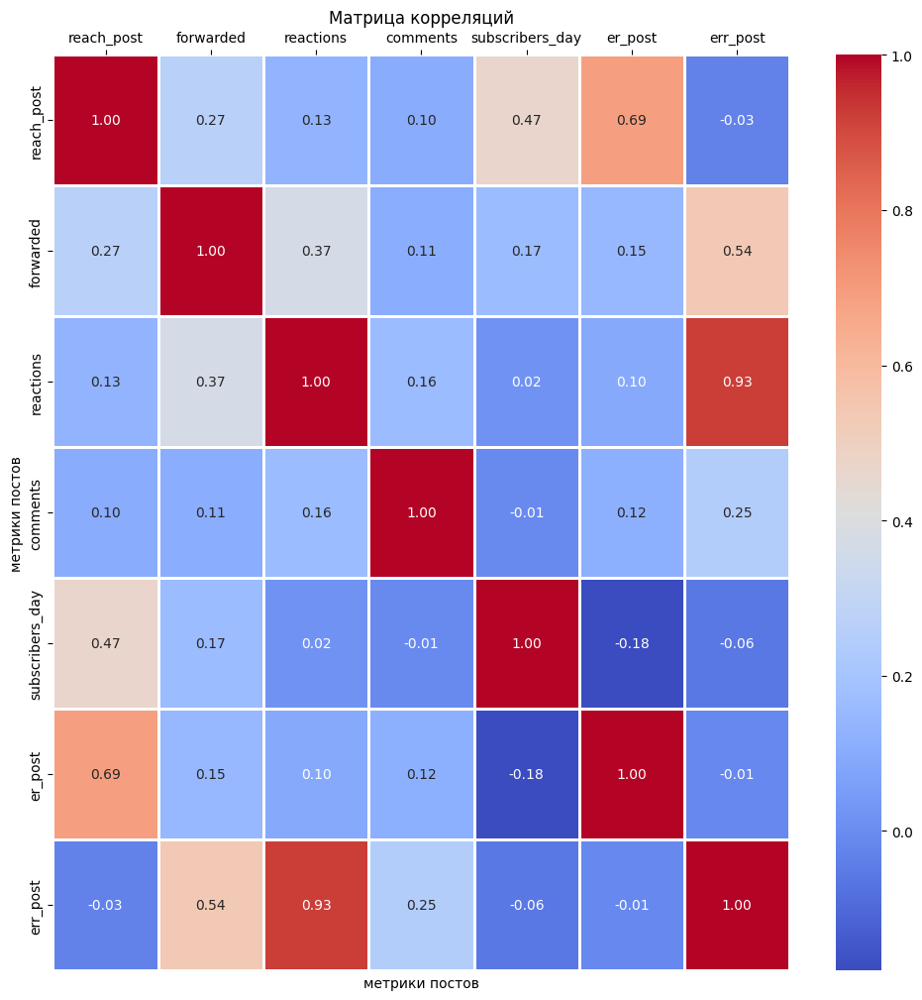

In [ ]:
# Создаем тепловую карту с помощью библиотеки seaborn
plt.figure(figsize=(12, 12))
ax = sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidth=.9)
ax.set(xlabel="метрики постов", ylabel="метрики постов")
ax.xaxis.tick_top()
plt.title('Матрица корреляций')
plt.show()

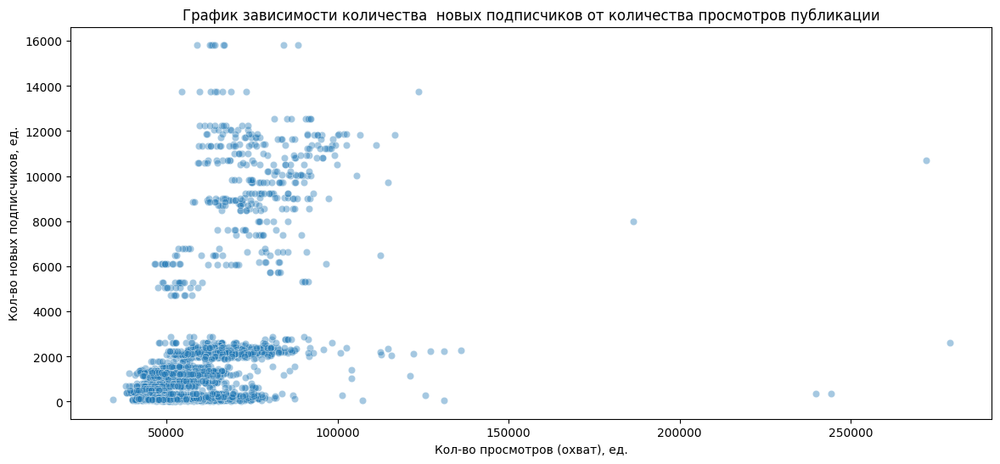

In [ ]:
# Построим график зависимости количества новых подписчиков от количества просмотров публикации
plt.figure(figsize=(14, 6))
sns.scatterplot(data=posts_metric, x='reach_post', y='subscribers_day', alpha=0.4)
plt.title('График зависимости количества  новых подписчиков от количества просмотров публикации')
plt.xlabel('Кол-во просмотров (охват), ед.')
plt.ylabel('Кол-во новых подписчиков, ед.')
plt.show;

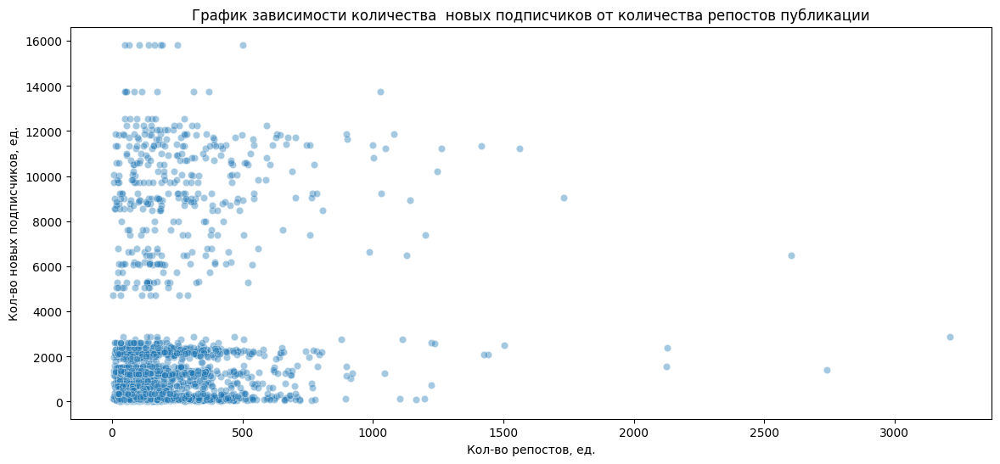

In [ ]:
# Построим график зависимости количества новых подписчиков от количества репостов публикации
plt.figure(figsize=(14, 6))
sns.scatterplot(data=posts_metric, x='forwarded', y='subscribers_day', alpha=0.4)
plt.title('График зависимости количества  новых подписчиков от количества репостов публикации')
plt.xlabel('Кол-во репостов, ед.')
plt.ylabel('Кол-во новых подписчиков, ед.')
plt.show;

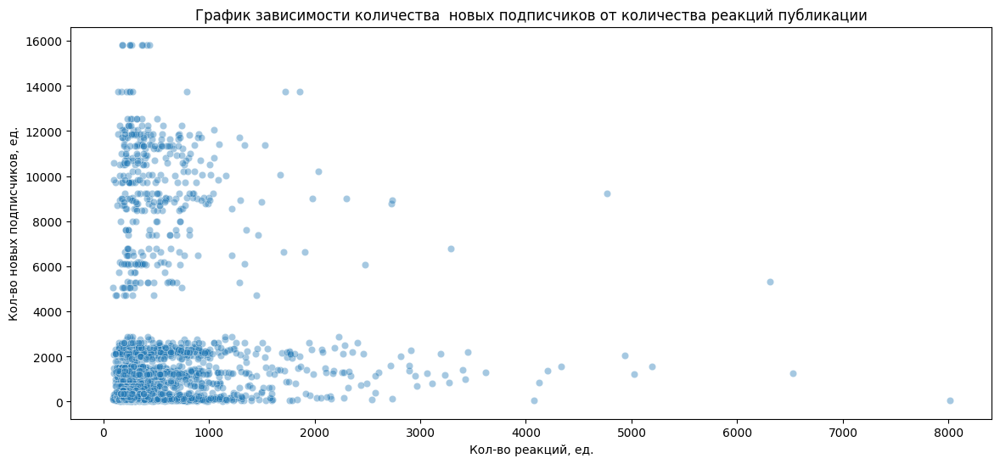

In [ ]:
# Построим график зависимости количества новых подписчиков от количества реакций публикации
plt.figure(figsize=(14, 6))
sns.scatterplot(data=posts_metric, x='reactions', y='subscribers_day', alpha=0.4)
plt.title('График зависимости количества  новых подписчиков от количества реакций публикации')
plt.xlabel('Кол-во реакций, ед.')
plt.ylabel('Кол-во новых подписчиков, ед.')
plt.show;

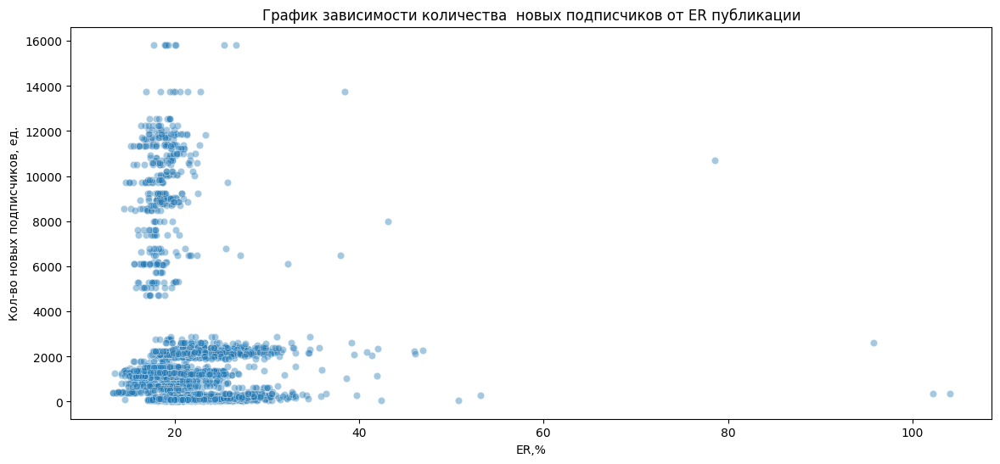

In [ ]:
# Построим график зависимости количества новых подписчиков от ER публикации
plt.figure(figsize=(14, 6))
sns.scatterplot(data=posts_metric, x='er_post', y='subscribers_day', alpha=0.4)
plt.title('График зависимости количества  новых подписчиков от ER публикации')
plt.xlabel('ER,%')
plt.ylabel('Кол-во новых подписчиков, ед.')
plt.show;

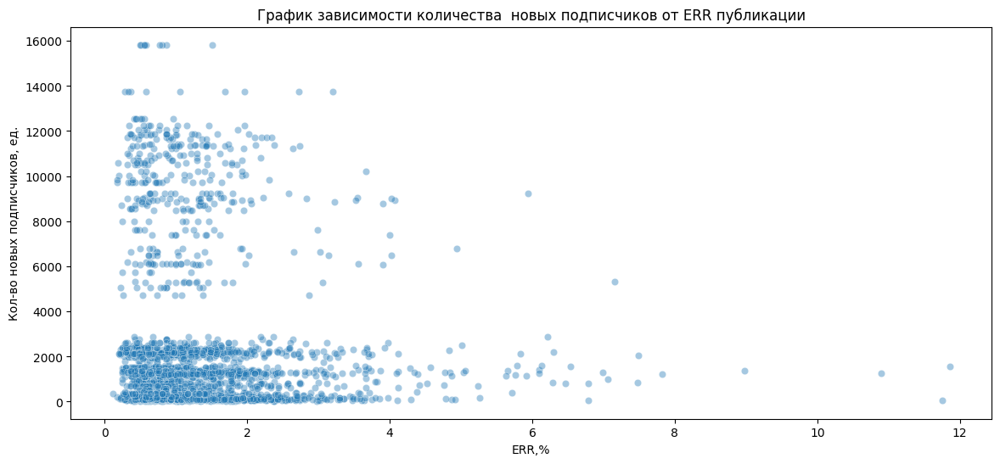

In [ ]:
# Построим график зависимости количества новых подписчиков от ERR публикации
plt.figure(figsize=(14, 6))
sns.scatterplot(data=posts_metric, x='err_post', y='subscribers_day', alpha=0.4)
plt.title('График зависимости количества  новых подписчиков от ERR публикации')
plt.xlabel('ERR,%')
plt.ylabel('Кол-во новых подписчиков, ед.')
plt.show;

___________
__________
**Промежуточный вывод:**
- выявлена слабая положительная корреляция между привлечением новых подписчиков и количеством просмотров поста (охватом) - 0.47.

Однако в целом я не искала бы здесь взаимосвязей.

ТГК КиноПоиск ориентирован на любителей кино и сериалов, подписчиков интернет-кинотеатра, которые хотели бы от ТГК:
- получить ориентир что посмотреть сегодня, завтра, в пятницу;
- почитать о новинках кино/сериалах;
- почитать о звездах;
- развлечься;
- посмотреть красивые картинки.

Метрики нужно использовать для изменения контента под запросы аудитории и оценки работы коллектива ТГК.

Прямые корреляции - это игры разума, далеко не все имеет линейные зависимости.
__________
__________

##**4. Общие выводы по проекту (итоговый информационный раздел-мнение)**

###**4.1. Предмет и цель анализа**

**Предмет анализа:**

Телеграм канал КиноПоиск(@kinopoisk)(ТГК КиноПоиск)

**Категория канала:**

Фильмы & Сериалы

**Количество подписчиков:**

603 049 чел.

**Цель канала:**

- нарастить аудиторию до 10% от аудитории Telegram;
- создать комьюнити любителей кино и сериалов

**Цель анализа:**

- выявить наиболее эффективные и точные метрики для еженедельного/ежемесячного анализа работы;
- определить метрики и KPI для оценки деятельности ТГК.

**Период анализа:**

01.01.2022 - 31.12.2023 гг.

**Данные:**


 - информация о подписчиках канала и отписках;


 - общая информация о подписчиках канала в разбивке по дням
  
 - сведения о постах в телеграм канале Кинопоиска

 - текстовые комментарии к постам
  
 - данные за 3 месяца о телеграм каналах и группах, которые репостили посты Кинопоиска, либо упоминали Кинопоиск в своих постах

**Источник данных:**

- ТГК КиноПоиск;
- tgstat.com

###**4.2. Саммори выводов по разделам проекта:**

**Типы публикаций:**

- на канале 4 типа публикаций:
   - MessageMediaPhoto;
   - MessageMediaWebPage;
   - MessageMediaDocument;
   - only_text;
- самый распространенный тип постов:
     - 2022 г. - MessageMediaPhoto - 54%;
     - 2023 г. - MessageMediaWebPage - 48%;
- лидер по кол-ву просмотров, откликов и реакций:
     - 2022 г. - тип поста only_text;
     - 2023 г. - тип поста MessageMediaDocument

Аудитория ТГК Кинопоиск любит читать и активно реагирует (в том числе репостит!) на MessageMediaDocument и only_text...неожиданное поведение для киноманов.

Авторы ТГК Кинопоиск наращивают долю MessageMediaWebPage

**Темы публикаций:**

- выявлено 27 рубрик (часть рубрик повторются год от года, меняя год в своем названии);
- рубрики - это скорее задел на долгосрочную перспективу, в настоящее время 95% постов вне рубрик;
- самая регулярная рубрика - коротыш.
- лидером по кол-ву просмотров стала рубрика "Дежурный по КиноПоиску"
- выявлено 65 тем;
- деление на темы условно, можно использовать 3 способа определить тему:
  - в первом обзаце повторяющаяся от поста к посту фраза - название темы,
  - повторяющееся от поста к посту слово - ссылка на текст основной большой статьи:
  - собственно тема статьи - о чем она, способ определения - ключевые слова текста
- 25% постов остались с темой - заглушкой "Прочие";

Идея с рубриками и четким выделением темы поста в его теле - удачное решение.

Приемущества:

   - постоянная аудитория будет авансом благосклонно реагировать на новые публикации по заинтересовавшей теме/рубрике;
   - тема/рубрика существенно экономит время подписчиков при просмотре контента и явлюяется хорошим гидом по ТГК;
   - по темам/рубрикам проще искать посты в ТГК.

**Объем текста:**
- приобладают посты с количеством симолов до 250 знаков (37 слов) - 50% от общего кол-ва постов;
- посты до 400 символов (58 слов) занимают 75% от общего количества постов;
- между количеством символов в публикации и количеством просмотров/реакций/комментариев/репостов есть слабовыраженная корреляция.

Визуальный анализ ТГК показал, что посты часто имеют ссылки на более объемные посты, опубликованные за пределами ТГК КиноПоиск. Практически все посты сопровождаются "сочными" картинками.

На мой взгляд, выбрана очень удачная стратегия подачи информации. Подписчикам есть на что посмотреть и есть что почитать, было бы желание.

**Эмодзи:**

- только 23% постов имеют в тексте эмодзи;
- более 2-х эмодзи имеют только 8% постов;
- посты с эмодзи имеют большее количетво реакций подписчиков, чем посты без эмодзи.

Авторы ТГК КиноПоиск редко используют эмодзи, поэтому сложно судить о статистической значимости вывода: наличие эмодзи в тексте приводит к росту вовлеченности подписчиков.

Однако, есть доказанный факт: человек склонен отзеркаливать эмоции собеседника...возможно наличие эмодзи в тексте поста может бессознательно стимулировать подписчика оставить под постом свою реакцию.

Можно проверить эту гипотезу, увеличив количество постов с эмодзи в тексте поста.

**Ссылки:**

- 65% постов имеют в тексте ссылки;
- 48% постов имеют одну ссылку;
-посты со ссылками имеют большее количество реакций подписчиков, чем посты без ссылок.

Авторы ТГК КиноПоиск часто используют ссылки на другие интернет-ресурсы в тексте поста, что говорит о заимствовании контента.

**Знаки препинания:**
- только 3% постов не имеют в тексте знаков препинания;
- 42% постов имеют 1-5 знаков препинания;
- наибольшее количество реакций имеют посты с 6-10 знаками препинания.

Судя по количеству знаков препинания в постах преобладают простые предложения. Длина поста 5-10 коротких предложений.

**Семантический анализ текта поста:**

-Облако слов говорит о том, что самая популярная тема ТГК - фильмы и сериалы.
-В топ-5 слов, постоянно повторяющихся в постах:
   - существительные:
       - фильм,
       - сериал,
       - роль,
       - режиссёр,
       - кинопоиск;
   - прилагательные:
       - новый,
       - главный,
       - первый,
       - последний,
       - хороший;
   - глаголы:
       - подписаться,
       - выйти,
       - стать,
       - рассказать,
       - показать.

Авторам текстов следует внимательнее изучить "облако слов", в нем присутствуют часто повторяемые стоп-слова. Тексты постов короткие, если вспомнить методику Ильяхова, то удаление лишних стоп-слов, позволит добавить в тест смысл...не увеличивая при этом количества символов.

**Семантический анализ текта комментариев:**

- Облако слов говорит о том, что (!!!) самая актуальная для подписчиков тема ТГК - фильмы и сериалы (почему нас это не удивляет;).
- топ-5 слов, повторяющихся в комментариях:

   - существительные:
       - фильм,
       - картинка,
       - сериал/серия/сезон,
       - человек,
       - кино;
   - прилагательные:
       - хороший,
       - новый,
       - первый,
       - интересный,
       - согласный;
   - глаголы:
       - смотреть/посмотреть,
       - знать,
       - хотеть,
       - сделать,
       - мочь.

Комментарии пользователей созвучны с постами ТГК, т.е.посты вызывают ожидаемую реакцию - ТГК рассказывает о фильмах/сериалах, а аудитория смотрит их или хочет посмотрть.

**Анализ эмодзи:**

- топ-3 эмодзи по общему количеству (за 2022-2023 гг.):
   - 👍 824808;
   - ❤ 673822;
   - 👎 230973;
- всего для выражения эмоций подписчики ТГК КиноПоиск используют 60 эмодзи;
- корреляция между количеством просмотров и количеством положительных/отрицательных эмодзи - положительная слабовыраженная (0.33/0.14 соответственно).

!!!Отрицательные эмодзи - это такие же активности подписчиков как и положительные, они связаны не с ТГК Кинопоиск, а с содержанием конкретного поста.

Наличие противоположных эмоций, вызванных постом, повышают активность пользователей, они начинают активнее общаться между собой в комментариях, увеличивая показатель вовлеченности аудитории.

**Метрики эффективности каждого поста:**

**1.**
- **среднее количество постов в день:**
     - 2022 г. - 12;
     - 2023 г. - 7;
- количество постов в 2023 г. уменьшилось по сравнению с 2023 гг.
- сократился разброс количества постов, т.е. ТГК определился с оптимальным/достаточным количеством постов в день.
- в субботу/воскресение авторы ТГК "отдыхают": количество постов почти в 2 раза меньше, чем на неделе.

Интерес аудитории ТГК подддерживает постоянно в течение дня:
раз в 1-2 часа выходит новая публикация.

Авторам ТГК можно выстовить kpi -количество постов за месяц и отслеживать его выполнение.

**2.**

- **показатель общее количество просмотров** впечатляет, но мало что объясняет (показатель не учитывает ни изменения кол-ва постов, ни изменения количества подписчиков):
- среднее за 2022-2023 гг. кол-во просмотров за месяц - 13 602 562 просмотров в месяц;
- ярко враженной тенденции в общем кол-ве просмотров за месяц нет, уже 2 года этот показатель находится в диапозоне - от 9 до 18 млн. шт в месяц;

**3.**
- **среднедневное количество просмотров одного поста за месяц** (этот показатель уже учитывает динамику изменения количества постов):
- среднее значение показателя за 2022-2023 гг - 49 357 просмотров;
- в 2023 г. показатель выше, чем в 2022 г.

Из-за низкой информативности не будем рекомендовать показатели общее количество просмотров на месяц и среднедневное количество просмотров за месяц в качестве KPI ТГК КиноПоиск.

**4.**

**Общее количество подписчиков:**

- анализ количества подписчиков проводился за 2023 г.;
- общая динамика количества подписчиков - растущая;
- на начало 2023 г. аудитория составляла - 226,447 чел.;
- на конец 2023 г. аудитория составляла - 513,900 чел. (рост в 2.2 раза);
- резкий рост количества подписчиков пришелся на ноябрь-декабрь 2023 г.

Основной причиной резкого роста количества подписчиков является запуск бота, создающего персональный киноколлаж в обмен на подписку.

Бот привел новых подписчиков, но при этом существенно увеличилась дневная амплитуда колебаний оттока/притока.

Креатив творит чудеса! А качественный контент позволяет удерживать подписчикав и формировать сообщество кинолюбителей вокруг ТГК КиноПоиск. Так ли это? Проверим!

**5.**

**Приток новых подписчиков:**

- наименьшее кол-во новых подписчиков было привлечено в феврале 2023 г.- 5 954 чел (0.73% от общего притока за год);
- наибольшее кол-во новых подписчиков было привлечено в декабре 2023 г.- 279 365 чел (34.37% от общего притока за год);
- всего в 2023 г. было привлчено 812 907 новых подписчиков (без учета оттока);

наибольшее количество новых подписчиков подписывалось на канал в пятницу, наименьшее - в понедельник. Эту информацию можно учитывать при запуске кампаний по привлечению подписчиков.

**6.**

**Отток подписчиков:**

- наименьший отток подписчиков был в марте 2023 г.- 1 695 чел (0.33% от общего оттока за год);
- наибольший отток подписчиков был в декабре 2023 г.- 158 279 чел (30.80% от общего оттока за год);
- всего в 2023 г. отток составил 513 938 подписчиков (без учета притока);

Наибольший отток подписчиков происходит в четверг, наименьший - в воскресение.

**7.**

**Охват одного поста**

- среднее кол-во просмотров (охват) одного поста - 60 950;
- минимальное кол-во просмотров - 34 256 (февральский пост-"Горшок и князь" постер к сериалу "Король и шут");
- максимальное кол-во просмотров - 278 962 (ноябрьский пост - 100 великих фильма 21 века);

Показатель охват одного поста - очень важный показатель, его можно и нужно отслеживать регулярно: ежедневно, еженедельно, ежемесячно.

Он позволяет количественно измерять интерес аудитории канала к контенту и своевременно реагировать на запросы аудитории.

Показатель может быть использован в качестве KPI сотрудников ТГК.


**8.**

**ER**

- ER одного поста - это % от общего количества подписчиков на день публикации поста, которые просмотрели данный пост.
- средний показатель ER поста в 2023 г. - 21.68%;
- минимальный показатель ER поста в 2023 г. - 13.27% (октябрьский пост - пост о финальном сезоне «Короны»);
- максимальный показатель - 104.06% (февральский пост - прямой эфир со звездами сериала Фандорин и Азазель).

Показатель ER в отличие от показателя охвата, учитывает одновременно количество просмотров и общее количество подписчиков ТГК.

Особенно интересно изучать показатель ER за ноябрь-декабрь 2023 г. - количество подписчиков выросло в разы, а показатель ER был низким по сравнению с другими месяцами.

Аудитория, подписавшаяся на канал, не заинтересована в просмотре его контента...

Чтобы удержать новую аудиторию, нужно внимательно следить за показателем охват одного поста, изучать реакции на отдельные посты и менять контент с учетом интересов вновь приобретенной аудитории.

Однако смена контента может не понравиться постоянной аудитории.

Нужно искать баланс.

**9.**

**ERR**

ERR - это количество реакций(комментариев, репостов, эмодзи), которые приходятся на один просмотр поста, выраженное в %

- средний показатель ERR поста в 2023 г. - 1.28%;
- минимальный показатель ERR поста в 2023 г. - 0.11% (февральский пост с интервью звезд сериала «Фандорин. Азазель»...он набрал рекордное кол-во просмотров...а вот реакций - нет);
- максимальный показатель - 11.86% (ноябрьский пост на смерть Мэттью Перри);

Показатель ERR в отличие от показателя ER, не учитывает общее количество подписчиков ТГК. ERR показывает степень вовлеченночти подписчиков, просмотревших пост.

###**4.3. Предложения по KPI для оценки работы ТГК КиноПоиск**

________________
_________________
**В качестве KPI предлагаем использовать следующие метрики:**

1.Метрики эффективности на пост:

1.1 Вовлеченность на пост (ER) по взаимодействиям.

1.2. Вовлеченность на пост (ERR) по просмотрам.

1.3. Охват поста.

2. Метрики эффективности за период(день/неделя/месяц):

2.1. Общее количество подписчиков на канале

2.2. Количество новых подписчиков

2.3. Количество оттока подписчиков

2.4. Конверсионная скорость.
_____________
_____________

###**4.4. Субъективная оценка и предложения по развитию ТГК КиноПоиск**

___________
___________
**Персональное мнение о ТГК КиноПоиск:**

- ТГК Кинопоиск нашел свою нишу в ТГ и имеет растущую аудиторию;
- бот отработал на хайпе вокруг chat-gpt и его аналогов, волна интереса быстро спадет. Аудитория, привлеченная ботом - временная;
- вовлеченность подписчиков сравнительно низкая;
- контент часто заимствуется, в том числе из других источников ГК КиноПоиск;
- для достижения основной цели ТГК - увеличения числа постоянных подписчиков и создания комьюнити кинолюбителей -  необходим рост показателей вовлеченности;
- для роста показателей вовлеченности нужно четко представлять кто является целевой аудиторией, из каких групп она состоит и работать над вовлеченностью каждой группы;
- интерес каждой группы целевой аудитории должен поддерживаться на постоянной основе, т.е. в течение недели должен печататься контент, интересный каждой из групп.

**Возможности:**

Успехом у аудитории (по количеству реакций) ТГК пользуются:
-  встречи со звездами, реалити шоу, викторины, розыгрыши и т.п.
-  авторские статьи критиков на премьерные показы в онлайн-кинотеатре КиноПоиск;
- топ фильмов/сериалов по жанрам, которые можно посмотреть в онлайн-кинотеатре КиноПоиск;
- новости киноиндустрии и события в жизни звезд.

**Предложения:**

- привлечь к работе ТГК дизайнера, который бы делал ОРИГИНАЛЬНЫЕ шаржи и постеры к премьерным показам в онлайн-кинотеатре КиноПоиск;
- открыть рубрику, где российская кинозвезда делилась бы своим мнением о премьерах в онлайн-кинотеатре КиноПоиск/событиях в мире киноиндустрии;
- публиковать посты критиков, имеющих противоположное мнение на фильмы/сериалы(или симулировать их существование), чтобы вызвать у аудитории желание обсуждать пост;
- ежедневно/еженедельно запускать опросы понравилась/непонравилась или смотрел/не смотрел новая/новую серия/серию сериала.
- ввести голосование "звезда российского кинопроката" (лучший исполнитель мужской/женской роли) за месяц/год.
- организовать вручение по итогам года награды Кинопоска по номинациям лучший фильм/мультфильм/сериал - российский аналог Оскара для фильмов онлайн-кинотеатра.
- для привлечения постоянной аудитории и создания комьюнити киноманов, нужно на постоянной основе анализировать контент ТГК на предмет вовлеченности аудитории и гибко менять его (контент).
- четко обозначить границу. отличающую ТГК КиноПоиск от других проектов Кинопоиска, увеличить долю "оригинального" контента.

_____________
_______________